In [1]:
# Python ≥3.5 is required
import sys
assert sys.version_info >= (3, 5)

# Scikit-Learn ≥0.20 is required
import sklearn
assert sklearn.__version__ >= "0.20"

# TensorFlow ≥2.0 is required
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import load_model
assert tf.__version__ >= "2.0"

# To plot pretty figures
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)

# Common imports
import numpy as np
import os
import time
from collections import deque
import joblib
import shutil
import subprocess
import glob

# Python path for running in parallel (conda env py3ml)
pythonpath = '/home/viluiz/anaconda3/envs/py3ml/bin/python'
assert os.path.exists(pythonpath)

# Load and prepare data

In [2]:
# -----------------------------------------
# Load data and GAN model
# -----------------------------------------

# Mesh size
nl = 10
nc = 10

#Load PCA and Scaler
pca_compress = joblib.load("pca_compress_15.pkl") 
scaler = joblib.load("scaler.pkl")

# Train data
X_train_compressed = np.loadtxt('X_train_pca.csv', delimiter=',') 
X_train_1D = np.loadtxt('X_train_1D.csv', delimiter=',') 
times  = np.loadtxt('times.csv', delimiter=',') 
R0s_train  = np.loadtxt('R0s.csv', delimiter=',') 
with open('groups.txt') as f:
    groups = [g.strip() for g in f.readlines()]

# Test data
X_test_compressed = np.loadtxt('X_test_pca.csv', delimiter=',') 
X_test_1D = np.loadtxt('X_test_1D.csv', delimiter=',') 
R0s_test  = np.loadtxt('R0s_test.csv', delimiter=',') 

# Test uq data
X_testuq_compressed = np.loadtxt('X_testuq_pca.csv', delimiter=',') 
X_testuq_1D = np.loadtxt('X_testuq_1D.csv', delimiter=',') 
R0s_testuq  = np.loadtxt('R0s_testuq.csv', delimiter=',') 

# GAN model
#generator, discriminator = load_model('gan-tfex-DCGAN-5kernel.h5').layers
#latent_size = 100 # size of the latent space (input of the generator)

(38520, 10, 17)
(38520, 10, 17)
(192600, 10, 17)


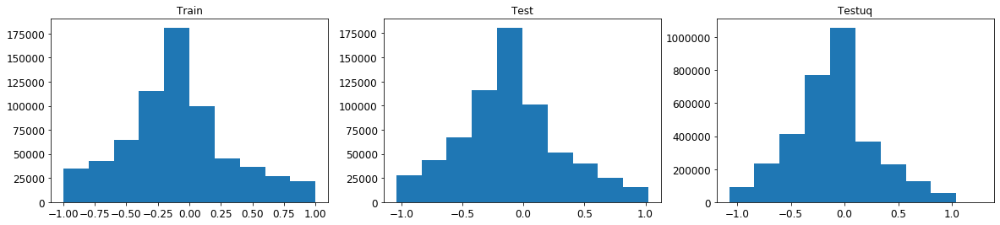

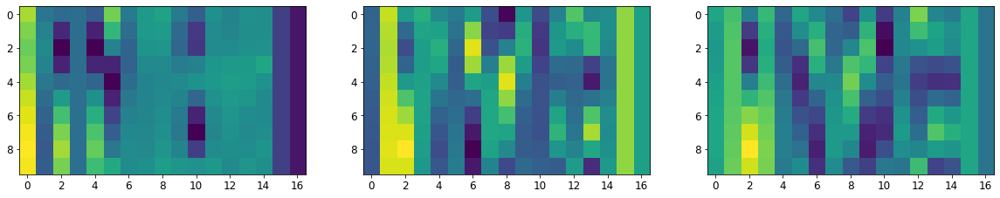

In [3]:
# -----------------------------------------
# Prepare data
# -----------------------------------------

pca_size = X_test_compressed.shape[1] # number of POD coeffients

X_train_R0s = R0s_train.repeat(len(times), axis=0) 
X_test_R0s = R0s_test.repeat(len(times), axis=0)
X_testuq_R0s = R0s_testuq.repeat(len(times), axis=0)

X_train_compressedplus = np.concatenate((X_train_compressed, X_train_R0s), axis=1) 
X_test_compressedplus = np.concatenate((X_test_compressed, X_test_R0s), axis=1) 
X_testuq_compressedplus = np.concatenate((X_testuq_compressed, X_testuq_R0s), axis=1) 
codings_size = X_test_compressedplus.shape[1] # number of POD coeffients + the number of model parameters

X_train_scaled = scaler.transform(X_train_compressedplus)
X_test_scaled = scaler.transform(X_test_compressedplus)
X_testuq_scaled = scaler.transform(X_testuq_compressedplus)

fig, ax = plt.subplots(1,3, figsize=[20,4])
ax[0].hist(X_train_scaled.flatten())
ax[0].set_title('Train')
ax[1].hist(X_test_scaled.flatten())
ax[1].set_title('Test')
ax[2].hist(X_testuq_scaled.flatten())
ax[2].set_title('Testuq')

# Concatenate successive time steps  
def concat_timesteps(X_train, ntimes, step, times):
    X_train_concat = []
    for j in range(len(X_train)//len(times)):
        for i in range(j*len(times), j*len(times)+(len(times)-ntimes*step)):
            X_train_concat.append(X_train[i:i+ntimes*step:step])
    return np.array(X_train_concat)

ntimes = 10 # Consecutive times for the GAN
step = 2 # step between times

X_train_concat = concat_timesteps(X_train_scaled, ntimes, step, times)
X_train_concat_flatten = X_train_concat.reshape(X_train_concat.shape[0], codings_size*ntimes )

X_test_concat = concat_timesteps(X_test_scaled, ntimes, step, times)
X_test_concat_flatten = X_test_concat.reshape(X_test_concat.shape[0], codings_size*ntimes )

X_testuq_concat = concat_timesteps(X_testuq_scaled, ntimes, step, times)
X_testuq_concat_flatten = X_testuq_concat.reshape(X_testuq_concat.shape[0], codings_size*ntimes )

fig, ax1 = plt.subplots(1,3, figsize=[20,4])
print(X_train_concat.shape)
ax1[0].imshow(X_train_concat[10000, :, :])
print(X_test_concat.shape)
ax1[1].imshow(X_test_concat[10000, :, :])
print(X_testuq_concat.shape)
ax1[2].imshow(X_testuq_concat[10000, :, :])
plt.show()

Text(0.5, 1.0, 'R0 Mobile')

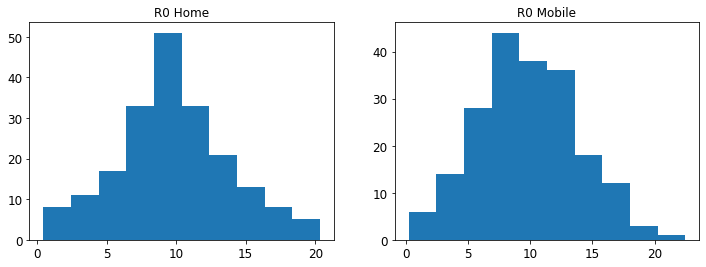

In [4]:
fig, ax = plt.subplots(1,2, figsize=[12,4])
ax[0].hist(R0s_testuq[:,0])
ax[0].set_title('R0 Home')
ax[1].hist(R0s_testuq[:,1])
ax[1].set_title('R0 Mobile')

## Generate observed 

X_obs.shape (259, 8, 10, 10)
R0s_obs [ 7.72820859 17.37615382]
obs_points.shape:  (140, 4)


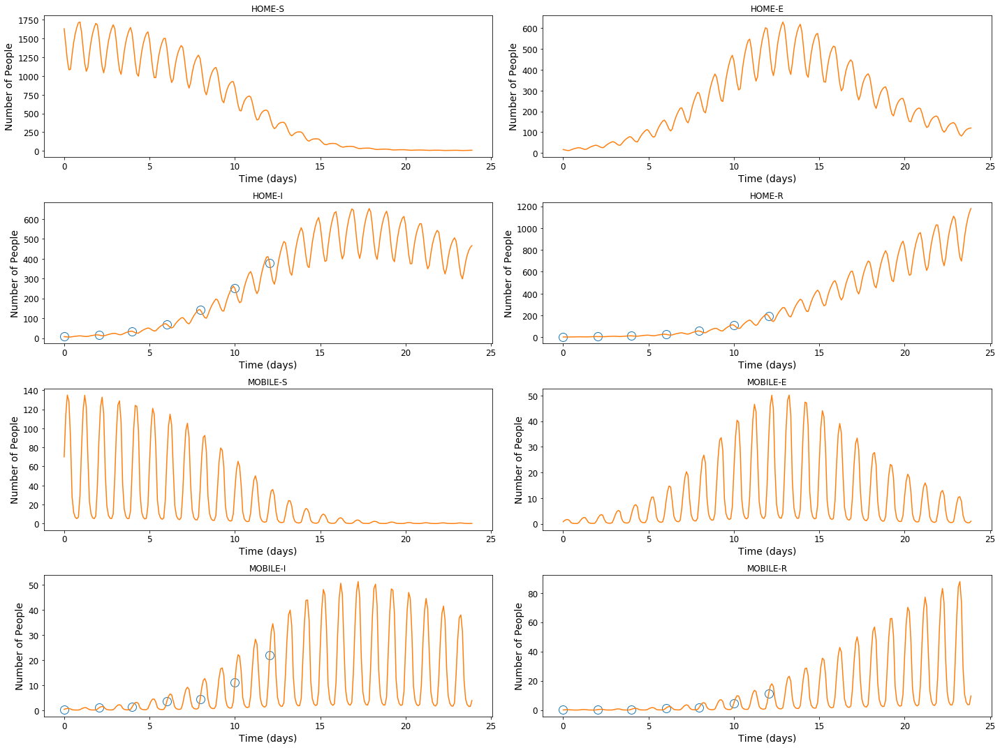

In [5]:
# -----------------------------------------
# Generate observed data
# -----------------------------------------

run_obs = 2 # from the test dataset
lag = 173 # starting point (in time steps)
length = 250 # length + (ntimes-1) -> len of X_obs (in forward steps = 2 time steps) 
seed = 0
noise = 0.00

# Times of X_obs to be considered for data assimilation
obs_times = list(map(int,map(round,np.arange(0,length+(ntimes-1)-120,21.6))))


# grid points: used to populate the obs_points
#[[group, line, column], 
# [group, line, column], 
# ...                 ]
grid_points = [[2,0,4],[6,0,4],[3,0,4],[7,0,4],
               [2,9,4],[6,9,4],[3,9,4],[7,9,4],
               [2,4,4],[6,4,4],[3,4,4],[7,4,4],
               [2,4,0],[6,4,0],[3,4,0],[7,4,0],
               [2,4,9],[6,4,9],[3,4,9],[7,4,9],
               #[0,0,4],[1,0,4],[2,0,4],[3,0,4],[4,0,4],[5,0,4],[6,0,4],[7,0,4],
               #[0,9,4],[1,9,4],[2,9,4],[3,9,4],[4,9,4],[5,9,4],[6,9,4],[7,9,4],
               #[0,4,4],[1,4,4],[2,4,4],[3,4,4],[4,4,4],[5,4,4],[6,4,4],[7,4,4],
               #[0,4,0],[1,4,0],[2,4,0],[3,4,0],[4,4,0],[5,4,0],[6,4,0],[7,4,0],
               #[0,4,9],[1,4,9],[2,4,9],[3,4,9],[4,4,9],[5,4,9],[6,4,9],[7,4,9],
               ]

def obs_data(run_obs, lag, length, seed, noise, obs_times, grid_points, verbose=0):

    nobs = len(times)*run_obs + lag

    # Get the observed data
    X_obs = X_test_1D[nobs:nobs+((ntimes-1)+length)*step:step,:].reshape(-1,len(groups),nl,nc)
    R0s_obs = R0s_test[run_obs]

    # Add noise
    np.random.seed(seed)
    X_obs = X_obs + np.random.standard_normal(X_obs.shape)*noise*X_obs

    # Print values
    if verbose>0: 
        print('X_obs.shape', X_obs.shape)
        print('R0s_obs', R0s_obs)

    # obs_points:
    #[[time, group, line, column], 
    # [time, group, line, column], 
    # ...                       ]
    obs_points = []
    for p in grid_points:
        for t in obs_times:
            obs_points.append([t]+p)
    obs_points = np.array(obs_points)
    if verbose>0:
        print('obs_points.shape: ', obs_points.shape)
    
    return X_obs, R0s_obs, obs_points

X_obs, R0s_obs, obs_points = obs_data(run_obs, lag, length, seed, noise, obs_times, grid_points, verbose=1)

fig, X_ax = plt.subplots(4,2, figsize=[20,15])
for i, group in enumerate(groups):
    if [i, 0, 4] in grid_points:
        X_ax.flatten()[i].plot(np.array(obs_times)*8000/86400, X_obs[obs_times][:, i, 0, 4], 'o', markevery=1, fillstyle='none', markersize = 12, label='Observed data')
    else:
        X_ax.flatten()[i].plot([],[])
    X_ax.flatten()[i].plot(np.array(range(len(X_obs)))*8000/86400, X_obs[:][:, i, 0, 4], '-', markevery=1, fillstyle='none', markersize = 12, label='Observed data')        
    X_ax.flatten()[i].set_title(group)
    X_ax.flatten()[i].set_xlabel('Time (days)')
    X_ax.flatten()[i].set_ylabel('Number of People')
plt.tight_layout()
plt.show()

# Run Markov chain Monte Carlo

In [6]:
nparalel = 40
samples = 120000
ini = 12040
processes = []
dirnames = []
logfile = []
n_testuq = int(len(X_testuq_concat)/(len(times)- ntimes*step))

# Generate observed data 
X_obs, R0s_obs, obs_points = obs_data(run_obs, lag, length, 0, 0.00, obs_times, grid_points)

pyfile = 'predgan.py'
rundir = 'runmcmc_1/'

if os.path.exists(rundir):
    print('\n*** WARNING: Directory already exists: ./' + rundir)
    print('\n*** WARNING: All data assimilations will be considered finished!')
    print('\nContinuing execution!')
else:
#   os.mkdir(rundir)
    
    j = 0
    for i in range(ini,samples):
        
        # Create folder and copy files
        dirnames.append( rundir+'mcmc'+str(i)+'/')
        if os.path.exists(dirnames[-1]):
            print('directory already exists: ' + os.path.abspath(dirnames[-1]))
            continue 
        #print('Creating folder '+dirnames[-1]+' and copying files... ', end='')
        os.mkdir(dirnames[-1])
        shutil.copy(pyfile, dirnames[-1])
        #print('Done!')         
        
        # Initial condition (run_ini = np.random.randint(0,n_testuq+1))
        run_ini = np.random.randint(0,n_testuq)
        n = (len(times)-ntimes*step)*run_ini + lag
        forward_steps = length
        initial_coding = X_testuq_concat[n]
        
        #Sampling the prior
        mean = 10.0; std = 4.0; cut_off = 0.2
        random_variables = np.random.normal(mean, std, 2)
        random_variables[random_variables<cut_off] = cut_off
        sample = scaler.transform([15*[0]+list(random_variables)])[0,-2:]
        initial_coding[:,-2:] = sample

        #save inputs
        input_data = (initial_coding, X_obs, obs_points,forward_steps) 
        joblib.dump(input_data, dirnames[-1]+'input_data.pkl')         

        # Check for finished jobs and write output to file
        while not len(processes) < nparalel:
            time.sleep(1)
            for i, p in enumerate(processes):
                if p.poll() != None:
                    j += 1
                    print('Run '+str(j)+': '+dirnames[i]+' finished! status:' + str(p.poll()))
                    processes.pop(i)
                    dirnames.pop(i)
                    logfile[i].close()
                    logfile.pop(i)
                    break
        # Run case 
        logfile.append(open(dirnames[-1] + 'run.log','w'))
        processes.append(subprocess.Popen([pythonpath, pyfile], 
                                          cwd=dirnames[-1], 
                                          stdout=logfile[-1], 
                                          stderr=logfile[-1],
                                          close_fds=True))
        print(dirnames[-1]+' running...', sample)       


    #Check for finished jobs and write output to file
    while len(processes) > 0:
        time.sleep(1)
        for i, p in enumerate(processes):
            if p.poll() != None:
                j += 1
                print('Run '+str(j)+': '+dirnames[i]+' finished! status:' + str(p.poll()))
                processes.pop(i)
                dirnames.pop(i)
                logfile[i].close()
                logfile.pop(i)
                break
    print('Finished!')     


*** WARNING: Directory already exists: ./runmcmc_1/

*** WARNING: All data assimilations will be considered finished!

Continuing execution!


# Read output files 

runmcmc_1/mcmc0:              runtime=804    iterations=0   loss=0.000395
runmcmc_1/mcmc1:              runtime=939    iterations=0   loss=0.0369
runmcmc_1/mcmc10:             runtime=699    iterations=0   loss=0.000774
runmcmc_1/mcmc100:            runtime=704    iterations=0   loss=0.00313
runmcmc_1/mcmc1000:           runtime=691    iterations=0   loss=0.00426
runmcmc_1/mcmc10000:          runtime=1061   iterations=0   loss=0.0084
runmcmc_1/mcmc100000:         runtime=1117   iterations=0   loss=0.00201
runmcmc_1/mcmc100001:         runtime=1293   iterations=0   loss=0.0839
runmcmc_1/mcmc100002:         runtime=1084   iterations=0   loss=0.00328
runmcmc_1/mcmc100003:         runtime=1233   iterations=0   loss=0.00154
runmcmc_1/mcmc100004:         runtime=1139   iterations=0   loss=0.0506
runmcmc_1/mcmc100005:         runtime=1067   iterations=0   loss=0.0424
runmcmc_1/mcmc100006:         runtime=1185   iterations=0   loss=0.00409
runmcmc_1/mcmc100007:         runtime=994    iteration

runmcmc_1/mcmc100170:         runtime=1336   iterations=0   loss=0.0426
runmcmc_1/mcmc100171:         runtime=1420   iterations=0   loss=0.00234
runmcmc_1/mcmc100172:         runtime=1285   iterations=0   loss=0.0434
runmcmc_1/mcmc100173:         runtime=1403   iterations=0   loss=0.144
runmcmc_1/mcmc100174:         runtime=961    iterations=0   loss=0.116
runmcmc_1/mcmc100175:         runtime=1083   iterations=0   loss=0.117
runmcmc_1/mcmc100176:         runtime=1335   iterations=0   loss=0.00443
runmcmc_1/mcmc100177:         runtime=879    iterations=0   loss=0.139
runmcmc_1/mcmc100178:         runtime=1370   iterations=0   loss=0.00426
runmcmc_1/mcmc100179:         runtime=986    iterations=0   loss=0.0115
runmcmc_1/mcmc10018:          runtime=890    iterations=0   loss=0.0494
runmcmc_1/mcmc100180:         runtime=962    iterations=0   loss=0.141
runmcmc_1/mcmc100181:         runtime=1243   iterations=0   loss=0.000186
runmcmc_1/mcmc100182:         runtime=1355   iterations=0   loss

runmcmc_1/mcmc100344:         runtime=865    iterations=0   loss=0.066
runmcmc_1/mcmc100345:         runtime=1208   iterations=0   loss=0.00219
runmcmc_1/mcmc100346:         runtime=921    iterations=0   loss=0.113
runmcmc_1/mcmc100347:         runtime=1239   iterations=0   loss=0.131
runmcmc_1/mcmc100348:         runtime=1103   iterations=0   loss=0.00054
runmcmc_1/mcmc100349:         runtime=1038   iterations=0   loss=0.109
runmcmc_1/mcmc10035:          runtime=951    iterations=0   loss=0.00502
runmcmc_1/mcmc100350:         runtime=1056   iterations=0   loss=0.00972
runmcmc_1/mcmc100351:         runtime=797    iterations=0   loss=0.0688
runmcmc_1/mcmc100352:         runtime=1015   iterations=0   loss=0.0218
runmcmc_1/mcmc100353:         runtime=818    iterations=0   loss=0.127
runmcmc_1/mcmc100354:         runtime=1276   iterations=0   loss=0.0599
runmcmc_1/mcmc100355:         runtime=1056   iterations=0   loss=0.00161
runmcmc_1/mcmc100356:         runtime=850    iterations=0   loss

runmcmc_1/mcmc100519:         runtime=898    iterations=0   loss=0.112
runmcmc_1/mcmc10052:          runtime=750    iterations=0   loss=0.011
runmcmc_1/mcmc100520:         runtime=1153   iterations=0   loss=0.00129
runmcmc_1/mcmc100521:         runtime=970    iterations=0   loss=0.112
runmcmc_1/mcmc100522:         runtime=1167   iterations=0   loss=0.145
runmcmc_1/mcmc100523:         runtime=918    iterations=0   loss=0.0223
runmcmc_1/mcmc100524:         runtime=1188   iterations=0   loss=0.0139
runmcmc_1/mcmc100525:         runtime=1286   iterations=0   loss=0.00139
runmcmc_1/mcmc100526:         runtime=1289   iterations=0   loss=0.142
runmcmc_1/mcmc100527:         runtime=1050   iterations=0   loss=0.088
runmcmc_1/mcmc100528:         runtime=1212   iterations=0   loss=0.012
runmcmc_1/mcmc100529:         runtime=912    iterations=0   loss=0.135
runmcmc_1/mcmc10053:          runtime=911    iterations=0   loss=0.0242
runmcmc_1/mcmc100530:         runtime=1025   iterations=0   loss=0.036

runmcmc_1/mcmc100705:         runtime=993    iterations=0   loss=0.0105
runmcmc_1/mcmc100706:         runtime=1091   iterations=0   loss=0.152
runmcmc_1/mcmc100707:         runtime=1119   iterations=0   loss=0.115
runmcmc_1/mcmc100708:         runtime=1094   iterations=0   loss=0.0348
runmcmc_1/mcmc100709:         runtime=1071   iterations=0   loss=0.0157
runmcmc_1/mcmc10071:          runtime=998    iterations=0   loss=0.0272
runmcmc_1/mcmc100710:         runtime=1162   iterations=0   loss=0.00643
runmcmc_1/mcmc100711:         runtime=866    iterations=0   loss=0.0588
runmcmc_1/mcmc100712:         runtime=1206   iterations=0   loss=0.00047
runmcmc_1/mcmc100713:         runtime=1181   iterations=0   loss=0.0397
runmcmc_1/mcmc100714:         runtime=1019   iterations=0   loss=0.0103
runmcmc_1/mcmc100715:         runtime=1004   iterations=0   loss=0.00989
runmcmc_1/mcmc100716:         runtime=1355   iterations=0   loss=0.0451
runmcmc_1/mcmc100717:         runtime=1082   iterations=0   los

runmcmc_1/mcmc100920:         runtime=1424   iterations=0   loss=0.000278
runmcmc_1/mcmc100921:         runtime=1464   iterations=0   loss=0.0993
runmcmc_1/mcmc100922:         runtime=1719   iterations=0   loss=0.148
runmcmc_1/mcmc100923:         runtime=1437   iterations=0   loss=0.000872
runmcmc_1/mcmc100924:         runtime=967    iterations=0   loss=0.0114
runmcmc_1/mcmc100925:         runtime=856    iterations=0   loss=0.00676
runmcmc_1/mcmc100926:         runtime=1125   iterations=0   loss=0.00436
runmcmc_1/mcmc100927:         runtime=968    iterations=0   loss=0.00244
runmcmc_1/mcmc100928:         runtime=1042   iterations=0   loss=0.202
runmcmc_1/mcmc100929:         runtime=1369   iterations=0   loss=0.0166
runmcmc_1/mcmc10093:          runtime=922    iterations=0   loss=0.00107
runmcmc_1/mcmc100930:         runtime=1118   iterations=0   loss=0.00276
runmcmc_1/mcmc100931:         runtime=1342   iterations=0   loss=0.0179
runmcmc_1/mcmc100932:         runtime=1077   iterations=0

runmcmc_1/mcmc101139:         runtime=1396   iterations=0   loss=0.0014
runmcmc_1/mcmc10114:          runtime=1055   iterations=0   loss=0.0162
runmcmc_1/mcmc101140:         runtime=831    iterations=0   loss=0.00161
runmcmc_1/mcmc101141:         runtime=1036   iterations=0   loss=0.043
runmcmc_1/mcmc101142:         runtime=989    iterations=0   loss=0.00234
runmcmc_1/mcmc101143:         runtime=1149   iterations=0   loss=0.0137
runmcmc_1/mcmc101144:         runtime=1279   iterations=0   loss=0.00573
runmcmc_1/mcmc101145:         runtime=1117   iterations=0   loss=0.00026
runmcmc_1/mcmc101146:         runtime=1077   iterations=0   loss=0.00642
runmcmc_1/mcmc101147:         runtime=986    iterations=0   loss=0.12 
runmcmc_1/mcmc101148:         runtime=1006   iterations=0   loss=0.0762
runmcmc_1/mcmc101149:         runtime=990    iterations=0   loss=0.228
runmcmc_1/mcmc10115:          runtime=904    iterations=0   loss=0.0849
runmcmc_1/mcmc101150:         runtime=1236   iterations=0   lo

runmcmc_1/mcmc101355:         runtime=1026   iterations=0   loss=0.038
runmcmc_1/mcmc101356:         runtime=1325   iterations=0   loss=0.036
runmcmc_1/mcmc101357:         runtime=1208   iterations=0   loss=0.00165
runmcmc_1/mcmc101358:         runtime=1336   iterations=0   loss=0.00454
runmcmc_1/mcmc101359:         runtime=1382   iterations=0   loss=0.0051
runmcmc_1/mcmc10136:          runtime=1119   iterations=0   loss=0.00106
runmcmc_1/mcmc101360:         runtime=1091   iterations=0   loss=0.003
runmcmc_1/mcmc101361:         runtime=1417   iterations=0   loss=0.0152
runmcmc_1/mcmc101362:         runtime=1266   iterations=0   loss=0.00446
runmcmc_1/mcmc101363:         runtime=1408   iterations=0   loss=0.0014
runmcmc_1/mcmc101364:         runtime=1479   iterations=0   loss=0.0107
runmcmc_1/mcmc101365:         runtime=1004   iterations=0   loss=0.0603
runmcmc_1/mcmc101366:         runtime=1476   iterations=0   loss=0.0672
runmcmc_1/mcmc101367:         runtime=1413   iterations=0   los

runmcmc_1/mcmc101574:         runtime=1078   iterations=0   loss=0.145
runmcmc_1/mcmc101575:         runtime=1247   iterations=0   loss=0.00152
runmcmc_1/mcmc101576:         runtime=1198   iterations=0   loss=0.0354
runmcmc_1/mcmc101577:         runtime=1263   iterations=0   loss=0.000767
runmcmc_1/mcmc101578:         runtime=1213   iterations=0   loss=0.0773
runmcmc_1/mcmc101579:         runtime=1074   iterations=0   loss=0.0645
runmcmc_1/mcmc10158:          runtime=844    iterations=0   loss=0.122
runmcmc_1/mcmc101580:         runtime=996    iterations=0   loss=0.0448
runmcmc_1/mcmc101581:         runtime=999    iterations=0   loss=0.0021
runmcmc_1/mcmc101582:         runtime=931    iterations=0   loss=0.0265
runmcmc_1/mcmc101583:         runtime=1054   iterations=0   loss=0.0123
runmcmc_1/mcmc101584:         runtime=1033   iterations=0   loss=0.0678
runmcmc_1/mcmc101585:         runtime=857    iterations=0   loss=0.0281
runmcmc_1/mcmc101586:         runtime=930    iterations=0   los

runmcmc_1/mcmc101769:         runtime=1021   iterations=0   loss=0.0014
runmcmc_1/mcmc10177:          runtime=1071   iterations=0   loss=0.054
runmcmc_1/mcmc101770:         runtime=985    iterations=0   loss=0.0071
runmcmc_1/mcmc101771:         runtime=1214   iterations=0   loss=0.149
runmcmc_1/mcmc101772:         runtime=977    iterations=0   loss=0.0166
runmcmc_1/mcmc101773:         runtime=783    iterations=0   loss=0.0327
runmcmc_1/mcmc101774:         runtime=1133   iterations=0   loss=0.16 
runmcmc_1/mcmc101775:         runtime=1088   iterations=0   loss=0.117
runmcmc_1/mcmc101776:         runtime=1108   iterations=0   loss=0.0242
runmcmc_1/mcmc101777:         runtime=1021   iterations=0   loss=0.0393
runmcmc_1/mcmc101778:         runtime=1124   iterations=0   loss=0.019
runmcmc_1/mcmc101779:         runtime=850    iterations=0   loss=0.141
runmcmc_1/mcmc10178:          runtime=819    iterations=0   loss=0.0832
runmcmc_1/mcmc101780:         runtime=948    iterations=0   loss=0.115

runmcmc_1/mcmc101940:         runtime=869    iterations=0   loss=0.0527
runmcmc_1/mcmc101941:         runtime=1025   iterations=0   loss=0.0904
runmcmc_1/mcmc101942:         runtime=1016   iterations=0   loss=0.0186
runmcmc_1/mcmc101943:         runtime=943    iterations=0   loss=0.00356
runmcmc_1/mcmc101944:         runtime=974    iterations=0   loss=0.0202
runmcmc_1/mcmc101945:         runtime=756    iterations=0   loss=0.0854
runmcmc_1/mcmc101946:         runtime=1022   iterations=0   loss=0.0411
runmcmc_1/mcmc101947:         runtime=1112   iterations=0   loss=0.0077
runmcmc_1/mcmc101948:         runtime=976    iterations=0   loss=0.000569
runmcmc_1/mcmc101949:         runtime=918    iterations=0   loss=0.146
runmcmc_1/mcmc10195:          runtime=1033   iterations=0   loss=0.00131
runmcmc_1/mcmc101950:         runtime=1035   iterations=0   loss=0.0298
runmcmc_1/mcmc101951:         runtime=1039   iterations=0   loss=0.0013
runmcmc_1/mcmc101952:         runtime=1018   iterations=0   l

runmcmc_1/mcmc102112:         runtime=980    iterations=0   loss=0.134
runmcmc_1/mcmc102113:         runtime=843    iterations=0   loss=0.0978
runmcmc_1/mcmc102114:         runtime=1162   iterations=0   loss=0.139
runmcmc_1/mcmc102115:         runtime=910    iterations=0   loss=0.0729
runmcmc_1/mcmc102116:         runtime=986    iterations=0   loss=0.0361
runmcmc_1/mcmc102117:         runtime=1091   iterations=0   loss=0.156
runmcmc_1/mcmc102118:         runtime=972    iterations=0   loss=0.00993
runmcmc_1/mcmc102119:         runtime=1142   iterations=0   loss=0.103
runmcmc_1/mcmc10212:          runtime=772    iterations=0   loss=0.0271
runmcmc_1/mcmc102120:         runtime=830    iterations=0   loss=0.083
runmcmc_1/mcmc102121:         runtime=954    iterations=0   loss=0.000365
runmcmc_1/mcmc102122:         runtime=933    iterations=0   loss=0.049
runmcmc_1/mcmc102123:         runtime=1032   iterations=0   loss=0.00344
runmcmc_1/mcmc102124:         runtime=943    iterations=0   loss=0

runmcmc_1/mcmc102284:         runtime=934    iterations=0   loss=0.127
runmcmc_1/mcmc102285:         runtime=857    iterations=0   loss=0.108
runmcmc_1/mcmc102286:         runtime=1079   iterations=0   loss=0.0302
runmcmc_1/mcmc102287:         runtime=923    iterations=0   loss=0.0525
runmcmc_1/mcmc102288:         runtime=910    iterations=0   loss=0.0118
runmcmc_1/mcmc102289:         runtime=1008   iterations=0   loss=0.00312
runmcmc_1/mcmc10229:          runtime=872    iterations=0   loss=0.0627
runmcmc_1/mcmc102290:         runtime=1109   iterations=0   loss=0.056
runmcmc_1/mcmc102291:         runtime=897    iterations=0   loss=0.0691
runmcmc_1/mcmc102292:         runtime=839    iterations=0   loss=0.00221
runmcmc_1/mcmc102293:         runtime=898    iterations=0   loss=0.142
runmcmc_1/mcmc102294:         runtime=1035   iterations=0   loss=0.0675
runmcmc_1/mcmc102295:         runtime=1022   iterations=0   loss=0.0248
runmcmc_1/mcmc102296:         runtime=833    iterations=0   loss=0

runmcmc_1/mcmc102456:         runtime=1006   iterations=0   loss=0.00523
runmcmc_1/mcmc102457:         runtime=1012   iterations=0   loss=0.00584
runmcmc_1/mcmc102458:         runtime=1246   iterations=0   loss=0.144
runmcmc_1/mcmc102459:         runtime=1108   iterations=0   loss=0.0432
runmcmc_1/mcmc10246:          runtime=957    iterations=0   loss=0.0337
runmcmc_1/mcmc102460:         runtime=996    iterations=0   loss=0.00863
runmcmc_1/mcmc102461:         runtime=992    iterations=0   loss=0.0856
runmcmc_1/mcmc102462:         runtime=1186   iterations=0   loss=0.0667
runmcmc_1/mcmc102463:         runtime=845    iterations=0   loss=0.00798
runmcmc_1/mcmc102464:         runtime=1107   iterations=0   loss=0.144
runmcmc_1/mcmc102465:         runtime=1017   iterations=0   loss=0.00157
runmcmc_1/mcmc102466:         runtime=900    iterations=0   loss=0.0337
runmcmc_1/mcmc102467:         runtime=1038   iterations=0   loss=0.00171
runmcmc_1/mcmc102468:         runtime=1029   iterations=0   

runmcmc_1/mcmc102629:         runtime=914    iterations=0   loss=0.114
runmcmc_1/mcmc10263:          runtime=1014   iterations=0   loss=0.00571
runmcmc_1/mcmc102630:         runtime=978    iterations=0   loss=0.0365
runmcmc_1/mcmc102631:         runtime=823    iterations=0   loss=0.117
runmcmc_1/mcmc102632:         runtime=960    iterations=0   loss=0.0816
runmcmc_1/mcmc102633:         runtime=992    iterations=0   loss=0.00459
runmcmc_1/mcmc102634:         runtime=959    iterations=0   loss=0.0329
runmcmc_1/mcmc102635:         runtime=925    iterations=0   loss=0.0422
runmcmc_1/mcmc102636:         runtime=1002   iterations=0   loss=0.154
runmcmc_1/mcmc102637:         runtime=1097   iterations=0   loss=0.00524
runmcmc_1/mcmc102638:         runtime=953    iterations=0   loss=0.0431
runmcmc_1/mcmc102639:         runtime=1119   iterations=0   loss=0.136
runmcmc_1/mcmc10264:          runtime=966    iterations=0   loss=0.00124
runmcmc_1/mcmc102640:         runtime=1010   iterations=0   loss

runmcmc_1/mcmc102797:         runtime=1203   iterations=0   loss=0.09 
runmcmc_1/mcmc102798:         runtime=1234   iterations=0   loss=0.115
runmcmc_1/mcmc102799:         runtime=1355   iterations=0   loss=0.00906
runmcmc_1/mcmc1028:           runtime=664    iterations=0   loss=0.00843
runmcmc_1/mcmc10280:          runtime=974    iterations=0   loss=0.00249
runmcmc_1/mcmc102800:         runtime=1314   iterations=0   loss=0.0167
runmcmc_1/mcmc102801:         runtime=1005   iterations=0   loss=0.0928
runmcmc_1/mcmc102802:         runtime=1021   iterations=0   loss=0.41 
runmcmc_1/mcmc102803:         runtime=1167   iterations=0   loss=0.105
runmcmc_1/mcmc102804:         runtime=1051   iterations=0   loss=0.0106
runmcmc_1/mcmc102805:         runtime=1086   iterations=0   loss=0.0125
runmcmc_1/mcmc102806:         runtime=758    iterations=0   loss=0.00347
runmcmc_1/mcmc102807:         runtime=957    iterations=0   loss=0.125
runmcmc_1/mcmc102808:         runtime=1384   iterations=0   loss=

runmcmc_1/mcmc10297:          runtime=979    iterations=0   loss=0.131
runmcmc_1/mcmc102970:         runtime=1008   iterations=0   loss=0.127
runmcmc_1/mcmc102971:         runtime=1013   iterations=0   loss=0.162
runmcmc_1/mcmc102972:         runtime=919    iterations=0   loss=0.083
runmcmc_1/mcmc102973:         runtime=970    iterations=0   loss=0.00305
runmcmc_1/mcmc102974:         runtime=882    iterations=0   loss=0.00639
runmcmc_1/mcmc102975:         runtime=984    iterations=0   loss=0.0268
runmcmc_1/mcmc102976:         runtime=904    iterations=0   loss=0.0222
runmcmc_1/mcmc102977:         runtime=1018   iterations=0   loss=0.00853
runmcmc_1/mcmc102978:         runtime=943    iterations=0   loss=0.117
runmcmc_1/mcmc102979:         runtime=901    iterations=0   loss=0.0987
runmcmc_1/mcmc10298:          runtime=887    iterations=0   loss=0.017
runmcmc_1/mcmc102980:         runtime=852    iterations=0   loss=0.0871
runmcmc_1/mcmc102981:         runtime=756    iterations=0   loss=0.

runmcmc_1/mcmc103138:         runtime=901    iterations=0   loss=0.0033
runmcmc_1/mcmc103139:         runtime=968    iterations=0   loss=0.0105
runmcmc_1/mcmc10314:          runtime=908    iterations=0   loss=0.0432
runmcmc_1/mcmc103140:         runtime=1153   iterations=0   loss=0.013
runmcmc_1/mcmc103141:         runtime=1055   iterations=0   loss=0.0028
runmcmc_1/mcmc103142:         runtime=844    iterations=0   loss=0.000506
runmcmc_1/mcmc103143:         runtime=940    iterations=0   loss=0.018
runmcmc_1/mcmc103144:         runtime=860    iterations=0   loss=0.000795
runmcmc_1/mcmc103145:         runtime=823    iterations=0   loss=0.0323
runmcmc_1/mcmc103146:         runtime=783    iterations=0   loss=0.00963
runmcmc_1/mcmc103147:         runtime=920    iterations=0   loss=0.0129
runmcmc_1/mcmc103148:         runtime=1083   iterations=0   loss=0.0235
runmcmc_1/mcmc103149:         runtime=915    iterations=0   loss=0.00623
runmcmc_1/mcmc10315:          runtime=1067   iterations=0   

runmcmc_1/mcmc103358:         runtime=884    iterations=0   loss=0.0282
runmcmc_1/mcmc103359:         runtime=824    iterations=0   loss=0.0657
runmcmc_1/mcmc10336:          runtime=768    iterations=0   loss=0.0034
runmcmc_1/mcmc103360:         runtime=951    iterations=0   loss=0.0837
runmcmc_1/mcmc103361:         runtime=878    iterations=0   loss=0.000818
runmcmc_1/mcmc103362:         runtime=973    iterations=0   loss=0.0537
runmcmc_1/mcmc103363:         runtime=975    iterations=0   loss=0.00316
runmcmc_1/mcmc103364:         runtime=1002   iterations=0   loss=0.0206
runmcmc_1/mcmc103365:         runtime=876    iterations=0   loss=0.039
runmcmc_1/mcmc103366:         runtime=867    iterations=0   loss=0.000203
runmcmc_1/mcmc103367:         runtime=899    iterations=0   loss=0.0273
runmcmc_1/mcmc103368:         runtime=856    iterations=0   loss=0.0133
runmcmc_1/mcmc103369:         runtime=1001   iterations=0   loss=0.146
runmcmc_1/mcmc10337:          runtime=872    iterations=0   l

runmcmc_1/mcmc103576:         runtime=1294   iterations=0   loss=0.148
runmcmc_1/mcmc103577:         runtime=1066   iterations=0   loss=0.144
runmcmc_1/mcmc103578:         runtime=902    iterations=0   loss=0.00701
runmcmc_1/mcmc103579:         runtime=978    iterations=0   loss=0.0309
runmcmc_1/mcmc10358:          runtime=875    iterations=0   loss=0.119
runmcmc_1/mcmc103580:         runtime=931    iterations=0   loss=0.0148
runmcmc_1/mcmc103581:         runtime=893    iterations=0   loss=0.0395
runmcmc_1/mcmc103582:         runtime=824    iterations=0   loss=0.0014
runmcmc_1/mcmc103583:         runtime=770    iterations=0   loss=0.00175
runmcmc_1/mcmc103584:         runtime=918    iterations=0   loss=0.00144
runmcmc_1/mcmc103585:         runtime=923    iterations=0   loss=0.000571
runmcmc_1/mcmc103586:         runtime=1205   iterations=0   loss=0.0078
runmcmc_1/mcmc103587:         runtime=965    iterations=0   loss=0.000308
runmcmc_1/mcmc103588:         runtime=963    iterations=0   

runmcmc_1/mcmc103794:         runtime=977    iterations=0   loss=0.0274
runmcmc_1/mcmc103795:         runtime=923    iterations=0   loss=0.0669
runmcmc_1/mcmc103796:         runtime=813    iterations=0   loss=0.0768
runmcmc_1/mcmc103797:         runtime=837    iterations=0   loss=0.023
runmcmc_1/mcmc103798:         runtime=965    iterations=0   loss=0.0125
runmcmc_1/mcmc103799:         runtime=922    iterations=0   loss=0.077
runmcmc_1/mcmc1038:           runtime=638    iterations=0   loss=0.0671
runmcmc_1/mcmc10380:          runtime=895    iterations=0   loss=0.000997
runmcmc_1/mcmc103800:         runtime=904    iterations=0   loss=0.0353
runmcmc_1/mcmc103801:         runtime=949    iterations=0   loss=0.0658
runmcmc_1/mcmc103802:         runtime=1020   iterations=0   loss=0.167
runmcmc_1/mcmc103803:         runtime=780    iterations=0   loss=0.0536
runmcmc_1/mcmc103804:         runtime=1022   iterations=0   loss=0.0311
runmcmc_1/mcmc103805:         runtime=1107   iterations=0   loss=

runmcmc_1/mcmc104008:         runtime=756    iterations=0   loss=0.00704
runmcmc_1/mcmc104009:         runtime=854    iterations=0   loss=0.0861
runmcmc_1/mcmc10401:          runtime=988    iterations=0   loss=0.00944
runmcmc_1/mcmc104010:         runtime=961    iterations=0   loss=0.0216
runmcmc_1/mcmc104011:         runtime=845    iterations=0   loss=0.0286
runmcmc_1/mcmc104012:         runtime=1028   iterations=0   loss=0.143
runmcmc_1/mcmc104013:         runtime=870    iterations=0   loss=0.00522
runmcmc_1/mcmc104014:         runtime=1007   iterations=0   loss=0.112
runmcmc_1/mcmc104015:         runtime=1018   iterations=0   loss=0.00736
runmcmc_1/mcmc104016:         runtime=877    iterations=0   loss=0.00543
runmcmc_1/mcmc104017:         runtime=898    iterations=0   loss=0.0835
runmcmc_1/mcmc104018:         runtime=1043   iterations=0   loss=0.0209
runmcmc_1/mcmc104019:         runtime=958    iterations=0   loss=0.138
runmcmc_1/mcmc10402:          runtime=954    iterations=0   lo

runmcmc_1/mcmc104225:         runtime=972    iterations=0   loss=0.0729
runmcmc_1/mcmc104226:         runtime=931    iterations=0   loss=0.0171
runmcmc_1/mcmc104227:         runtime=920    iterations=0   loss=0.00317
runmcmc_1/mcmc104228:         runtime=824    iterations=0   loss=0.116
runmcmc_1/mcmc104229:         runtime=940    iterations=0   loss=0.00205
runmcmc_1/mcmc10423:          runtime=1033   iterations=0   loss=0.0146
runmcmc_1/mcmc104230:         runtime=935    iterations=0   loss=0.13 
runmcmc_1/mcmc104231:         runtime=791    iterations=0   loss=0.107
runmcmc_1/mcmc104232:         runtime=951    iterations=0   loss=0.0131
runmcmc_1/mcmc104233:         runtime=892    iterations=0   loss=0.0121
runmcmc_1/mcmc104234:         runtime=1016   iterations=0   loss=0.0272
runmcmc_1/mcmc104235/run.log ERROR!
runmcmc_1/mcmc104236:         runtime=909    iterations=0   loss=0.0241
runmcmc_1/mcmc104237:         runtime=931    iterations=0   loss=0.0142
runmcmc_1/mcmc104238:        

runmcmc_1/mcmc104444:         runtime=880    iterations=0   loss=0.156
runmcmc_1/mcmc104445:         runtime=1104   iterations=0   loss=0.00352
runmcmc_1/mcmc104446:         runtime=857    iterations=0   loss=0.0648
runmcmc_1/mcmc104447:         runtime=1108   iterations=0   loss=0.139
runmcmc_1/mcmc104448:         runtime=928    iterations=0   loss=0.011
runmcmc_1/mcmc104449:         runtime=1028   iterations=0   loss=0.152
runmcmc_1/mcmc10445:          runtime=872    iterations=0   loss=0.0779
runmcmc_1/mcmc104450:         runtime=955    iterations=0   loss=0.0163
runmcmc_1/mcmc104451:         runtime=1110   iterations=0   loss=0.000839
runmcmc_1/mcmc104452:         runtime=925    iterations=0   loss=0.112
runmcmc_1/mcmc104453:         runtime=1186   iterations=0   loss=0.0531
runmcmc_1/mcmc104454:         runtime=1218   iterations=0   loss=0.198
runmcmc_1/mcmc104455:         runtime=1279   iterations=0   loss=0.0821
runmcmc_1/mcmc104456:         runtime=841    iterations=0   loss=0.

runmcmc_1/mcmc10466:          runtime=915    iterations=0   loss=0.0106
runmcmc_1/mcmc104660:         runtime=832    iterations=0   loss=0.00133
runmcmc_1/mcmc104661:         runtime=829    iterations=0   loss=0.0518
runmcmc_1/mcmc104662:         runtime=962    iterations=0   loss=0.173
runmcmc_1/mcmc104663:         runtime=1074   iterations=0   loss=0.0222
runmcmc_1/mcmc104664:         runtime=836    iterations=0   loss=0.0843
runmcmc_1/mcmc104665:         runtime=791    iterations=0   loss=0.000569
runmcmc_1/mcmc104666:         runtime=952    iterations=0   loss=0.124
runmcmc_1/mcmc104667:         runtime=958    iterations=0   loss=0.168
runmcmc_1/mcmc104668:         runtime=942    iterations=0   loss=0.00193
runmcmc_1/mcmc104669:         runtime=902    iterations=0   loss=0.00061
runmcmc_1/mcmc10467:          runtime=815    iterations=0   loss=0.135
runmcmc_1/mcmc104670:         runtime=991    iterations=0   loss=0.0901
runmcmc_1/mcmc104671:         runtime=886    iterations=0   los

runmcmc_1/mcmc104876:         runtime=1115   iterations=0   loss=0.046
runmcmc_1/mcmc104877:         runtime=1057   iterations=0   loss=0.00818
runmcmc_1/mcmc104878:         runtime=962    iterations=0   loss=0.0442
runmcmc_1/mcmc104879:         runtime=1006   iterations=0   loss=0.117
runmcmc_1/mcmc10488:          runtime=949    iterations=0   loss=0.00148
runmcmc_1/mcmc104880:         runtime=860    iterations=0   loss=0.00785
runmcmc_1/mcmc104881:         runtime=999    iterations=0   loss=0.000529
runmcmc_1/mcmc104882:         runtime=1050   iterations=0   loss=0.139
runmcmc_1/mcmc104883:         runtime=882    iterations=0   loss=0.0036
runmcmc_1/mcmc104884:         runtime=1004   iterations=0   loss=0.0237
runmcmc_1/mcmc104885:         runtime=1001   iterations=0   loss=0.145
runmcmc_1/mcmc104886:         runtime=881    iterations=0   loss=0.000403
runmcmc_1/mcmc104887:         runtime=1043   iterations=0   loss=0.0403
runmcmc_1/mcmc104888:         runtime=1058   iterations=0   l

runmcmc_1/mcmc105090:         runtime=1046   iterations=0   loss=0.0264
runmcmc_1/mcmc105091:         runtime=868    iterations=0   loss=0.0763
runmcmc_1/mcmc105092:         runtime=1108   iterations=0   loss=0.0945
runmcmc_1/mcmc105093:         runtime=1100   iterations=0   loss=0.00653
runmcmc_1/mcmc105094:         runtime=1023   iterations=0   loss=0.0263
runmcmc_1/mcmc105095:         runtime=1019   iterations=0   loss=0.00771
runmcmc_1/mcmc105096:         runtime=887    iterations=0   loss=0.14 
runmcmc_1/mcmc105097:         runtime=995    iterations=0   loss=0.143
runmcmc_1/mcmc105098:         runtime=1117   iterations=0   loss=0.0493
runmcmc_1/mcmc105099:         runtime=1013   iterations=0   loss=0.0927
runmcmc_1/mcmc1051:           runtime=584    iterations=0   loss=0.102
runmcmc_1/mcmc10510:          runtime=879    iterations=0   loss=0.0624
runmcmc_1/mcmc105100:         runtime=890    iterations=0   loss=0.122
runmcmc_1/mcmc105101:         runtime=778    iterations=0   loss=0

runmcmc_1/mcmc105301:         runtime=934    iterations=0   loss=0.00778
runmcmc_1/mcmc105302:         runtime=1208   iterations=0   loss=0.00445
runmcmc_1/mcmc105303:         runtime=1003   iterations=0   loss=0.0176
runmcmc_1/mcmc105304:         runtime=906    iterations=0   loss=0.00945
runmcmc_1/mcmc105305:         runtime=982    iterations=0   loss=0.161
runmcmc_1/mcmc105306:         runtime=1234   iterations=0   loss=0.0679
runmcmc_1/mcmc105307:         runtime=1098   iterations=0   loss=0.154
runmcmc_1/mcmc105308:         runtime=1279   iterations=0   loss=0.00174
runmcmc_1/mcmc105309:         runtime=865    iterations=0   loss=0.00165
runmcmc_1/mcmc10531:          runtime=773    iterations=0   loss=0.00223
runmcmc_1/mcmc105310:         runtime=846    iterations=0   loss=0.0182
runmcmc_1/mcmc105311:         runtime=947    iterations=0   loss=0.0041
runmcmc_1/mcmc105312:         runtime=1021   iterations=0   loss=0.215
runmcmc_1/mcmc105313:         runtime=939    iterations=0   l

runmcmc_1/mcmc105476:         runtime=957    iterations=0   loss=0.0708
runmcmc_1/mcmc105477:         runtime=998    iterations=0   loss=0.0116
runmcmc_1/mcmc105478:         runtime=732    iterations=0   loss=0.0162
runmcmc_1/mcmc105479:         runtime=965    iterations=0   loss=0.143
runmcmc_1/mcmc10548:          runtime=829    iterations=0   loss=0.138
runmcmc_1/mcmc105480:         runtime=749    iterations=0   loss=0.127
runmcmc_1/mcmc105481:         runtime=942    iterations=0   loss=0.00118
runmcmc_1/mcmc105482:         runtime=961    iterations=0   loss=0.0978
runmcmc_1/mcmc105483:         runtime=989    iterations=0   loss=0.0242
runmcmc_1/mcmc105484:         runtime=873    iterations=0   loss=0.00198
runmcmc_1/mcmc105485:         runtime=913    iterations=0   loss=0.00894
runmcmc_1/mcmc105486:         runtime=1026   iterations=0   loss=0.0565
runmcmc_1/mcmc105487:         runtime=926    iterations=0   loss=0.139
runmcmc_1/mcmc105488:         runtime=1008   iterations=0   loss=

runmcmc_1/mcmc10565:          runtime=940    iterations=0   loss=0.0652
runmcmc_1/mcmc105650:         runtime=1137   iterations=0   loss=0.144
runmcmc_1/mcmc105651:         runtime=1083   iterations=0   loss=0.063
runmcmc_1/mcmc105652:         runtime=955    iterations=0   loss=0.00297
runmcmc_1/mcmc105653:         runtime=1043   iterations=0   loss=0.00667
runmcmc_1/mcmc105654:         runtime=813    iterations=0   loss=0.0395
runmcmc_1/mcmc105655:         runtime=963    iterations=0   loss=0.13 
runmcmc_1/mcmc105656:         runtime=997    iterations=0   loss=0.0038
runmcmc_1/mcmc105657:         runtime=953    iterations=0   loss=0.216
runmcmc_1/mcmc105658:         runtime=934    iterations=0   loss=0.0612
runmcmc_1/mcmc105659:         runtime=969    iterations=0   loss=0.0136
runmcmc_1/mcmc10566:          runtime=1025   iterations=0   loss=0.0289
runmcmc_1/mcmc105660:         runtime=847    iterations=0   loss=0.00467
runmcmc_1/mcmc105661:         runtime=949    iterations=0   loss=

runmcmc_1/mcmc105822:         runtime=937    iterations=0   loss=0.0272
runmcmc_1/mcmc105823:         runtime=767    iterations=0   loss=0.0383
runmcmc_1/mcmc105824:         runtime=1085   iterations=0   loss=0.0833
runmcmc_1/mcmc105825:         runtime=1092   iterations=0   loss=0.0134
runmcmc_1/mcmc105826:         runtime=1081   iterations=0   loss=0.00698
runmcmc_1/mcmc105827:         runtime=807    iterations=0   loss=0.0274
runmcmc_1/mcmc105828:         runtime=906    iterations=0   loss=0.0138
runmcmc_1/mcmc105829:         runtime=1127   iterations=0   loss=0.152
runmcmc_1/mcmc10583:          runtime=942    iterations=0   loss=0.00606
runmcmc_1/mcmc105830/run.log ERROR!
runmcmc_1/mcmc105831:         runtime=783    iterations=0   loss=0.055
runmcmc_1/mcmc105832:         runtime=1141   iterations=0   loss=0.0796
runmcmc_1/mcmc105833:         runtime=910    iterations=0   loss=0.0914
runmcmc_1/mcmc105834:         runtime=841    iterations=0   loss=0.142
runmcmc_1/mcmc105835:        

runmcmc_1/mcmc105995:         runtime=918    iterations=0   loss=0.017
runmcmc_1/mcmc105996:         runtime=887    iterations=0   loss=0.00761
runmcmc_1/mcmc105997:         runtime=1022   iterations=0   loss=0.0899
runmcmc_1/mcmc105998:         runtime=774    iterations=0   loss=0.0681
runmcmc_1/mcmc105999:         runtime=902    iterations=0   loss=0.0145
runmcmc_1/mcmc106:            runtime=717    iterations=0   loss=0.0119
runmcmc_1/mcmc1060:           runtime=669    iterations=0   loss=0.00385
runmcmc_1/mcmc10600:          runtime=1030   iterations=0   loss=0.0964
runmcmc_1/mcmc106000:         runtime=891    iterations=0   loss=0.051
runmcmc_1/mcmc106001:         runtime=826    iterations=0   loss=0.00589
runmcmc_1/mcmc106002:         runtime=940    iterations=0   loss=0.00907
runmcmc_1/mcmc106003:         runtime=1007   iterations=0   loss=0.0416
runmcmc_1/mcmc106004:         runtime=843    iterations=0   loss=0.0501
runmcmc_1/mcmc106005:         runtime=983    iterations=0   lo

runmcmc_1/mcmc106167:         runtime=743    iterations=0   loss=0.00706
runmcmc_1/mcmc106168:         runtime=983    iterations=0   loss=0.0225
runmcmc_1/mcmc106169:         runtime=886    iterations=0   loss=0.026
runmcmc_1/mcmc10617:          runtime=853    iterations=0   loss=0.0539
runmcmc_1/mcmc106170:         runtime=922    iterations=0   loss=0.00952
runmcmc_1/mcmc106171:         runtime=905    iterations=0   loss=0.00436
runmcmc_1/mcmc106172:         runtime=798    iterations=0   loss=0.00779
runmcmc_1/mcmc106173:         runtime=1035   iterations=0   loss=0.00465
runmcmc_1/mcmc106174:         runtime=966    iterations=0   loss=0.0338
runmcmc_1/mcmc106175:         runtime=925    iterations=0   loss=0.109
runmcmc_1/mcmc106176:         runtime=798    iterations=0   loss=0.0733
runmcmc_1/mcmc106177:         runtime=709    iterations=0   loss=0.141
runmcmc_1/mcmc106178:         runtime=975    iterations=0   loss=0.00317
runmcmc_1/mcmc106179:         runtime=1019   iterations=0   l

runmcmc_1/mcmc106340:         runtime=1114   iterations=0   loss=0.122
runmcmc_1/mcmc106341:         runtime=769    iterations=0   loss=0.137
runmcmc_1/mcmc106342:         runtime=950    iterations=0   loss=0.132
runmcmc_1/mcmc106343:         runtime=702    iterations=0   loss=0.0231
runmcmc_1/mcmc106344:         runtime=970    iterations=0   loss=0.00368
runmcmc_1/mcmc106345:         runtime=1009   iterations=0   loss=0.074
runmcmc_1/mcmc106346:         runtime=1130   iterations=0   loss=0.142
runmcmc_1/mcmc106347:         runtime=902    iterations=0   loss=0.0021
runmcmc_1/mcmc106348:         runtime=1004   iterations=0   loss=0.00355
runmcmc_1/mcmc106349:         runtime=1014   iterations=0   loss=0.134
runmcmc_1/mcmc10635:          runtime=1062   iterations=0   loss=0.218
runmcmc_1/mcmc106350:         runtime=934    iterations=0   loss=0.0103
runmcmc_1/mcmc106351:         runtime=993    iterations=0   loss=0.133
runmcmc_1/mcmc106352:         runtime=1071   iterations=0   loss=0.134

runmcmc_1/mcmc106512:         runtime=932    iterations=0   loss=0.00258
runmcmc_1/mcmc106513:         runtime=964    iterations=0   loss=0.00423
runmcmc_1/mcmc106514:         runtime=927    iterations=0   loss=0.00381
runmcmc_1/mcmc106515:         runtime=789    iterations=0   loss=0.274
runmcmc_1/mcmc106516:         runtime=961    iterations=0   loss=0.14 
runmcmc_1/mcmc106517:         runtime=860    iterations=0   loss=0.0446
runmcmc_1/mcmc106518:         runtime=993    iterations=0   loss=0.00643
runmcmc_1/mcmc106519:         runtime=894    iterations=0   loss=0.00142
runmcmc_1/mcmc10652:          runtime=938    iterations=0   loss=0.132
runmcmc_1/mcmc106520:         runtime=929    iterations=0   loss=0.00893
runmcmc_1/mcmc106521:         runtime=946    iterations=0   loss=0.00528
runmcmc_1/mcmc106522:         runtime=1010   iterations=0   loss=0.197
runmcmc_1/mcmc106523:         runtime=993    iterations=0   loss=0.0102
runmcmc_1/mcmc106524:         runtime=914    iterations=0   l

runmcmc_1/mcmc106680:         runtime=1070   iterations=0   loss=0.0993
runmcmc_1/mcmc106681:         runtime=946    iterations=0   loss=0.143
runmcmc_1/mcmc106682:         runtime=774    iterations=0   loss=0.0876
runmcmc_1/mcmc106683:         runtime=901    iterations=0   loss=0.0254
runmcmc_1/mcmc106684:         runtime=1007   iterations=0   loss=0.00104
runmcmc_1/mcmc106685:         runtime=912    iterations=0   loss=0.00239
runmcmc_1/mcmc106686:         runtime=984    iterations=0   loss=0.11 
runmcmc_1/mcmc106687:         runtime=939    iterations=0   loss=0.0177
runmcmc_1/mcmc106688:         runtime=873    iterations=0   loss=0.00782
runmcmc_1/mcmc106689:         runtime=1008   iterations=0   loss=0.0846
runmcmc_1/mcmc10669:          runtime=915    iterations=0   loss=0.0418
runmcmc_1/mcmc106690:         runtime=921    iterations=0   loss=0.0009
runmcmc_1/mcmc106691:         runtime=978    iterations=0   loss=0.00249
runmcmc_1/mcmc106692:         runtime=1079   iterations=0   lo

runmcmc_1/mcmc106852:         runtime=891    iterations=0   loss=0.0572
runmcmc_1/mcmc106853:         runtime=907    iterations=0   loss=0.0507
runmcmc_1/mcmc106854:         runtime=969    iterations=0   loss=0.00608
runmcmc_1/mcmc106855:         runtime=888    iterations=0   loss=0.142
runmcmc_1/mcmc106856:         runtime=896    iterations=0   loss=0.00089
runmcmc_1/mcmc106857:         runtime=1068   iterations=0   loss=0.0455
runmcmc_1/mcmc106858:         runtime=941    iterations=0   loss=0.0017
runmcmc_1/mcmc106859:         runtime=796    iterations=0   loss=0.0619
runmcmc_1/mcmc10686:          runtime=1056   iterations=0   loss=0.00213
runmcmc_1/mcmc106860:         runtime=1018   iterations=0   loss=0.00425
runmcmc_1/mcmc106861:         runtime=895    iterations=0   loss=0.00101
runmcmc_1/mcmc106862:         runtime=898    iterations=0   loss=0.0308
runmcmc_1/mcmc106863:         runtime=869    iterations=0   loss=0.163
runmcmc_1/mcmc106864:         runtime=814    iterations=0   l

runmcmc_1/mcmc107023:         runtime=859    iterations=0   loss=0.0406
runmcmc_1/mcmc107024:         runtime=767    iterations=0   loss=0.135
runmcmc_1/mcmc107025:         runtime=1126   iterations=0   loss=0.00365
runmcmc_1/mcmc107026:         runtime=1163   iterations=0   loss=0.0796
runmcmc_1/mcmc107027:         runtime=962    iterations=0   loss=0.133
runmcmc_1/mcmc107028:         runtime=1013   iterations=0   loss=0.0133
runmcmc_1/mcmc107029:         runtime=993    iterations=0   loss=0.00101
runmcmc_1/mcmc10703:          runtime=1112   iterations=0   loss=0.00489
runmcmc_1/mcmc107030:         runtime=870    iterations=0   loss=0.101
runmcmc_1/mcmc107031:         runtime=1018   iterations=0   loss=0.039
runmcmc_1/mcmc107032:         runtime=1227   iterations=0   loss=0.0889
runmcmc_1/mcmc107033:         runtime=1019   iterations=0   loss=0.000422
runmcmc_1/mcmc107034:         runtime=1084   iterations=0   loss=0.0216
runmcmc_1/mcmc107035:         runtime=948    iterations=0   los

runmcmc_1/mcmc107193:         runtime=897    iterations=0   loss=0.000262
runmcmc_1/mcmc107194:         runtime=1012   iterations=0   loss=0.0442
runmcmc_1/mcmc107195:         runtime=831    iterations=0   loss=0.0797
runmcmc_1/mcmc107196:         runtime=1281   iterations=0   loss=0.00436
runmcmc_1/mcmc107197:         runtime=1159   iterations=0   loss=0.0266
runmcmc_1/mcmc107198:         runtime=948    iterations=0   loss=0.0882
runmcmc_1/mcmc107199:         runtime=1158   iterations=0   loss=0.139
runmcmc_1/mcmc1072:           runtime=689    iterations=0   loss=0.00439
runmcmc_1/mcmc10720:          runtime=901    iterations=0   loss=0.0701
runmcmc_1/mcmc107200:         runtime=975    iterations=0   loss=0.00614
runmcmc_1/mcmc107201:         runtime=911    iterations=0   loss=0.0187
runmcmc_1/mcmc107202:         runtime=934    iterations=0   loss=0.000588
runmcmc_1/mcmc107203:         runtime=844    iterations=0   loss=0.143
runmcmc_1/mcmc107204:         runtime=800    iterations=0  

runmcmc_1/mcmc107357:         runtime=849    iterations=0   loss=0.0398
runmcmc_1/mcmc107358:         runtime=872    iterations=0   loss=0.000667
runmcmc_1/mcmc107359/run.log ERROR!
runmcmc_1/mcmc10736:          runtime=1182   iterations=0   loss=0.00201
runmcmc_1/mcmc107360:         runtime=907    iterations=0   loss=0.0834
runmcmc_1/mcmc107361:         runtime=1153   iterations=0   loss=0.0593
runmcmc_1/mcmc107362:         runtime=997    iterations=0   loss=0.086
runmcmc_1/mcmc107363:         runtime=856    iterations=0   loss=0.0273
runmcmc_1/mcmc107364:         runtime=784    iterations=0   loss=0.0486
runmcmc_1/mcmc107365:         runtime=1043   iterations=0   loss=0.0525
runmcmc_1/mcmc107366:         runtime=919    iterations=0   loss=0.0325
runmcmc_1/mcmc107367:         runtime=954    iterations=0   loss=0.013
runmcmc_1/mcmc107368:         runtime=849    iterations=0   loss=0.0371
runmcmc_1/mcmc107369:         runtime=883    iterations=0   loss=0.0927
runmcmc_1/mcmc10737:       

runmcmc_1/mcmc10753:          runtime=975    iterations=0   loss=0.0888
runmcmc_1/mcmc107530:         runtime=889    iterations=0   loss=0.0111
runmcmc_1/mcmc107531:         runtime=709    iterations=0   loss=0.0149
runmcmc_1/mcmc107532:         runtime=972    iterations=0   loss=0.145
runmcmc_1/mcmc107533:         runtime=1053   iterations=0   loss=0.221
runmcmc_1/mcmc107534:         runtime=909    iterations=0   loss=0.0599
runmcmc_1/mcmc107535:         runtime=931    iterations=0   loss=0.142
runmcmc_1/mcmc107536:         runtime=819    iterations=0   loss=0.0996
runmcmc_1/mcmc107537:         runtime=926    iterations=0   loss=0.00227
runmcmc_1/mcmc107538:         runtime=852    iterations=0   loss=0.00254
runmcmc_1/mcmc107539:         runtime=880    iterations=0   loss=0.225
runmcmc_1/mcmc10754:          runtime=1074   iterations=0   loss=0.0161
runmcmc_1/mcmc107540:         runtime=920    iterations=0   loss=0.000719
runmcmc_1/mcmc107541:         runtime=975    iterations=0   loss

runmcmc_1/mcmc107702:         runtime=870    iterations=0   loss=0.00917
runmcmc_1/mcmc107703:         runtime=818    iterations=0   loss=0.00404
runmcmc_1/mcmc107704:         runtime=878    iterations=0   loss=0.0296
runmcmc_1/mcmc107705:         runtime=1035   iterations=0   loss=0.00058
runmcmc_1/mcmc107706:         runtime=1097   iterations=0   loss=0.139
runmcmc_1/mcmc107707:         runtime=893    iterations=0   loss=0.0521
runmcmc_1/mcmc107708/run.log ERROR!
runmcmc_1/mcmc107709:         runtime=959    iterations=0   loss=0.176
runmcmc_1/mcmc10771:          runtime=993    iterations=0   loss=0.181
runmcmc_1/mcmc107710:         runtime=940    iterations=0   loss=0.00346
runmcmc_1/mcmc107711:         runtime=829    iterations=0   loss=0.0401
runmcmc_1/mcmc107712:         runtime=749    iterations=0   loss=0.00603
runmcmc_1/mcmc107713:         runtime=901    iterations=0   loss=0.0685
runmcmc_1/mcmc107714:         runtime=906    iterations=0   loss=0.147
runmcmc_1/mcmc107715:      

runmcmc_1/mcmc107877:         runtime=848    iterations=0   loss=0.0421
runmcmc_1/mcmc107878:         runtime=1063   iterations=0   loss=0.0845
runmcmc_1/mcmc107879:         runtime=936    iterations=0   loss=0.000751
runmcmc_1/mcmc10788:          runtime=795    iterations=0   loss=0.00136
runmcmc_1/mcmc107880:         runtime=834    iterations=0   loss=0.0594
runmcmc_1/mcmc107881:         runtime=935    iterations=0   loss=0.00356
runmcmc_1/mcmc107882:         runtime=833    iterations=0   loss=0.0183
runmcmc_1/mcmc107883:         runtime=858    iterations=0   loss=0.0152
runmcmc_1/mcmc107884:         runtime=1034   iterations=0   loss=0.00406
runmcmc_1/mcmc107885:         runtime=937    iterations=0   loss=0.145
runmcmc_1/mcmc107886:         runtime=944    iterations=0   loss=0.09 
runmcmc_1/mcmc107887:         runtime=977    iterations=0   loss=0.0183
runmcmc_1/mcmc107888:         runtime=1009   iterations=0   loss=0.14 
runmcmc_1/mcmc107889:         runtime=883    iterations=0   lo

runmcmc_1/mcmc108049:         runtime=1012   iterations=0   loss=0.00159
runmcmc_1/mcmc10805:          runtime=906    iterations=0   loss=0.00493
runmcmc_1/mcmc108050:         runtime=933    iterations=0   loss=0.0157
runmcmc_1/mcmc108051:         runtime=1061   iterations=0   loss=0.00201
runmcmc_1/mcmc108052:         runtime=792    iterations=0   loss=0.00419
runmcmc_1/mcmc108053:         runtime=858    iterations=0   loss=0.00997
runmcmc_1/mcmc108054:         runtime=826    iterations=0   loss=0.00352
runmcmc_1/mcmc108055:         runtime=1020   iterations=0   loss=0.021
runmcmc_1/mcmc108056:         runtime=955    iterations=0   loss=0.035
runmcmc_1/mcmc108057:         runtime=1038   iterations=0   loss=0.0135
runmcmc_1/mcmc108058:         runtime=1005   iterations=0   loss=0.151
runmcmc_1/mcmc108059:         runtime=919    iterations=0   loss=0.0835
runmcmc_1/mcmc10806:          runtime=945    iterations=0   loss=0.124
runmcmc_1/mcmc108060:         runtime=895    iterations=0   lo

runmcmc_1/mcmc108221:         runtime=979    iterations=0   loss=0.0107
runmcmc_1/mcmc108222:         runtime=847    iterations=0   loss=0.00186
runmcmc_1/mcmc108223:         runtime=902    iterations=0   loss=0.0536
runmcmc_1/mcmc108224:         runtime=993    iterations=0   loss=0.15 
runmcmc_1/mcmc108225:         runtime=1037   iterations=0   loss=0.0824
runmcmc_1/mcmc108226:         runtime=975    iterations=0   loss=0.0113
runmcmc_1/mcmc108227:         runtime=1258   iterations=0   loss=0.146
runmcmc_1/mcmc108228:         runtime=1023   iterations=0   loss=0.00434
runmcmc_1/mcmc108229:         runtime=781    iterations=0   loss=0.139
runmcmc_1/mcmc10823:          runtime=762    iterations=0   loss=0.0208
runmcmc_1/mcmc108230:         runtime=994    iterations=0   loss=0.00153
runmcmc_1/mcmc108231:         runtime=887    iterations=0   loss=0.0244
runmcmc_1/mcmc108232:         runtime=918    iterations=0   loss=0.273
runmcmc_1/mcmc108233:         runtime=944    iterations=0   loss=

runmcmc_1/mcmc108388:         runtime=929    iterations=0   loss=0.00712
runmcmc_1/mcmc108389:         runtime=877    iterations=0   loss=0.000813
runmcmc_1/mcmc10839:          runtime=803    iterations=0   loss=0.00202
runmcmc_1/mcmc108390:         runtime=818    iterations=0   loss=0.0791
runmcmc_1/mcmc108391:         runtime=977    iterations=0   loss=0.0241
runmcmc_1/mcmc108392:         runtime=1025   iterations=0   loss=0.0123
runmcmc_1/mcmc108393:         runtime=935    iterations=0   loss=0.000596
runmcmc_1/mcmc108394:         runtime=931    iterations=0   loss=0.101
runmcmc_1/mcmc108395:         runtime=894    iterations=0   loss=0.0824
runmcmc_1/mcmc108396:         runtime=884    iterations=0   loss=0.0148
runmcmc_1/mcmc108397:         runtime=967    iterations=0   loss=0.0237
runmcmc_1/mcmc108398:         runtime=1052   iterations=0   loss=0.0282
runmcmc_1/mcmc108399:         runtime=983    iterations=0   loss=0.256
runmcmc_1/mcmc1084:           runtime=669    iterations=0   

runmcmc_1/mcmc10856:          runtime=1193   iterations=0   loss=0.00427
runmcmc_1/mcmc108560:         runtime=773    iterations=0   loss=0.00851
runmcmc_1/mcmc108561:         runtime=899    iterations=0   loss=0.0266
runmcmc_1/mcmc108562:         runtime=930    iterations=0   loss=0.00718
runmcmc_1/mcmc108563:         runtime=890    iterations=0   loss=0.107
runmcmc_1/mcmc108564:         runtime=1052   iterations=0   loss=0.155
runmcmc_1/mcmc108565:         runtime=868    iterations=0   loss=0.00108
runmcmc_1/mcmc108566:         runtime=920    iterations=0   loss=0.00258
runmcmc_1/mcmc108567:         runtime=761    iterations=0   loss=0.0102
runmcmc_1/mcmc108568:         runtime=858    iterations=0   loss=0.104
runmcmc_1/mcmc108569:         runtime=873    iterations=0   loss=0.0765
runmcmc_1/mcmc10857:          runtime=972    iterations=0   loss=0.00405
runmcmc_1/mcmc108570:         runtime=927    iterations=0   loss=0.00762
runmcmc_1/mcmc108571:         runtime=1032   iterations=0   

runmcmc_1/mcmc108731:         runtime=881    iterations=0   loss=0.0716
runmcmc_1/mcmc108732:         runtime=888    iterations=0   loss=0.135
runmcmc_1/mcmc108733:         runtime=910    iterations=0   loss=0.0127
runmcmc_1/mcmc108734:         runtime=787    iterations=0   loss=0.0104
runmcmc_1/mcmc108735:         runtime=932    iterations=0   loss=0.000796
runmcmc_1/mcmc108736:         runtime=931    iterations=0   loss=0.0603
runmcmc_1/mcmc108737:         runtime=842    iterations=0   loss=0.0205
runmcmc_1/mcmc108738:         runtime=816    iterations=0   loss=0.0143
runmcmc_1/mcmc108739:         runtime=956    iterations=0   loss=0.00422
runmcmc_1/mcmc10874:          runtime=935    iterations=0   loss=0.00163
runmcmc_1/mcmc108740:         runtime=902    iterations=0   loss=0.0359
runmcmc_1/mcmc108741:         runtime=1012   iterations=0   loss=0.00989
runmcmc_1/mcmc108742:         runtime=819    iterations=0   loss=0.0166
runmcmc_1/mcmc108743:         runtime=951    iterations=0   

runmcmc_1/mcmc108902:         runtime=1046   iterations=0   loss=0.146
runmcmc_1/mcmc108903:         runtime=1138   iterations=0   loss=0.0638
runmcmc_1/mcmc108904:         runtime=1005   iterations=0   loss=0.159
runmcmc_1/mcmc108905:         runtime=987    iterations=0   loss=0.142
runmcmc_1/mcmc108906:         runtime=958    iterations=0   loss=0.118
runmcmc_1/mcmc108907:         runtime=912    iterations=0   loss=0.0464
runmcmc_1/mcmc108908:         runtime=1135   iterations=0   loss=0.015
runmcmc_1/mcmc108909:         runtime=819    iterations=0   loss=0.023
runmcmc_1/mcmc10891:          runtime=1018   iterations=0   loss=0.0394
runmcmc_1/mcmc108910:         runtime=1031   iterations=0   loss=0.161
runmcmc_1/mcmc108911:         runtime=1151   iterations=0   loss=0.107
runmcmc_1/mcmc108912:         runtime=1074   iterations=0   loss=0.0836
runmcmc_1/mcmc108913:         runtime=886    iterations=0   loss=0.00594
runmcmc_1/mcmc108914:         runtime=897    iterations=0   loss=0.0076

runmcmc_1/mcmc109074:         runtime=937    iterations=0   loss=0.0302
runmcmc_1/mcmc109075:         runtime=959    iterations=0   loss=0.0022
runmcmc_1/mcmc109076:         runtime=878    iterations=0   loss=0.0746
runmcmc_1/mcmc109077:         runtime=1002   iterations=0   loss=0.00233
runmcmc_1/mcmc109078:         runtime=923    iterations=0   loss=0.00271
runmcmc_1/mcmc109079:         runtime=865    iterations=0   loss=0.000576
runmcmc_1/mcmc10908:          runtime=1055   iterations=0   loss=0.039
runmcmc_1/mcmc109080:         runtime=1215   iterations=0   loss=0.0153
runmcmc_1/mcmc109081:         runtime=989    iterations=0   loss=0.00214
runmcmc_1/mcmc109082:         runtime=1030   iterations=0   loss=0.208
runmcmc_1/mcmc109083:         runtime=964    iterations=0   loss=0.0137
runmcmc_1/mcmc109084:         runtime=900    iterations=0   loss=0.00295
runmcmc_1/mcmc109085:         runtime=895    iterations=0   loss=0.0132
runmcmc_1/mcmc109086:         runtime=941    iterations=0   

runmcmc_1/mcmc109244:         runtime=1163   iterations=0   loss=0.00244
runmcmc_1/mcmc109245:         runtime=957    iterations=0   loss=0.14 
runmcmc_1/mcmc109246:         runtime=977    iterations=0   loss=0.14 
runmcmc_1/mcmc109247:         runtime=1203   iterations=0   loss=0.00556
runmcmc_1/mcmc109248:         runtime=804    iterations=0   loss=0.0375
runmcmc_1/mcmc109249:         runtime=884    iterations=0   loss=0.0186
runmcmc_1/mcmc10925:          runtime=870    iterations=0   loss=0.00301
runmcmc_1/mcmc109250:         runtime=1208   iterations=0   loss=0.0267
runmcmc_1/mcmc109251:         runtime=1073   iterations=0   loss=0.00643
runmcmc_1/mcmc109252:         runtime=945    iterations=0   loss=0.012
runmcmc_1/mcmc109253:         runtime=841    iterations=0   loss=0.00275
runmcmc_1/mcmc109254:         runtime=928    iterations=0   loss=0.00752
runmcmc_1/mcmc109255:         runtime=1098   iterations=0   loss=0.00087
runmcmc_1/mcmc109256:         runtime=1156   iterations=0   

runmcmc_1/mcmc109417:         runtime=804    iterations=0   loss=0.00144
runmcmc_1/mcmc109418:         runtime=976    iterations=0   loss=0.00757
runmcmc_1/mcmc109419:         runtime=777    iterations=0   loss=0.0649
runmcmc_1/mcmc10942:          runtime=1056   iterations=0   loss=0.0794
runmcmc_1/mcmc109420:         runtime=1020   iterations=0   loss=0.0077
runmcmc_1/mcmc109421:         runtime=895    iterations=0   loss=0.142
runmcmc_1/mcmc109422:         runtime=875    iterations=0   loss=0.00283
runmcmc_1/mcmc109423:         runtime=894    iterations=0   loss=0.0148
runmcmc_1/mcmc109424:         runtime=1013   iterations=0   loss=0.00181
runmcmc_1/mcmc109425:         runtime=899    iterations=0   loss=0.00183
runmcmc_1/mcmc109426:         runtime=935    iterations=0   loss=0.113
runmcmc_1/mcmc109427:         runtime=1023   iterations=0   loss=0.0265
runmcmc_1/mcmc109428:         runtime=1003   iterations=0   loss=0.0357
runmcmc_1/mcmc109429:         runtime=1036   iterations=0   l

runmcmc_1/mcmc109585:         runtime=955    iterations=0   loss=0.000743
runmcmc_1/mcmc109586:         runtime=915    iterations=0   loss=0.0301
runmcmc_1/mcmc109587:         runtime=893    iterations=0   loss=0.00631
runmcmc_1/mcmc109588:         runtime=913    iterations=0   loss=0.0766
runmcmc_1/mcmc109589:         runtime=1112   iterations=0   loss=0.000804
runmcmc_1/mcmc10959:          runtime=1075   iterations=0   loss=0.0822
runmcmc_1/mcmc109590:         runtime=898    iterations=0   loss=0.0404
runmcmc_1/mcmc109591:         runtime=1023   iterations=0   loss=0.138
runmcmc_1/mcmc109592:         runtime=989    iterations=0   loss=0.0927
runmcmc_1/mcmc109593:         runtime=1130   iterations=0   loss=0.0134
runmcmc_1/mcmc109594:         runtime=820    iterations=0   loss=0.0124
runmcmc_1/mcmc109595:         runtime=1053   iterations=0   loss=0.154
runmcmc_1/mcmc109596:         runtime=912    iterations=0   loss=0.00519
runmcmc_1/mcmc109597:         runtime=783    iterations=0   

runmcmc_1/mcmc109757:         runtime=964    iterations=0   loss=0.145
runmcmc_1/mcmc109758:         runtime=1023   iterations=0   loss=0.0747
runmcmc_1/mcmc109759:         runtime=988    iterations=0   loss=0.094
runmcmc_1/mcmc10976:          runtime=1366   iterations=0   loss=0.0138
runmcmc_1/mcmc109760:         runtime=1027   iterations=0   loss=0.0215
runmcmc_1/mcmc109761:         runtime=865    iterations=0   loss=0.02 
runmcmc_1/mcmc109762:         runtime=947    iterations=0   loss=0.142
runmcmc_1/mcmc109763:         runtime=970    iterations=0   loss=0.0405
runmcmc_1/mcmc109764:         runtime=997    iterations=0   loss=0.0198
runmcmc_1/mcmc109765:         runtime=866    iterations=0   loss=0.0679
runmcmc_1/mcmc109766:         runtime=858    iterations=0   loss=0.0609
runmcmc_1/mcmc109767:         runtime=872    iterations=0   loss=0.0087
runmcmc_1/mcmc109768:         runtime=900    iterations=0   loss=0.00342
runmcmc_1/mcmc109769:         runtime=910    iterations=0   loss=0.

runmcmc_1/mcmc109929:         runtime=857    iterations=0   loss=0.0228
runmcmc_1/mcmc10993:          runtime=1183   iterations=0   loss=0.0804
runmcmc_1/mcmc109930:         runtime=928    iterations=0   loss=0.00553
runmcmc_1/mcmc109931:         runtime=919    iterations=0   loss=0.0325
runmcmc_1/mcmc109932:         runtime=869    iterations=0   loss=0.0129
runmcmc_1/mcmc109933:         runtime=977    iterations=0   loss=0.139
runmcmc_1/mcmc109934:         runtime=969    iterations=0   loss=0.158
runmcmc_1/mcmc109935:         runtime=870    iterations=0   loss=0.0387
runmcmc_1/mcmc109936:         runtime=854    iterations=0   loss=0.112
runmcmc_1/mcmc109937:         runtime=940    iterations=0   loss=0.0825
runmcmc_1/mcmc109938:         runtime=991    iterations=0   loss=0.0175
runmcmc_1/mcmc109939:         runtime=876    iterations=0   loss=0.078
runmcmc_1/mcmc10994:          runtime=1262   iterations=0   loss=0.00375
runmcmc_1/mcmc109940:         runtime=868    iterations=0   loss=0

runmcmc_1/mcmc11010:          runtime=657    iterations=0   loss=0.0399
runmcmc_1/mcmc110100:         runtime=914    iterations=0   loss=0.0412
runmcmc_1/mcmc110101:         runtime=1014   iterations=0   loss=0.00256
runmcmc_1/mcmc110102:         runtime=900    iterations=0   loss=0.172
runmcmc_1/mcmc110103:         runtime=936    iterations=0   loss=0.127
runmcmc_1/mcmc110104:         runtime=897    iterations=0   loss=0.0651
runmcmc_1/mcmc110105:         runtime=860    iterations=0   loss=0.0151
runmcmc_1/mcmc110106:         runtime=1089   iterations=0   loss=0.00299
runmcmc_1/mcmc110107:         runtime=753    iterations=0   loss=0.0365
runmcmc_1/mcmc110108:         runtime=965    iterations=0   loss=0.000356
runmcmc_1/mcmc110109:         runtime=773    iterations=0   loss=0.0112
runmcmc_1/mcmc11011:          runtime=1121   iterations=0   loss=0.151
runmcmc_1/mcmc110110:         runtime=909    iterations=0   loss=0.0819
runmcmc_1/mcmc110111:         runtime=1016   iterations=0   los

runmcmc_1/mcmc110271:         runtime=1028   iterations=0   loss=0.136
runmcmc_1/mcmc110272:         runtime=864    iterations=0   loss=0.041
runmcmc_1/mcmc110273:         runtime=989    iterations=0   loss=0.0123
runmcmc_1/mcmc110274:         runtime=926    iterations=0   loss=0.102
runmcmc_1/mcmc110275:         runtime=780    iterations=0   loss=0.0147
runmcmc_1/mcmc110276:         runtime=1062   iterations=0   loss=0.000346
runmcmc_1/mcmc110277:         runtime=991    iterations=0   loss=0.0537
runmcmc_1/mcmc110278:         runtime=921    iterations=0   loss=0.0767
runmcmc_1/mcmc110279:         runtime=840    iterations=0   loss=0.0214
runmcmc_1/mcmc11028:          runtime=1114   iterations=0   loss=0.0105
runmcmc_1/mcmc110280:         runtime=888    iterations=0   loss=0.0123
runmcmc_1/mcmc110281:         runtime=1152   iterations=0   loss=0.00309
runmcmc_1/mcmc110282:         runtime=1006   iterations=0   loss=0.00877
runmcmc_1/mcmc110283:         runtime=1024   iterations=0   los

runmcmc_1/mcmc110439:         runtime=824    iterations=0   loss=0.00934
runmcmc_1/mcmc11044:          runtime=1443   iterations=0   loss=0.000336
runmcmc_1/mcmc110440:         runtime=925    iterations=0   loss=0.00901
runmcmc_1/mcmc110441:         runtime=1090   iterations=0   loss=0.000216
runmcmc_1/mcmc110442:         runtime=895    iterations=0   loss=0.00252
runmcmc_1/mcmc110443:         runtime=848    iterations=0   loss=0.227
runmcmc_1/mcmc110444:         runtime=811    iterations=0   loss=0.000654
runmcmc_1/mcmc110445:         runtime=785    iterations=0   loss=0.137
runmcmc_1/mcmc110446:         runtime=982    iterations=0   loss=0.00159
runmcmc_1/mcmc110447:         runtime=905    iterations=0   loss=0.0379
runmcmc_1/mcmc110448:         runtime=898    iterations=0   loss=0.133
runmcmc_1/mcmc110449:         runtime=1031   iterations=0   loss=0.042
runmcmc_1/mcmc11045:          runtime=949    iterations=0   loss=0.0267
runmcmc_1/mcmc110450:         runtime=799    iterations=0 

runmcmc_1/mcmc11061:          runtime=1118   iterations=0   loss=0.131
runmcmc_1/mcmc110610:         runtime=937    iterations=0   loss=0.00183
runmcmc_1/mcmc110611:         runtime=1047   iterations=0   loss=0.0522
runmcmc_1/mcmc110612:         runtime=914    iterations=0   loss=0.0156
runmcmc_1/mcmc110613:         runtime=1007   iterations=0   loss=0.00832
runmcmc_1/mcmc110614:         runtime=1102   iterations=0   loss=0.00042
runmcmc_1/mcmc110615:         runtime=919    iterations=0   loss=0.118
runmcmc_1/mcmc110616:         runtime=847    iterations=0   loss=0.025
runmcmc_1/mcmc110617:         runtime=856    iterations=0   loss=0.118
runmcmc_1/mcmc110618:         runtime=932    iterations=0   loss=0.0025
runmcmc_1/mcmc110619:         runtime=968    iterations=0   loss=0.0128
runmcmc_1/mcmc11062:          runtime=1311   iterations=0   loss=0.0181
runmcmc_1/mcmc110620:         runtime=951    iterations=0   loss=0.0238
runmcmc_1/mcmc110621:         runtime=1022   iterations=0   loss=

runmcmc_1/mcmc110783:         runtime=894    iterations=0   loss=0.13 
runmcmc_1/mcmc110784:         runtime=1121   iterations=0   loss=0.0381
runmcmc_1/mcmc110785:         runtime=902    iterations=0   loss=0.17 
runmcmc_1/mcmc110786:         runtime=1133   iterations=0   loss=0.168
runmcmc_1/mcmc110787:         runtime=1317   iterations=0   loss=0.0826
runmcmc_1/mcmc110788:         runtime=684    iterations=0   loss=0.136
runmcmc_1/mcmc110789:         runtime=862    iterations=0   loss=0.0763
runmcmc_1/mcmc11079:          runtime=1197   iterations=0   loss=0.00109
runmcmc_1/mcmc110790:         runtime=978    iterations=0   loss=0.000476
runmcmc_1/mcmc110791:         runtime=1046   iterations=0   loss=0.102
runmcmc_1/mcmc110792:         runtime=873    iterations=0   loss=0.121
runmcmc_1/mcmc110793:         runtime=857    iterations=0   loss=0.14 
runmcmc_1/mcmc110794:         runtime=911    iterations=0   loss=0.00735
runmcmc_1/mcmc110795:         runtime=780    iterations=0   loss=0.

runmcmc_1/mcmc110947:         runtime=1164   iterations=0   loss=0.0361
runmcmc_1/mcmc110948:         runtime=892    iterations=0   loss=0.0338
runmcmc_1/mcmc110949:         runtime=1070   iterations=0   loss=0.022
runmcmc_1/mcmc11095:          runtime=1279   iterations=0   loss=0.00714
runmcmc_1/mcmc110950:         runtime=1359   iterations=0   loss=0.000637
runmcmc_1/mcmc110951:         runtime=1249   iterations=0   loss=0.00966
runmcmc_1/mcmc110952:         runtime=1064   iterations=0   loss=0.146
runmcmc_1/mcmc110953:         runtime=951    iterations=0   loss=0.202
runmcmc_1/mcmc110954:         runtime=1163   iterations=0   loss=0.116
runmcmc_1/mcmc110955:         runtime=1207   iterations=0   loss=0.0343
runmcmc_1/mcmc110956:         runtime=1042   iterations=0   loss=0.011
runmcmc_1/mcmc110957:         runtime=1052   iterations=0   loss=0.0172
runmcmc_1/mcmc110958:         runtime=924    iterations=0   loss=0.000602
runmcmc_1/mcmc110959:         runtime=1328   iterations=0   los

runmcmc_1/mcmc111119:         runtime=846    iterations=0   loss=0.141
runmcmc_1/mcmc11112:          runtime=1047   iterations=0   loss=0.0458
runmcmc_1/mcmc111120:         runtime=1232   iterations=0   loss=0.149
runmcmc_1/mcmc111121:         runtime=969    iterations=0   loss=0.0133
runmcmc_1/mcmc111122:         runtime=1141   iterations=0   loss=0.00225
runmcmc_1/mcmc111123:         runtime=1277   iterations=0   loss=0.0348
runmcmc_1/mcmc111124:         runtime=877    iterations=0   loss=0.031
runmcmc_1/mcmc111125:         runtime=1051   iterations=0   loss=0.138
runmcmc_1/mcmc111126:         runtime=952    iterations=0   loss=0.144
runmcmc_1/mcmc111127:         runtime=815    iterations=0   loss=0.0236
runmcmc_1/mcmc111128:         runtime=981    iterations=0   loss=0.00679
runmcmc_1/mcmc111129:         runtime=991    iterations=0   loss=0.147
runmcmc_1/mcmc11113:          runtime=937    iterations=0   loss=0.0201
runmcmc_1/mcmc111130:         runtime=908    iterations=0   loss=0.0

runmcmc_1/mcmc11129:          runtime=1337   iterations=0   loss=0.0631
runmcmc_1/mcmc111290:         runtime=972    iterations=0   loss=0.00475
runmcmc_1/mcmc111291:         runtime=983    iterations=0   loss=0.00462
runmcmc_1/mcmc111292:         runtime=965    iterations=0   loss=0.00872
runmcmc_1/mcmc111293:         runtime=942    iterations=0   loss=0.0593
runmcmc_1/mcmc111294:         runtime=897    iterations=0   loss=0.0105
runmcmc_1/mcmc111295:         runtime=899    iterations=0   loss=0.302
runmcmc_1/mcmc111296:         runtime=1382   iterations=0   loss=0.0543
runmcmc_1/mcmc111297:         runtime=926    iterations=0   loss=0.0846
runmcmc_1/mcmc111298:         runtime=1129   iterations=0   loss=0.11 
runmcmc_1/mcmc111299:         runtime=1254   iterations=0   loss=0.0185
runmcmc_1/mcmc1113:           runtime=660    iterations=0   loss=0.0711
runmcmc_1/mcmc11130:          runtime=1367   iterations=0   loss=0.00177
runmcmc_1/mcmc111300:         runtime=992    iterations=0   lo

runmcmc_1/mcmc111457:         runtime=942    iterations=0   loss=0.0126
runmcmc_1/mcmc111458:         runtime=1296   iterations=0   loss=0.0442
runmcmc_1/mcmc111459:         runtime=1258   iterations=0   loss=0.185
runmcmc_1/mcmc11146:          runtime=1383   iterations=0   loss=0.0517
runmcmc_1/mcmc111460:         runtime=1159   iterations=0   loss=0.103
runmcmc_1/mcmc111461:         runtime=991    iterations=0   loss=0.155
runmcmc_1/mcmc111462:         runtime=932    iterations=0   loss=0.109
runmcmc_1/mcmc111463:         runtime=1474   iterations=0   loss=0.141
runmcmc_1/mcmc111464:         runtime=1356   iterations=0   loss=0.00367
runmcmc_1/mcmc111465:         runtime=1384   iterations=0   loss=0.0106
runmcmc_1/mcmc111466:         runtime=1184   iterations=0   loss=0.00679
runmcmc_1/mcmc111467:         runtime=1419   iterations=0   loss=0.072
runmcmc_1/mcmc111468:         runtime=1452   iterations=0   loss=0.0213
runmcmc_1/mcmc111469:         runtime=1074   iterations=0   loss=0.0

runmcmc_1/mcmc111629:         runtime=1302   iterations=0   loss=0.000775
runmcmc_1/mcmc11163:          runtime=1397   iterations=0   loss=0.171
runmcmc_1/mcmc111630:         runtime=1232   iterations=0   loss=0.00295
runmcmc_1/mcmc111631:         runtime=1051   iterations=0   loss=0.00244
runmcmc_1/mcmc111632:         runtime=1062   iterations=0   loss=0.00308
runmcmc_1/mcmc111633:         runtime=904    iterations=0   loss=0.00547
runmcmc_1/mcmc111634:         runtime=1255   iterations=0   loss=0.148
runmcmc_1/mcmc111635:         runtime=1059   iterations=0   loss=0.0294
runmcmc_1/mcmc111636:         runtime=1313   iterations=0   loss=0.182
runmcmc_1/mcmc111637:         runtime=1175   iterations=0   loss=0.103
runmcmc_1/mcmc111638:         runtime=955    iterations=0   loss=0.00459
runmcmc_1/mcmc111639:         runtime=888    iterations=0   loss=0.0167
runmcmc_1/mcmc11164:          runtime=1190   iterations=0   loss=0.00359
runmcmc_1/mcmc111640:         runtime=1461   iterations=0   

runmcmc_1/mcmc111801:         runtime=804    iterations=0   loss=0.00842
runmcmc_1/mcmc111802:         runtime=1138   iterations=0   loss=0.042
runmcmc_1/mcmc111803:         runtime=947    iterations=0   loss=0.141
runmcmc_1/mcmc111804:         runtime=1057   iterations=0   loss=0.0139
runmcmc_1/mcmc111805:         runtime=898    iterations=0   loss=0.0567
runmcmc_1/mcmc111806:         runtime=830    iterations=0   loss=0.0896
runmcmc_1/mcmc111807:         runtime=1055   iterations=0   loss=0.142
runmcmc_1/mcmc111808:         runtime=907    iterations=0   loss=0.11 
runmcmc_1/mcmc111809:         runtime=857    iterations=0   loss=0.00448
runmcmc_1/mcmc11181:          runtime=1407   iterations=0   loss=0.11 
runmcmc_1/mcmc111810:         runtime=967    iterations=0   loss=0.0606
runmcmc_1/mcmc111811:         runtime=830    iterations=0   loss=0.0239
runmcmc_1/mcmc111812:         runtime=1000   iterations=0   loss=0.0472
runmcmc_1/mcmc111813:         runtime=915    iterations=0   loss=0.

runmcmc_1/mcmc111975:         runtime=1041   iterations=0   loss=0.0204
runmcmc_1/mcmc111976:         runtime=998    iterations=0   loss=0.136
runmcmc_1/mcmc111977:         runtime=891    iterations=0   loss=0.14 
runmcmc_1/mcmc111978:         runtime=1018   iterations=0   loss=0.0522
runmcmc_1/mcmc111979:         runtime=1053   iterations=0   loss=0.138
runmcmc_1/mcmc11198:          runtime=1021   iterations=0   loss=0.0194
runmcmc_1/mcmc111980:         runtime=1213   iterations=0   loss=0.236
runmcmc_1/mcmc111981:         runtime=814    iterations=0   loss=0.00461
runmcmc_1/mcmc111982:         runtime=859    iterations=0   loss=0.0871
runmcmc_1/mcmc111983:         runtime=844    iterations=0   loss=0.0124
runmcmc_1/mcmc111984:         runtime=910    iterations=0   loss=0.0192
runmcmc_1/mcmc111985:         runtime=893    iterations=0   loss=0.00135
runmcmc_1/mcmc111986:         runtime=783    iterations=0   loss=0.14 
runmcmc_1/mcmc111987:         runtime=883    iterations=0   loss=0.

runmcmc_1/mcmc112147:         runtime=930    iterations=0   loss=0.0258
runmcmc_1/mcmc112148:         runtime=1022   iterations=0   loss=0.00478
runmcmc_1/mcmc112149:         runtime=890    iterations=0   loss=0.0166
runmcmc_1/mcmc11215:          runtime=1393   iterations=0   loss=0.024
runmcmc_1/mcmc112150:         runtime=778    iterations=0   loss=0.141
runmcmc_1/mcmc112151:         runtime=712    iterations=0   loss=0.138
runmcmc_1/mcmc112152:         runtime=869    iterations=0   loss=0.142
runmcmc_1/mcmc112153:         runtime=875    iterations=0   loss=0.102
runmcmc_1/mcmc112154:         runtime=1025   iterations=0   loss=0.064
runmcmc_1/mcmc112155:         runtime=1005   iterations=0   loss=0.0135
runmcmc_1/mcmc112156:         runtime=805    iterations=0   loss=0.146
runmcmc_1/mcmc112157:         runtime=960    iterations=0   loss=0.00217
runmcmc_1/mcmc112158:         runtime=868    iterations=0   loss=0.0246
runmcmc_1/mcmc112159:         runtime=1019   iterations=0   loss=0.06

runmcmc_1/mcmc11232:          runtime=1478   iterations=0   loss=0.145
runmcmc_1/mcmc112320:         runtime=895    iterations=0   loss=0.146
runmcmc_1/mcmc112321:         runtime=1267   iterations=0   loss=0.0204
runmcmc_1/mcmc112322:         runtime=823    iterations=0   loss=0.0434
runmcmc_1/mcmc112323:         runtime=1089   iterations=0   loss=0.0121
runmcmc_1/mcmc112324:         runtime=895    iterations=0   loss=0.108
runmcmc_1/mcmc112325:         runtime=1166   iterations=0   loss=0.0311
runmcmc_1/mcmc112326:         runtime=1139   iterations=0   loss=0.00346
runmcmc_1/mcmc112327:         runtime=1048   iterations=0   loss=0.025
runmcmc_1/mcmc112328:         runtime=758    iterations=0   loss=0.14 
runmcmc_1/mcmc112329:         runtime=971    iterations=0   loss=0.0259
runmcmc_1/mcmc11233:          runtime=1353   iterations=0   loss=0.000915
runmcmc_1/mcmc112330:         runtime=983    iterations=0   loss=0.0721
runmcmc_1/mcmc112331:         runtime=1394   iterations=0   loss=0

runmcmc_1/mcmc112489:         runtime=1023   iterations=0   loss=0.00272
runmcmc_1/mcmc11249:          runtime=1520   iterations=0   loss=0.0022
runmcmc_1/mcmc112490:         runtime=1429   iterations=0   loss=0.14 
runmcmc_1/mcmc112491:         runtime=1337   iterations=0   loss=0.00288
runmcmc_1/mcmc112492:         runtime=1249   iterations=0   loss=0.0768
runmcmc_1/mcmc112493:         runtime=1326   iterations=0   loss=0.0126
runmcmc_1/mcmc112494:         runtime=1337   iterations=0   loss=0.000557
runmcmc_1/mcmc112495:         runtime=1289   iterations=0   loss=0.00477
runmcmc_1/mcmc112496:         runtime=1082   iterations=0   loss=0.00911
runmcmc_1/mcmc112497:         runtime=1295   iterations=0   loss=0.123
runmcmc_1/mcmc112498:         runtime=1255   iterations=0   loss=0.0119
runmcmc_1/mcmc112499:         runtime=1032   iterations=0   loss=0.0021
runmcmc_1/mcmc1125:           runtime=756    iterations=0   loss=0.0798
runmcmc_1/mcmc11250:          runtime=1394   iterations=0   

runmcmc_1/mcmc112656:         runtime=932    iterations=0   loss=0.03 
runmcmc_1/mcmc112657:         runtime=995    iterations=0   loss=0.036
runmcmc_1/mcmc112658:         runtime=945    iterations=0   loss=0.0153
runmcmc_1/mcmc112659:         runtime=971    iterations=0   loss=0.0184
runmcmc_1/mcmc11266:          runtime=1430   iterations=0   loss=0.0749
runmcmc_1/mcmc112660:         runtime=915    iterations=0   loss=0.00625
runmcmc_1/mcmc112661:         runtime=986    iterations=0   loss=0.00307
runmcmc_1/mcmc112662:         runtime=964    iterations=0   loss=0.123
runmcmc_1/mcmc112663:         runtime=898    iterations=0   loss=0.0987
runmcmc_1/mcmc112664:         runtime=919    iterations=0   loss=0.06 
runmcmc_1/mcmc112665:         runtime=934    iterations=0   loss=0.00411
runmcmc_1/mcmc112666:         runtime=880    iterations=0   loss=0.0657
runmcmc_1/mcmc112667:         runtime=1043   iterations=0   loss=0.146
runmcmc_1/mcmc112668:         runtime=904    iterations=0   loss=0

runmcmc_1/mcmc112826:         runtime=942    iterations=0   loss=0.0595
runmcmc_1/mcmc112827:         runtime=852    iterations=0   loss=0.0349
runmcmc_1/mcmc112828:         runtime=810    iterations=0   loss=0.0957
runmcmc_1/mcmc112829:         runtime=943    iterations=0   loss=0.0371
runmcmc_1/mcmc11283:          runtime=1391   iterations=0   loss=0.0604
runmcmc_1/mcmc112830:         runtime=1024   iterations=0   loss=0.0208
runmcmc_1/mcmc112831:         runtime=1092   iterations=0   loss=0.0133
runmcmc_1/mcmc112832:         runtime=912    iterations=0   loss=0.0748
runmcmc_1/mcmc112833:         runtime=933    iterations=0   loss=0.139
runmcmc_1/mcmc112834:         runtime=665    iterations=0   loss=0.0169
runmcmc_1/mcmc112835:         runtime=1017   iterations=0   loss=0.0115
runmcmc_1/mcmc112836:         runtime=1071   iterations=0   loss=0.155
runmcmc_1/mcmc112837:         runtime=827    iterations=0   loss=0.0796
runmcmc_1/mcmc112838:         runtime=877    iterations=0   loss=0

runmcmc_1/mcmc112993:         runtime=907    iterations=0   loss=0.0151
runmcmc_1/mcmc112994:         runtime=940    iterations=0   loss=0.0144
runmcmc_1/mcmc112995:         runtime=1045   iterations=0   loss=0.0108
runmcmc_1/mcmc112996:         runtime=1018   iterations=0   loss=0.0209
runmcmc_1/mcmc112997:         runtime=967    iterations=0   loss=0.213
runmcmc_1/mcmc112998:         runtime=903    iterations=0   loss=0.115
runmcmc_1/mcmc112999:         runtime=1080   iterations=0   loss=0.0157
runmcmc_1/mcmc113:            runtime=683    iterations=0   loss=0.00322
runmcmc_1/mcmc1130:           runtime=643    iterations=0   loss=0.00494
runmcmc_1/mcmc11300:          runtime=1127   iterations=0   loss=0.0401
runmcmc_1/mcmc113000:         runtime=1043   iterations=0   loss=0.00217
runmcmc_1/mcmc113001:         runtime=746    iterations=0   loss=0.0479
runmcmc_1/mcmc113002:         runtime=1045   iterations=0   loss=0.0928
runmcmc_1/mcmc113003:         runtime=943    iterations=0   los

runmcmc_1/mcmc113163:         runtime=769    iterations=0   loss=0.108
runmcmc_1/mcmc113164:         runtime=868    iterations=0   loss=0.00172
runmcmc_1/mcmc113165:         runtime=868    iterations=0   loss=0.00797
runmcmc_1/mcmc113166:         runtime=1011   iterations=0   loss=0.0262
runmcmc_1/mcmc113167:         runtime=925    iterations=0   loss=0.0879
runmcmc_1/mcmc113168:         runtime=912    iterations=0   loss=0.00825
runmcmc_1/mcmc113169:         runtime=963    iterations=0   loss=0.00243
runmcmc_1/mcmc11317:          runtime=1354   iterations=0   loss=0.00447
runmcmc_1/mcmc113170:         runtime=886    iterations=0   loss=0.0895
runmcmc_1/mcmc113171:         runtime=922    iterations=0   loss=0.0194
runmcmc_1/mcmc113172:         runtime=916    iterations=0   loss=0.0369
runmcmc_1/mcmc113173:         runtime=904    iterations=0   loss=0.000387
runmcmc_1/mcmc113174:         runtime=753    iterations=0   loss=0.0809
runmcmc_1/mcmc113175:         runtime=926    iterations=0 

runmcmc_1/mcmc113334:         runtime=908    iterations=0   loss=0.00962
runmcmc_1/mcmc113335:         runtime=894    iterations=0   loss=0.102
runmcmc_1/mcmc113336:         runtime=876    iterations=0   loss=0.0813
runmcmc_1/mcmc113337:         runtime=933    iterations=0   loss=0.0438
runmcmc_1/mcmc113338:         runtime=796    iterations=0   loss=0.0928
runmcmc_1/mcmc113339:         runtime=1027   iterations=0   loss=0.0515
runmcmc_1/mcmc11334:          runtime=1273   iterations=0   loss=0.00187
runmcmc_1/mcmc113340:         runtime=849    iterations=0   loss=0.0058
runmcmc_1/mcmc113341:         runtime=929    iterations=0   loss=0.0871
runmcmc_1/mcmc113342:         runtime=940    iterations=0   loss=0.0809
runmcmc_1/mcmc113343:         runtime=962    iterations=0   loss=0.0114
runmcmc_1/mcmc113344:         runtime=769    iterations=0   loss=0.0304
runmcmc_1/mcmc113345:         runtime=715    iterations=0   loss=0.00208
runmcmc_1/mcmc113346:         runtime=953    iterations=0   lo

runmcmc_1/mcmc113505:         runtime=880    iterations=0   loss=0.224
runmcmc_1/mcmc113506:         runtime=794    iterations=0   loss=0.0572
runmcmc_1/mcmc113507:         runtime=1000   iterations=0   loss=0.0101
runmcmc_1/mcmc113508:         runtime=911    iterations=0   loss=0.148
runmcmc_1/mcmc113509:         runtime=894    iterations=0   loss=0.0716
runmcmc_1/mcmc11351:          runtime=1366   iterations=0   loss=0.119
runmcmc_1/mcmc113510:         runtime=1164   iterations=0   loss=0.00137
runmcmc_1/mcmc113511:         runtime=909    iterations=0   loss=0.0993
runmcmc_1/mcmc113512:         runtime=1022   iterations=0   loss=0.0933
runmcmc_1/mcmc113513:         runtime=681    iterations=0   loss=0.0559
runmcmc_1/mcmc113514:         runtime=974    iterations=0   loss=0.00296
runmcmc_1/mcmc113515:         runtime=1027   iterations=0   loss=0.0263
runmcmc_1/mcmc113516:         runtime=1112   iterations=0   loss=0.03 
runmcmc_1/mcmc113517:         runtime=854    iterations=0   loss=0

runmcmc_1/mcmc113677:         runtime=858    iterations=0   loss=0.111
runmcmc_1/mcmc113678:         runtime=817    iterations=0   loss=0.0351
runmcmc_1/mcmc113679:         runtime=835    iterations=0   loss=0.0455
runmcmc_1/mcmc11368:          runtime=1330   iterations=0   loss=0.00487
runmcmc_1/mcmc113680:         runtime=798    iterations=0   loss=0.0408
runmcmc_1/mcmc113681:         runtime=1176   iterations=0   loss=0.00287
runmcmc_1/mcmc113682:         runtime=887    iterations=0   loss=0.0109
runmcmc_1/mcmc113683:         runtime=877    iterations=0   loss=0.0639
runmcmc_1/mcmc113684:         runtime=854    iterations=0   loss=0.0336
runmcmc_1/mcmc113685:         runtime=1077   iterations=0   loss=0.0846
runmcmc_1/mcmc113686:         runtime=1028   iterations=0   loss=0.146
runmcmc_1/mcmc113687:         runtime=732    iterations=0   loss=0.136
runmcmc_1/mcmc113688:         runtime=1005   iterations=0   loss=0.151
runmcmc_1/mcmc113689:         runtime=868    iterations=0   loss=0

runmcmc_1/mcmc113849:         runtime=1018   iterations=0   loss=0.0407
runmcmc_1/mcmc11385:          runtime=1059   iterations=0   loss=0.0214
runmcmc_1/mcmc113850:         runtime=780    iterations=0   loss=0.311
runmcmc_1/mcmc113851:         runtime=1061   iterations=0   loss=0.02 
runmcmc_1/mcmc113852:         runtime=1016   iterations=0   loss=0.0948
runmcmc_1/mcmc113853:         runtime=901    iterations=0   loss=0.0172
runmcmc_1/mcmc113854:         runtime=931    iterations=0   loss=0.00567
runmcmc_1/mcmc113855:         runtime=1124   iterations=0   loss=0.000739
runmcmc_1/mcmc113856:         runtime=1119   iterations=0   loss=0.0274
runmcmc_1/mcmc113857:         runtime=834    iterations=0   loss=0.00278
runmcmc_1/mcmc113858:         runtime=993    iterations=0   loss=0.000364
runmcmc_1/mcmc113859:         runtime=1014   iterations=0   loss=0.146
runmcmc_1/mcmc11386:          runtime=1486   iterations=0   loss=0.149
runmcmc_1/mcmc113860:         runtime=997    iterations=0   lo

runmcmc_1/mcmc114019:         runtime=1059   iterations=0   loss=0.0549
runmcmc_1/mcmc11402:          runtime=957    iterations=0   loss=0.0285
runmcmc_1/mcmc114020:         runtime=1099   iterations=0   loss=0.13 
runmcmc_1/mcmc114021:         runtime=861    iterations=0   loss=0.0168
runmcmc_1/mcmc114022:         runtime=1177   iterations=0   loss=0.15 
runmcmc_1/mcmc114023:         runtime=1054   iterations=0   loss=0.00132
runmcmc_1/mcmc114024:         runtime=893    iterations=0   loss=0.0479
runmcmc_1/mcmc114025:         runtime=1066   iterations=0   loss=0.0011
runmcmc_1/mcmc114026:         runtime=1055   iterations=0   loss=0.136
runmcmc_1/mcmc114027:         runtime=945    iterations=0   loss=0.146
runmcmc_1/mcmc114028:         runtime=839    iterations=0   loss=0.114
runmcmc_1/mcmc114029:         runtime=1024   iterations=0   loss=0.0215
runmcmc_1/mcmc11403:          runtime=1217   iterations=0   loss=0.131
runmcmc_1/mcmc114030:         runtime=895    iterations=0   loss=0.00

runmcmc_1/mcmc114193:         runtime=957    iterations=0   loss=0.00531
runmcmc_1/mcmc114194:         runtime=1002   iterations=0   loss=0.00304
runmcmc_1/mcmc114195:         runtime=1153   iterations=0   loss=0.065
runmcmc_1/mcmc114196:         runtime=979    iterations=0   loss=0.0245
runmcmc_1/mcmc114197:         runtime=903    iterations=0   loss=0.0582
runmcmc_1/mcmc114198:         runtime=1124   iterations=0   loss=0.135
runmcmc_1/mcmc114199:         runtime=993    iterations=0   loss=0.00652
runmcmc_1/mcmc1142:           runtime=803    iterations=0   loss=0.132
runmcmc_1/mcmc11420:          runtime=1221   iterations=0   loss=0.0612
runmcmc_1/mcmc114200:         runtime=987    iterations=0   loss=0.0148
runmcmc_1/mcmc114201:         runtime=935    iterations=0   loss=0.0194
runmcmc_1/mcmc114202:         runtime=880    iterations=0   loss=0.0715
runmcmc_1/mcmc114203:         runtime=1075   iterations=0   loss=0.0391
runmcmc_1/mcmc114204:         runtime=884    iterations=0   loss

runmcmc_1/mcmc114366:         runtime=946    iterations=0   loss=0.035
runmcmc_1/mcmc114367:         runtime=1025   iterations=0   loss=0.0217
runmcmc_1/mcmc114368:         runtime=1181   iterations=0   loss=0.00031
runmcmc_1/mcmc114369:         runtime=1182   iterations=0   loss=0.00239
runmcmc_1/mcmc11437:          runtime=1488   iterations=0   loss=0.00274
runmcmc_1/mcmc114370:         runtime=1022   iterations=0   loss=0.00247
runmcmc_1/mcmc114371:         runtime=1075   iterations=0   loss=0.00176
runmcmc_1/mcmc114372:         runtime=762    iterations=0   loss=0.0431
runmcmc_1/mcmc114373:         runtime=961    iterations=0   loss=0.027
runmcmc_1/mcmc114374:         runtime=896    iterations=0   loss=0.0767
runmcmc_1/mcmc114375:         runtime=930    iterations=0   loss=0.311
runmcmc_1/mcmc114376:         runtime=1332   iterations=0   loss=0.0944
runmcmc_1/mcmc114377:         runtime=1236   iterations=0   loss=0.00134
runmcmc_1/mcmc114378:         runtime=1076   iterations=0   l

runmcmc_1/mcmc114538:         runtime=1076   iterations=0   loss=0.0362
runmcmc_1/mcmc114539:         runtime=893    iterations=0   loss=0.00623
runmcmc_1/mcmc11454:          runtime=1415   iterations=0   loss=0.0223
runmcmc_1/mcmc114540:         runtime=1108   iterations=0   loss=0.19 
runmcmc_1/mcmc114541:         runtime=1146   iterations=0   loss=0.0174
runmcmc_1/mcmc114542:         runtime=1061   iterations=0   loss=0.0224
runmcmc_1/mcmc114543:         runtime=990    iterations=0   loss=0.013
runmcmc_1/mcmc114544:         runtime=1055   iterations=0   loss=0.0153
runmcmc_1/mcmc114545:         runtime=1061   iterations=0   loss=0.0256
runmcmc_1/mcmc114546:         runtime=1026   iterations=0   loss=0.0292
runmcmc_1/mcmc114547:         runtime=1381   iterations=0   loss=0.118
runmcmc_1/mcmc114548:         runtime=1213   iterations=0   loss=0.139
runmcmc_1/mcmc114549:         runtime=1137   iterations=0   loss=0.15 
runmcmc_1/mcmc11455:          runtime=1386   iterations=0   loss=0.0

runmcmc_1/mcmc114710:         runtime=1117   iterations=0   loss=0.0136
runmcmc_1/mcmc114711:         runtime=839    iterations=0   loss=0.0943
runmcmc_1/mcmc114712:         runtime=863    iterations=0   loss=0.0905
runmcmc_1/mcmc114713:         runtime=889    iterations=0   loss=0.145
runmcmc_1/mcmc114714:         runtime=1138   iterations=0   loss=0.0223
runmcmc_1/mcmc114715:         runtime=791    iterations=0   loss=0.0246
runmcmc_1/mcmc114716:         runtime=1132   iterations=0   loss=0.00188
runmcmc_1/mcmc114717:         runtime=884    iterations=0   loss=0.0242
runmcmc_1/mcmc114718:         runtime=860    iterations=0   loss=0.0254
runmcmc_1/mcmc114719:         runtime=1007   iterations=0   loss=0.115
runmcmc_1/mcmc11472:          runtime=1238   iterations=0   loss=0.09 
runmcmc_1/mcmc114720:         runtime=1113   iterations=0   loss=0.00148
runmcmc_1/mcmc114721:         runtime=1111   iterations=0   loss=0.00495
runmcmc_1/mcmc114722:         runtime=1079   iterations=0   loss

runmcmc_1/mcmc114880:         runtime=1071   iterations=0   loss=0.00417
runmcmc_1/mcmc114881:         runtime=1159   iterations=0   loss=0.282
runmcmc_1/mcmc114882:         runtime=862    iterations=0   loss=0.00275
runmcmc_1/mcmc114883:         runtime=1109   iterations=0   loss=0.000679
runmcmc_1/mcmc114884:         runtime=1105   iterations=0   loss=0.0105
runmcmc_1/mcmc114885:         runtime=990    iterations=0   loss=0.0801
runmcmc_1/mcmc114886:         runtime=1012   iterations=0   loss=0.0056
runmcmc_1/mcmc114887:         runtime=1071   iterations=0   loss=0.000979
runmcmc_1/mcmc114888:         runtime=878    iterations=0   loss=0.143
runmcmc_1/mcmc114889:         runtime=1231   iterations=0   loss=0.00369
runmcmc_1/mcmc11489:          runtime=1000   iterations=0   loss=0.00141
runmcmc_1/mcmc114890:         runtime=938    iterations=0   loss=0.0297
runmcmc_1/mcmc114891:         runtime=1259   iterations=0   loss=0.199
runmcmc_1/mcmc114892:         runtime=1195   iterations=0  

runmcmc_1/mcmc115049:         runtime=985    iterations=0   loss=0.106
runmcmc_1/mcmc11505:          runtime=1292   iterations=0   loss=0.0235
runmcmc_1/mcmc115050:         runtime=1000   iterations=0   loss=0.281
runmcmc_1/mcmc115051:         runtime=1096   iterations=0   loss=0.00969
runmcmc_1/mcmc115052:         runtime=1010   iterations=0   loss=0.0924
runmcmc_1/mcmc115053:         runtime=929    iterations=0   loss=0.109
runmcmc_1/mcmc115054:         runtime=1079   iterations=0   loss=0.0234
runmcmc_1/mcmc115055:         runtime=932    iterations=0   loss=0.0856
runmcmc_1/mcmc115056:         runtime=1180   iterations=0   loss=0.149
runmcmc_1/mcmc115057:         runtime=1046   iterations=0   loss=0.024
runmcmc_1/mcmc115058:         runtime=858    iterations=0   loss=0.116
runmcmc_1/mcmc115059:         runtime=891    iterations=0   loss=0.117
runmcmc_1/mcmc11506:          runtime=1044   iterations=0   loss=0.15 
runmcmc_1/mcmc115060:         runtime=1009   iterations=0   loss=0.0959

runmcmc_1/mcmc115222:         runtime=1127   iterations=0   loss=0.0479
runmcmc_1/mcmc115223:         runtime=1129   iterations=0   loss=0.00669
runmcmc_1/mcmc115224:         runtime=1012   iterations=0   loss=0.129
runmcmc_1/mcmc115225:         runtime=1071   iterations=0   loss=0.107
runmcmc_1/mcmc115226:         runtime=924    iterations=0   loss=0.0175
runmcmc_1/mcmc115227:         runtime=950    iterations=0   loss=0.0234
runmcmc_1/mcmc115228:         runtime=992    iterations=0   loss=0.0655
runmcmc_1/mcmc115229:         runtime=904    iterations=0   loss=0.0911
runmcmc_1/mcmc11523:          runtime=1072   iterations=0   loss=0.0049
runmcmc_1/mcmc115230:         runtime=1042   iterations=0   loss=0.0232
runmcmc_1/mcmc115231:         runtime=1091   iterations=0   loss=0.239
runmcmc_1/mcmc115232:         runtime=1090   iterations=0   loss=0.0317
runmcmc_1/mcmc115233:         runtime=1123   iterations=0   loss=0.0103
runmcmc_1/mcmc115234:         runtime=979    iterations=0   loss=0

runmcmc_1/mcmc115396:         runtime=1013   iterations=0   loss=0.00609
runmcmc_1/mcmc115397:         runtime=962    iterations=0   loss=0.105
runmcmc_1/mcmc115398:         runtime=956    iterations=0   loss=0.25 
runmcmc_1/mcmc115399:         runtime=963    iterations=0   loss=0.00731
runmcmc_1/mcmc1154:           runtime=747    iterations=0   loss=0.00288
runmcmc_1/mcmc11540:          runtime=1038   iterations=0   loss=0.0631
runmcmc_1/mcmc115400:         runtime=1076   iterations=0   loss=0.127
runmcmc_1/mcmc115401:         runtime=1038   iterations=0   loss=0.142
runmcmc_1/mcmc115402:         runtime=1133   iterations=0   loss=0.311
runmcmc_1/mcmc115403:         runtime=774    iterations=0   loss=0.0104
runmcmc_1/mcmc115404:         runtime=814    iterations=0   loss=0.0495
runmcmc_1/mcmc115405:         runtime=1065   iterations=0   loss=0.00605
runmcmc_1/mcmc115406:         runtime=1067   iterations=0   loss=0.0466
runmcmc_1/mcmc115407:         runtime=907    iterations=0   loss=

runmcmc_1/mcmc115566:         runtime=1012   iterations=0   loss=0.0674
runmcmc_1/mcmc115567:         runtime=853    iterations=0   loss=0.0167
runmcmc_1/mcmc115568:         runtime=921    iterations=0   loss=0.00101
runmcmc_1/mcmc115569:         runtime=1026   iterations=0   loss=0.082
runmcmc_1/mcmc11557:          runtime=1195   iterations=0   loss=0.0631
runmcmc_1/mcmc115570:         runtime=971    iterations=0   loss=0.074
runmcmc_1/mcmc115571:         runtime=996    iterations=0   loss=0.00266
runmcmc_1/mcmc115572:         runtime=985    iterations=0   loss=0.0819
runmcmc_1/mcmc115573:         runtime=1158   iterations=0   loss=0.0312
runmcmc_1/mcmc115574:         runtime=881    iterations=0   loss=0.0986
runmcmc_1/mcmc115575:         runtime=1184   iterations=0   loss=0.00684
runmcmc_1/mcmc115576:         runtime=1317   iterations=0   loss=0.1  
runmcmc_1/mcmc115577:         runtime=1011   iterations=0   loss=0.00382
runmcmc_1/mcmc115578:         runtime=1018   iterations=0   los

runmcmc_1/mcmc115733:         runtime=1007   iterations=0   loss=0.0637
runmcmc_1/mcmc115734:         runtime=1024   iterations=0   loss=0.00104
runmcmc_1/mcmc115735:         runtime=988    iterations=0   loss=0.0546
runmcmc_1/mcmc115736:         runtime=1082   iterations=0   loss=0.257
runmcmc_1/mcmc115737:         runtime=1217   iterations=0   loss=0.0131
runmcmc_1/mcmc115738:         runtime=1054   iterations=0   loss=0.12 
runmcmc_1/mcmc115739:         runtime=1281   iterations=0   loss=0.143
runmcmc_1/mcmc11574:          runtime=1222   iterations=0   loss=0.138
runmcmc_1/mcmc115740:         runtime=1063   iterations=0   loss=0.0124
runmcmc_1/mcmc115741:         runtime=999    iterations=0   loss=0.00185
runmcmc_1/mcmc115742:         runtime=1321   iterations=0   loss=0.146
runmcmc_1/mcmc115743:         runtime=1091   iterations=0   loss=0.072
runmcmc_1/mcmc115744:         runtime=1009   iterations=0   loss=0.0366
runmcmc_1/mcmc115745:         runtime=920    iterations=0   loss=0.0

runmcmc_1/mcmc115906:         runtime=986    iterations=0   loss=0.053
runmcmc_1/mcmc115907:         runtime=1117   iterations=0   loss=0.00056
runmcmc_1/mcmc115908:         runtime=914    iterations=0   loss=0.131
runmcmc_1/mcmc115909:         runtime=946    iterations=0   loss=0.00247
runmcmc_1/mcmc11591:          runtime=1525   iterations=0   loss=0.0334
runmcmc_1/mcmc115910:         runtime=1047   iterations=0   loss=0.042
runmcmc_1/mcmc115911:         runtime=1074   iterations=0   loss=0.045
runmcmc_1/mcmc115912:         runtime=1178   iterations=0   loss=0.00294
runmcmc_1/mcmc115913:         runtime=1301   iterations=0   loss=0.0983
runmcmc_1/mcmc115914:         runtime=1197   iterations=0   loss=0.00134
runmcmc_1/mcmc115915:         runtime=1231   iterations=0   loss=0.00128
runmcmc_1/mcmc115916:         runtime=1126   iterations=0   loss=0.0463
runmcmc_1/mcmc115917:         runtime=1158   iterations=0   loss=0.0367
runmcmc_1/mcmc115918:         runtime=1153   iterations=0   los

runmcmc_1/mcmc116079:         runtime=879    iterations=0   loss=0.00261
runmcmc_1/mcmc11608:          runtime=1628   iterations=0   loss=0.0281
runmcmc_1/mcmc116080:         runtime=1026   iterations=0   loss=0.085
runmcmc_1/mcmc116081:         runtime=1212   iterations=0   loss=0.00326
runmcmc_1/mcmc116082:         runtime=1014   iterations=0   loss=0.0762
runmcmc_1/mcmc116083:         runtime=1059   iterations=0   loss=0.123
runmcmc_1/mcmc116084:         runtime=992    iterations=0   loss=0.139
runmcmc_1/mcmc116085:         runtime=1140   iterations=0   loss=0.0107
runmcmc_1/mcmc116086:         runtime=1194   iterations=0   loss=0.00124
runmcmc_1/mcmc116087:         runtime=1000   iterations=0   loss=0.0394
runmcmc_1/mcmc116088:         runtime=983    iterations=0   loss=0.00302
runmcmc_1/mcmc116089:         runtime=996    iterations=0   loss=0.177
runmcmc_1/mcmc11609:          runtime=1184   iterations=0   loss=0.0205
runmcmc_1/mcmc116090:         runtime=1070   iterations=0   loss

runmcmc_1/mcmc116251:         runtime=1131   iterations=0   loss=0.00797
runmcmc_1/mcmc116252:         runtime=1093   iterations=0   loss=0.000227
runmcmc_1/mcmc116253:         runtime=854    iterations=0   loss=0.000696
runmcmc_1/mcmc116254:         runtime=1123   iterations=0   loss=0.0698
runmcmc_1/mcmc116255:         runtime=1033   iterations=0   loss=0.0095
runmcmc_1/mcmc116256:         runtime=1270   iterations=0   loss=0.0101
runmcmc_1/mcmc116257:         runtime=1018   iterations=0   loss=0.0875
runmcmc_1/mcmc116258:         runtime=818    iterations=0   loss=0.0105
runmcmc_1/mcmc116259:         runtime=1139   iterations=0   loss=0.00139
runmcmc_1/mcmc11626:          runtime=1070   iterations=0   loss=0.0119
runmcmc_1/mcmc116260:         runtime=898    iterations=0   loss=0.143
runmcmc_1/mcmc116261:         runtime=1163   iterations=0   loss=0.00128
runmcmc_1/mcmc116262:         runtime=1192   iterations=0   loss=0.0741
runmcmc_1/mcmc116263:         runtime=1153   iterations=0 

runmcmc_1/mcmc116424:         runtime=694    iterations=0   loss=0.00982
runmcmc_1/mcmc116425:         runtime=1123   iterations=0   loss=0.158
runmcmc_1/mcmc116426:         runtime=1106   iterations=0   loss=0.00804
runmcmc_1/mcmc116427:         runtime=1022   iterations=0   loss=0.0399
runmcmc_1/mcmc116428:         runtime=869    iterations=0   loss=0.0988
runmcmc_1/mcmc116429:         runtime=1087   iterations=0   loss=0.0806
runmcmc_1/mcmc11643:          runtime=1306   iterations=0   loss=0.00267
runmcmc_1/mcmc116430:         runtime=1116   iterations=0   loss=0.0325
runmcmc_1/mcmc116431:         runtime=1110   iterations=0   loss=0.0251
runmcmc_1/mcmc116432:         runtime=1076   iterations=0   loss=0.0281
runmcmc_1/mcmc116433:         runtime=974    iterations=0   loss=0.0853
runmcmc_1/mcmc116434:         runtime=1090   iterations=0   loss=0.0698
runmcmc_1/mcmc116435:         runtime=1144   iterations=0   loss=0.0427
runmcmc_1/mcmc116436:         runtime=1249   iterations=0   lo

runmcmc_1/mcmc116598:         runtime=1167   iterations=0   loss=0.011
runmcmc_1/mcmc116599:         runtime=1143   iterations=0   loss=0.0877
runmcmc_1/mcmc1166:           runtime=650    iterations=0   loss=0.0299
runmcmc_1/mcmc11660:          runtime=1147   iterations=0   loss=0.151
runmcmc_1/mcmc116600:         runtime=936    iterations=0   loss=0.00124
runmcmc_1/mcmc116601:         runtime=1062   iterations=0   loss=0.144
runmcmc_1/mcmc116602:         runtime=1295   iterations=0   loss=0.00155
runmcmc_1/mcmc116603:         runtime=1095   iterations=0   loss=0.267
runmcmc_1/mcmc116604:         runtime=1001   iterations=0   loss=0.0773
runmcmc_1/mcmc116605:         runtime=1200   iterations=0   loss=0.0152
runmcmc_1/mcmc116606:         runtime=994    iterations=0   loss=0.074
runmcmc_1/mcmc116607:         runtime=1233   iterations=0   loss=0.00505
runmcmc_1/mcmc116608:         runtime=939    iterations=0   loss=0.0966
runmcmc_1/mcmc116609:         runtime=1014   iterations=0   loss=0

runmcmc_1/mcmc116770:         runtime=1106   iterations=0   loss=0.0402
runmcmc_1/mcmc116771:         runtime=1068   iterations=0   loss=0.00559
runmcmc_1/mcmc116772:         runtime=1259   iterations=0   loss=0.00441
runmcmc_1/mcmc116773:         runtime=961    iterations=0   loss=0.0304
runmcmc_1/mcmc116774:         runtime=895    iterations=0   loss=0.00078
runmcmc_1/mcmc116775:         runtime=1247   iterations=0   loss=0.0127
runmcmc_1/mcmc116776:         runtime=1069   iterations=0   loss=0.123
runmcmc_1/mcmc116777:         runtime=859    iterations=0   loss=0.00221
runmcmc_1/mcmc116778:         runtime=1245   iterations=0   loss=0.00617
runmcmc_1/mcmc116779:         runtime=1132   iterations=0   loss=0.0356
runmcmc_1/mcmc11678:          runtime=921    iterations=0   loss=0.125
runmcmc_1/mcmc116780:         runtime=1078   iterations=0   loss=0.00424
runmcmc_1/mcmc116781:         runtime=1085   iterations=0   loss=0.0006
runmcmc_1/mcmc116782:         runtime=1200   iterations=0   

runmcmc_1/mcmc116943:         runtime=1140   iterations=0   loss=0.00975
runmcmc_1/mcmc116944:         runtime=925    iterations=0   loss=0.0815
runmcmc_1/mcmc116945:         runtime=1196   iterations=0   loss=0.00621
runmcmc_1/mcmc116946:         runtime=1138   iterations=0   loss=0.0108
runmcmc_1/mcmc116947:         runtime=1062   iterations=0   loss=0.144
runmcmc_1/mcmc116948:         runtime=869    iterations=0   loss=0.0703
runmcmc_1/mcmc116949:         runtime=1173   iterations=0   loss=0.00214
runmcmc_1/mcmc11695:          runtime=1073   iterations=0   loss=0.0124
runmcmc_1/mcmc116950:         runtime=1272   iterations=0   loss=0.145
runmcmc_1/mcmc116951:         runtime=1014   iterations=0   loss=0.13 
runmcmc_1/mcmc116952:         runtime=1250   iterations=0   loss=0.0254
runmcmc_1/mcmc116953:         runtime=1063   iterations=0   loss=0.00851
runmcmc_1/mcmc116954:         runtime=1019   iterations=0   loss=0.0361
runmcmc_1/mcmc116955:         runtime=994    iterations=0   los

runmcmc_1/mcmc117110:         runtime=1029   iterations=0   loss=0.0163
runmcmc_1/mcmc117111:         runtime=1068   iterations=0   loss=0.0203
runmcmc_1/mcmc117112:         runtime=1062   iterations=0   loss=0.00423
runmcmc_1/mcmc117113:         runtime=1363   iterations=0   loss=0.145
runmcmc_1/mcmc117114:         runtime=858    iterations=0   loss=0.147
runmcmc_1/mcmc117115:         runtime=966    iterations=0   loss=0.0281
runmcmc_1/mcmc117116:         runtime=849    iterations=0   loss=0.115
runmcmc_1/mcmc117117:         runtime=1201   iterations=0   loss=0.0101
runmcmc_1/mcmc117118:         runtime=1132   iterations=0   loss=0.00228
runmcmc_1/mcmc117119:         runtime=1088   iterations=0   loss=0.0601
runmcmc_1/mcmc11712:          runtime=1007   iterations=0   loss=0.133
runmcmc_1/mcmc117120:         runtime=1096   iterations=0   loss=0.0023
runmcmc_1/mcmc117121:         runtime=1102   iterations=0   loss=0.133
runmcmc_1/mcmc117122:         runtime=1058   iterations=0   loss=0.

runmcmc_1/mcmc117282:         runtime=1099   iterations=0   loss=0.023
runmcmc_1/mcmc117283:         runtime=1352   iterations=0   loss=0.0889
runmcmc_1/mcmc117284:         runtime=1123   iterations=0   loss=0.0205
runmcmc_1/mcmc117285:         runtime=983    iterations=0   loss=0.013
runmcmc_1/mcmc117286:         runtime=1276   iterations=0   loss=0.078
runmcmc_1/mcmc117287:         runtime=1174   iterations=0   loss=0.0284
runmcmc_1/mcmc117288:         runtime=1185   iterations=0   loss=0.00422
runmcmc_1/mcmc117289:         runtime=940    iterations=0   loss=0.017
runmcmc_1/mcmc11729:          runtime=1046   iterations=0   loss=0.0439
runmcmc_1/mcmc117290:         runtime=1109   iterations=0   loss=0.15 
runmcmc_1/mcmc117291:         runtime=1189   iterations=0   loss=0.0327
runmcmc_1/mcmc117292:         runtime=1185   iterations=0   loss=0.143
runmcmc_1/mcmc117293:         runtime=1115   iterations=0   loss=0.00658
runmcmc_1/mcmc117294:         runtime=997    iterations=0   loss=0.0

runmcmc_1/mcmc117442:         runtime=1215   iterations=0   loss=0.00638
runmcmc_1/mcmc117443:         runtime=1043   iterations=0   loss=0.011
runmcmc_1/mcmc117444:         runtime=1188   iterations=0   loss=0.0698
runmcmc_1/mcmc117445:         runtime=1312   iterations=0   loss=0.0405
runmcmc_1/mcmc117446:         runtime=1027   iterations=0   loss=0.0453
runmcmc_1/mcmc117447:         runtime=831    iterations=0   loss=0.0192
runmcmc_1/mcmc117448:         runtime=1181   iterations=0   loss=0.0316
runmcmc_1/mcmc117449:         runtime=1389   iterations=0   loss=0.144
runmcmc_1/mcmc11745:          runtime=1068   iterations=0   loss=0.142
runmcmc_1/mcmc117450:         runtime=1310   iterations=0   loss=0.0639
runmcmc_1/mcmc117451:         runtime=997    iterations=0   loss=0.0072
runmcmc_1/mcmc117452:         runtime=981    iterations=0   loss=0.007
runmcmc_1/mcmc117453:         runtime=1315   iterations=0   loss=0.0316
runmcmc_1/mcmc117454:         runtime=925    iterations=0   loss=0.

runmcmc_1/mcmc117615:         runtime=1239   iterations=0   loss=0.00323
runmcmc_1/mcmc117616:         runtime=906    iterations=0   loss=0.0024
runmcmc_1/mcmc117617:         runtime=1325   iterations=0   loss=0.0937
runmcmc_1/mcmc117618:         runtime=1303   iterations=0   loss=0.0169
runmcmc_1/mcmc117619:         runtime=1046   iterations=0   loss=0.00551
runmcmc_1/mcmc11762:          runtime=1253   iterations=0   loss=0.0557
runmcmc_1/mcmc117620:         runtime=1205   iterations=0   loss=0.0121
runmcmc_1/mcmc117621:         runtime=1424   iterations=0   loss=0.0149
runmcmc_1/mcmc117622:         runtime=1164   iterations=0   loss=0.0267
runmcmc_1/mcmc117623:         runtime=1043   iterations=0   loss=0.039
runmcmc_1/mcmc117624:         runtime=979    iterations=0   loss=0.136
runmcmc_1/mcmc117625:         runtime=1126   iterations=0   loss=0.00107
runmcmc_1/mcmc117626:         runtime=1059   iterations=0   loss=0.0163
runmcmc_1/mcmc117627:         runtime=886    iterations=0   los

runmcmc_1/mcmc117788:         runtime=1085   iterations=0   loss=0.022
runmcmc_1/mcmc117789:         runtime=977    iterations=0   loss=0.000285
runmcmc_1/mcmc11779:          runtime=987    iterations=0   loss=0.00676
runmcmc_1/mcmc117790:         runtime=1022   iterations=0   loss=0.000962
runmcmc_1/mcmc117791:         runtime=1088   iterations=0   loss=0.000453
runmcmc_1/mcmc117792:         runtime=1105   iterations=0   loss=0.105
runmcmc_1/mcmc117793:         runtime=1065   iterations=0   loss=0.0325
runmcmc_1/mcmc117794:         runtime=1124   iterations=0   loss=0.000215
runmcmc_1/mcmc117795:         runtime=1028   iterations=0   loss=0.00452
runmcmc_1/mcmc117796:         runtime=1191   iterations=0   loss=0.00593
runmcmc_1/mcmc117797:         runtime=1029   iterations=0   loss=0.139
runmcmc_1/mcmc117798:         runtime=908    iterations=0   loss=0.0558
runmcmc_1/mcmc117799:         runtime=983    iterations=0   loss=0.0263
runmcmc_1/mcmc1178:           runtime=766    iterations=

runmcmc_1/mcmc11796:          runtime=948    iterations=0   loss=0.0171
runmcmc_1/mcmc117960:         runtime=886    iterations=0   loss=0.000782
runmcmc_1/mcmc117961:         runtime=899    iterations=0   loss=0.000718
runmcmc_1/mcmc117962:         runtime=979    iterations=0   loss=0.0736
runmcmc_1/mcmc117963:         runtime=1259   iterations=0   loss=0.101
runmcmc_1/mcmc117964:         runtime=1078   iterations=0   loss=0.037
runmcmc_1/mcmc117965:         runtime=930    iterations=0   loss=0.0404
runmcmc_1/mcmc117966:         runtime=1003   iterations=0   loss=0.048
runmcmc_1/mcmc117967:         runtime=887    iterations=0   loss=0.128
runmcmc_1/mcmc117968:         runtime=967    iterations=0   loss=0.00511
runmcmc_1/mcmc117969:         runtime=780    iterations=0   loss=0.00115
runmcmc_1/mcmc11797:          runtime=1035   iterations=0   loss=0.0912
runmcmc_1/mcmc117970:         runtime=965    iterations=0   loss=0.00196
runmcmc_1/mcmc117971:         runtime=917    iterations=0   l

runmcmc_1/mcmc118132:         runtime=819    iterations=0   loss=0.111
runmcmc_1/mcmc118133:         runtime=815    iterations=0   loss=0.000524
runmcmc_1/mcmc118134:         runtime=896    iterations=0   loss=0.073
runmcmc_1/mcmc118135:         runtime=1127   iterations=0   loss=0.0432
runmcmc_1/mcmc118136:         runtime=969    iterations=0   loss=0.00465
runmcmc_1/mcmc118137:         runtime=900    iterations=0   loss=0.0375
runmcmc_1/mcmc118138:         runtime=762    iterations=0   loss=0.0271
runmcmc_1/mcmc118139:         runtime=1209   iterations=0   loss=0.113
runmcmc_1/mcmc11814:          runtime=1207   iterations=0   loss=0.0103
runmcmc_1/mcmc118140:         runtime=968    iterations=0   loss=0.0344
runmcmc_1/mcmc118141:         runtime=1035   iterations=0   loss=0.299
runmcmc_1/mcmc118142:         runtime=729    iterations=0   loss=0.00491
runmcmc_1/mcmc118143:         runtime=1170   iterations=0   loss=0.147
runmcmc_1/mcmc118144:         runtime=1018   iterations=0   loss=

runmcmc_1/mcmc118305:         runtime=1067   iterations=0   loss=0.0135
runmcmc_1/mcmc118306:         runtime=1123   iterations=0   loss=0.0213
runmcmc_1/mcmc118307:         runtime=932    iterations=0   loss=0.0227
runmcmc_1/mcmc118308:         runtime=1077   iterations=0   loss=0.0896
runmcmc_1/mcmc118309:         runtime=1069   iterations=0   loss=0.0226
runmcmc_1/mcmc11831:          runtime=947    iterations=0   loss=0.00268
runmcmc_1/mcmc118310:         runtime=917    iterations=0   loss=0.00746
runmcmc_1/mcmc118311:         runtime=862    iterations=0   loss=0.136
runmcmc_1/mcmc118312:         runtime=1071   iterations=0   loss=0.0826
runmcmc_1/mcmc118313:         runtime=1101   iterations=0   loss=0.0917
runmcmc_1/mcmc118314:         runtime=999    iterations=0   loss=0.0172
runmcmc_1/mcmc118315:         runtime=1039   iterations=0   loss=0.199
runmcmc_1/mcmc118316:         runtime=987    iterations=0   loss=0.00462
runmcmc_1/mcmc118317:         runtime=894    iterations=0   los

runmcmc_1/mcmc118479:         runtime=1033   iterations=0   loss=0.213
runmcmc_1/mcmc11848:          runtime=1004   iterations=0   loss=0.04 
runmcmc_1/mcmc118480:         runtime=993    iterations=0   loss=0.0788
runmcmc_1/mcmc118481:         runtime=940    iterations=0   loss=0.147
runmcmc_1/mcmc118482/output_data.pkl or run.log not found!
runmcmc_1/mcmc118483:         runtime=1065   iterations=0   loss=0.0529
runmcmc_1/mcmc118484:         runtime=1011   iterations=0   loss=0.00179
runmcmc_1/mcmc118485/output_data.pkl or run.log not found!
runmcmc_1/mcmc118486:         runtime=1063   iterations=0   loss=0.0012
runmcmc_1/mcmc118487:         runtime=991    iterations=0   loss=0.121
runmcmc_1/mcmc118488/output_data.pkl or run.log not found!
runmcmc_1/mcmc118489:         runtime=1026   iterations=0   loss=0.0469
runmcmc_1/mcmc11849:          runtime=1237   iterations=0   loss=0.0105
runmcmc_1/mcmc118490/output_data.pkl or run.log not found!
runmcmc_1/mcmc118491/run.log ERROR!
runmcmc_1/m

runmcmc_1/mcmc12007:          runtime=1183   iterations=0   loss=0.131
runmcmc_1/mcmc12008:          runtime=1024   iterations=0   loss=0.000963
runmcmc_1/mcmc12009:          runtime=1398   iterations=0   loss=0.032
runmcmc_1/mcmc1201:           runtime=735    iterations=0   loss=0.00481
runmcmc_1/mcmc12010:          runtime=1015   iterations=0   loss=0.000774
runmcmc_1/mcmc12011:          runtime=1141   iterations=0   loss=0.0619
runmcmc_1/mcmc12012:          runtime=1496   iterations=0   loss=0.012
runmcmc_1/mcmc12013:          runtime=1343   iterations=0   loss=0.0296
runmcmc_1/mcmc12014:          runtime=1484   iterations=0   loss=0.0288
runmcmc_1/mcmc12015:          runtime=1662   iterations=0   loss=0.141
runmcmc_1/mcmc12016:          runtime=1459   iterations=0   loss=0.0113
runmcmc_1/mcmc12017:          runtime=1374   iterations=0   loss=0.0263
runmcmc_1/mcmc12018:          runtime=1490   iterations=0   loss=0.00216
runmcmc_1/mcmc12019:          runtime=1473   iterations=0   lo

runmcmc_1/mcmc1257:           runtime=708    iterations=0   loss=0.00183
runmcmc_1/mcmc12570:          runtime=913    iterations=0   loss=0.272
runmcmc_1/mcmc12571:          runtime=858    iterations=0   loss=0.104
runmcmc_1/mcmc12572:          runtime=915    iterations=0   loss=0.052
runmcmc_1/mcmc12573:          runtime=972    iterations=0   loss=0.000375
runmcmc_1/mcmc12574:          runtime=983    iterations=0   loss=0.0064
runmcmc_1/mcmc12575:          runtime=926    iterations=0   loss=0.0254
runmcmc_1/mcmc12576:          runtime=961    iterations=0   loss=0.00273
runmcmc_1/mcmc12577:          runtime=1056   iterations=0   loss=0.0158
runmcmc_1/mcmc12578:          runtime=1045   iterations=0   loss=0.0262
runmcmc_1/mcmc12579:          runtime=820    iterations=0   loss=0.00902
runmcmc_1/mcmc1258:           runtime=856    iterations=0   loss=0.146
runmcmc_1/mcmc12580:          runtime=1023   iterations=0   loss=0.152
runmcmc_1/mcmc12581:          runtime=949    iterations=0   loss

runmcmc_1/mcmc12742:          runtime=934    iterations=0   loss=0.117
runmcmc_1/mcmc12743:          runtime=932    iterations=0   loss=0.128
runmcmc_1/mcmc12744:          runtime=953    iterations=0   loss=0.00394
runmcmc_1/mcmc12745:          runtime=917    iterations=0   loss=0.158
runmcmc_1/mcmc12746:          runtime=1227   iterations=0   loss=0.148
runmcmc_1/mcmc12747:          runtime=913    iterations=0   loss=0.138
runmcmc_1/mcmc12748:          runtime=1015   iterations=0   loss=0.00371
runmcmc_1/mcmc12749:          runtime=781    iterations=0   loss=0.000998
runmcmc_1/mcmc1275:           runtime=779    iterations=0   loss=0.00262
runmcmc_1/mcmc12750:          runtime=991    iterations=0   loss=0.0781
runmcmc_1/mcmc12751:          runtime=928    iterations=0   loss=0.00118
runmcmc_1/mcmc12752:          runtime=860    iterations=0   loss=0.0854
runmcmc_1/mcmc12753:          runtime=1082   iterations=0   loss=0.0941
runmcmc_1/mcmc12754:          runtime=878    iterations=0   los

runmcmc_1/mcmc12915:          runtime=959    iterations=0   loss=0.0106
runmcmc_1/mcmc12916:          runtime=845    iterations=0   loss=0.138
runmcmc_1/mcmc12917:          runtime=827    iterations=0   loss=0.117
runmcmc_1/mcmc12918:          runtime=922    iterations=0   loss=0.0222
runmcmc_1/mcmc12919:          runtime=882    iterations=0   loss=0.108
runmcmc_1/mcmc1292:           runtime=792    iterations=0   loss=0.0466
runmcmc_1/mcmc12920:          runtime=1047   iterations=0   loss=0.146
runmcmc_1/mcmc12921:          runtime=969    iterations=0   loss=0.0613
runmcmc_1/mcmc12922:          runtime=998    iterations=0   loss=0.12 
runmcmc_1/mcmc12923:          runtime=726    iterations=0   loss=0.0145
runmcmc_1/mcmc12924:          runtime=943    iterations=0   loss=0.00581
runmcmc_1/mcmc12925:          runtime=744    iterations=0   loss=0.000802
runmcmc_1/mcmc12926:          runtime=983    iterations=0   loss=0.0302
runmcmc_1/mcmc12927:          runtime=1011   iterations=0   loss=0

runmcmc_1/mcmc13088:          runtime=884    iterations=0   loss=0.00425
runmcmc_1/mcmc13089:          runtime=914    iterations=0   loss=0.00484
runmcmc_1/mcmc1309:           runtime=646    iterations=0   loss=0.00214
runmcmc_1/mcmc13090:          runtime=845    iterations=0   loss=0.119
runmcmc_1/mcmc13091:          runtime=1092   iterations=0   loss=0.144
runmcmc_1/mcmc13092:          runtime=758    iterations=0   loss=0.102
runmcmc_1/mcmc13093:          runtime=881    iterations=0   loss=0.00099
runmcmc_1/mcmc13094:          runtime=1008   iterations=0   loss=0.153
runmcmc_1/mcmc13095:          runtime=883    iterations=0   loss=0.139
runmcmc_1/mcmc13096:          runtime=884    iterations=0   loss=0.053
runmcmc_1/mcmc13097:          runtime=964    iterations=0   loss=0.0104
runmcmc_1/mcmc13098:          runtime=974    iterations=0   loss=0.00809
runmcmc_1/mcmc13099:          runtime=900    iterations=0   loss=0.0222
runmcmc_1/mcmc131:            runtime=700    iterations=0   loss=

runmcmc_1/mcmc13260:          runtime=925    iterations=0   loss=0.0102
runmcmc_1/mcmc13261:          runtime=881    iterations=0   loss=0.0203
runmcmc_1/mcmc13262:          runtime=1056   iterations=0   loss=0.019
runmcmc_1/mcmc13263:          runtime=910    iterations=0   loss=0.0074
runmcmc_1/mcmc13264:          runtime=1015   iterations=0   loss=0.00329
runmcmc_1/mcmc13265:          runtime=880    iterations=0   loss=0.00502
runmcmc_1/mcmc13266:          runtime=774    iterations=0   loss=0.092
runmcmc_1/mcmc13267:          runtime=849    iterations=0   loss=0.0105
runmcmc_1/mcmc13268:          runtime=958    iterations=0   loss=0.0107
runmcmc_1/mcmc13269:          runtime=960    iterations=0   loss=0.118
runmcmc_1/mcmc1327:           runtime=657    iterations=0   loss=0.0182
runmcmc_1/mcmc13270:          runtime=805    iterations=0   loss=0.134
runmcmc_1/mcmc13271:          runtime=861    iterations=0   loss=0.00545
runmcmc_1/mcmc13272:          runtime=1063   iterations=0   loss=

runmcmc_1/mcmc1343:           runtime=689    iterations=0   loss=0.045
runmcmc_1/mcmc13430:          runtime=947    iterations=0   loss=0.0111
runmcmc_1/mcmc13431:          runtime=923    iterations=0   loss=0.131
runmcmc_1/mcmc13432:          runtime=829    iterations=0   loss=0.000822
runmcmc_1/mcmc13433:          runtime=1044   iterations=0   loss=0.0591
runmcmc_1/mcmc13434:          runtime=962    iterations=0   loss=0.0049
runmcmc_1/mcmc13435:          runtime=870    iterations=0   loss=0.000206
runmcmc_1/mcmc13436:          runtime=705    iterations=0   loss=0.0124
runmcmc_1/mcmc13437:          runtime=824    iterations=0   loss=0.0468
runmcmc_1/mcmc13438:          runtime=1037   iterations=0   loss=0.082
runmcmc_1/mcmc13439:          runtime=935    iterations=0   loss=0.00213
runmcmc_1/mcmc1344:           runtime=784    iterations=0   loss=0.145
runmcmc_1/mcmc13440:          runtime=957    iterations=0   loss=0.155
runmcmc_1/mcmc13441:          runtime=880    iterations=0   loss

runmcmc_1/mcmc13601:          runtime=818    iterations=0   loss=0.0676
runmcmc_1/mcmc13602:          runtime=957    iterations=0   loss=0.121
runmcmc_1/mcmc13603:          runtime=1110   iterations=0   loss=0.148
runmcmc_1/mcmc13604:          runtime=963    iterations=0   loss=0.00122
runmcmc_1/mcmc13605:          runtime=855    iterations=0   loss=0.0112
runmcmc_1/mcmc13606:          runtime=930    iterations=0   loss=0.0333
runmcmc_1/mcmc13607:          runtime=908    iterations=0   loss=0.00229
runmcmc_1/mcmc13608:          runtime=1009   iterations=0   loss=0.00269
runmcmc_1/mcmc13609:          runtime=956    iterations=0   loss=0.105
runmcmc_1/mcmc1361:           runtime=610    iterations=0   loss=0.137
runmcmc_1/mcmc13610:          runtime=920    iterations=0   loss=0.149
runmcmc_1/mcmc13611:          runtime=923    iterations=0   loss=0.0331
runmcmc_1/mcmc13612:          runtime=920    iterations=0   loss=0.18 
runmcmc_1/mcmc13613:          runtime=975    iterations=0   loss=0.

runmcmc_1/mcmc13771:          runtime=1125   iterations=0   loss=0.042
runmcmc_1/mcmc13772:          runtime=958    iterations=0   loss=0.00505
runmcmc_1/mcmc13773:          runtime=926    iterations=0   loss=0.00232
runmcmc_1/mcmc13774:          runtime=887    iterations=0   loss=0.00185
runmcmc_1/mcmc13775:          runtime=846    iterations=0   loss=0.00765
runmcmc_1/mcmc13776:          runtime=840    iterations=0   loss=0.14 
runmcmc_1/mcmc13777:          runtime=838    iterations=0   loss=0.0685
runmcmc_1/mcmc13778:          runtime=935    iterations=0   loss=0.0994
runmcmc_1/mcmc13779:          runtime=836    iterations=0   loss=0.0912
runmcmc_1/mcmc1378:           runtime=716    iterations=0   loss=0.000691
runmcmc_1/mcmc13780:          runtime=951    iterations=0   loss=0.115
runmcmc_1/mcmc13781:          runtime=888    iterations=0   loss=0.0676
runmcmc_1/mcmc13782:          runtime=885    iterations=0   loss=0.00296
runmcmc_1/mcmc13783:          runtime=673    iterations=0   

runmcmc_1/mcmc13941:          runtime=1057   iterations=0   loss=0.0067
runmcmc_1/mcmc13942:          runtime=1186   iterations=0   loss=0.00488
runmcmc_1/mcmc13943:          runtime=902    iterations=0   loss=0.00466
runmcmc_1/mcmc13944:          runtime=1013   iterations=0   loss=0.0162
runmcmc_1/mcmc13945:          runtime=944    iterations=0   loss=0.00124
runmcmc_1/mcmc13946:          runtime=886    iterations=0   loss=0.00379
runmcmc_1/mcmc13947:          runtime=962    iterations=0   loss=0.000803
runmcmc_1/mcmc13948:          runtime=1085   iterations=0   loss=0.00305
runmcmc_1/mcmc13949:          runtime=1090   iterations=0   loss=0.0024
runmcmc_1/mcmc1395:           runtime=512    iterations=0   loss=0.0124
runmcmc_1/mcmc13950:          runtime=910    iterations=0   loss=0.0143
runmcmc_1/mcmc13951:          runtime=791    iterations=0   loss=0.116
runmcmc_1/mcmc13952:          runtime=1203   iterations=0   loss=0.0768
runmcmc_1/mcmc13953:          runtime=930    iterations=0 

runmcmc_1/mcmc14108:          runtime=951    iterations=0   loss=0.0016
runmcmc_1/mcmc14109:          runtime=988    iterations=0   loss=0.0155
runmcmc_1/mcmc1411:           runtime=598    iterations=0   loss=0.00587
runmcmc_1/mcmc14110:          runtime=1118   iterations=0   loss=0.146
runmcmc_1/mcmc14111:          runtime=901    iterations=0   loss=0.0536
runmcmc_1/mcmc14112:          runtime=833    iterations=0   loss=0.0389
runmcmc_1/mcmc14113:          runtime=893    iterations=0   loss=0.055
runmcmc_1/mcmc14114:          runtime=874    iterations=0   loss=0.0238
runmcmc_1/mcmc14115:          runtime=910    iterations=0   loss=0.0521
runmcmc_1/mcmc14116:          runtime=1020   iterations=0   loss=0.0122
runmcmc_1/mcmc14117:          runtime=904    iterations=0   loss=0.0899
runmcmc_1/mcmc14118:          runtime=895    iterations=0   loss=0.0468
runmcmc_1/mcmc14119:          runtime=865    iterations=0   loss=0.074
runmcmc_1/mcmc1412:           runtime=731    iterations=0   loss=0

runmcmc_1/mcmc14282:          runtime=933    iterations=0   loss=0.00612
runmcmc_1/mcmc14283:          runtime=820    iterations=0   loss=0.0143
runmcmc_1/mcmc14284:          runtime=930    iterations=0   loss=0.000645
runmcmc_1/mcmc14285:          runtime=850    iterations=0   loss=0.0302
runmcmc_1/mcmc14286:          runtime=1036   iterations=0   loss=0.00438
runmcmc_1/mcmc14287:          runtime=852    iterations=0   loss=0.143
runmcmc_1/mcmc14288:          runtime=892    iterations=0   loss=0.0144
runmcmc_1/mcmc14289:          runtime=872    iterations=0   loss=0.00356
runmcmc_1/mcmc1429:           runtime=715    iterations=0   loss=0.0184
runmcmc_1/mcmc14290:          runtime=969    iterations=0   loss=0.0207
runmcmc_1/mcmc14291:          runtime=946    iterations=0   loss=0.0653
runmcmc_1/mcmc14292:          runtime=1007   iterations=0   loss=0.139
runmcmc_1/mcmc14293:          runtime=930    iterations=0   loss=0.0311
runmcmc_1/mcmc14294:          runtime=1097   iterations=0   l

runmcmc_1/mcmc14455:          runtime=998    iterations=0   loss=0.00166
runmcmc_1/mcmc14456:          runtime=918    iterations=0   loss=0.0897
runmcmc_1/mcmc14457:          runtime=866    iterations=0   loss=0.0947
runmcmc_1/mcmc14458:          runtime=934    iterations=0   loss=0.0961
runmcmc_1/mcmc14459:          runtime=760    iterations=0   loss=0.0444
runmcmc_1/mcmc1446:           runtime=690    iterations=0   loss=0.0262
runmcmc_1/mcmc14460:          runtime=958    iterations=0   loss=0.0477
runmcmc_1/mcmc14461:          runtime=921    iterations=0   loss=0.0461
runmcmc_1/mcmc14462:          runtime=1000   iterations=0   loss=0.0972
runmcmc_1/mcmc14463:          runtime=867    iterations=0   loss=0.273
runmcmc_1/mcmc14464:          runtime=904    iterations=0   loss=0.00693
runmcmc_1/mcmc14465:          runtime=959    iterations=0   loss=0.0448
runmcmc_1/mcmc14466:          runtime=885    iterations=0   loss=0.00557
runmcmc_1/mcmc14467:          runtime=849    iterations=0   lo

runmcmc_1/mcmc14628:          runtime=1006   iterations=0   loss=0.103
runmcmc_1/mcmc14629:          runtime=1147   iterations=0   loss=0.147
runmcmc_1/mcmc1463:           runtime=711    iterations=0   loss=0.000606
runmcmc_1/mcmc14630:          runtime=917    iterations=0   loss=0.00374
runmcmc_1/mcmc14631:          runtime=959    iterations=0   loss=0.00422
runmcmc_1/mcmc14632:          runtime=1102   iterations=0   loss=0.0019
runmcmc_1/mcmc14633:          runtime=1043   iterations=0   loss=0.0705
runmcmc_1/mcmc14634:          runtime=908    iterations=0   loss=0.0202
runmcmc_1/mcmc14635:          runtime=924    iterations=0   loss=0.0845
runmcmc_1/mcmc14636:          runtime=938    iterations=0   loss=0.123
runmcmc_1/mcmc14637:          runtime=852    iterations=0   loss=0.049
runmcmc_1/mcmc14638:          runtime=1045   iterations=0   loss=0.147
runmcmc_1/mcmc14639:          runtime=844    iterations=0   loss=0.0826
runmcmc_1/mcmc1464:           runtime=700    iterations=0   loss=

runmcmc_1/mcmc14800:          runtime=919    iterations=0   loss=0.000634
runmcmc_1/mcmc14801:          runtime=899    iterations=0   loss=0.0127
runmcmc_1/mcmc14802:          runtime=910    iterations=0   loss=0.00153
runmcmc_1/mcmc14803:          runtime=991    iterations=0   loss=0.0949
runmcmc_1/mcmc14804:          runtime=876    iterations=0   loss=0.00123
runmcmc_1/mcmc14805:          runtime=761    iterations=0   loss=0.00427
runmcmc_1/mcmc14806:          runtime=1005   iterations=0   loss=0.00809
runmcmc_1/mcmc14807:          runtime=963    iterations=0   loss=0.00337
runmcmc_1/mcmc14808:          runtime=978    iterations=0   loss=0.145
runmcmc_1/mcmc14809:          runtime=923    iterations=0   loss=0.0242
runmcmc_1/mcmc1481:           runtime=771    iterations=0   loss=0.138
runmcmc_1/mcmc14810:          runtime=980    iterations=0   loss=0.00979
runmcmc_1/mcmc14811:          runtime=766    iterations=0   loss=0.107
runmcmc_1/mcmc14812:          runtime=880    iterations=0  

runmcmc_1/mcmc14973:          runtime=907    iterations=0   loss=0.00111
runmcmc_1/mcmc14974:          runtime=904    iterations=0   loss=0.0427
runmcmc_1/mcmc14975:          runtime=871    iterations=0   loss=0.00225
runmcmc_1/mcmc14976:          runtime=844    iterations=0   loss=0.00181
runmcmc_1/mcmc14977:          runtime=928    iterations=0   loss=0.0169
runmcmc_1/mcmc14978:          runtime=948    iterations=0   loss=0.103
runmcmc_1/mcmc14979:          runtime=980    iterations=0   loss=0.00741
runmcmc_1/mcmc1498:           runtime=768    iterations=0   loss=0.0747
runmcmc_1/mcmc14980:          runtime=980    iterations=0   loss=0.00438
runmcmc_1/mcmc14981:          runtime=884    iterations=0   loss=0.137
runmcmc_1/mcmc14982:          runtime=962    iterations=0   loss=0.229
runmcmc_1/mcmc14983:          runtime=864    iterations=0   loss=0.142
runmcmc_1/mcmc14984:          runtime=855    iterations=0   loss=0.00227
runmcmc_1/mcmc14985:          runtime=819    iterations=0   lo

runmcmc_1/mcmc15146:          runtime=946    iterations=0   loss=0.0888
runmcmc_1/mcmc15147:          runtime=1000   iterations=0   loss=0.103
runmcmc_1/mcmc15148:          runtime=871    iterations=0   loss=0.00153
runmcmc_1/mcmc15149:          runtime=1033   iterations=0   loss=0.000355
runmcmc_1/mcmc1515:           runtime=703    iterations=0   loss=0.111
runmcmc_1/mcmc15150:          runtime=977    iterations=0   loss=0.142
runmcmc_1/mcmc15151:          runtime=941    iterations=0   loss=0.0011
runmcmc_1/mcmc15152:          runtime=920    iterations=0   loss=0.0227
runmcmc_1/mcmc15153:          runtime=845    iterations=0   loss=0.00123
runmcmc_1/mcmc15154:          runtime=998    iterations=0   loss=0.00871
runmcmc_1/mcmc15155:          runtime=726    iterations=0   loss=0.144
runmcmc_1/mcmc15156:          runtime=863    iterations=0   loss=0.00452
runmcmc_1/mcmc15157:          runtime=831    iterations=0   loss=0.139
runmcmc_1/mcmc15158:          runtime=1207   iterations=0   los

runmcmc_1/mcmc15319:          runtime=1004   iterations=0   loss=0.0978
runmcmc_1/mcmc1532:           runtime=728    iterations=0   loss=0.00572
runmcmc_1/mcmc15320:          runtime=934    iterations=0   loss=0.0081
runmcmc_1/mcmc15321:          runtime=879    iterations=0   loss=0.0581
runmcmc_1/mcmc15322:          runtime=911    iterations=0   loss=0.128
runmcmc_1/mcmc15323:          runtime=1083   iterations=0   loss=0.154
runmcmc_1/mcmc15324:          runtime=799    iterations=0   loss=0.0565
runmcmc_1/mcmc15325:          runtime=944    iterations=0   loss=0.185
runmcmc_1/mcmc15326:          runtime=959    iterations=0   loss=0.0165
runmcmc_1/mcmc15327:          runtime=1049   iterations=0   loss=0.1  
runmcmc_1/mcmc15328:          runtime=936    iterations=0   loss=0.00141
runmcmc_1/mcmc15329:          runtime=920    iterations=0   loss=0.0449
runmcmc_1/mcmc1533:           runtime=767    iterations=0   loss=0.141
runmcmc_1/mcmc15330:          runtime=923    iterations=0   loss=0.

runmcmc_1/mcmc15491:          runtime=1004   iterations=0   loss=0.147
runmcmc_1/mcmc15492:          runtime=1195   iterations=0   loss=0.0459
runmcmc_1/mcmc15493:          runtime=1147   iterations=0   loss=0.00232
runmcmc_1/mcmc15494:          runtime=1254   iterations=0   loss=0.144
runmcmc_1/mcmc15495:          runtime=1214   iterations=0   loss=0.00099
runmcmc_1/mcmc15496:          runtime=1332   iterations=0   loss=0.146
runmcmc_1/mcmc15497:          runtime=1085   iterations=0   loss=0.000433
runmcmc_1/mcmc15498:          runtime=1284   iterations=0   loss=0.0133
runmcmc_1/mcmc15499:          runtime=1113   iterations=0   loss=0.0706
runmcmc_1/mcmc155:            runtime=670    iterations=0   loss=0.101
runmcmc_1/mcmc1550:           runtime=626    iterations=0   loss=0.108
runmcmc_1/mcmc15500:          runtime=1275   iterations=0   loss=0.0239
runmcmc_1/mcmc15501:          runtime=1359   iterations=0   loss=0.149
runmcmc_1/mcmc15502:          runtime=1227   iterations=0   loss=0

runmcmc_1/mcmc15665:          runtime=918    iterations=0   loss=0.0218
runmcmc_1/mcmc15666:          runtime=923    iterations=0   loss=0.00224
runmcmc_1/mcmc15667:          runtime=846    iterations=0   loss=0.137
runmcmc_1/mcmc15668:          runtime=816    iterations=0   loss=0.00043
runmcmc_1/mcmc15669:          runtime=955    iterations=0   loss=0.0631
runmcmc_1/mcmc1567:           runtime=760    iterations=0   loss=0.00269
runmcmc_1/mcmc15670:          runtime=785    iterations=0   loss=0.0325
runmcmc_1/mcmc15671:          runtime=931    iterations=0   loss=0.00204
runmcmc_1/mcmc15672:          runtime=868    iterations=0   loss=0.00279
runmcmc_1/mcmc15673:          runtime=899    iterations=0   loss=0.146
runmcmc_1/mcmc15674:          runtime=937    iterations=0   loss=0.0208
runmcmc_1/mcmc15675:          runtime=920    iterations=0   loss=0.139
runmcmc_1/mcmc15676:          runtime=985    iterations=0   loss=0.227
runmcmc_1/mcmc15677:          runtime=918    iterations=0   los

runmcmc_1/mcmc15836:          runtime=962    iterations=0   loss=0.149
runmcmc_1/mcmc15837:          runtime=1037   iterations=0   loss=0.254
runmcmc_1/mcmc15838:          runtime=702    iterations=0   loss=0.14 
runmcmc_1/mcmc15839:          runtime=1069   iterations=0   loss=0.0102
runmcmc_1/mcmc1584:           runtime=678    iterations=0   loss=0.00981
runmcmc_1/mcmc15840:          runtime=1105   iterations=0   loss=0.0832
runmcmc_1/mcmc15841:          runtime=904    iterations=0   loss=0.0117
runmcmc_1/mcmc15842:          runtime=1115   iterations=0   loss=0.00303
runmcmc_1/mcmc15843:          runtime=938    iterations=0   loss=0.00309
runmcmc_1/mcmc15844:          runtime=1041   iterations=0   loss=0.0214
runmcmc_1/mcmc15845:          runtime=987    iterations=0   loss=0.121
runmcmc_1/mcmc15846:          runtime=968    iterations=0   loss=0.00192
runmcmc_1/mcmc15847:          runtime=920    iterations=0   loss=0.00172
runmcmc_1/mcmc15848:          runtime=1065   iterations=0   los

runmcmc_1/mcmc16008:          runtime=732    iterations=0   loss=0.144
runmcmc_1/mcmc16009:          runtime=1068   iterations=0   loss=0.149
runmcmc_1/mcmc1601:           runtime=788    iterations=0   loss=0.08 
runmcmc_1/mcmc16010:          runtime=910    iterations=0   loss=0.00813
runmcmc_1/mcmc16011:          runtime=956    iterations=0   loss=0.0237
runmcmc_1/mcmc16012:          runtime=747    iterations=0   loss=0.0122
runmcmc_1/mcmc16013:          runtime=705    iterations=0   loss=0.0958
runmcmc_1/mcmc16014:          runtime=1006   iterations=0   loss=0.00595
runmcmc_1/mcmc16015:          runtime=766    iterations=0   loss=0.136
runmcmc_1/mcmc16016:          runtime=916    iterations=0   loss=0.0028
runmcmc_1/mcmc16017:          runtime=851    iterations=0   loss=0.0772
runmcmc_1/mcmc16018:          runtime=896    iterations=0   loss=0.151
runmcmc_1/mcmc16019:          runtime=882    iterations=0   loss=0.00519
runmcmc_1/mcmc1602:           runtime=738    iterations=0   loss=0

runmcmc_1/mcmc16181:          runtime=1194   iterations=0   loss=0.0377
runmcmc_1/mcmc16182:          runtime=1176   iterations=0   loss=0.00124
runmcmc_1/mcmc16183:          runtime=1260   iterations=0   loss=0.0727
runmcmc_1/mcmc16184:          runtime=1193   iterations=0   loss=0.00498
runmcmc_1/mcmc16185:          runtime=1368   iterations=0   loss=0.00116
runmcmc_1/mcmc16186:          runtime=1237   iterations=0   loss=0.0152
runmcmc_1/mcmc16187:          runtime=1327   iterations=0   loss=0.121
runmcmc_1/mcmc16188:          runtime=1258   iterations=0   loss=0.00353
runmcmc_1/mcmc16189:          runtime=1239   iterations=0   loss=0.0137
runmcmc_1/mcmc1619:           runtime=731    iterations=0   loss=0.0671
runmcmc_1/mcmc16190:          runtime=1078   iterations=0   loss=0.000801
runmcmc_1/mcmc16191:          runtime=1230   iterations=0   loss=0.00359
runmcmc_1/mcmc16192:          runtime=1473   iterations=0   loss=0.156
runmcmc_1/mcmc16193:          runtime=1331   iterations=0  

runmcmc_1/mcmc16355:          runtime=910    iterations=0   loss=0.143
runmcmc_1/mcmc16356:          runtime=931    iterations=0   loss=0.162
runmcmc_1/mcmc16357:          runtime=963    iterations=0   loss=0.0978
runmcmc_1/mcmc16358:          runtime=934    iterations=0   loss=0.0128
runmcmc_1/mcmc16359:          runtime=905    iterations=0   loss=0.00474
runmcmc_1/mcmc1636:           runtime=635    iterations=0   loss=0.0178
runmcmc_1/mcmc16360:          runtime=997    iterations=0   loss=0.00282
runmcmc_1/mcmc16361:          runtime=1032   iterations=0   loss=0.0109
runmcmc_1/mcmc16362:          runtime=907    iterations=0   loss=0.0498
runmcmc_1/mcmc16363:          runtime=1071   iterations=0   loss=0.00422
runmcmc_1/mcmc16364:          runtime=953    iterations=0   loss=0.0807
runmcmc_1/mcmc16365:          runtime=1095   iterations=0   loss=0.0181
runmcmc_1/mcmc16366:          runtime=1163   iterations=0   loss=0.0906
runmcmc_1/mcmc16367:          runtime=1077   iterations=0   los

runmcmc_1/mcmc1653:           runtime=667    iterations=0   loss=0.0648
runmcmc_1/mcmc16530:          runtime=944    iterations=0   loss=0.0363
runmcmc_1/mcmc16531:          runtime=1296   iterations=0   loss=0.145
runmcmc_1/mcmc16532:          runtime=1159   iterations=0   loss=0.0423
runmcmc_1/mcmc16533:          runtime=869    iterations=0   loss=0.00839
runmcmc_1/mcmc16534:          runtime=891    iterations=0   loss=0.0227
runmcmc_1/mcmc16535:          runtime=1200   iterations=0   loss=0.0509
runmcmc_1/mcmc16536:          runtime=944    iterations=0   loss=0.0288
runmcmc_1/mcmc16537:          runtime=936    iterations=0   loss=0.0232
runmcmc_1/mcmc16538:          runtime=1046   iterations=0   loss=0.00727
runmcmc_1/mcmc16539:          runtime=1084   iterations=0   loss=0.16 
runmcmc_1/mcmc1654:           runtime=606    iterations=0   loss=0.137
runmcmc_1/mcmc16540:          runtime=878    iterations=0   loss=0.133
runmcmc_1/mcmc16541:          runtime=1151   iterations=0   loss=0

runmcmc_1/mcmc1670:           runtime=678    iterations=0   loss=0.0547
runmcmc_1/mcmc16700:          runtime=996    iterations=0   loss=0.0335
runmcmc_1/mcmc16701:          runtime=1018   iterations=0   loss=0.0211
runmcmc_1/mcmc16702:          runtime=948    iterations=0   loss=0.141
runmcmc_1/mcmc16703:          runtime=964    iterations=0   loss=0.00237
runmcmc_1/mcmc16704:          runtime=904    iterations=0   loss=0.00488
runmcmc_1/mcmc16705:          runtime=927    iterations=0   loss=0.00106
runmcmc_1/mcmc16706:          runtime=737    iterations=0   loss=0.00829
runmcmc_1/mcmc16707:          runtime=971    iterations=0   loss=0.0111
runmcmc_1/mcmc16708:          runtime=1005   iterations=0   loss=0.151
runmcmc_1/mcmc16709:          runtime=964    iterations=0   loss=0.0701
runmcmc_1/mcmc1671:           runtime=643    iterations=0   loss=0.00118
runmcmc_1/mcmc16710:          runtime=938    iterations=0   loss=0.0725
runmcmc_1/mcmc16711:          runtime=966    iterations=0   l

runmcmc_1/mcmc16870:          runtime=930    iterations=0   loss=0.043
runmcmc_1/mcmc16871:          runtime=880    iterations=0   loss=0.0982
runmcmc_1/mcmc16872:          runtime=928    iterations=0   loss=0.00162
runmcmc_1/mcmc16873:          runtime=1050   iterations=0   loss=0.072
runmcmc_1/mcmc16874:          runtime=723    iterations=0   loss=0.136
runmcmc_1/mcmc16875:          runtime=913    iterations=0   loss=0.0101
runmcmc_1/mcmc16876:          runtime=763    iterations=0   loss=0.266
runmcmc_1/mcmc16877:          runtime=864    iterations=0   loss=0.00155
runmcmc_1/mcmc16878:          runtime=952    iterations=0   loss=0.094
runmcmc_1/mcmc16879:          runtime=851    iterations=0   loss=0.0739
runmcmc_1/mcmc1688:           runtime=780    iterations=0   loss=0.146
runmcmc_1/mcmc16880:          runtime=972    iterations=0   loss=0.122
runmcmc_1/mcmc16881:          runtime=829    iterations=0   loss=0.02 
runmcmc_1/mcmc16882:          runtime=1195   iterations=0   loss=0.143

runmcmc_1/mcmc17044:          runtime=915    iterations=0   loss=0.00406
runmcmc_1/mcmc17045:          runtime=883    iterations=0   loss=0.00174
runmcmc_1/mcmc17046:          runtime=790    iterations=0   loss=0.00398
runmcmc_1/mcmc17047:          runtime=906    iterations=0   loss=0.0146
runmcmc_1/mcmc17048:          runtime=799    iterations=0   loss=0.0809
runmcmc_1/mcmc17049:          runtime=988    iterations=0   loss=0.131
runmcmc_1/mcmc1705:           runtime=602    iterations=0   loss=0.144
runmcmc_1/mcmc17050:          runtime=913    iterations=0   loss=0.00152
runmcmc_1/mcmc17051:          runtime=980    iterations=0   loss=0.124
runmcmc_1/mcmc17052:          runtime=988    iterations=0   loss=0.0115
runmcmc_1/mcmc17053:          runtime=765    iterations=0   loss=0.0799
runmcmc_1/mcmc17054:          runtime=1011   iterations=0   loss=0.0728
runmcmc_1/mcmc17055:          runtime=1118   iterations=0   loss=0.145
runmcmc_1/mcmc17056:          runtime=846    iterations=0   loss

runmcmc_1/mcmc17216:          runtime=1084   iterations=0   loss=0.0276
runmcmc_1/mcmc17217:          runtime=939    iterations=0   loss=0.155
runmcmc_1/mcmc17218:          runtime=865    iterations=0   loss=0.00155
runmcmc_1/mcmc17219:          runtime=1185   iterations=0   loss=0.00407
runmcmc_1/mcmc1722:           runtime=693    iterations=0   loss=0.0674
runmcmc_1/mcmc17220:          runtime=812    iterations=0   loss=0.0693
runmcmc_1/mcmc17221:          runtime=952    iterations=0   loss=0.0096
runmcmc_1/mcmc17222:          runtime=870    iterations=0   loss=0.018
runmcmc_1/mcmc17223:          runtime=936    iterations=0   loss=0.0608
runmcmc_1/mcmc17224:          runtime=814    iterations=0   loss=0.0354
runmcmc_1/mcmc17225:          runtime=977    iterations=0   loss=0.00104
runmcmc_1/mcmc17226:          runtime=975    iterations=0   loss=0.00411
runmcmc_1/mcmc17227:          runtime=892    iterations=0   loss=0.0333
runmcmc_1/mcmc17228:          runtime=929    iterations=0   lo

runmcmc_1/mcmc17388:          runtime=772    iterations=0   loss=0.00796
runmcmc_1/mcmc17389:          runtime=966    iterations=0   loss=0.0452
runmcmc_1/mcmc1739:           runtime=733    iterations=0   loss=0.115
runmcmc_1/mcmc17390:          runtime=1012   iterations=0   loss=0.148
runmcmc_1/mcmc17391:          runtime=936    iterations=0   loss=0.14 
runmcmc_1/mcmc17392:          runtime=963    iterations=0   loss=0.00578
runmcmc_1/mcmc17393:          runtime=834    iterations=0   loss=0.0573
runmcmc_1/mcmc17394:          runtime=968    iterations=0   loss=0.0822
runmcmc_1/mcmc17395:          runtime=1118   iterations=0   loss=0.00971
runmcmc_1/mcmc17396:          runtime=1056   iterations=0   loss=0.227
runmcmc_1/mcmc17397:          runtime=938    iterations=0   loss=0.0571
runmcmc_1/mcmc17398:          runtime=1014   iterations=0   loss=0.0369
runmcmc_1/mcmc17399:          runtime=927    iterations=0   loss=0.00863
runmcmc_1/mcmc174:            runtime=766    iterations=0   loss

runmcmc_1/mcmc17559:          runtime=779    iterations=0   loss=0.121
runmcmc_1/mcmc1756:           runtime=639    iterations=0   loss=0.15 
runmcmc_1/mcmc17560:          runtime=1181   iterations=0   loss=0.0122
runmcmc_1/mcmc17561:          runtime=943    iterations=0   loss=0.0135
runmcmc_1/mcmc17562:          runtime=951    iterations=0   loss=0.0064
runmcmc_1/mcmc17563:          runtime=981    iterations=0   loss=0.003
runmcmc_1/mcmc17564:          runtime=1215   iterations=0   loss=0.142
runmcmc_1/mcmc17565:          runtime=906    iterations=0   loss=0.0152
runmcmc_1/mcmc17566:          runtime=958    iterations=0   loss=0.0672
runmcmc_1/mcmc17567:          runtime=994    iterations=0   loss=0.144
runmcmc_1/mcmc17568:          runtime=913    iterations=0   loss=0.115
runmcmc_1/mcmc17569:          runtime=851    iterations=0   loss=0.0231
runmcmc_1/mcmc1757:           runtime=716    iterations=0   loss=0.00513
runmcmc_1/mcmc17570:          runtime=1007   iterations=0   loss=0.12

runmcmc_1/mcmc17729:          runtime=849    iterations=0   loss=0.00386
runmcmc_1/mcmc1773:           runtime=668    iterations=0   loss=0.00194
runmcmc_1/mcmc17730:          runtime=981    iterations=0   loss=0.00939
runmcmc_1/mcmc17731:          runtime=926    iterations=0   loss=0.123
runmcmc_1/mcmc17732:          runtime=915    iterations=0   loss=0.000269
runmcmc_1/mcmc17733:          runtime=999    iterations=0   loss=0.146
runmcmc_1/mcmc17734:          runtime=1086   iterations=0   loss=0.116
runmcmc_1/mcmc17735:          runtime=905    iterations=0   loss=0.14 
runmcmc_1/mcmc17736:          runtime=790    iterations=0   loss=0.138
runmcmc_1/mcmc17737:          runtime=758    iterations=0   loss=0.022
runmcmc_1/mcmc17738:          runtime=1040   iterations=0   loss=0.299
runmcmc_1/mcmc17739:          runtime=1052   iterations=0   loss=0.00672
runmcmc_1/mcmc1774:           runtime=755    iterations=0   loss=0.0537
runmcmc_1/mcmc17740:          runtime=809    iterations=0   loss=

runmcmc_1/mcmc17900:          runtime=986    iterations=0   loss=0.00105
runmcmc_1/mcmc17901:          runtime=841    iterations=0   loss=0.0581
runmcmc_1/mcmc17902:          runtime=1043   iterations=0   loss=0.0642
runmcmc_1/mcmc17903:          runtime=930    iterations=0   loss=0.0113
runmcmc_1/mcmc17904:          runtime=1130   iterations=0   loss=0.0387
runmcmc_1/mcmc17905:          runtime=1135   iterations=0   loss=0.0367
runmcmc_1/mcmc17906:          runtime=1107   iterations=0   loss=0.0089
runmcmc_1/mcmc17907:          runtime=998    iterations=0   loss=0.0322
runmcmc_1/mcmc17908:          runtime=849    iterations=0   loss=0.0749
runmcmc_1/mcmc17909:          runtime=931    iterations=0   loss=0.0125
runmcmc_1/mcmc1791:           runtime=658    iterations=0   loss=0.0383
runmcmc_1/mcmc17910:          runtime=939    iterations=0   loss=0.00147
runmcmc_1/mcmc17911:          runtime=918    iterations=0   loss=0.00673
runmcmc_1/mcmc17912:          runtime=873    iterations=0   l

runmcmc_1/mcmc18070:          runtime=1034   iterations=0   loss=0.00051
runmcmc_1/mcmc18071:          runtime=844    iterations=0   loss=0.0568
runmcmc_1/mcmc18072:          runtime=977    iterations=0   loss=0.00134
runmcmc_1/mcmc18073:          runtime=896    iterations=0   loss=0.0116
runmcmc_1/mcmc18074:          runtime=1041   iterations=0   loss=0.0563
runmcmc_1/mcmc18075:          runtime=969    iterations=0   loss=0.0953
runmcmc_1/mcmc18076:          runtime=1108   iterations=0   loss=0.141
runmcmc_1/mcmc18077:          runtime=996    iterations=0   loss=0.0902
runmcmc_1/mcmc18078:          runtime=1005   iterations=0   loss=0.0247
runmcmc_1/mcmc18079:          runtime=1206   iterations=0   loss=0.131
runmcmc_1/mcmc1808:           runtime=681    iterations=0   loss=0.0651
runmcmc_1/mcmc18080:          runtime=897    iterations=0   loss=0.017
runmcmc_1/mcmc18081:          runtime=906    iterations=0   loss=0.00119
runmcmc_1/mcmc18082:          runtime=871    iterations=0   loss

runmcmc_1/mcmc1824:           runtime=699    iterations=0   loss=0.0688
runmcmc_1/mcmc18240:          runtime=837    iterations=0   loss=0.0129
runmcmc_1/mcmc18241:          runtime=898    iterations=0   loss=0.0334
runmcmc_1/mcmc18242:          runtime=858    iterations=0   loss=0.00295
runmcmc_1/mcmc18243:          runtime=1002   iterations=0   loss=0.153
runmcmc_1/mcmc18244:          runtime=919    iterations=0   loss=0.00474
runmcmc_1/mcmc18245:          runtime=892    iterations=0   loss=0.0505
runmcmc_1/mcmc18246:          runtime=972    iterations=0   loss=0.00744
runmcmc_1/mcmc18247:          runtime=890    iterations=0   loss=0.02 
runmcmc_1/mcmc18248:          runtime=962    iterations=0   loss=0.0106
runmcmc_1/mcmc18249:          runtime=827    iterations=0   loss=0.135
runmcmc_1/mcmc1825:           runtime=626    iterations=0   loss=0.0539
runmcmc_1/mcmc18250:          runtime=959    iterations=0   loss=0.0853
runmcmc_1/mcmc18251:          runtime=892    iterations=0   loss

runmcmc_1/mcmc18413:          runtime=1037   iterations=0   loss=0.042
runmcmc_1/mcmc18414:          runtime=926    iterations=0   loss=0.0064
runmcmc_1/mcmc18415:          runtime=910    iterations=0   loss=0.00521
runmcmc_1/mcmc18416:          runtime=894    iterations=0   loss=0.000426
runmcmc_1/mcmc18417:          runtime=1018   iterations=0   loss=0.218
runmcmc_1/mcmc18418:          runtime=754    iterations=0   loss=0.0549
runmcmc_1/mcmc18419:          runtime=1024   iterations=0   loss=0.0551
runmcmc_1/mcmc1842:           runtime=602    iterations=0   loss=0.0345
runmcmc_1/mcmc18420:          runtime=955    iterations=0   loss=0.0246
runmcmc_1/mcmc18421:          runtime=804    iterations=0   loss=0.123
runmcmc_1/mcmc18422:          runtime=822    iterations=0   loss=0.0103
runmcmc_1/mcmc18423:          runtime=1085   iterations=0   loss=0.154
runmcmc_1/mcmc18424:          runtime=900    iterations=0   loss=0.225
runmcmc_1/mcmc18425:          runtime=911    iterations=0   loss=0

runmcmc_1/mcmc18588:          runtime=952    iterations=0   loss=0.124
runmcmc_1/mcmc18589:          runtime=802    iterations=0   loss=0.00585
runmcmc_1/mcmc1859:           runtime=766    iterations=0   loss=0.00307
runmcmc_1/mcmc18590:          runtime=829    iterations=0   loss=0.0185
runmcmc_1/mcmc18591:          runtime=1329   iterations=0   loss=0.156
runmcmc_1/mcmc18592:          runtime=895    iterations=0   loss=0.0186
runmcmc_1/mcmc18593:          runtime=948    iterations=0   loss=0.00292
runmcmc_1/mcmc18594:          runtime=1042   iterations=0   loss=0.00604
runmcmc_1/mcmc18595:          runtime=906    iterations=0   loss=0.0343
runmcmc_1/mcmc18596:          runtime=912    iterations=0   loss=0.00164
runmcmc_1/mcmc18597:          runtime=987    iterations=0   loss=0.0438
runmcmc_1/mcmc18598:          runtime=929    iterations=0   loss=0.00704
runmcmc_1/mcmc18599:          runtime=861    iterations=0   loss=0.13 
runmcmc_1/mcmc186:            runtime=701    iterations=0   l

runmcmc_1/mcmc18761:          runtime=895    iterations=0   loss=0.123
runmcmc_1/mcmc18762:          runtime=952    iterations=0   loss=0.0173
runmcmc_1/mcmc18763:          runtime=1087   iterations=0   loss=0.00791
runmcmc_1/mcmc18764:          runtime=923    iterations=0   loss=0.0801
runmcmc_1/mcmc18765:          runtime=1064   iterations=0   loss=0.00492
runmcmc_1/mcmc18766:          runtime=953    iterations=0   loss=0.00786
runmcmc_1/mcmc18767:          runtime=932    iterations=0   loss=0.117
runmcmc_1/mcmc18768:          runtime=891    iterations=0   loss=0.00272
runmcmc_1/mcmc18769:          runtime=900    iterations=0   loss=0.143
runmcmc_1/mcmc1877:           runtime=698    iterations=0   loss=0.00726
runmcmc_1/mcmc18770:          runtime=985    iterations=0   loss=0.15 
runmcmc_1/mcmc18771:          runtime=1029   iterations=0   loss=0.0912
runmcmc_1/mcmc18772:          runtime=930    iterations=0   loss=0.0234
runmcmc_1/mcmc18773:          runtime=972    iterations=0   los

runmcmc_1/mcmc18932:          runtime=1090   iterations=0   loss=0.0947
runmcmc_1/mcmc18933:          runtime=1002   iterations=0   loss=0.00266
runmcmc_1/mcmc18934:          runtime=792    iterations=0   loss=0.00456
runmcmc_1/mcmc18935:          runtime=1022   iterations=0   loss=0.0267
runmcmc_1/mcmc18936:          runtime=792    iterations=0   loss=0.0006
runmcmc_1/mcmc18937:          runtime=725    iterations=0   loss=0.000725
runmcmc_1/mcmc18938:          runtime=888    iterations=0   loss=0.158
runmcmc_1/mcmc18939:          runtime=983    iterations=0   loss=0.0753
runmcmc_1/mcmc1894:           runtime=716    iterations=0   loss=0.00592
runmcmc_1/mcmc18940:          runtime=767    iterations=0   loss=0.0387
runmcmc_1/mcmc18941:          runtime=1141   iterations=0   loss=0.146
runmcmc_1/mcmc18942:          runtime=1086   iterations=0   loss=0.0498
runmcmc_1/mcmc18943:          runtime=1121   iterations=0   loss=0.168
runmcmc_1/mcmc18944:          runtime=1051   iterations=0   lo

runmcmc_1/mcmc19103:          runtime=874    iterations=0   loss=0.000977
runmcmc_1/mcmc19104:          runtime=866    iterations=0   loss=0.0349
runmcmc_1/mcmc19105:          runtime=1012   iterations=0   loss=0.0384
runmcmc_1/mcmc19106:          runtime=1040   iterations=0   loss=0.159
runmcmc_1/mcmc19107:          runtime=1026   iterations=0   loss=0.00252
runmcmc_1/mcmc19108:          runtime=772    iterations=0   loss=0.113
runmcmc_1/mcmc19109:          runtime=1099   iterations=0   loss=0.154
runmcmc_1/mcmc1911:           runtime=718    iterations=0   loss=0.0768
runmcmc_1/mcmc19110:          runtime=865    iterations=0   loss=0.00195
runmcmc_1/mcmc19111:          runtime=1048   iterations=0   loss=0.164
runmcmc_1/mcmc19112:          runtime=708    iterations=0   loss=0.105
runmcmc_1/mcmc19113:          runtime=940    iterations=0   loss=0.00108
runmcmc_1/mcmc19114:          runtime=872    iterations=0   loss=0.0475
runmcmc_1/mcmc19115:          runtime=985    iterations=0   loss

runmcmc_1/mcmc19276:          runtime=1659   iterations=0   loss=0.00966
runmcmc_1/mcmc19277:          runtime=1548   iterations=0   loss=0.0247
runmcmc_1/mcmc19278:          runtime=952    iterations=0   loss=0.1  
runmcmc_1/mcmc19279:          runtime=1470   iterations=0   loss=0.0204
runmcmc_1/mcmc1928:           runtime=702    iterations=0   loss=0.000481
runmcmc_1/mcmc19280:          runtime=1298   iterations=0   loss=0.0123
runmcmc_1/mcmc19281:          runtime=1254   iterations=0   loss=0.0592
runmcmc_1/mcmc19282:          runtime=1099   iterations=0   loss=0.125
runmcmc_1/mcmc19283:          runtime=1271   iterations=0   loss=0.0616
runmcmc_1/mcmc19284:          runtime=1247   iterations=0   loss=0.0283
runmcmc_1/mcmc19285:          runtime=1358   iterations=0   loss=0.0723
runmcmc_1/mcmc19286:          runtime=1215   iterations=0   loss=0.0518
runmcmc_1/mcmc19287:          runtime=1209   iterations=0   loss=0.0235
runmcmc_1/mcmc19288:          runtime=970    iterations=0   los

runmcmc_1/mcmc19438:          runtime=1624   iterations=0   loss=0.0936
runmcmc_1/mcmc19439:          runtime=1605   iterations=0   loss=0.0294
runmcmc_1/mcmc1944:           runtime=683    iterations=0   loss=0.0123
runmcmc_1/mcmc19440:          runtime=1746   iterations=0   loss=0.119
runmcmc_1/mcmc19441:          runtime=1850   iterations=0   loss=0.0482
runmcmc_1/mcmc19442:          runtime=1832   iterations=0   loss=0.151
runmcmc_1/mcmc19443:          runtime=1501   iterations=0   loss=0.00177
runmcmc_1/mcmc19444:          runtime=1742   iterations=0   loss=0.113
runmcmc_1/mcmc19445:          runtime=1440   iterations=0   loss=0.00219
runmcmc_1/mcmc19446:          runtime=1393   iterations=0   loss=0.0208
runmcmc_1/mcmc19447:          runtime=1685   iterations=0   loss=0.00216
runmcmc_1/mcmc19448:          runtime=1886   iterations=0   loss=0.0127
runmcmc_1/mcmc19449:          runtime=1701   iterations=0   loss=0.0209
runmcmc_1/mcmc1945:           runtime=699    iterations=0   loss

runmcmc_1/mcmc1961:           runtime=672    iterations=0   loss=0.118
runmcmc_1/mcmc19610:          runtime=1142   iterations=0   loss=0.00308
runmcmc_1/mcmc19611:          runtime=917    iterations=0   loss=0.108
runmcmc_1/mcmc19612:          runtime=947    iterations=0   loss=0.147
runmcmc_1/mcmc19613:          runtime=1063   iterations=0   loss=0.00268
runmcmc_1/mcmc19614:          runtime=1258   iterations=0   loss=0.0214
runmcmc_1/mcmc19615:          runtime=1012   iterations=0   loss=0.0216
runmcmc_1/mcmc19616:          runtime=943    iterations=0   loss=0.00222
runmcmc_1/mcmc19617:          runtime=791    iterations=0   loss=0.00159
runmcmc_1/mcmc19618:          runtime=990    iterations=0   loss=0.0171
runmcmc_1/mcmc19619:          runtime=1055   iterations=0   loss=0.12 
runmcmc_1/mcmc1962:           runtime=754    iterations=0   loss=0.0149
runmcmc_1/mcmc19620:          runtime=1029   iterations=0   loss=0.00603
runmcmc_1/mcmc19621:          runtime=1145   iterations=0   los

runmcmc_1/mcmc19782:          runtime=1085   iterations=0   loss=0.158
runmcmc_1/mcmc19783:          runtime=1080   iterations=0   loss=0.000818
runmcmc_1/mcmc19784:          runtime=1131   iterations=0   loss=0.00662
runmcmc_1/mcmc19785:          runtime=977    iterations=0   loss=0.00348
runmcmc_1/mcmc19786:          runtime=954    iterations=0   loss=0.182
runmcmc_1/mcmc19787:          runtime=1179   iterations=0   loss=0.112
runmcmc_1/mcmc19788:          runtime=1148   iterations=0   loss=0.234
runmcmc_1/mcmc19789:          runtime=1088   iterations=0   loss=0.0348
runmcmc_1/mcmc1979:           runtime=688    iterations=0   loss=0.0624
runmcmc_1/mcmc19790:          runtime=1268   iterations=0   loss=0.144
runmcmc_1/mcmc19791:          runtime=976    iterations=0   loss=0.138
runmcmc_1/mcmc19792:          runtime=1114   iterations=0   loss=0.196
runmcmc_1/mcmc19793:          runtime=1054   iterations=0   loss=0.201
runmcmc_1/mcmc19794:          runtime=1149   iterations=0   loss=0.0

runmcmc_1/mcmc19955:          runtime=974    iterations=0   loss=0.113
runmcmc_1/mcmc19956:          runtime=1112   iterations=0   loss=0.0135
runmcmc_1/mcmc19957:          runtime=887    iterations=0   loss=0.0995
runmcmc_1/mcmc19958:          runtime=974    iterations=0   loss=0.00292
runmcmc_1/mcmc19959:          runtime=1261   iterations=0   loss=0.147
runmcmc_1/mcmc1996:           runtime=649    iterations=0   loss=0.00717
runmcmc_1/mcmc19960:          runtime=939    iterations=0   loss=0.00409
runmcmc_1/mcmc19961:          runtime=1044   iterations=0   loss=0.123
runmcmc_1/mcmc19962:          runtime=1234   iterations=0   loss=0.0948
runmcmc_1/mcmc19963:          runtime=1300   iterations=0   loss=0.117
runmcmc_1/mcmc19964:          runtime=1028   iterations=0   loss=0.00968
runmcmc_1/mcmc19965:          runtime=1005   iterations=0   loss=0.00878
runmcmc_1/mcmc19966:          runtime=1145   iterations=0   loss=0.0951
runmcmc_1/mcmc19967:          runtime=1023   iterations=0   los

runmcmc_1/mcmc20124:          runtime=1094   iterations=0   loss=0.007
runmcmc_1/mcmc20125:          runtime=1110   iterations=0   loss=0.155
runmcmc_1/mcmc20126:          runtime=1524   iterations=0   loss=0.149
runmcmc_1/mcmc20127:          runtime=1103   iterations=0   loss=0.0413
runmcmc_1/mcmc20128:          runtime=1148   iterations=0   loss=0.00129
runmcmc_1/mcmc20129:          runtime=1077   iterations=0   loss=0.00719
runmcmc_1/mcmc2013:           runtime=669    iterations=0   loss=0.00339
runmcmc_1/mcmc20130:          runtime=892    iterations=0   loss=0.0338
runmcmc_1/mcmc20131:          runtime=1197   iterations=0   loss=0.0145
runmcmc_1/mcmc20132:          runtime=891    iterations=0   loss=0.0793
runmcmc_1/mcmc20133:          runtime=1053   iterations=0   loss=0.0137
runmcmc_1/mcmc20134:          runtime=1084   iterations=0   loss=0.043
runmcmc_1/mcmc20135:          runtime=1122   iterations=0   loss=0.142
runmcmc_1/mcmc20136:          runtime=929    iterations=0   loss=0

runmcmc_1/mcmc20299:          runtime=1291   iterations=0   loss=0.144
runmcmc_1/mcmc203:            runtime=705    iterations=0   loss=0.0909
runmcmc_1/mcmc2030:           runtime=701    iterations=0   loss=0.00176
runmcmc_1/mcmc20300:          runtime=828    iterations=0   loss=0.0628
runmcmc_1/mcmc20301:          runtime=1183   iterations=0   loss=0.0582
runmcmc_1/mcmc20302:          runtime=1023   iterations=0   loss=0.00159
runmcmc_1/mcmc20303:          runtime=968    iterations=0   loss=0.00177
runmcmc_1/mcmc20304:          runtime=1195   iterations=0   loss=0.0397
runmcmc_1/mcmc20305:          runtime=1086   iterations=0   loss=0.086
runmcmc_1/mcmc20306:          runtime=1069   iterations=0   loss=0.0352
runmcmc_1/mcmc20307:          runtime=895    iterations=0   loss=0.0239
runmcmc_1/mcmc20308:          runtime=1162   iterations=0   loss=0.0466
runmcmc_1/mcmc20309:          runtime=1120   iterations=0   loss=0.132
runmcmc_1/mcmc2031:           runtime=689    iterations=0   loss

runmcmc_1/mcmc20471:          runtime=1131   iterations=0   loss=0.0215
runmcmc_1/mcmc20472:          runtime=1255   iterations=0   loss=0.0173
runmcmc_1/mcmc20473:          runtime=788    iterations=0   loss=0.033
runmcmc_1/mcmc20474:          runtime=1036   iterations=0   loss=0.0242
runmcmc_1/mcmc20475:          runtime=868    iterations=0   loss=0.0563
runmcmc_1/mcmc20476:          runtime=852    iterations=0   loss=0.00133
runmcmc_1/mcmc20477:          runtime=1149   iterations=0   loss=0.0452
runmcmc_1/mcmc20478:          runtime=1120   iterations=0   loss=0.0577
runmcmc_1/mcmc20479:          runtime=988    iterations=0   loss=0.00306
runmcmc_1/mcmc2048:           runtime=590    iterations=0   loss=0.0016
runmcmc_1/mcmc20480:          runtime=1124   iterations=0   loss=0.00391
runmcmc_1/mcmc20481:          runtime=1097   iterations=0   loss=0.0819
runmcmc_1/mcmc20482:          runtime=1065   iterations=0   loss=0.0145
runmcmc_1/mcmc20483:          runtime=1083   iterations=0   lo

runmcmc_1/mcmc20641:          runtime=1119   iterations=0   loss=0.0061
runmcmc_1/mcmc20642:          runtime=1015   iterations=0   loss=0.102
runmcmc_1/mcmc20643:          runtime=987    iterations=0   loss=0.000767
runmcmc_1/mcmc20644:          runtime=964    iterations=0   loss=0.0745
runmcmc_1/mcmc20645:          runtime=1213   iterations=0   loss=0.0143
runmcmc_1/mcmc20646:          runtime=991    iterations=0   loss=0.00853
runmcmc_1/mcmc20647:          runtime=1036   iterations=0   loss=0.0181
runmcmc_1/mcmc20648:          runtime=1097   iterations=0   loss=0.0455
runmcmc_1/mcmc20649:          runtime=1248   iterations=0   loss=0.147
runmcmc_1/mcmc2065:           runtime=715    iterations=0   loss=0.049
runmcmc_1/mcmc20650:          runtime=1006   iterations=0   loss=0.144
runmcmc_1/mcmc20651:          runtime=1021   iterations=0   loss=0.00447
runmcmc_1/mcmc20652:          runtime=1210   iterations=0   loss=0.00125
runmcmc_1/mcmc20653:          runtime=1208   iterations=0   los

runmcmc_1/mcmc20811:          runtime=950    iterations=0   loss=0.0705
runmcmc_1/mcmc20812:          runtime=1116   iterations=0   loss=0.0613
runmcmc_1/mcmc20813:          runtime=872    iterations=0   loss=0.201
runmcmc_1/mcmc20814:          runtime=1212   iterations=0   loss=0.0319
runmcmc_1/mcmc20815:          runtime=1015   iterations=0   loss=0.0021
runmcmc_1/mcmc20816:          runtime=1284   iterations=0   loss=0.0115
runmcmc_1/mcmc20817:          runtime=1307   iterations=0   loss=0.0124
runmcmc_1/mcmc20818:          runtime=1008   iterations=0   loss=0.00203
runmcmc_1/mcmc20819:          runtime=1146   iterations=0   loss=0.143
runmcmc_1/mcmc2082:           runtime=728    iterations=0   loss=0.0101
runmcmc_1/mcmc20820:          runtime=1124   iterations=0   loss=0.00865
runmcmc_1/mcmc20821:          runtime=1108   iterations=0   loss=0.0368
runmcmc_1/mcmc20822:          runtime=966    iterations=0   loss=0.000271
runmcmc_1/mcmc20823:          runtime=952    iterations=0   lo

runmcmc_1/mcmc20987:          runtime=1080   iterations=0   loss=0.0338
runmcmc_1/mcmc20988:          runtime=1059   iterations=0   loss=0.131
runmcmc_1/mcmc20989:          runtime=1158   iterations=0   loss=0.0337
runmcmc_1/mcmc2099:           runtime=618    iterations=0   loss=0.00159
runmcmc_1/mcmc20990:          runtime=1331   iterations=0   loss=0.0062
runmcmc_1/mcmc20991:          runtime=1006   iterations=0   loss=0.0417
runmcmc_1/mcmc20992:          runtime=1090   iterations=0   loss=0.0262
runmcmc_1/mcmc20993:          runtime=1118   iterations=0   loss=0.0964
runmcmc_1/mcmc20994:          runtime=1055   iterations=0   loss=0.0138
runmcmc_1/mcmc20995:          runtime=1210   iterations=0   loss=0.114
runmcmc_1/mcmc20996:          runtime=1003   iterations=0   loss=0.0779
runmcmc_1/mcmc20997:          runtime=1021   iterations=0   loss=0.00494
runmcmc_1/mcmc20998:          runtime=1123   iterations=0   loss=0.168
runmcmc_1/mcmc20999:          runtime=1081   iterations=0   loss=

runmcmc_1/mcmc21156:          runtime=1258   iterations=0   loss=0.0497
runmcmc_1/mcmc21157:          runtime=1135   iterations=0   loss=0.0835
runmcmc_1/mcmc21158:          runtime=1165   iterations=0   loss=0.145
runmcmc_1/mcmc21159:          runtime=1102   iterations=0   loss=0.0265
runmcmc_1/mcmc2116:           runtime=765    iterations=0   loss=0.00437
runmcmc_1/mcmc21160:          runtime=996    iterations=0   loss=0.13 
runmcmc_1/mcmc21161:          runtime=1036   iterations=0   loss=0.00669
runmcmc_1/mcmc21162:          runtime=1029   iterations=0   loss=0.0209
runmcmc_1/mcmc21163:          runtime=1183   iterations=0   loss=0.143
runmcmc_1/mcmc21164:          runtime=962    iterations=0   loss=0.000428
runmcmc_1/mcmc21165:          runtime=1063   iterations=0   loss=0.146
runmcmc_1/mcmc21166:          runtime=950    iterations=0   loss=0.0345
runmcmc_1/mcmc21167:          runtime=1205   iterations=0   loss=0.0228
runmcmc_1/mcmc21168:          runtime=1234   iterations=0   loss

runmcmc_1/mcmc21326:          runtime=1321   iterations=0   loss=0.00109
runmcmc_1/mcmc21327:          runtime=1321   iterations=0   loss=0.0922
runmcmc_1/mcmc21328:          runtime=961    iterations=0   loss=0.071
runmcmc_1/mcmc21329:          runtime=1096   iterations=0   loss=0.00235
runmcmc_1/mcmc2133:           runtime=693    iterations=0   loss=0.0523
runmcmc_1/mcmc21330:          runtime=1095   iterations=0   loss=0.0113
runmcmc_1/mcmc21331:          runtime=1237   iterations=0   loss=0.000933
runmcmc_1/mcmc21332:          runtime=1128   iterations=0   loss=0.00352
runmcmc_1/mcmc21333:          runtime=1157   iterations=0   loss=0.00631
runmcmc_1/mcmc21334:          runtime=1007   iterations=0   loss=0.00285
runmcmc_1/mcmc21335:          runtime=1220   iterations=0   loss=0.146
runmcmc_1/mcmc21336:          runtime=1080   iterations=0   loss=0.0193
runmcmc_1/mcmc21337:          runtime=1221   iterations=0   loss=0.0329
runmcmc_1/mcmc21338:          runtime=1208   iterations=0  

runmcmc_1/mcmc2150:           runtime=687    iterations=0   loss=0.0667
runmcmc_1/mcmc21500:          runtime=1005   iterations=0   loss=0.139
runmcmc_1/mcmc21501:          runtime=1193   iterations=0   loss=0.0119
runmcmc_1/mcmc21502:          runtime=811    iterations=0   loss=0.138
runmcmc_1/mcmc21503:          runtime=1132   iterations=0   loss=0.108
runmcmc_1/mcmc21504:          runtime=1274   iterations=0   loss=0.0376
runmcmc_1/mcmc21505:          runtime=1131   iterations=0   loss=0.143
runmcmc_1/mcmc21506:          runtime=1258   iterations=0   loss=0.138
runmcmc_1/mcmc21507:          runtime=1172   iterations=0   loss=0.0214
runmcmc_1/mcmc21508:          runtime=1134   iterations=0   loss=0.0216
runmcmc_1/mcmc21509:          runtime=1018   iterations=0   loss=0.0734
runmcmc_1/mcmc2151:           runtime=757    iterations=0   loss=0.0405
runmcmc_1/mcmc21510:          runtime=1161   iterations=0   loss=0.0925
runmcmc_1/mcmc21511:          runtime=1186   iterations=0   loss=0.00

runmcmc_1/mcmc21675:          runtime=1048   iterations=0   loss=0.00283
runmcmc_1/mcmc21676:          runtime=988    iterations=0   loss=0.122
runmcmc_1/mcmc21677:          runtime=1350   iterations=0   loss=0.00211
runmcmc_1/mcmc21678:          runtime=995    iterations=0   loss=0.00195
runmcmc_1/mcmc21679:          runtime=955    iterations=0   loss=0.041
runmcmc_1/mcmc2168:           runtime=680    iterations=0   loss=0.00266
runmcmc_1/mcmc21680:          runtime=1054   iterations=0   loss=0.14 
runmcmc_1/mcmc21681:          runtime=989    iterations=0   loss=0.112
runmcmc_1/mcmc21682:          runtime=1161   iterations=0   loss=0.105
runmcmc_1/mcmc21683:          runtime=1142   iterations=0   loss=0.0468
runmcmc_1/mcmc21684:          runtime=1310   iterations=0   loss=0.0405
runmcmc_1/mcmc21685:          runtime=1387   iterations=0   loss=0.00976
runmcmc_1/mcmc21686:          runtime=1360   iterations=0   loss=0.001
runmcmc_1/mcmc21687:          runtime=942    iterations=0   loss=

runmcmc_1/mcmc21842:          runtime=1206   iterations=0   loss=0.00339
runmcmc_1/mcmc21843:          runtime=1122   iterations=0   loss=0.105
runmcmc_1/mcmc21844:          runtime=1290   iterations=0   loss=0.024
runmcmc_1/mcmc21845:          runtime=866    iterations=0   loss=0.0428
runmcmc_1/mcmc21846:          runtime=1163   iterations=0   loss=0.0623
runmcmc_1/mcmc21847:          runtime=1270   iterations=0   loss=0.0268
runmcmc_1/mcmc21848:          runtime=984    iterations=0   loss=0.00425
runmcmc_1/mcmc21849:          runtime=1081   iterations=0   loss=0.0298
runmcmc_1/mcmc2185:           runtime=730    iterations=0   loss=0.0195
runmcmc_1/mcmc21850:          runtime=1063   iterations=0   loss=0.146
runmcmc_1/mcmc21851:          runtime=1524   iterations=0   loss=0.00049
runmcmc_1/mcmc21852:          runtime=1582   iterations=0   loss=0.000952
runmcmc_1/mcmc21853:          runtime=1325   iterations=0   loss=0.027
runmcmc_1/mcmc21854:          runtime=1208   iterations=0   los

runmcmc_1/mcmc22014:          runtime=1135   iterations=0   loss=0.0585
runmcmc_1/mcmc22015:          runtime=939    iterations=0   loss=0.0809
runmcmc_1/mcmc22016:          runtime=1079   iterations=0   loss=0.163
runmcmc_1/mcmc22017:          runtime=1379   iterations=0   loss=0.0399
runmcmc_1/mcmc22018:          runtime=1266   iterations=0   loss=0.000984
runmcmc_1/mcmc22019:          runtime=729    iterations=0   loss=0.231
runmcmc_1/mcmc2202:           runtime=624    iterations=0   loss=0.00139
runmcmc_1/mcmc22020:          runtime=1216   iterations=0   loss=0.281
runmcmc_1/mcmc22021:          runtime=1014   iterations=0   loss=0.082
runmcmc_1/mcmc22022:          runtime=1017   iterations=0   loss=0.00164
runmcmc_1/mcmc22023:          runtime=1108   iterations=0   loss=0.00738
runmcmc_1/mcmc22024:          runtime=951    iterations=0   loss=0.00507
runmcmc_1/mcmc22025:          runtime=1153   iterations=0   loss=0.137
runmcmc_1/mcmc22026:          runtime=958    iterations=0   los

runmcmc_1/mcmc22188:          runtime=1157   iterations=0   loss=0.00614
runmcmc_1/mcmc22189:          runtime=1658   iterations=0   loss=0.0131
runmcmc_1/mcmc2219:           runtime=722    iterations=0   loss=0.04 
runmcmc_1/mcmc22190:          runtime=1472   iterations=0   loss=0.00932
runmcmc_1/mcmc22191:          runtime=1405   iterations=0   loss=0.00933
runmcmc_1/mcmc22192:          runtime=1351   iterations=0   loss=0.194
runmcmc_1/mcmc22193:          runtime=1052   iterations=0   loss=0.00118
runmcmc_1/mcmc22194:          runtime=985    iterations=0   loss=0.0203
runmcmc_1/mcmc22195:          runtime=1235   iterations=0   loss=0.0171
runmcmc_1/mcmc22196:          runtime=1202   iterations=0   loss=0.15 
runmcmc_1/mcmc22197:          runtime=1139   iterations=0   loss=0.0296
runmcmc_1/mcmc22198:          runtime=1133   iterations=0   loss=0.145
runmcmc_1/mcmc22199:          runtime=1317   iterations=0   loss=0.148
runmcmc_1/mcmc222:            runtime=724    iterations=0   loss=

runmcmc_1/mcmc22360:          runtime=1293   iterations=0   loss=0.00616
runmcmc_1/mcmc22361:          runtime=1354   iterations=0   loss=0.0218
runmcmc_1/mcmc22362:          runtime=1392   iterations=0   loss=0.0236
runmcmc_1/mcmc22363:          runtime=1489   iterations=0   loss=0.153
runmcmc_1/mcmc22364:          runtime=1008   iterations=0   loss=0.07 
runmcmc_1/mcmc22365:          runtime=1224   iterations=0   loss=0.000455
runmcmc_1/mcmc22366:          runtime=1043   iterations=0   loss=0.00489
runmcmc_1/mcmc22367:          runtime=1041   iterations=0   loss=0.0455
runmcmc_1/mcmc22368:          runtime=1380   iterations=0   loss=0.00129
runmcmc_1/mcmc22369:          runtime=1391   iterations=0   loss=0.0026
runmcmc_1/mcmc2237:           runtime=622    iterations=0   loss=0.129
runmcmc_1/mcmc22370:          runtime=1384   iterations=0   loss=0.153
runmcmc_1/mcmc22371:          runtime=1144   iterations=0   loss=0.143
runmcmc_1/mcmc22372:          runtime=1225   iterations=0   loss

runmcmc_1/mcmc22533:          runtime=1105   iterations=0   loss=0.0017
runmcmc_1/mcmc22534:          runtime=1140   iterations=0   loss=0.00737
runmcmc_1/mcmc22535:          runtime=1200   iterations=0   loss=0.0958
runmcmc_1/mcmc22536:          runtime=1068   iterations=0   loss=0.00495
runmcmc_1/mcmc22537:          runtime=1107   iterations=0   loss=0.143
runmcmc_1/mcmc22538:          runtime=1366   iterations=0   loss=0.00587
runmcmc_1/mcmc22539:          runtime=1081   iterations=0   loss=0.000616
runmcmc_1/mcmc2254:           runtime=724    iterations=0   loss=0.102
runmcmc_1/mcmc22540:          runtime=1156   iterations=0   loss=0.0249
runmcmc_1/mcmc22541:          runtime=1256   iterations=0   loss=0.0038
runmcmc_1/mcmc22542:          runtime=1286   iterations=0   loss=0.000915
runmcmc_1/mcmc22543:          runtime=1197   iterations=0   loss=0.13 
runmcmc_1/mcmc22544:          runtime=1246   iterations=0   loss=0.0074
runmcmc_1/mcmc22545:          runtime=1017   iterations=0   

runmcmc_1/mcmc22705:          runtime=1177   iterations=0   loss=0.13 
runmcmc_1/mcmc22706:          runtime=1197   iterations=0   loss=0.149
runmcmc_1/mcmc22707:          runtime=1413   iterations=0   loss=0.169
runmcmc_1/mcmc22708:          runtime=1125   iterations=0   loss=0.000547
runmcmc_1/mcmc22709:          runtime=1235   iterations=0   loss=0.00111
runmcmc_1/mcmc2271:           runtime=689    iterations=0   loss=0.000645
runmcmc_1/mcmc22710:          runtime=978    iterations=0   loss=0.0964
runmcmc_1/mcmc22711:          runtime=1581   iterations=0   loss=0.135
runmcmc_1/mcmc22712:          runtime=1186   iterations=0   loss=0.0345
runmcmc_1/mcmc22713:          runtime=1285   iterations=0   loss=0.116
runmcmc_1/mcmc22714:          runtime=1132   iterations=0   loss=0.034
runmcmc_1/mcmc22715:          runtime=1278   iterations=0   loss=0.0182
runmcmc_1/mcmc22716:          runtime=862    iterations=0   loss=0.00354
runmcmc_1/mcmc22717:          runtime=1196   iterations=0   loss

runmcmc_1/mcmc22877:          runtime=1448   iterations=0   loss=0.145
runmcmc_1/mcmc22878:          runtime=1143   iterations=0   loss=0.0217
runmcmc_1/mcmc22879:          runtime=1134   iterations=0   loss=0.00711
runmcmc_1/mcmc2288:           runtime=685    iterations=0   loss=0.0159
runmcmc_1/mcmc22880:          runtime=1384   iterations=0   loss=0.0155
runmcmc_1/mcmc22881:          runtime=1354   iterations=0   loss=0.0455
runmcmc_1/mcmc22882:          runtime=1377   iterations=0   loss=0.0642
runmcmc_1/mcmc22883:          runtime=1040   iterations=0   loss=0.008
runmcmc_1/mcmc22884:          runtime=1069   iterations=0   loss=0.0832
runmcmc_1/mcmc22885:          runtime=944    iterations=0   loss=0.151
runmcmc_1/mcmc22886:          runtime=1302   iterations=0   loss=0.00581
runmcmc_1/mcmc22887:          runtime=1129   iterations=0   loss=0.0355
runmcmc_1/mcmc22888:          runtime=1377   iterations=0   loss=0.0977
runmcmc_1/mcmc22889:          runtime=1116   iterations=0   loss=

runmcmc_1/mcmc23046:          runtime=1137   iterations=0   loss=0.042
runmcmc_1/mcmc23047:          runtime=1064   iterations=0   loss=0.000765
runmcmc_1/mcmc23048:          runtime=1460   iterations=0   loss=0.0164
runmcmc_1/mcmc23049:          runtime=965    iterations=0   loss=0.0203
runmcmc_1/mcmc2305:           runtime=785    iterations=0   loss=0.0952
runmcmc_1/mcmc23050:          runtime=1238   iterations=0   loss=0.136
runmcmc_1/mcmc23051:          runtime=1096   iterations=0   loss=0.0431
runmcmc_1/mcmc23052:          runtime=1136   iterations=0   loss=0.00397
runmcmc_1/mcmc23053:          runtime=1184   iterations=0   loss=0.0521
runmcmc_1/mcmc23054:          runtime=1075   iterations=0   loss=0.0433
runmcmc_1/mcmc23055:          runtime=1137   iterations=0   loss=0.00052
runmcmc_1/mcmc23056:          runtime=890    iterations=0   loss=0.14 
runmcmc_1/mcmc23057:          runtime=1008   iterations=0   loss=0.00176
runmcmc_1/mcmc23058:          runtime=1463   iterations=0   lo

runmcmc_1/mcmc23217:          runtime=1145   iterations=0   loss=0.0987
runmcmc_1/mcmc23218:          runtime=1183   iterations=0   loss=0.00525
runmcmc_1/mcmc23219:          runtime=1135   iterations=0   loss=0.000281
runmcmc_1/mcmc2322:           runtime=709    iterations=0   loss=0.000754
runmcmc_1/mcmc23220:          runtime=1147   iterations=0   loss=0.0445
runmcmc_1/mcmc23221:          runtime=1156   iterations=0   loss=0.00143
runmcmc_1/mcmc23222:          runtime=1279   iterations=0   loss=0.00386
runmcmc_1/mcmc23223:          runtime=1238   iterations=0   loss=0.0393
runmcmc_1/mcmc23224:          runtime=1282   iterations=0   loss=0.0701
runmcmc_1/mcmc23225:          runtime=1141   iterations=0   loss=0.0263
runmcmc_1/mcmc23226:          runtime=1116   iterations=0   loss=0.00694
runmcmc_1/mcmc23227:          runtime=1213   iterations=0   loss=0.00704
runmcmc_1/mcmc23228:          runtime=1468   iterations=0   loss=0.0687
runmcmc_1/mcmc23229:          runtime=1352   iterations

runmcmc_1/mcmc23388:          runtime=1293   iterations=0   loss=0.0136
runmcmc_1/mcmc23389:          runtime=1413   iterations=0   loss=0.00238
runmcmc_1/mcmc2339:           runtime=693    iterations=0   loss=0.0437
runmcmc_1/mcmc23390:          runtime=1202   iterations=0   loss=0.00242
runmcmc_1/mcmc23391:          runtime=1159   iterations=0   loss=0.146
runmcmc_1/mcmc23392:          runtime=1274   iterations=0   loss=0.0188
runmcmc_1/mcmc23393:          runtime=1205   iterations=0   loss=0.139
runmcmc_1/mcmc23394:          runtime=1201   iterations=0   loss=0.00532
runmcmc_1/mcmc23395:          runtime=1217   iterations=0   loss=0.206
runmcmc_1/mcmc23396:          runtime=1234   iterations=0   loss=0.0028
runmcmc_1/mcmc23397:          runtime=1091   iterations=0   loss=0.149
runmcmc_1/mcmc23398:          runtime=1253   iterations=0   loss=0.194
runmcmc_1/mcmc23399:          runtime=1168   iterations=0   loss=0.00276
runmcmc_1/mcmc234:            runtime=738    iterations=0   loss=

runmcmc_1/mcmc23560:          runtime=1285   iterations=0   loss=0.0127
runmcmc_1/mcmc23561:          runtime=1112   iterations=0   loss=0.0627
runmcmc_1/mcmc23562:          runtime=1288   iterations=0   loss=0.0204
runmcmc_1/mcmc23563:          runtime=1232   iterations=0   loss=0.0196
runmcmc_1/mcmc23564:          runtime=1084   iterations=0   loss=0.0874
runmcmc_1/mcmc23565:          runtime=1279   iterations=0   loss=0.211
runmcmc_1/mcmc23566:          runtime=1099   iterations=0   loss=0.0434
runmcmc_1/mcmc23567:          runtime=1196   iterations=0   loss=0.00468
runmcmc_1/mcmc23568:          runtime=1134   iterations=0   loss=0.0906
runmcmc_1/mcmc23569:          runtime=1213   iterations=0   loss=0.0154
runmcmc_1/mcmc2357:           runtime=758    iterations=0   loss=0.288
runmcmc_1/mcmc23570:          runtime=1260   iterations=0   loss=0.0424
runmcmc_1/mcmc23571:          runtime=1162   iterations=0   loss=0.0779
runmcmc_1/mcmc23572:          runtime=1288   iterations=0   loss=

runmcmc_1/mcmc23726:          runtime=1293   iterations=0   loss=0.0851
runmcmc_1/mcmc23727:          runtime=1332   iterations=0   loss=0.102
runmcmc_1/mcmc23728:          runtime=1285   iterations=0   loss=0.0661
runmcmc_1/mcmc23729:          runtime=1266   iterations=0   loss=0.0774
runmcmc_1/mcmc2373:           runtime=683    iterations=0   loss=0.316
runmcmc_1/mcmc23730:          runtime=1088   iterations=0   loss=0.0168
runmcmc_1/mcmc23731:          runtime=1094   iterations=0   loss=0.00623
runmcmc_1/mcmc23732:          runtime=1550   iterations=0   loss=0.00634
runmcmc_1/mcmc23733:          runtime=1164   iterations=0   loss=0.00419
runmcmc_1/mcmc23734:          runtime=1269   iterations=0   loss=0.138
runmcmc_1/mcmc23735:          runtime=1242   iterations=0   loss=0.105
runmcmc_1/mcmc23736:          runtime=1139   iterations=0   loss=0.138
runmcmc_1/mcmc23737:          runtime=1295   iterations=0   loss=0.198
runmcmc_1/mcmc23738:          runtime=1201   iterations=0   loss=0.

runmcmc_1/mcmc23899:          runtime=1266   iterations=0   loss=0.102
runmcmc_1/mcmc239:            runtime=618    iterations=0   loss=0.00302
runmcmc_1/mcmc2390:           runtime=698    iterations=0   loss=0.0841
runmcmc_1/mcmc23900:          runtime=1167   iterations=0   loss=0.00903
runmcmc_1/mcmc23901:          runtime=1294   iterations=0   loss=0.00248
runmcmc_1/mcmc23902:          runtime=872    iterations=0   loss=0.136
runmcmc_1/mcmc23903:          runtime=1166   iterations=0   loss=0.00487
runmcmc_1/mcmc23904:          runtime=1420   iterations=0   loss=0.15 
runmcmc_1/mcmc23905:          runtime=1298   iterations=0   loss=0.132
runmcmc_1/mcmc23906:          runtime=1189   iterations=0   loss=0.00292
runmcmc_1/mcmc23907:          runtime=1204   iterations=0   loss=0.147
runmcmc_1/mcmc23908:          runtime=1383   iterations=0   loss=0.00627
runmcmc_1/mcmc23909:          runtime=1435   iterations=0   loss=0.0488
runmcmc_1/mcmc2391:           runtime=619    iterations=0   los

runmcmc_1/mcmc24069:          runtime=1197   iterations=0   loss=0.0222
runmcmc_1/mcmc2407:           runtime=695    iterations=0   loss=0.00891
runmcmc_1/mcmc24070:          runtime=1208   iterations=0   loss=0.0021
runmcmc_1/mcmc24071:          runtime=1419   iterations=0   loss=0.00134
runmcmc_1/mcmc24072:          runtime=1168   iterations=0   loss=0.19 
runmcmc_1/mcmc24073:          runtime=1207   iterations=0   loss=0.143
runmcmc_1/mcmc24074:          runtime=1085   iterations=0   loss=0.00307
runmcmc_1/mcmc24075:          runtime=1119   iterations=0   loss=0.0363
runmcmc_1/mcmc24076:          runtime=1027   iterations=0   loss=0.135
runmcmc_1/mcmc24077:          runtime=1088   iterations=0   loss=0.125
runmcmc_1/mcmc24078:          runtime=1314   iterations=0   loss=0.145
runmcmc_1/mcmc24079:          runtime=1219   iterations=0   loss=0.0078
runmcmc_1/mcmc2408:           runtime=734    iterations=0   loss=0.023
runmcmc_1/mcmc24080:          runtime=1202   iterations=0   loss=0.

runmcmc_1/mcmc24240:          runtime=1118   iterations=0   loss=0.000732
runmcmc_1/mcmc24241:          runtime=1221   iterations=0   loss=0.000906
runmcmc_1/mcmc24242:          runtime=1203   iterations=0   loss=0.0935
runmcmc_1/mcmc24243:          runtime=1207   iterations=0   loss=0.00114
runmcmc_1/mcmc24244:          runtime=1275   iterations=0   loss=0.00113
runmcmc_1/mcmc24245:          runtime=1386   iterations=0   loss=0.0145
runmcmc_1/mcmc24246:          runtime=1201   iterations=0   loss=0.00236
runmcmc_1/mcmc24247:          runtime=1310   iterations=0   loss=0.0209
runmcmc_1/mcmc24248:          runtime=1090   iterations=0   loss=0.0776
runmcmc_1/mcmc24249:          runtime=1418   iterations=0   loss=0.152
runmcmc_1/mcmc2425:           runtime=650    iterations=0   loss=0.00557
runmcmc_1/mcmc24250:          runtime=1081   iterations=0   loss=0.0512
runmcmc_1/mcmc24251:          runtime=1078   iterations=0   loss=0.0874
runmcmc_1/mcmc24252:          runtime=1303   iterations=0

runmcmc_1/mcmc2441:           runtime=746    iterations=0   loss=0.0209
runmcmc_1/mcmc24410:          runtime=1282   iterations=0   loss=0.0087
runmcmc_1/mcmc24411:          runtime=1205   iterations=0   loss=0.0341
runmcmc_1/mcmc24412:          runtime=1271   iterations=0   loss=0.055
runmcmc_1/mcmc24413:          runtime=1246   iterations=0   loss=0.142
runmcmc_1/mcmc24414:          runtime=1389   iterations=0   loss=0.028
runmcmc_1/mcmc24415:          runtime=1239   iterations=0   loss=0.00863
runmcmc_1/mcmc24416:          runtime=1179   iterations=0   loss=0.021
runmcmc_1/mcmc24417:          runtime=1098   iterations=0   loss=0.0753
runmcmc_1/mcmc24418:          runtime=1222   iterations=0   loss=0.00514
runmcmc_1/mcmc24419:          runtime=1280   iterations=0   loss=0.000678
runmcmc_1/mcmc2442:           runtime=659    iterations=0   loss=0.118
runmcmc_1/mcmc24420:          runtime=1133   iterations=0   loss=0.00688
runmcmc_1/mcmc24421:          runtime=1326   iterations=0   loss

runmcmc_1/mcmc24583:          runtime=1256   iterations=0   loss=0.059
runmcmc_1/mcmc24584:          runtime=924    iterations=0   loss=0.0336
runmcmc_1/mcmc24585:          runtime=1423   iterations=0   loss=0.109
runmcmc_1/mcmc24586:          runtime=1346   iterations=0   loss=0.0108
runmcmc_1/mcmc24587:          runtime=1300   iterations=0   loss=0.123
runmcmc_1/mcmc24588:          runtime=1179   iterations=0   loss=0.0606
runmcmc_1/mcmc24589:          runtime=1192   iterations=0   loss=0.0182
runmcmc_1/mcmc2459:           runtime=647    iterations=0   loss=0.11 
runmcmc_1/mcmc24590:          runtime=1051   iterations=0   loss=0.102
runmcmc_1/mcmc24591:          runtime=1143   iterations=0   loss=0.106
runmcmc_1/mcmc24592:          runtime=1039   iterations=0   loss=0.0076
runmcmc_1/mcmc24593:          runtime=1126   iterations=0   loss=0.0587
runmcmc_1/mcmc24594:          runtime=1071   iterations=0   loss=0.00361
runmcmc_1/mcmc24595:          runtime=1309   iterations=0   loss=0.04

runmcmc_1/mcmc24753:          runtime=1156   iterations=0   loss=0.0917
runmcmc_1/mcmc24754:          runtime=1403   iterations=0   loss=0.00815
runmcmc_1/mcmc24755:          runtime=1297   iterations=0   loss=0.00605
runmcmc_1/mcmc24756:          runtime=1548   iterations=0   loss=0.147
runmcmc_1/mcmc24757:          runtime=1221   iterations=0   loss=0.188
runmcmc_1/mcmc24758:          runtime=1214   iterations=0   loss=0.0397
runmcmc_1/mcmc24759:          runtime=1292   iterations=0   loss=0.0809
runmcmc_1/mcmc2476:           runtime=692    iterations=0   loss=0.00272
runmcmc_1/mcmc24760:          runtime=1306   iterations=0   loss=0.00368
runmcmc_1/mcmc24761:          runtime=1436   iterations=0   loss=0.151
runmcmc_1/mcmc24762:          runtime=1094   iterations=0   loss=0.0161
runmcmc_1/mcmc24763:          runtime=1199   iterations=0   loss=0.0137
runmcmc_1/mcmc24764:          runtime=1248   iterations=0   loss=0.00669
runmcmc_1/mcmc24765:          runtime=1187   iterations=0   lo

runmcmc_1/mcmc24927:          runtime=1252   iterations=0   loss=0.14 
runmcmc_1/mcmc24928:          runtime=1335   iterations=0   loss=0.152
runmcmc_1/mcmc24929:          runtime=1394   iterations=0   loss=0.08 
runmcmc_1/mcmc2493:           runtime=701    iterations=0   loss=0.0377
runmcmc_1/mcmc24930:          runtime=1290   iterations=0   loss=0.00109
runmcmc_1/mcmc24931:          runtime=1283   iterations=0   loss=0.00625
runmcmc_1/mcmc24932:          runtime=1312   iterations=0   loss=0.000967
runmcmc_1/mcmc24933:          runtime=1186   iterations=0   loss=0.101
runmcmc_1/mcmc24934:          runtime=1243   iterations=0   loss=0.128
runmcmc_1/mcmc24935:          runtime=1115   iterations=0   loss=0.14 
runmcmc_1/mcmc24936:          runtime=1341   iterations=0   loss=0.00255
runmcmc_1/mcmc24937:          runtime=1183   iterations=0   loss=0.181
runmcmc_1/mcmc24938:          runtime=1393   iterations=0   loss=0.0154
runmcmc_1/mcmc24939:          runtime=1296   iterations=0   loss=0

runmcmc_1/mcmc2510:           runtime=751    iterations=0   loss=0.126
runmcmc_1/mcmc25100:          runtime=1417   iterations=0   loss=0.00924
runmcmc_1/mcmc25101:          runtime=1431   iterations=0   loss=0.036
runmcmc_1/mcmc25102:          runtime=1153   iterations=0   loss=0.0011
runmcmc_1/mcmc25103:          runtime=868    iterations=0   loss=0.054
runmcmc_1/mcmc25104:          runtime=1296   iterations=0   loss=0.0574
runmcmc_1/mcmc25105:          runtime=1098   iterations=0   loss=0.067
runmcmc_1/mcmc25106:          runtime=1015   iterations=0   loss=0.141
runmcmc_1/mcmc25107:          runtime=1131   iterations=0   loss=0.0213
runmcmc_1/mcmc25108:          runtime=1296   iterations=0   loss=0.13 
runmcmc_1/mcmc25109:          runtime=1262   iterations=0   loss=0.00115
runmcmc_1/mcmc2511:           runtime=681    iterations=0   loss=0.0156
runmcmc_1/mcmc25110:          runtime=1101   iterations=0   loss=0.111
runmcmc_1/mcmc25111:          runtime=1396   iterations=0   loss=0.04

runmcmc_1/mcmc25272:          runtime=1086   iterations=0   loss=0.00695
runmcmc_1/mcmc25273:          runtime=1153   iterations=0   loss=0.0315
runmcmc_1/mcmc25274:          runtime=1425   iterations=0   loss=0.141
runmcmc_1/mcmc25275:          runtime=1272   iterations=0   loss=0.0161
runmcmc_1/mcmc25276:          runtime=1278   iterations=0   loss=0.0437
runmcmc_1/mcmc25277:          runtime=1166   iterations=0   loss=0.00188
runmcmc_1/mcmc25278:          runtime=1088   iterations=0   loss=0.114
runmcmc_1/mcmc25279:          runtime=1149   iterations=0   loss=0.121
runmcmc_1/mcmc2528:           runtime=546    iterations=0   loss=0.00611
runmcmc_1/mcmc25280:          runtime=1310   iterations=0   loss=0.0619
runmcmc_1/mcmc25281:          runtime=1189   iterations=0   loss=0.0312
runmcmc_1/mcmc25282:          runtime=1312   iterations=0   loss=0.151
runmcmc_1/mcmc25283:          runtime=1048   iterations=0   loss=0.139
runmcmc_1/mcmc25284:          runtime=1250   iterations=0   loss=0

runmcmc_1/mcmc25440:          runtime=1032   iterations=0   loss=0.0929
runmcmc_1/mcmc25441:          runtime=1130   iterations=0   loss=0.015
runmcmc_1/mcmc25442:          runtime=1071   iterations=0   loss=0.0558
runmcmc_1/mcmc25443:          runtime=1245   iterations=0   loss=0.0272
runmcmc_1/mcmc25444:          runtime=1263   iterations=0   loss=0.0568
runmcmc_1/mcmc25445:          runtime=1345   iterations=0   loss=0.0538
runmcmc_1/mcmc25446:          runtime=1204   iterations=0   loss=0.147
runmcmc_1/mcmc25447:          runtime=1217   iterations=0   loss=0.0242
runmcmc_1/mcmc25448:          runtime=1151   iterations=0   loss=0.147
runmcmc_1/mcmc25449:          runtime=1176   iterations=0   loss=0.0843
runmcmc_1/mcmc2545:           runtime=792    iterations=0   loss=0.00035
runmcmc_1/mcmc25450:          runtime=1377   iterations=0   loss=0.0022
runmcmc_1/mcmc25451:          runtime=1140   iterations=0   loss=0.0152
runmcmc_1/mcmc25452:          runtime=1248   iterations=0   loss=0

runmcmc_1/mcmc25610:          runtime=1218   iterations=0   loss=0.071
runmcmc_1/mcmc25611:          runtime=1287   iterations=0   loss=0.0997
runmcmc_1/mcmc25612:          runtime=1079   iterations=0   loss=0.0738
runmcmc_1/mcmc25613:          runtime=1411   iterations=0   loss=0.000791
runmcmc_1/mcmc25614:          runtime=1012   iterations=0   loss=0.00941
runmcmc_1/mcmc25615:          runtime=1539   iterations=0   loss=0.0105
runmcmc_1/mcmc25616:          runtime=1148   iterations=0   loss=0.0882
runmcmc_1/mcmc25617:          runtime=1315   iterations=0   loss=0.0134
runmcmc_1/mcmc25618:          runtime=1062   iterations=0   loss=0.0031
runmcmc_1/mcmc25619:          runtime=939    iterations=0   loss=0.000374
runmcmc_1/mcmc2562:           runtime=666    iterations=0   loss=0.142
runmcmc_1/mcmc25620:          runtime=1115   iterations=0   loss=0.0195
runmcmc_1/mcmc25621:          runtime=1319   iterations=0   loss=0.00155
runmcmc_1/mcmc25622:          runtime=1593   iterations=0   

runmcmc_1/mcmc25784:          runtime=1578   iterations=0   loss=0.133
runmcmc_1/mcmc25785:          runtime=1535   iterations=0   loss=0.0891
runmcmc_1/mcmc25786:          runtime=1393   iterations=0   loss=0.000811
runmcmc_1/mcmc25787:          runtime=1401   iterations=0   loss=0.0217
runmcmc_1/mcmc25788:          runtime=1386   iterations=0   loss=0.0345
runmcmc_1/mcmc25789:          runtime=1378   iterations=0   loss=0.19 
runmcmc_1/mcmc2579:           runtime=644    iterations=0   loss=0.142
runmcmc_1/mcmc25790:          runtime=1350   iterations=0   loss=0.108
runmcmc_1/mcmc25791:          runtime=1463   iterations=0   loss=0.000401
runmcmc_1/mcmc25792:          runtime=1445   iterations=0   loss=0.0653
runmcmc_1/mcmc25793:          runtime=1531   iterations=0   loss=0.0927
runmcmc_1/mcmc25794:          runtime=1330   iterations=0   loss=0.0222
runmcmc_1/mcmc25795:          runtime=1315   iterations=0   loss=0.0353
runmcmc_1/mcmc25796:          runtime=1429   iterations=0   loss

runmcmc_1/mcmc25956:          runtime=1315   iterations=0   loss=0.0151
runmcmc_1/mcmc25957:          runtime=1104   iterations=0   loss=0.0679
runmcmc_1/mcmc25958:          runtime=1170   iterations=0   loss=0.00252
runmcmc_1/mcmc25959:          runtime=1050   iterations=0   loss=0.0166
runmcmc_1/mcmc2596:           runtime=649    iterations=0   loss=0.049
runmcmc_1/mcmc25960:          runtime=1336   iterations=0   loss=0.0306
runmcmc_1/mcmc25961:          runtime=1044   iterations=0   loss=0.000728
runmcmc_1/mcmc25962:          runtime=969    iterations=0   loss=0.104
runmcmc_1/mcmc25963:          runtime=1230   iterations=0   loss=0.0458
runmcmc_1/mcmc25964:          runtime=1316   iterations=0   loss=0.00127
runmcmc_1/mcmc25965:          runtime=1180   iterations=0   loss=0.0238
runmcmc_1/mcmc25966:          runtime=1102   iterations=0   loss=0.0591
runmcmc_1/mcmc25967:          runtime=1171   iterations=0   loss=0.0148
runmcmc_1/mcmc25968:          runtime=1322   iterations=0   lo

runmcmc_1/mcmc26121:          runtime=925    iterations=0   loss=0.0131
runmcmc_1/mcmc26122:          runtime=1250   iterations=0   loss=0.147
runmcmc_1/mcmc26123:          runtime=1243   iterations=0   loss=0.00027
runmcmc_1/mcmc26124:          runtime=1137   iterations=0   loss=0.00135
runmcmc_1/mcmc26125:          runtime=1165   iterations=0   loss=0.0215
runmcmc_1/mcmc26126:          runtime=1194   iterations=0   loss=0.00474
runmcmc_1/mcmc26127:          runtime=1104   iterations=0   loss=0.104
runmcmc_1/mcmc26128:          runtime=1200   iterations=0   loss=0.00959
runmcmc_1/mcmc26129:          runtime=1105   iterations=0   loss=0.0026
runmcmc_1/mcmc2613:           runtime=700    iterations=0   loss=0.0208
runmcmc_1/mcmc26130:          runtime=1259   iterations=0   loss=0.0322
runmcmc_1/mcmc26131:          runtime=1292   iterations=0   loss=0.0133
runmcmc_1/mcmc26132:          runtime=1197   iterations=0   loss=0.0673
runmcmc_1/mcmc26133:          runtime=1185   iterations=0   lo

runmcmc_1/mcmc26292:          runtime=1332   iterations=0   loss=0.0364
runmcmc_1/mcmc26293:          runtime=1099   iterations=0   loss=0.00257
runmcmc_1/mcmc26294:          runtime=1084   iterations=0   loss=0.00132
runmcmc_1/mcmc26295:          runtime=1324   iterations=0   loss=0.00299
runmcmc_1/mcmc26296:          runtime=1354   iterations=0   loss=0.0506
runmcmc_1/mcmc26297:          runtime=1344   iterations=0   loss=0.128
runmcmc_1/mcmc26298:          runtime=1225   iterations=0   loss=0.00177
runmcmc_1/mcmc26299:          runtime=1286   iterations=0   loss=0.0783
runmcmc_1/mcmc263:            runtime=739    iterations=0   loss=0.106
runmcmc_1/mcmc2630:           runtime=703    iterations=0   loss=0.00914
runmcmc_1/mcmc26300:          runtime=1058   iterations=0   loss=0.0711
runmcmc_1/mcmc26301:          runtime=956    iterations=0   loss=0.00218
runmcmc_1/mcmc26302:          runtime=1237   iterations=0   loss=0.111
runmcmc_1/mcmc26303:          runtime=1319   iterations=0   l

runmcmc_1/mcmc26464:          runtime=1239   iterations=0   loss=0.0169
runmcmc_1/mcmc26465:          runtime=1351   iterations=0   loss=0.00309
runmcmc_1/mcmc26466:          runtime=1229   iterations=0   loss=0.0406
runmcmc_1/mcmc26467:          runtime=1206   iterations=0   loss=0.145
runmcmc_1/mcmc26468:          runtime=1032   iterations=0   loss=0.00809
runmcmc_1/mcmc26469:          runtime=1132   iterations=0   loss=0.091
runmcmc_1/mcmc2647:           runtime=691    iterations=0   loss=0.00451
runmcmc_1/mcmc26470:          runtime=1129   iterations=0   loss=0.086
runmcmc_1/mcmc26471:          runtime=1312   iterations=0   loss=0.00473
runmcmc_1/mcmc26472:          runtime=1322   iterations=0   loss=0.0425
runmcmc_1/mcmc26473:          runtime=1315   iterations=0   loss=0.11 
runmcmc_1/mcmc26474:          runtime=1251   iterations=0   loss=0.0211
runmcmc_1/mcmc26475:          runtime=1334   iterations=0   loss=0.0296
runmcmc_1/mcmc26476:          runtime=1308   iterations=0   loss

runmcmc_1/mcmc26638:          runtime=1272   iterations=0   loss=0.0388
runmcmc_1/mcmc26639:          runtime=1029   iterations=0   loss=0.137
runmcmc_1/mcmc2664:           runtime=568    iterations=0   loss=0.0366
runmcmc_1/mcmc26640:          runtime=1187   iterations=0   loss=0.0959
runmcmc_1/mcmc26641:          runtime=1201   iterations=0   loss=0.0413
runmcmc_1/mcmc26642:          runtime=1380   iterations=0   loss=0.239
runmcmc_1/mcmc26643:          runtime=1215   iterations=0   loss=0.18 
runmcmc_1/mcmc26644:          runtime=1048   iterations=0   loss=0.00401
runmcmc_1/mcmc26645:          runtime=1086   iterations=0   loss=0.101
runmcmc_1/mcmc26646:          runtime=1219   iterations=0   loss=0.215
runmcmc_1/mcmc26647:          runtime=1243   iterations=0   loss=0.00256
runmcmc_1/mcmc26648:          runtime=1248   iterations=0   loss=0.00889
runmcmc_1/mcmc26649:          runtime=1137   iterations=0   loss=0.0403
runmcmc_1/mcmc2665:           runtime=573    iterations=0   loss=0

runmcmc_1/mcmc26876:          runtime=1291   iterations=0   loss=0.00141
runmcmc_1/mcmc26877:          runtime=1240   iterations=0   loss=0.0336
runmcmc_1/mcmc26878:          runtime=1282   iterations=0   loss=0.00519
runmcmc_1/mcmc26879:          runtime=1307   iterations=0   loss=0.00546
runmcmc_1/mcmc2688:           runtime=763    iterations=0   loss=0.0125
runmcmc_1/mcmc26880:          runtime=1374   iterations=0   loss=0.143
runmcmc_1/mcmc26881:          runtime=1468   iterations=0   loss=0.0847
runmcmc_1/mcmc26882:          runtime=1216   iterations=0   loss=0.00479
runmcmc_1/mcmc26883:          runtime=1335   iterations=0   loss=0.142
runmcmc_1/mcmc26884:          runtime=1414   iterations=0   loss=0.0613
runmcmc_1/mcmc26885:          runtime=1321   iterations=0   loss=0.0103
runmcmc_1/mcmc26886:          runtime=1103   iterations=0   loss=0.0972
runmcmc_1/mcmc26887:          runtime=1338   iterations=0   loss=0.00887
runmcmc_1/mcmc26888:          runtime=1274   iterations=0   l

runmcmc_1/mcmc27048:          runtime=1283   iterations=0   loss=0.0196
runmcmc_1/mcmc27049:          runtime=1026   iterations=0   loss=0.0319
runmcmc_1/mcmc2705:           runtime=687    iterations=0   loss=0.042
runmcmc_1/mcmc27050:          runtime=1181   iterations=0   loss=0.114
runmcmc_1/mcmc27051:          runtime=1476   iterations=0   loss=0.00662
runmcmc_1/mcmc27052:          runtime=1405   iterations=0   loss=0.014
runmcmc_1/mcmc27053:          runtime=1475   iterations=0   loss=0.185
runmcmc_1/mcmc27054:          runtime=1199   iterations=0   loss=0.00108
runmcmc_1/mcmc27055:          runtime=1161   iterations=0   loss=0.00324
runmcmc_1/mcmc27056:          runtime=1390   iterations=0   loss=0.0046
runmcmc_1/mcmc27057:          runtime=1369   iterations=0   loss=0.117
runmcmc_1/mcmc27058:          runtime=1273   iterations=0   loss=0.00379
runmcmc_1/mcmc27059:          runtime=1236   iterations=0   loss=0.00373
runmcmc_1/mcmc2706:           runtime=724    iterations=0   loss

runmcmc_1/mcmc27219:          runtime=1137   iterations=0   loss=0.0617
runmcmc_1/mcmc2722:           runtime=682    iterations=0   loss=0.00208
runmcmc_1/mcmc27220:          runtime=1423   iterations=0   loss=0.0121
runmcmc_1/mcmc27221:          runtime=1058   iterations=0   loss=0.0502
runmcmc_1/mcmc27222:          runtime=1278   iterations=0   loss=0.0157
runmcmc_1/mcmc27223:          runtime=1523   iterations=0   loss=0.0182
runmcmc_1/mcmc27224:          runtime=1146   iterations=0   loss=0.115
runmcmc_1/mcmc27225:          runtime=1254   iterations=0   loss=0.0234
runmcmc_1/mcmc27226:          runtime=1227   iterations=0   loss=0.0688
runmcmc_1/mcmc27227:          runtime=1317   iterations=0   loss=0.141
runmcmc_1/mcmc27228:          runtime=1145   iterations=0   loss=0.0448
runmcmc_1/mcmc27229:          runtime=1180   iterations=0   loss=0.00182
runmcmc_1/mcmc2723:           runtime=713    iterations=0   loss=0.0753
runmcmc_1/mcmc27230:          runtime=1066   iterations=0   loss

runmcmc_1/mcmc27390:          runtime=1301   iterations=0   loss=0.0206
runmcmc_1/mcmc27391:          runtime=1218   iterations=0   loss=0.00434
runmcmc_1/mcmc27392:          runtime=1263   iterations=0   loss=0.201
runmcmc_1/mcmc27393:          runtime=1159   iterations=0   loss=0.0013
runmcmc_1/mcmc27394:          runtime=1104   iterations=0   loss=0.0867
runmcmc_1/mcmc27395:          runtime=1114   iterations=0   loss=0.0276
runmcmc_1/mcmc27396:          runtime=1181   iterations=0   loss=0.107
runmcmc_1/mcmc27397:          runtime=1253   iterations=0   loss=0.0104
runmcmc_1/mcmc27398:          runtime=1207   iterations=0   loss=0.136
runmcmc_1/mcmc27399:          runtime=1076   iterations=0   loss=0.0462
runmcmc_1/mcmc274:            runtime=766    iterations=0   loss=0.017
runmcmc_1/mcmc2740:           runtime=678    iterations=0   loss=0.139
runmcmc_1/mcmc27400:          runtime=1001   iterations=0   loss=0.1  
runmcmc_1/mcmc27401:          runtime=1129   iterations=0   loss=0.14

runmcmc_1/mcmc27563:          runtime=1337   iterations=0   loss=0.0177
runmcmc_1/mcmc27564:          runtime=1209   iterations=0   loss=0.00142
runmcmc_1/mcmc27565:          runtime=1254   iterations=0   loss=0.14 
runmcmc_1/mcmc27566:          runtime=1265   iterations=0   loss=0.0444
runmcmc_1/mcmc27567:          runtime=1204   iterations=0   loss=0.0553
runmcmc_1/mcmc27568:          runtime=1200   iterations=0   loss=0.000256
runmcmc_1/mcmc27569:          runtime=1137   iterations=0   loss=0.126
runmcmc_1/mcmc2757:           runtime=695    iterations=0   loss=0.0406
runmcmc_1/mcmc27570:          runtime=1221   iterations=0   loss=0.0623
runmcmc_1/mcmc27571:          runtime=1204   iterations=0   loss=0.0349
runmcmc_1/mcmc27572:          runtime=1166   iterations=0   loss=0.0054
runmcmc_1/mcmc27573:          runtime=1183   iterations=0   loss=0.0596
runmcmc_1/mcmc27574:          runtime=1147   iterations=0   loss=0.0223
runmcmc_1/mcmc27575:          runtime=1293   iterations=0   los

runmcmc_1/mcmc27736:          runtime=1267   iterations=0   loss=0.0963
runmcmc_1/mcmc27737:          runtime=1279   iterations=0   loss=0.0462
runmcmc_1/mcmc27738:          runtime=1285   iterations=0   loss=0.00104
runmcmc_1/mcmc27739:          runtime=908    iterations=0   loss=0.00173
runmcmc_1/mcmc2774:           runtime=693    iterations=0   loss=0.00123
runmcmc_1/mcmc27740:          runtime=1218   iterations=0   loss=0.0435
runmcmc_1/mcmc27741:          runtime=1129   iterations=0   loss=0.14 
runmcmc_1/mcmc27742:          runtime=1191   iterations=0   loss=0.00593
runmcmc_1/mcmc27743:          runtime=1091   iterations=0   loss=0.029
runmcmc_1/mcmc27744:          runtime=1081   iterations=0   loss=0.141
runmcmc_1/mcmc27745:          runtime=1257   iterations=0   loss=0.00603
runmcmc_1/mcmc27746:          runtime=1323   iterations=0   loss=0.0184
runmcmc_1/mcmc27747:          runtime=1181   iterations=0   loss=0.133
runmcmc_1/mcmc27748:          runtime=1414   iterations=0   los

runmcmc_1/mcmc27907:          runtime=1292   iterations=0   loss=0.0626
runmcmc_1/mcmc27908:          runtime=1146   iterations=0   loss=0.00213
runmcmc_1/mcmc27909:          runtime=1409   iterations=0   loss=0.00111
runmcmc_1/mcmc2791:           runtime=727    iterations=0   loss=0.0017
runmcmc_1/mcmc27910:          runtime=1196   iterations=0   loss=0.0524
runmcmc_1/mcmc27911:          runtime=1499   iterations=0   loss=0.0886
runmcmc_1/mcmc27912:          runtime=1519   iterations=0   loss=0.0603
runmcmc_1/mcmc27913:          runtime=1361   iterations=0   loss=0.0629
runmcmc_1/mcmc27914:          runtime=817    iterations=0   loss=0.000948
runmcmc_1/mcmc27915:          runtime=1382   iterations=0   loss=0.136
runmcmc_1/mcmc27916:          runtime=1681   iterations=0   loss=0.155
runmcmc_1/mcmc27917:          runtime=1116   iterations=0   loss=0.0151
runmcmc_1/mcmc27918:          runtime=1099   iterations=0   loss=0.00314
runmcmc_1/mcmc27919:          runtime=1198   iterations=0   l

runmcmc_1/mcmc28080:          runtime=1043   iterations=0   loss=0.103
runmcmc_1/mcmc28081:          runtime=1095   iterations=0   loss=0.118
runmcmc_1/mcmc28082:          runtime=1151   iterations=0   loss=0.00394
runmcmc_1/mcmc28083:          runtime=1138   iterations=0   loss=0.00135
runmcmc_1/mcmc28084:          runtime=1325   iterations=0   loss=0.0258
runmcmc_1/mcmc28085:          runtime=1346   iterations=0   loss=0.0267
runmcmc_1/mcmc28086:          runtime=1607   iterations=0   loss=0.0116
runmcmc_1/mcmc28087:          runtime=1032   iterations=0   loss=0.0999
runmcmc_1/mcmc28088:          runtime=1475   iterations=0   loss=0.0221
runmcmc_1/mcmc28089:          runtime=1155   iterations=0   loss=0.00649
runmcmc_1/mcmc2809:           runtime=766    iterations=0   loss=0.0175
runmcmc_1/mcmc28090:          runtime=1269   iterations=0   loss=0.000353
runmcmc_1/mcmc28091:          runtime=1447   iterations=0   loss=0.0996
runmcmc_1/mcmc28092:          runtime=1268   iterations=0   l

runmcmc_1/mcmc28250:          runtime=980    iterations=0   loss=0.000228
runmcmc_1/mcmc28251:          runtime=1375   iterations=0   loss=0.115
runmcmc_1/mcmc28252:          runtime=1302   iterations=0   loss=0.261
runmcmc_1/mcmc28253:          runtime=1320   iterations=0   loss=0.0198
runmcmc_1/mcmc28254:          runtime=1343   iterations=0   loss=0.018
runmcmc_1/mcmc28255:          runtime=1186   iterations=0   loss=0.0096
runmcmc_1/mcmc28256:          runtime=1202   iterations=0   loss=0.0791
runmcmc_1/mcmc28257:          runtime=1045   iterations=0   loss=0.0792
runmcmc_1/mcmc28258:          runtime=1246   iterations=0   loss=0.224
runmcmc_1/mcmc28259:          runtime=1233   iterations=0   loss=0.00249
runmcmc_1/mcmc2826:           runtime=547    iterations=0   loss=0.00444
runmcmc_1/mcmc28260:          runtime=1126   iterations=0   loss=0.0184
runmcmc_1/mcmc28261:          runtime=1184   iterations=0   loss=0.0276
runmcmc_1/mcmc28262:          runtime=1067   iterations=0   loss

runmcmc_1/mcmc28412:          runtime=913    iterations=0   loss=0.0619
runmcmc_1/mcmc28413:          runtime=1024   iterations=0   loss=0.0966
runmcmc_1/mcmc28414:          runtime=1291   iterations=0   loss=0.0614
runmcmc_1/mcmc28415:          runtime=1261   iterations=0   loss=0.0534
runmcmc_1/mcmc28416:          runtime=1123   iterations=0   loss=0.109
runmcmc_1/mcmc28417:          runtime=1283   iterations=0   loss=0.0244
runmcmc_1/mcmc28418:          runtime=1315   iterations=0   loss=0.0858
runmcmc_1/mcmc28419:          runtime=1079   iterations=0   loss=0.0104
runmcmc_1/mcmc2842:           runtime=606    iterations=0   loss=0.0184
runmcmc_1/mcmc28420:          runtime=1269   iterations=0   loss=0.0739
runmcmc_1/mcmc28421:          runtime=1329   iterations=0   loss=0.0811
runmcmc_1/mcmc28422:          runtime=1347   iterations=0   loss=0.142
runmcmc_1/mcmc28423:          runtime=897    iterations=0   loss=0.101
runmcmc_1/mcmc28424:          runtime=1386   iterations=0   loss=0.

runmcmc_1/mcmc28585:          runtime=1353   iterations=0   loss=0.144
runmcmc_1/mcmc28586:          runtime=1318   iterations=0   loss=0.176
runmcmc_1/mcmc28587:          runtime=1175   iterations=0   loss=0.145
runmcmc_1/mcmc28588:          runtime=1245   iterations=0   loss=0.00742
runmcmc_1/mcmc28589:          runtime=1086   iterations=0   loss=0.133
runmcmc_1/mcmc2859:           runtime=719    iterations=0   loss=0.00187
runmcmc_1/mcmc28590:          runtime=1268   iterations=0   loss=0.141
runmcmc_1/mcmc28591:          runtime=896    iterations=0   loss=0.135
runmcmc_1/mcmc28592:          runtime=1451   iterations=0   loss=0.0186
runmcmc_1/mcmc28593:          runtime=1408   iterations=0   loss=0.0273
runmcmc_1/mcmc28594:          runtime=1289   iterations=0   loss=0.00671
runmcmc_1/mcmc28595:          runtime=1344   iterations=0   loss=0.0487
runmcmc_1/mcmc28596:          runtime=1152   iterations=0   loss=0.000808
runmcmc_1/mcmc28597:          runtime=1090   iterations=0   loss=

runmcmc_1/mcmc28758:          runtime=1104   iterations=0   loss=0.0362
runmcmc_1/mcmc28759:          runtime=979    iterations=0   loss=0.0397
runmcmc_1/mcmc2876:           runtime=689    iterations=0   loss=0.00974
runmcmc_1/mcmc28760:          runtime=993    iterations=0   loss=0.0748
runmcmc_1/mcmc28761:          runtime=1344   iterations=0   loss=0.0713
runmcmc_1/mcmc28762:          runtime=1719   iterations=0   loss=0.163
runmcmc_1/mcmc28763:          runtime=1016   iterations=0   loss=0.115
runmcmc_1/mcmc28764:          runtime=1300   iterations=0   loss=0.143
runmcmc_1/mcmc28765:          runtime=1213   iterations=0   loss=0.00665
runmcmc_1/mcmc28766:          runtime=977    iterations=0   loss=0.00875
runmcmc_1/mcmc28767:          runtime=999    iterations=0   loss=0.0234
runmcmc_1/mcmc28768:          runtime=1148   iterations=0   loss=0.146
runmcmc_1/mcmc28769:          runtime=1361   iterations=0   loss=0.332
runmcmc_1/mcmc2877:           runtime=688    iterations=0   loss=0

runmcmc_1/mcmc28931:          runtime=1423   iterations=0   loss=0.143
runmcmc_1/mcmc28932:          runtime=1193   iterations=0   loss=0.0489
runmcmc_1/mcmc28933:          runtime=1134   iterations=0   loss=0.0188
runmcmc_1/mcmc28934:          runtime=1242   iterations=0   loss=0.00732
runmcmc_1/mcmc28935:          runtime=1326   iterations=0   loss=0.0553
runmcmc_1/mcmc28936:          runtime=1221   iterations=0   loss=0.0244
runmcmc_1/mcmc28937:          runtime=1271   iterations=0   loss=0.0748
runmcmc_1/mcmc28938:          runtime=1197   iterations=0   loss=0.00224
runmcmc_1/mcmc28939:          runtime=1171   iterations=0   loss=0.0101
runmcmc_1/mcmc2894:           runtime=741    iterations=0   loss=0.071
runmcmc_1/mcmc28940:          runtime=1322   iterations=0   loss=0.146
runmcmc_1/mcmc28941:          runtime=1142   iterations=0   loss=0.00269
runmcmc_1/mcmc28942:          runtime=1077   iterations=0   loss=0.104
runmcmc_1/mcmc28943:          runtime=1224   iterations=0   loss=

runmcmc_1/mcmc29104:          runtime=1201   iterations=0   loss=0.00232
runmcmc_1/mcmc29105:          runtime=1367   iterations=0   loss=0.00177
runmcmc_1/mcmc29106:          runtime=1137   iterations=0   loss=0.00986
runmcmc_1/mcmc29107:          runtime=1199   iterations=0   loss=0.0632
runmcmc_1/mcmc29108:          runtime=1122   iterations=0   loss=0.0167
runmcmc_1/mcmc29109:          runtime=1207   iterations=0   loss=0.165
runmcmc_1/mcmc2911:           runtime=724    iterations=0   loss=0.144
runmcmc_1/mcmc29110:          runtime=1250   iterations=0   loss=0.0565
runmcmc_1/mcmc29111:          runtime=1198   iterations=0   loss=0.144
runmcmc_1/mcmc29112:          runtime=1102   iterations=0   loss=0.127
runmcmc_1/mcmc29113:          runtime=1110   iterations=0   loss=0.00289
runmcmc_1/mcmc29114:          runtime=1129   iterations=0   loss=0.0575
runmcmc_1/mcmc29115:          runtime=1236   iterations=0   loss=0.131
runmcmc_1/mcmc29116:          runtime=1227   iterations=0   loss=

runmcmc_1/mcmc29278:          runtime=1457   iterations=0   loss=0.0179
runmcmc_1/mcmc29279:          runtime=982    iterations=0   loss=0.12 
runmcmc_1/mcmc2928:           runtime=748    iterations=0   loss=0.000967
runmcmc_1/mcmc29280:          runtime=1457   iterations=0   loss=0.336
runmcmc_1/mcmc29281:          runtime=1578   iterations=0   loss=0.14 
runmcmc_1/mcmc29282:          runtime=1187   iterations=0   loss=0.0305
runmcmc_1/mcmc29283:          runtime=1315   iterations=0   loss=0.00485
runmcmc_1/mcmc29284:          runtime=964    iterations=0   loss=0.0253
runmcmc_1/mcmc29285:          runtime=1156   iterations=0   loss=0.169
runmcmc_1/mcmc29286:          runtime=1223   iterations=0   loss=0.149
runmcmc_1/mcmc29287:          runtime=1074   iterations=0   loss=0.0972
runmcmc_1/mcmc29288:          runtime=1010   iterations=0   loss=0.0178
runmcmc_1/mcmc29289:          runtime=1182   iterations=0   loss=0.0163
runmcmc_1/mcmc2929:           runtime=576    iterations=0   loss=0

runmcmc_1/mcmc29449:          runtime=1297   iterations=0   loss=0.0443
runmcmc_1/mcmc2945:           runtime=679    iterations=0   loss=0.00969
runmcmc_1/mcmc29450:          runtime=1213   iterations=0   loss=0.000223
runmcmc_1/mcmc29451:          runtime=1242   iterations=0   loss=0.00115
runmcmc_1/mcmc29452:          runtime=1419   iterations=0   loss=0.0698
runmcmc_1/mcmc29453:          runtime=1190   iterations=0   loss=0.00221
runmcmc_1/mcmc29454:          runtime=1089   iterations=0   loss=0.013
runmcmc_1/mcmc29455:          runtime=1289   iterations=0   loss=0.0608
runmcmc_1/mcmc29456:          runtime=1226   iterations=0   loss=0.0268
runmcmc_1/mcmc29457:          runtime=1154   iterations=0   loss=0.0542
runmcmc_1/mcmc29458:          runtime=1053   iterations=0   loss=0.000312
runmcmc_1/mcmc29459:          runtime=1189   iterations=0   loss=0.121
runmcmc_1/mcmc2946:           runtime=708    iterations=0   loss=0.122
runmcmc_1/mcmc29460:          runtime=1307   iterations=0   

runmcmc_1/mcmc2962:           runtime=687    iterations=0   loss=0.0252
runmcmc_1/mcmc29620:          runtime=1331   iterations=0   loss=0.144
runmcmc_1/mcmc29621:          runtime=1162   iterations=0   loss=0.0478
runmcmc_1/mcmc29622:          runtime=1476   iterations=0   loss=0.0133
runmcmc_1/mcmc29623:          runtime=1483   iterations=0   loss=0.145
runmcmc_1/mcmc29624:          runtime=1343   iterations=0   loss=0.000827
runmcmc_1/mcmc29625:          runtime=1517   iterations=0   loss=0.127
runmcmc_1/mcmc29626:          runtime=1242   iterations=0   loss=0.143
runmcmc_1/mcmc29627:          runtime=1257   iterations=0   loss=0.0903
runmcmc_1/mcmc29628:          runtime=1098   iterations=0   loss=0.0807
runmcmc_1/mcmc29629:          runtime=1113   iterations=0   loss=0.142
runmcmc_1/mcmc2963:           runtime=682    iterations=0   loss=0.00796
runmcmc_1/mcmc29630:          runtime=1072   iterations=0   loss=0.000619
runmcmc_1/mcmc29631:          runtime=1356   iterations=0   loss

runmcmc_1/mcmc29794:          runtime=1502   iterations=0   loss=0.048
runmcmc_1/mcmc29795:          runtime=1163   iterations=0   loss=0.0103
runmcmc_1/mcmc29796:          runtime=1476   iterations=0   loss=0.0296
runmcmc_1/mcmc29797:          runtime=944    iterations=0   loss=0.143
runmcmc_1/mcmc29798:          runtime=1084   iterations=0   loss=0.00112
runmcmc_1/mcmc29799:          runtime=1143   iterations=0   loss=0.000351
runmcmc_1/mcmc298:            runtime=797    iterations=0   loss=0.00279
runmcmc_1/mcmc2980:           runtime=589    iterations=0   loss=0.0967
runmcmc_1/mcmc29800:          runtime=1008   iterations=0   loss=0.0012
runmcmc_1/mcmc29801:          runtime=1462   iterations=0   loss=0.0066
runmcmc_1/mcmc29802:          runtime=1270   iterations=0   loss=0.112
runmcmc_1/mcmc29803:          runtime=1077   iterations=0   loss=0.0033
runmcmc_1/mcmc29804:          runtime=1369   iterations=0   loss=0.0692
runmcmc_1/mcmc29805:          runtime=1279   iterations=0   los

runmcmc_1/mcmc29965:          runtime=1020   iterations=0   loss=0.0302
runmcmc_1/mcmc29966:          runtime=1093   iterations=0   loss=0.0885
runmcmc_1/mcmc29967:          runtime=1533   iterations=0   loss=0.144
runmcmc_1/mcmc29968:          runtime=1077   iterations=0   loss=0.000839
runmcmc_1/mcmc29969:          runtime=1277   iterations=0   loss=0.16 
runmcmc_1/mcmc2997:           runtime=611    iterations=0   loss=0.121
runmcmc_1/mcmc29970:          runtime=1167   iterations=0   loss=0.0329
runmcmc_1/mcmc29971:          runtime=1097   iterations=0   loss=0.000512
runmcmc_1/mcmc29972:          runtime=1129   iterations=0   loss=0.0223
runmcmc_1/mcmc29973:          runtime=1462   iterations=0   loss=0.00963
runmcmc_1/mcmc29974:          runtime=1218   iterations=0   loss=0.224
runmcmc_1/mcmc29975:          runtime=1075   iterations=0   loss=0.0393
runmcmc_1/mcmc29976:          runtime=1032   iterations=0   loss=0.0114
runmcmc_1/mcmc29977:          runtime=1365   iterations=0   los

runmcmc_1/mcmc30133:          runtime=1618   iterations=0   loss=0.146
runmcmc_1/mcmc30134:          runtime=1558   iterations=0   loss=0.0974
runmcmc_1/mcmc30135:          runtime=1445   iterations=0   loss=0.133
runmcmc_1/mcmc30136:          runtime=1397   iterations=0   loss=0.00315
runmcmc_1/mcmc30137:          runtime=1078   iterations=0   loss=0.0209
runmcmc_1/mcmc30138:          runtime=1431   iterations=0   loss=0.0176
runmcmc_1/mcmc30139:          runtime=1312   iterations=0   loss=0.00213
runmcmc_1/mcmc3014:           runtime=596    iterations=0   loss=0.0123
runmcmc_1/mcmc30140:          runtime=1067   iterations=0   loss=0.0125
runmcmc_1/mcmc30141:          runtime=987    iterations=0   loss=0.00809
runmcmc_1/mcmc30142:          runtime=1602   iterations=0   loss=0.00578
runmcmc_1/mcmc30143:          runtime=1162   iterations=0   loss=0.189
runmcmc_1/mcmc30144:          runtime=1388   iterations=0   loss=0.0013
runmcmc_1/mcmc30145:          runtime=1227   iterations=0   los

runmcmc_1/mcmc30306:          runtime=948    iterations=0   loss=0.00306
runmcmc_1/mcmc30307:          runtime=1250   iterations=0   loss=0.0572
runmcmc_1/mcmc30308:          runtime=1166   iterations=0   loss=0.0446
runmcmc_1/mcmc30309:          runtime=1609   iterations=0   loss=0.0679
runmcmc_1/mcmc3031:           runtime=621    iterations=0   loss=0.128
runmcmc_1/mcmc30310:          runtime=1414   iterations=0   loss=0.0598
runmcmc_1/mcmc30311:          runtime=1140   iterations=0   loss=0.00141
runmcmc_1/mcmc30312:          runtime=1236   iterations=0   loss=0.142
runmcmc_1/mcmc30313:          runtime=1514   iterations=0   loss=0.135
runmcmc_1/mcmc30314:          runtime=1418   iterations=0   loss=0.0435
runmcmc_1/mcmc30315:          runtime=1398   iterations=0   loss=0.0748
runmcmc_1/mcmc30316:          runtime=1508   iterations=0   loss=0.0574
runmcmc_1/mcmc30317:          runtime=1417   iterations=0   loss=0.0439
runmcmc_1/mcmc30318:          runtime=1162   iterations=0   loss=

runmcmc_1/mcmc30473:          runtime=1745   iterations=0   loss=0.00749
runmcmc_1/mcmc30474:          runtime=1578   iterations=0   loss=0.0372
runmcmc_1/mcmc30475:          runtime=1105   iterations=0   loss=0.00232
runmcmc_1/mcmc30476:          runtime=1037   iterations=0   loss=0.119
runmcmc_1/mcmc30477:          runtime=1225   iterations=0   loss=0.0154
runmcmc_1/mcmc30478:          runtime=1419   iterations=0   loss=0.0163
runmcmc_1/mcmc30479:          runtime=1124   iterations=0   loss=0.000643
runmcmc_1/mcmc3048:           runtime=755    iterations=0   loss=0.286
runmcmc_1/mcmc30480:          runtime=1111   iterations=0   loss=0.00874
runmcmc_1/mcmc30481:          runtime=1506   iterations=0   loss=0.00114
runmcmc_1/mcmc30482:          runtime=1215   iterations=0   loss=0.0376
runmcmc_1/mcmc30483:          runtime=1197   iterations=0   loss=0.0159
runmcmc_1/mcmc30484:          runtime=1133   iterations=0   loss=0.0469
runmcmc_1/mcmc30485:          runtime=1086   iterations=0   

runmcmc_1/mcmc30644:          runtime=1117   iterations=0   loss=0.0203
runmcmc_1/mcmc30645:          runtime=1149   iterations=0   loss=0.00694
runmcmc_1/mcmc30646:          runtime=1239   iterations=0   loss=0.00551
runmcmc_1/mcmc30647:          runtime=1162   iterations=0   loss=0.157
runmcmc_1/mcmc30648:          runtime=1711   iterations=0   loss=0.0992
runmcmc_1/mcmc30649:          runtime=1172   iterations=0   loss=0.00575
runmcmc_1/mcmc3065:           runtime=720    iterations=0   loss=0.0238
runmcmc_1/mcmc30650:          runtime=1173   iterations=0   loss=0.0148
runmcmc_1/mcmc30651:          runtime=1136   iterations=0   loss=0.0866
runmcmc_1/mcmc30652:          runtime=1207   iterations=0   loss=0.0553
runmcmc_1/mcmc30653:          runtime=1693   iterations=0   loss=0.118
runmcmc_1/mcmc30654:          runtime=1594   iterations=0   loss=0.148
runmcmc_1/mcmc30655:          runtime=1057   iterations=0   loss=0.00143
runmcmc_1/mcmc30656:          runtime=1230   iterations=0   los

runmcmc_1/mcmc30817:          runtime=1048   iterations=0   loss=0.0593
runmcmc_1/mcmc30818:          runtime=1449   iterations=0   loss=0.00534
runmcmc_1/mcmc30819:          runtime=1648   iterations=0   loss=0.153
runmcmc_1/mcmc3082:           runtime=674    iterations=0   loss=0.144
runmcmc_1/mcmc30820:          runtime=1036   iterations=0   loss=0.0953
runmcmc_1/mcmc30821:          runtime=1370   iterations=0   loss=0.119
runmcmc_1/mcmc30822:          runtime=1161   iterations=0   loss=0.0943
runmcmc_1/mcmc30823:          runtime=1441   iterations=0   loss=0.00419
runmcmc_1/mcmc30824:          runtime=1120   iterations=0   loss=0.0374
runmcmc_1/mcmc30825:          runtime=1616   iterations=0   loss=0.152
runmcmc_1/mcmc30826:          runtime=1145   iterations=0   loss=0.156
runmcmc_1/mcmc30827:          runtime=1412   iterations=0   loss=0.144
runmcmc_1/mcmc30828:          runtime=1147   iterations=0   loss=0.00219
runmcmc_1/mcmc30829:          runtime=987    iterations=0   loss=0.

runmcmc_1/mcmc30990:          runtime=992    iterations=0   loss=0.132
runmcmc_1/mcmc30991:          runtime=1415   iterations=0   loss=0.0968
runmcmc_1/mcmc30992:          runtime=1423   iterations=0   loss=0.127
runmcmc_1/mcmc30993:          runtime=1077   iterations=0   loss=0.136
runmcmc_1/mcmc30994:          runtime=1414   iterations=0   loss=0.0408
runmcmc_1/mcmc30995:          runtime=1057   iterations=0   loss=0.0116
runmcmc_1/mcmc30996:          runtime=1503   iterations=0   loss=0.137
runmcmc_1/mcmc30997:          runtime=1145   iterations=0   loss=0.025
runmcmc_1/mcmc30998:          runtime=1520   iterations=0   loss=0.025
runmcmc_1/mcmc30999:          runtime=1065   iterations=0   loss=0.00152
runmcmc_1/mcmc31:             runtime=908    iterations=0   loss=0.000753
runmcmc_1/mcmc310:            runtime=743    iterations=0   loss=0.0044
runmcmc_1/mcmc3100:           runtime=736    iterations=0   loss=0.131
runmcmc_1/mcmc31000:          runtime=1277   iterations=0   loss=0.1

runmcmc_1/mcmc31160:          runtime=1676   iterations=0   loss=0.00351
runmcmc_1/mcmc31161:          runtime=1572   iterations=0   loss=0.0265
runmcmc_1/mcmc31162:          runtime=962    iterations=0   loss=0.0623
runmcmc_1/mcmc31163:          runtime=1208   iterations=0   loss=0.00325
runmcmc_1/mcmc31164:          runtime=1250   iterations=0   loss=0.0123
runmcmc_1/mcmc31165:          runtime=1077   iterations=0   loss=0.115
runmcmc_1/mcmc31166:          runtime=1644   iterations=0   loss=0.142
runmcmc_1/mcmc31167:          runtime=1035   iterations=0   loss=0.0431
runmcmc_1/mcmc31168:          runtime=1150   iterations=0   loss=0.124
runmcmc_1/mcmc31169:          runtime=989    iterations=0   loss=0.0748
runmcmc_1/mcmc3117:           runtime=899    iterations=0   loss=0.147
runmcmc_1/mcmc31170:          runtime=1463   iterations=0   loss=0.0738
runmcmc_1/mcmc31171:          runtime=1652   iterations=0   loss=0.256
runmcmc_1/mcmc31172:          runtime=1586   iterations=0   loss=0.

runmcmc_1/mcmc31327:          runtime=1268   iterations=0   loss=0.109
runmcmc_1/mcmc31328:          runtime=1259   iterations=0   loss=0.0902
runmcmc_1/mcmc31329:          runtime=1205   iterations=0   loss=0.0238
runmcmc_1/mcmc3133:           runtime=665    iterations=0   loss=0.00918
runmcmc_1/mcmc31330:          runtime=1080   iterations=0   loss=0.158
runmcmc_1/mcmc31331:          runtime=1307   iterations=0   loss=0.00139
runmcmc_1/mcmc31332:          runtime=1095   iterations=0   loss=0.000832
runmcmc_1/mcmc31333:          runtime=1091   iterations=0   loss=0.00136
runmcmc_1/mcmc31334:          runtime=1220   iterations=0   loss=0.00706
runmcmc_1/mcmc31335:          runtime=1231   iterations=0   loss=0.0109
runmcmc_1/mcmc31336:          runtime=994    iterations=0   loss=0.0381
runmcmc_1/mcmc31337:          runtime=1467   iterations=0   loss=0.0394
runmcmc_1/mcmc31338:          runtime=1212   iterations=0   loss=0.0054
runmcmc_1/mcmc31339:          runtime=1367   iterations=0   

runmcmc_1/mcmc31500:          runtime=1374   iterations=0   loss=0.165
runmcmc_1/mcmc31501:          runtime=1258   iterations=0   loss=0.00425
runmcmc_1/mcmc31502:          runtime=1027   iterations=0   loss=0.0999
runmcmc_1/mcmc31503:          runtime=1101   iterations=0   loss=0.0569
runmcmc_1/mcmc31504:          runtime=1119   iterations=0   loss=0.00216
runmcmc_1/mcmc31505:          runtime=1205   iterations=0   loss=0.00854
runmcmc_1/mcmc31506:          runtime=1172   iterations=0   loss=0.0049
runmcmc_1/mcmc31507:          runtime=968    iterations=0   loss=0.000488
runmcmc_1/mcmc31508:          runtime=1324   iterations=0   loss=0.016
runmcmc_1/mcmc31509:          runtime=1116   iterations=0   loss=0.00276
runmcmc_1/mcmc3151:           runtime=676    iterations=0   loss=0.025
runmcmc_1/mcmc31510:          runtime=1184   iterations=0   loss=0.428
runmcmc_1/mcmc31511:          runtime=1202   iterations=0   loss=0.0299
runmcmc_1/mcmc31512:          runtime=1227   iterations=0   lo

runmcmc_1/mcmc31672:          runtime=1131   iterations=0   loss=0.128
runmcmc_1/mcmc31673:          runtime=1041   iterations=0   loss=0.0333
runmcmc_1/mcmc31674:          runtime=1286   iterations=0   loss=0.0914
runmcmc_1/mcmc31675:          runtime=1256   iterations=0   loss=0.157
runmcmc_1/mcmc31676:          runtime=1249   iterations=0   loss=0.0599
runmcmc_1/mcmc31677:          runtime=1090   iterations=0   loss=0.0214
runmcmc_1/mcmc31678:          runtime=1092   iterations=0   loss=0.00798
runmcmc_1/mcmc31679:          runtime=1286   iterations=0   loss=0.0178
runmcmc_1/mcmc3168:           runtime=789    iterations=0   loss=0.0182
runmcmc_1/mcmc31680:          runtime=1156   iterations=0   loss=0.0112
runmcmc_1/mcmc31681:          runtime=1450   iterations=0   loss=0.13 
runmcmc_1/mcmc31682:          runtime=1240   iterations=0   loss=0.000716
runmcmc_1/mcmc31683:          runtime=1218   iterations=0   loss=0.00729
runmcmc_1/mcmc31684:          runtime=1190   iterations=0   los

runmcmc_1/mcmc31843:          runtime=1256   iterations=0   loss=0.0309
runmcmc_1/mcmc31844:          runtime=918    iterations=0   loss=0.114
runmcmc_1/mcmc31845:          runtime=1659   iterations=0   loss=0.0479
runmcmc_1/mcmc31846:          runtime=1612   iterations=0   loss=0.00219
runmcmc_1/mcmc31847:          runtime=1393   iterations=0   loss=0.0556
runmcmc_1/mcmc31848:          runtime=1607   iterations=0   loss=0.247
runmcmc_1/mcmc31849:          runtime=1449   iterations=0   loss=0.00874
runmcmc_1/mcmc3185:           runtime=725    iterations=0   loss=0.0426
runmcmc_1/mcmc31850:          runtime=1066   iterations=0   loss=0.0105
runmcmc_1/mcmc31851:          runtime=1678   iterations=0   loss=0.145
runmcmc_1/mcmc31852:          runtime=1178   iterations=0   loss=0.0177
runmcmc_1/mcmc31853:          runtime=853    iterations=0   loss=0.0174
runmcmc_1/mcmc31854:          runtime=1129   iterations=0   loss=0.0528
runmcmc_1/mcmc31855:          runtime=1165   iterations=0   loss=

runmcmc_1/mcmc32011:          runtime=1071   iterations=0   loss=0.0141
runmcmc_1/mcmc32012:          runtime=1102   iterations=0   loss=0.142
runmcmc_1/mcmc32013:          runtime=1232   iterations=0   loss=0.0649
runmcmc_1/mcmc32014:          runtime=1417   iterations=0   loss=0.00762
runmcmc_1/mcmc32015:          runtime=1353   iterations=0   loss=0.00534
runmcmc_1/mcmc32016:          runtime=1065   iterations=0   loss=0.00941
runmcmc_1/mcmc32017:          runtime=1572   iterations=0   loss=0.0402
runmcmc_1/mcmc32018:          runtime=1511   iterations=0   loss=0.128
runmcmc_1/mcmc32019:          runtime=926    iterations=0   loss=0.117
runmcmc_1/mcmc3202:           runtime=535    iterations=0   loss=0.00191
runmcmc_1/mcmc32020:          runtime=1108   iterations=0   loss=0.0559
runmcmc_1/mcmc32021:          runtime=1068   iterations=0   loss=0.0273
runmcmc_1/mcmc32022:          runtime=1190   iterations=0   loss=0.108
runmcmc_1/mcmc32023:          runtime=1129   iterations=0   loss

runmcmc_1/mcmc32185:          runtime=1126   iterations=0   loss=0.0213
runmcmc_1/mcmc32186:          runtime=1156   iterations=0   loss=0.15 
runmcmc_1/mcmc32187:          runtime=1149   iterations=0   loss=0.0028
runmcmc_1/mcmc32188:          runtime=1157   iterations=0   loss=0.00241
runmcmc_1/mcmc32189:          runtime=1013   iterations=0   loss=0.00276
runmcmc_1/mcmc3219:           runtime=695    iterations=0   loss=0.0856
runmcmc_1/mcmc32190:          runtime=1094   iterations=0   loss=0.0659
runmcmc_1/mcmc32191:          runtime=1383   iterations=0   loss=0.136
runmcmc_1/mcmc32192:          runtime=1007   iterations=0   loss=0.00214
runmcmc_1/mcmc32193:          runtime=886    iterations=0   loss=0.00156
runmcmc_1/mcmc32194:          runtime=1222   iterations=0   loss=0.000326
runmcmc_1/mcmc32195:          runtime=1326   iterations=0   loss=0.15 
runmcmc_1/mcmc32196:          runtime=1589   iterations=0   loss=0.0183
runmcmc_1/mcmc32197:          runtime=1521   iterations=0   l

runmcmc_1/mcmc32345:          runtime=1421   iterations=0   loss=0.0499
runmcmc_1/mcmc32346:          runtime=1080   iterations=0   loss=0.0219
runmcmc_1/mcmc32347:          runtime=1217   iterations=0   loss=0.012
runmcmc_1/mcmc32348:          runtime=1167   iterations=0   loss=0.0121
runmcmc_1/mcmc32349:          runtime=1178   iterations=0   loss=0.0217
runmcmc_1/mcmc3235:           runtime=740    iterations=0   loss=0.0951
runmcmc_1/mcmc32350:          runtime=1181   iterations=0   loss=0.0154
runmcmc_1/mcmc32351:          runtime=1075   iterations=0   loss=0.0345
runmcmc_1/mcmc32352:          runtime=1332   iterations=0   loss=0.15 
runmcmc_1/mcmc32353:          runtime=1185   iterations=0   loss=0.171
runmcmc_1/mcmc32354:          runtime=1151   iterations=0   loss=0.00414
runmcmc_1/mcmc32355:          runtime=1133   iterations=0   loss=0.011
runmcmc_1/mcmc32356:          runtime=1238   iterations=0   loss=0.00209
runmcmc_1/mcmc32357:          runtime=1216   iterations=0   loss=0

runmcmc_1/mcmc32515:          runtime=939    iterations=0   loss=0.00129
runmcmc_1/mcmc32516:          runtime=1041   iterations=0   loss=0.121
runmcmc_1/mcmc32517:          runtime=1085   iterations=0   loss=0.0341
runmcmc_1/mcmc32518:          runtime=1319   iterations=0   loss=0.00418
runmcmc_1/mcmc32519:          runtime=1564   iterations=0   loss=0.00411
runmcmc_1/mcmc3252:           runtime=725    iterations=0   loss=0.00392
runmcmc_1/mcmc32520:          runtime=1040   iterations=0   loss=0.0582
runmcmc_1/mcmc32521:          runtime=1123   iterations=0   loss=0.00757
runmcmc_1/mcmc32522:          runtime=1433   iterations=0   loss=0.113
runmcmc_1/mcmc32523:          runtime=1126   iterations=0   loss=0.0945
runmcmc_1/mcmc32524:          runtime=1417   iterations=0   loss=0.00618
runmcmc_1/mcmc32525:          runtime=943    iterations=0   loss=0.000372
runmcmc_1/mcmc32526:          runtime=929    iterations=0   loss=0.022
runmcmc_1/mcmc32527:          runtime=1297   iterations=0  

runmcmc_1/mcmc32683:          runtime=1457   iterations=0   loss=0.0105
runmcmc_1/mcmc32684:          runtime=1439   iterations=0   loss=0.0157
runmcmc_1/mcmc32685:          runtime=1023   iterations=0   loss=0.0335
runmcmc_1/mcmc32686:          runtime=1641   iterations=0   loss=0.0316
runmcmc_1/mcmc32687:          runtime=955    iterations=0   loss=0.0337
runmcmc_1/mcmc32688:          runtime=809    iterations=0   loss=0.103
runmcmc_1/mcmc32689:          runtime=1004   iterations=0   loss=0.00622
runmcmc_1/mcmc3269:           runtime=574    iterations=0   loss=0.000662
runmcmc_1/mcmc32690:          runtime=1028   iterations=0   loss=0.0885
runmcmc_1/mcmc32691:          runtime=1348   iterations=0   loss=0.00307
runmcmc_1/mcmc32692:          runtime=1505   iterations=0   loss=0.00548
runmcmc_1/mcmc32693:          runtime=1539   iterations=0   loss=0.0124
runmcmc_1/mcmc32694:          runtime=1581   iterations=0   loss=0.0236
runmcmc_1/mcmc32695:          runtime=1535   iterations=0   

runmcmc_1/mcmc32855:          runtime=1014   iterations=0   loss=0.0885
runmcmc_1/mcmc32856:          runtime=1521   iterations=0   loss=0.138
runmcmc_1/mcmc32857:          runtime=1456   iterations=0   loss=0.0502
runmcmc_1/mcmc32858:          runtime=1093   iterations=0   loss=0.0428
runmcmc_1/mcmc32859:          runtime=955    iterations=0   loss=0.0965
runmcmc_1/mcmc3286:           runtime=784    iterations=0   loss=0.1  
runmcmc_1/mcmc32860:          runtime=1423   iterations=0   loss=0.0085
runmcmc_1/mcmc32861:          runtime=1594   iterations=0   loss=0.101
runmcmc_1/mcmc32862:          runtime=1137   iterations=0   loss=0.000617
runmcmc_1/mcmc32863:          runtime=1599   iterations=0   loss=0.0876
runmcmc_1/mcmc32864:          runtime=961    iterations=0   loss=0.134
runmcmc_1/mcmc32865:          runtime=1011   iterations=0   loss=0.0319
runmcmc_1/mcmc32866:          runtime=1084   iterations=0   loss=0.154
runmcmc_1/mcmc32867:          runtime=1205   iterations=0   loss=0.

runmcmc_1/mcmc33024:          runtime=1494   iterations=0   loss=0.101
runmcmc_1/mcmc33025:          runtime=1067   iterations=0   loss=0.0272
runmcmc_1/mcmc33026:          runtime=1056   iterations=0   loss=0.143
runmcmc_1/mcmc33027:          runtime=1362   iterations=0   loss=0.0864
runmcmc_1/mcmc33028:          runtime=1334   iterations=0   loss=0.000477
runmcmc_1/mcmc33029:          runtime=858    iterations=0   loss=0.0978
runmcmc_1/mcmc3303:           runtime=719    iterations=0   loss=0.00209
runmcmc_1/mcmc33030:          runtime=1129   iterations=0   loss=0.122
runmcmc_1/mcmc33031:          runtime=1339   iterations=0   loss=0.119
runmcmc_1/mcmc33032:          runtime=1074   iterations=0   loss=0.0158
runmcmc_1/mcmc33033:          runtime=1377   iterations=0   loss=0.0407
runmcmc_1/mcmc33034:          runtime=1334   iterations=0   loss=0.00959
runmcmc_1/mcmc33035:          runtime=1411   iterations=0   loss=0.00158
runmcmc_1/mcmc33036:          runtime=1345   iterations=0   los

runmcmc_1/mcmc33194:          runtime=1054   iterations=0   loss=0.0537
runmcmc_1/mcmc33195:          runtime=1071   iterations=0   loss=0.0109
runmcmc_1/mcmc33196:          runtime=1141   iterations=0   loss=0.143
runmcmc_1/mcmc33197:          runtime=1041   iterations=0   loss=0.0203
runmcmc_1/mcmc33198:          runtime=1419   iterations=0   loss=0.00138
runmcmc_1/mcmc33199:          runtime=1421   iterations=0   loss=0.0137
runmcmc_1/mcmc332:            runtime=719    iterations=0   loss=0.0134
runmcmc_1/mcmc3320:           runtime=713    iterations=0   loss=0.00094
runmcmc_1/mcmc33200:          runtime=997    iterations=0   loss=0.00317
runmcmc_1/mcmc33201:          runtime=1464   iterations=0   loss=0.143
runmcmc_1/mcmc33202:          runtime=1086   iterations=0   loss=0.00512
runmcmc_1/mcmc33203:          runtime=1183   iterations=0   loss=0.0484
runmcmc_1/mcmc33204:          runtime=1092   iterations=0   loss=0.0521
runmcmc_1/mcmc33205:          runtime=1075   iterations=0   lo

runmcmc_1/mcmc33368:          runtime=1052   iterations=0   loss=0.0231
runmcmc_1/mcmc33369:          runtime=1041   iterations=0   loss=0.107
runmcmc_1/mcmc3337:           runtime=787    iterations=0   loss=0.0238
runmcmc_1/mcmc33370:          runtime=1079   iterations=0   loss=0.0304
runmcmc_1/mcmc33371:          runtime=1051   iterations=0   loss=0.0362
runmcmc_1/mcmc33372:          runtime=1222   iterations=0   loss=0.00399
runmcmc_1/mcmc33373:          runtime=975    iterations=0   loss=0.105
runmcmc_1/mcmc33374:          runtime=1019   iterations=0   loss=0.00229
runmcmc_1/mcmc33375:          runtime=867    iterations=0   loss=0.141
runmcmc_1/mcmc33376:          runtime=1103   iterations=0   loss=0.135
runmcmc_1/mcmc33377:          runtime=1351   iterations=0   loss=0.000693
runmcmc_1/mcmc33378:          runtime=1273   iterations=0   loss=0.058
runmcmc_1/mcmc33379:          runtime=1504   iterations=0   loss=0.134
runmcmc_1/mcmc3338:           runtime=764    iterations=0   loss=0

runmcmc_1/mcmc33539:          runtime=915    iterations=0   loss=0.123
runmcmc_1/mcmc3354:           runtime=654    iterations=0   loss=0.141
runmcmc_1/mcmc33540:          runtime=1485   iterations=0   loss=0.00137
runmcmc_1/mcmc33541:          runtime=1180   iterations=0   loss=0.0979
runmcmc_1/mcmc33542:          runtime=1399   iterations=0   loss=0.00596
runmcmc_1/mcmc33543:          runtime=1347   iterations=0   loss=0.0252
runmcmc_1/mcmc33544:          runtime=1349   iterations=0   loss=0.103
runmcmc_1/mcmc33545:          runtime=986    iterations=0   loss=0.0657
runmcmc_1/mcmc33546:          runtime=1314   iterations=0   loss=0.00836
runmcmc_1/mcmc33547:          runtime=1127   iterations=0   loss=0.00517
runmcmc_1/mcmc33548:          runtime=1506   iterations=0   loss=0.00281
runmcmc_1/mcmc33549:          runtime=1425   iterations=0   loss=0.00251
runmcmc_1/mcmc3355:           runtime=684    iterations=0   loss=0.0267
runmcmc_1/mcmc33550:          runtime=996    iterations=0   l

runmcmc_1/mcmc33709:          runtime=1263   iterations=0   loss=0.0306
runmcmc_1/mcmc3371:           runtime=757    iterations=0   loss=0.0856
runmcmc_1/mcmc33710:          runtime=1028   iterations=0   loss=0.0641
runmcmc_1/mcmc33711:          runtime=1210   iterations=0   loss=0.156
runmcmc_1/mcmc33712:          runtime=1279   iterations=0   loss=0.0532
runmcmc_1/mcmc33713:          runtime=1153   iterations=0   loss=0.49 
runmcmc_1/mcmc33714:          runtime=1402   iterations=0   loss=0.0226
runmcmc_1/mcmc33715:          runtime=942    iterations=0   loss=0.111
runmcmc_1/mcmc33716:          runtime=1175   iterations=0   loss=0.143
runmcmc_1/mcmc33717:          runtime=1274   iterations=0   loss=0.0016
runmcmc_1/mcmc33718:          runtime=1356   iterations=0   loss=0.189
runmcmc_1/mcmc33719:          runtime=1499   iterations=0   loss=0.00298
runmcmc_1/mcmc3372:           runtime=632    iterations=0   loss=0.0438
runmcmc_1/mcmc33720:          runtime=1438   iterations=0   loss=0.0

runmcmc_1/mcmc33880:          runtime=1181   iterations=0   loss=0.0796
runmcmc_1/mcmc33881:          runtime=1172   iterations=0   loss=0.0759
runmcmc_1/mcmc33882:          runtime=1178   iterations=0   loss=0.135
runmcmc_1/mcmc33883:          runtime=1156   iterations=0   loss=0.114
runmcmc_1/mcmc33884:          runtime=939    iterations=0   loss=0.0936
runmcmc_1/mcmc33885:          runtime=1032   iterations=0   loss=0.0978
runmcmc_1/mcmc33886:          runtime=936    iterations=0   loss=0.11 
runmcmc_1/mcmc33887:          runtime=1062   iterations=0   loss=0.00717
runmcmc_1/mcmc33888:          runtime=883    iterations=0   loss=0.0184
runmcmc_1/mcmc33889:          runtime=799    iterations=0   loss=0.0877
runmcmc_1/mcmc3389:           runtime=703    iterations=0   loss=0.0018
runmcmc_1/mcmc33890:          runtime=1110   iterations=0   loss=0.0034
runmcmc_1/mcmc33891:          runtime=1170   iterations=0   loss=0.125
runmcmc_1/mcmc33892:          runtime=1128   iterations=0   loss=0.

runmcmc_1/mcmc3405:           runtime=673    iterations=0   loss=0.0184
runmcmc_1/mcmc34050:          runtime=1154   iterations=0   loss=0.134
runmcmc_1/mcmc34051:          runtime=1042   iterations=0   loss=0.0569
runmcmc_1/mcmc34052:          runtime=1180   iterations=0   loss=0.112
runmcmc_1/mcmc34053:          runtime=1190   iterations=0   loss=0.0373
runmcmc_1/mcmc34054:          runtime=1086   iterations=0   loss=0.0439
runmcmc_1/mcmc34055:          runtime=994    iterations=0   loss=0.00255
runmcmc_1/mcmc34056:          runtime=1140   iterations=0   loss=0.0116
runmcmc_1/mcmc34057:          runtime=1071   iterations=0   loss=0.0042
runmcmc_1/mcmc34058:          runtime=1051   iterations=0   loss=0.0427
runmcmc_1/mcmc34059:          runtime=944    iterations=0   loss=0.222
runmcmc_1/mcmc3406:           runtime=752    iterations=0   loss=0.00059
runmcmc_1/mcmc34060:          runtime=1077   iterations=0   loss=0.0832
runmcmc_1/mcmc34061:          runtime=1038   iterations=0   loss=

runmcmc_1/mcmc34222:          runtime=1164   iterations=0   loss=0.00128
runmcmc_1/mcmc34223:          runtime=1120   iterations=0   loss=0.1  
runmcmc_1/mcmc34224:          runtime=1065   iterations=0   loss=0.142
runmcmc_1/mcmc34225:          runtime=1300   iterations=0   loss=0.0362
runmcmc_1/mcmc34226:          runtime=1236   iterations=0   loss=0.153
runmcmc_1/mcmc34227:          runtime=1216   iterations=0   loss=0.0121
runmcmc_1/mcmc34228:          runtime=1257   iterations=0   loss=0.133
runmcmc_1/mcmc34229:          runtime=1180   iterations=0   loss=0.0368
runmcmc_1/mcmc3423:           runtime=638    iterations=0   loss=0.0242
runmcmc_1/mcmc34230:          runtime=1110   iterations=0   loss=0.144
runmcmc_1/mcmc34231:          runtime=1397   iterations=0   loss=0.00789
runmcmc_1/mcmc34232:          runtime=1053   iterations=0   loss=0.123
runmcmc_1/mcmc34233:          runtime=954    iterations=0   loss=0.0967
runmcmc_1/mcmc34234:          runtime=1077   iterations=0   loss=0.0

runmcmc_1/mcmc34395:          runtime=1335   iterations=0   loss=0.0289
runmcmc_1/mcmc34396:          runtime=1121   iterations=0   loss=0.00275
runmcmc_1/mcmc34397:          runtime=1145   iterations=0   loss=0.0266
runmcmc_1/mcmc34398:          runtime=1224   iterations=0   loss=0.00193
runmcmc_1/mcmc34399:          runtime=924    iterations=0   loss=0.0972
runmcmc_1/mcmc344:            runtime=632    iterations=0   loss=0.0693
runmcmc_1/mcmc3440:           runtime=665    iterations=0   loss=0.000295
runmcmc_1/mcmc34400:          runtime=1129   iterations=0   loss=0.0111
runmcmc_1/mcmc34401:          runtime=1157   iterations=0   loss=0.00307
runmcmc_1/mcmc34402:          runtime=1023   iterations=0   loss=0.00236
runmcmc_1/mcmc34403:          runtime=1201   iterations=0   loss=0.0237
runmcmc_1/mcmc34404:          runtime=1044   iterations=0   loss=0.0613
runmcmc_1/mcmc34405:          runtime=1253   iterations=0   loss=0.0209
runmcmc_1/mcmc34406:          runtime=1124   iterations=0 

runmcmc_1/mcmc34568:          runtime=1030   iterations=0   loss=0.065
runmcmc_1/mcmc34569:          runtime=1203   iterations=0   loss=0.0222
runmcmc_1/mcmc3457:           runtime=716    iterations=0   loss=0.0133
runmcmc_1/mcmc34570:          runtime=1116   iterations=0   loss=0.0875
runmcmc_1/mcmc34571:          runtime=1018   iterations=0   loss=0.0618
runmcmc_1/mcmc34572:          runtime=1215   iterations=0   loss=0.0111
runmcmc_1/mcmc34573:          runtime=1198   iterations=0   loss=0.0683
runmcmc_1/mcmc34574:          runtime=1199   iterations=0   loss=0.0421
runmcmc_1/mcmc34575:          runtime=1113   iterations=0   loss=0.00194
runmcmc_1/mcmc34576:          runtime=1131   iterations=0   loss=0.137
runmcmc_1/mcmc34577:          runtime=1113   iterations=0   loss=0.0401
runmcmc_1/mcmc34578:          runtime=1054   iterations=0   loss=0.0105
runmcmc_1/mcmc34579:          runtime=1225   iterations=0   loss=0.00134
runmcmc_1/mcmc3458:           runtime=655    iterations=0   loss

runmcmc_1/mcmc34739:          runtime=1311   iterations=0   loss=0.133
runmcmc_1/mcmc3474:           runtime=725    iterations=0   loss=0.0952
runmcmc_1/mcmc34740:          runtime=960    iterations=0   loss=0.00142
runmcmc_1/mcmc34741:          runtime=1066   iterations=0   loss=0.0473
runmcmc_1/mcmc34742:          runtime=1203   iterations=0   loss=0.0191
runmcmc_1/mcmc34743:          runtime=1363   iterations=0   loss=0.00996
runmcmc_1/mcmc34744:          runtime=1072   iterations=0   loss=0.047
runmcmc_1/mcmc34745:          runtime=964    iterations=0   loss=0.00461
runmcmc_1/mcmc34746:          runtime=1201   iterations=0   loss=0.0541
runmcmc_1/mcmc34747:          runtime=1060   iterations=0   loss=0.0762
runmcmc_1/mcmc34748:          runtime=1329   iterations=0   loss=0.156
runmcmc_1/mcmc34749:          runtime=1120   iterations=0   loss=0.000911
runmcmc_1/mcmc3475:           runtime=692    iterations=0   loss=0.00109
runmcmc_1/mcmc34750:          runtime=1224   iterations=0   l

runmcmc_1/mcmc34914:          runtime=1264   iterations=0   loss=0.00272
runmcmc_1/mcmc34915:          runtime=1377   iterations=0   loss=0.0988
runmcmc_1/mcmc34916:          runtime=1179   iterations=0   loss=0.0253
runmcmc_1/mcmc34917:          runtime=1145   iterations=0   loss=0.00114
runmcmc_1/mcmc34918:          runtime=1250   iterations=0   loss=0.0496
runmcmc_1/mcmc34919:          runtime=1222   iterations=0   loss=0.156
runmcmc_1/mcmc3492:           runtime=666    iterations=0   loss=0.102
runmcmc_1/mcmc34920:          runtime=1181   iterations=0   loss=0.00181
runmcmc_1/mcmc34921:          runtime=1234   iterations=0   loss=0.0433
runmcmc_1/mcmc34922:          runtime=1230   iterations=0   loss=0.0019
runmcmc_1/mcmc34923:          runtime=1399   iterations=0   loss=0.0471
runmcmc_1/mcmc34924:          runtime=1141   iterations=0   loss=0.0106
runmcmc_1/mcmc34925:          runtime=1328   iterations=0   loss=0.102
runmcmc_1/mcmc34926:          runtime=1081   iterations=0   loss

runmcmc_1/mcmc35088:          runtime=1132   iterations=0   loss=0.00421
runmcmc_1/mcmc35089:          runtime=1016   iterations=0   loss=0.104
runmcmc_1/mcmc3509:           runtime=588    iterations=0   loss=0.00772
runmcmc_1/mcmc35090:          runtime=1122   iterations=0   loss=0.00267
runmcmc_1/mcmc35091:          runtime=1170   iterations=0   loss=0.00343
runmcmc_1/mcmc35092:          runtime=1244   iterations=0   loss=0.0728
runmcmc_1/mcmc35093:          runtime=1141   iterations=0   loss=0.00217
runmcmc_1/mcmc35094:          runtime=1133   iterations=0   loss=0.143
runmcmc_1/mcmc35095:          runtime=1103   iterations=0   loss=0.0552
runmcmc_1/mcmc35096:          runtime=1078   iterations=0   loss=0.0794
runmcmc_1/mcmc35097:          runtime=1172   iterations=0   loss=0.000887
runmcmc_1/mcmc35098:          runtime=1228   iterations=0   loss=0.0694
runmcmc_1/mcmc35099:          runtime=1242   iterations=0   loss=0.012
runmcmc_1/mcmc351:            runtime=734    iterations=0   

runmcmc_1/mcmc35262:          runtime=1288   iterations=0   loss=0.138
runmcmc_1/mcmc35263:          runtime=1123   iterations=0   loss=0.0319
runmcmc_1/mcmc35264:          runtime=1219   iterations=0   loss=0.0224
runmcmc_1/mcmc35265:          runtime=1236   iterations=0   loss=0.187
runmcmc_1/mcmc35266:          runtime=1300   iterations=0   loss=0.147
runmcmc_1/mcmc35267:          runtime=1187   iterations=0   loss=0.0165
runmcmc_1/mcmc35268:          runtime=1309   iterations=0   loss=0.0807
runmcmc_1/mcmc35269:          runtime=1278   iterations=0   loss=0.00894
runmcmc_1/mcmc3527:           runtime=794    iterations=0   loss=0.027
runmcmc_1/mcmc35270:          runtime=1279   iterations=0   loss=0.0131
runmcmc_1/mcmc35271:          runtime=1046   iterations=0   loss=0.0367
runmcmc_1/mcmc35272:          runtime=1213   iterations=0   loss=0.00222
runmcmc_1/mcmc35273:          runtime=1261   iterations=0   loss=0.00409
runmcmc_1/mcmc35274:          runtime=1232   iterations=0   loss=

runmcmc_1/mcmc35435:          runtime=1394   iterations=0   loss=0.19 
runmcmc_1/mcmc35436:          runtime=991    iterations=0   loss=0.0782
runmcmc_1/mcmc35437:          runtime=1291   iterations=0   loss=0.0178
runmcmc_1/mcmc35438:          runtime=1258   iterations=0   loss=0.0536
runmcmc_1/mcmc35439:          runtime=1208   iterations=0   loss=0.00173
runmcmc_1/mcmc3544:           runtime=684    iterations=0   loss=0.034
runmcmc_1/mcmc35440:          runtime=1276   iterations=0   loss=0.00105
runmcmc_1/mcmc35441:          runtime=1285   iterations=0   loss=0.0141
runmcmc_1/mcmc35442:          runtime=1290   iterations=0   loss=0.0108
runmcmc_1/mcmc35443:          runtime=1095   iterations=0   loss=0.00172
runmcmc_1/mcmc35444:          runtime=1395   iterations=0   loss=0.163
runmcmc_1/mcmc35445:          runtime=1263   iterations=0   loss=0.0542
runmcmc_1/mcmc35446:          runtime=1040   iterations=0   loss=0.0152
runmcmc_1/mcmc35447:          runtime=1167   iterations=0   loss

runmcmc_1/mcmc35609:          runtime=1147   iterations=0   loss=0.0184
runmcmc_1/mcmc3561:           runtime=780    iterations=0   loss=0.0507
runmcmc_1/mcmc35610:          runtime=1257   iterations=0   loss=0.00506
runmcmc_1/mcmc35611:          runtime=1027   iterations=0   loss=0.0215
runmcmc_1/mcmc35612:          runtime=1209   iterations=0   loss=0.0128
runmcmc_1/mcmc35613:          runtime=1270   iterations=0   loss=0.133
runmcmc_1/mcmc35614:          runtime=1201   iterations=0   loss=0.0116
runmcmc_1/mcmc35615:          runtime=1494   iterations=0   loss=0.00155
runmcmc_1/mcmc35616:          runtime=1313   iterations=0   loss=0.0399
runmcmc_1/mcmc35617:          runtime=1097   iterations=0   loss=0.00241
runmcmc_1/mcmc35618:          runtime=1014   iterations=0   loss=0.136
runmcmc_1/mcmc35619:          runtime=1294   iterations=0   loss=0.0591
runmcmc_1/mcmc3562:           runtime=701    iterations=0   loss=0.123
runmcmc_1/mcmc35620:          runtime=1328   iterations=0   loss

runmcmc_1/mcmc35780:          runtime=1137   iterations=0   loss=0.115
runmcmc_1/mcmc35781:          runtime=947    iterations=0   loss=0.0177
runmcmc_1/mcmc35782:          runtime=1249   iterations=0   loss=0.00877
runmcmc_1/mcmc35783:          runtime=1133   iterations=0   loss=0.00298
runmcmc_1/mcmc35784:          runtime=1168   iterations=0   loss=0.0212
runmcmc_1/mcmc35785:          runtime=1207   iterations=0   loss=0.0349
runmcmc_1/mcmc35786:          runtime=1225   iterations=0   loss=0.00366
runmcmc_1/mcmc35787:          runtime=1389   iterations=0   loss=0.142
runmcmc_1/mcmc35788:          runtime=1373   iterations=0   loss=0.00316
runmcmc_1/mcmc35789:          runtime=1244   iterations=0   loss=0.127
runmcmc_1/mcmc3579:           runtime=653    iterations=0   loss=0.0685
runmcmc_1/mcmc35790:          runtime=1403   iterations=0   loss=0.0435
runmcmc_1/mcmc35791:          runtime=1267   iterations=0   loss=0.0874
runmcmc_1/mcmc35792:          runtime=1161   iterations=0   los

runmcmc_1/mcmc35953:          runtime=1046   iterations=0   loss=0.107
runmcmc_1/mcmc35954:          runtime=1130   iterations=0   loss=0.00083
runmcmc_1/mcmc35955:          runtime=1032   iterations=0   loss=0.016
runmcmc_1/mcmc35956:          runtime=1028   iterations=0   loss=0.0256
runmcmc_1/mcmc35957:          runtime=1069   iterations=0   loss=0.0489
runmcmc_1/mcmc35958:          runtime=1072   iterations=0   loss=0.079
runmcmc_1/mcmc35959:          runtime=1497   iterations=0   loss=0.00421
runmcmc_1/mcmc3596:           runtime=676    iterations=0   loss=0.00517
runmcmc_1/mcmc35960:          runtime=1023   iterations=0   loss=0.037
runmcmc_1/mcmc35961:          runtime=1275   iterations=0   loss=0.0241
runmcmc_1/mcmc35962:          runtime=1391   iterations=0   loss=0.023
runmcmc_1/mcmc35963:          runtime=1352   iterations=0   loss=0.0843
runmcmc_1/mcmc35964:          runtime=1390   iterations=0   loss=0.0685
runmcmc_1/mcmc35965:          runtime=1031   iterations=0   loss=0

runmcmc_1/mcmc36124:          runtime=1149   iterations=0   loss=0.000831
runmcmc_1/mcmc36125:          runtime=1291   iterations=0   loss=0.0625
runmcmc_1/mcmc36126:          runtime=1254   iterations=0   loss=0.0356
runmcmc_1/mcmc36127:          runtime=1137   iterations=0   loss=0.0216
runmcmc_1/mcmc36128:          runtime=1113   iterations=0   loss=0.0021
runmcmc_1/mcmc36129:          runtime=1102   iterations=0   loss=0.037
runmcmc_1/mcmc3613:           runtime=779    iterations=0   loss=0.151
runmcmc_1/mcmc36130:          runtime=1156   iterations=0   loss=0.0582
runmcmc_1/mcmc36131:          runtime=1423   iterations=0   loss=0.0202
runmcmc_1/mcmc36132:          runtime=1132   iterations=0   loss=0.00933
runmcmc_1/mcmc36133:          runtime=1285   iterations=0   loss=0.142
runmcmc_1/mcmc36134:          runtime=1093   iterations=0   loss=0.045
runmcmc_1/mcmc36135:          runtime=1162   iterations=0   loss=0.0594
runmcmc_1/mcmc36136:          runtime=1163   iterations=0   loss=

runmcmc_1/mcmc36298:          runtime=1230   iterations=0   loss=0.101
runmcmc_1/mcmc36299:          runtime=1028   iterations=0   loss=0.099
runmcmc_1/mcmc363:            runtime=766    iterations=0   loss=0.0133
runmcmc_1/mcmc3630:           runtime=701    iterations=0   loss=0.00204
runmcmc_1/mcmc36300:          runtime=1137   iterations=0   loss=0.0025
runmcmc_1/mcmc36301:          runtime=1273   iterations=0   loss=0.0416
runmcmc_1/mcmc36302:          runtime=1029   iterations=0   loss=0.00257
runmcmc_1/mcmc36303:          runtime=1267   iterations=0   loss=0.00974
runmcmc_1/mcmc36304:          runtime=1361   iterations=0   loss=0.0618
runmcmc_1/mcmc36305:          runtime=1048   iterations=0   loss=0.00652
runmcmc_1/mcmc36306:          runtime=1256   iterations=0   loss=0.00263
runmcmc_1/mcmc36307:          runtime=1183   iterations=0   loss=0.0606
runmcmc_1/mcmc36308:          runtime=1604   iterations=0   loss=0.204
runmcmc_1/mcmc36309:          runtime=1103   iterations=0   lo

runmcmc_1/mcmc36468:          runtime=960    iterations=0   loss=0.0551
runmcmc_1/mcmc36469:          runtime=1087   iterations=0   loss=0.00304
runmcmc_1/mcmc3647:           runtime=687    iterations=0   loss=0.00156
runmcmc_1/mcmc36470:          runtime=979    iterations=0   loss=0.0212
runmcmc_1/mcmc36471:          runtime=1058   iterations=0   loss=0.116
runmcmc_1/mcmc36472:          runtime=999    iterations=0   loss=0.135
runmcmc_1/mcmc36473:          runtime=1399   iterations=0   loss=0.0173
runmcmc_1/mcmc36474:          runtime=1566   iterations=0   loss=0.0775
runmcmc_1/mcmc36475:          runtime=961    iterations=0   loss=0.113
runmcmc_1/mcmc36476:          runtime=1356   iterations=0   loss=0.0319
runmcmc_1/mcmc36477:          runtime=1322   iterations=0   loss=0.00704
runmcmc_1/mcmc36478:          runtime=964    iterations=0   loss=0.00153
runmcmc_1/mcmc36479:          runtime=1323   iterations=0   loss=0.0178
runmcmc_1/mcmc3648:           runtime=706    iterations=0   los

runmcmc_1/mcmc36637:          runtime=1110   iterations=0   loss=0.0242
runmcmc_1/mcmc36638:          runtime=1310   iterations=0   loss=0.0451
runmcmc_1/mcmc36639:          runtime=1205   iterations=0   loss=0.0119
runmcmc_1/mcmc3664:           runtime=681    iterations=0   loss=0.0094
runmcmc_1/mcmc36640:          runtime=1198   iterations=0   loss=0.0267
runmcmc_1/mcmc36641:          runtime=1155   iterations=0   loss=0.0126
runmcmc_1/mcmc36642:          runtime=1175   iterations=0   loss=0.0539
runmcmc_1/mcmc36643:          runtime=1331   iterations=0   loss=0.0336
runmcmc_1/mcmc36644:          runtime=1066   iterations=0   loss=0.00127
runmcmc_1/mcmc36645:          runtime=1141   iterations=0   loss=0.00866
runmcmc_1/mcmc36646:          runtime=1114   iterations=0   loss=0.00389
runmcmc_1/mcmc36647:          runtime=1255   iterations=0   loss=0.146
runmcmc_1/mcmc36648:          runtime=1303   iterations=0   loss=0.0449
runmcmc_1/mcmc36649:          runtime=1026   iterations=0   lo

runmcmc_1/mcmc36804:          runtime=996    iterations=0   loss=0.0373
runmcmc_1/mcmc36805:          runtime=988    iterations=0   loss=0.0217
runmcmc_1/mcmc36806:          runtime=1038   iterations=0   loss=0.0237
runmcmc_1/mcmc36807:          runtime=1505   iterations=0   loss=0.00249
runmcmc_1/mcmc36808:          runtime=975    iterations=0   loss=0.0045
runmcmc_1/mcmc36809:          runtime=1420   iterations=0   loss=0.00565
runmcmc_1/mcmc3681:           runtime=648    iterations=0   loss=0.00492
runmcmc_1/mcmc36810:          runtime=1470   iterations=0   loss=0.145
runmcmc_1/mcmc36811:          runtime=1000   iterations=0   loss=0.00262
runmcmc_1/mcmc36812:          runtime=1474   iterations=0   loss=0.139
runmcmc_1/mcmc36813:          runtime=982    iterations=0   loss=0.104
runmcmc_1/mcmc36814:          runtime=1068   iterations=0   loss=0.144
runmcmc_1/mcmc36815:          runtime=862    iterations=0   loss=0.0754
runmcmc_1/mcmc36816:          runtime=1135   iterations=0   loss

runmcmc_1/mcmc36975:          runtime=1271   iterations=0   loss=0.0595
runmcmc_1/mcmc36976:          runtime=1038   iterations=0   loss=0.109
runmcmc_1/mcmc36977:          runtime=1325   iterations=0   loss=0.00248
runmcmc_1/mcmc36978:          runtime=1410   iterations=0   loss=0.127
runmcmc_1/mcmc36979:          runtime=1125   iterations=0   loss=0.00455
runmcmc_1/mcmc3698:           runtime=734    iterations=0   loss=0.0846
runmcmc_1/mcmc36980:          runtime=1284   iterations=0   loss=0.0411
runmcmc_1/mcmc36981:          runtime=1157   iterations=0   loss=0.0105
runmcmc_1/mcmc36982:          runtime=1246   iterations=0   loss=0.000827
runmcmc_1/mcmc36983:          runtime=1175   iterations=0   loss=0.0195
runmcmc_1/mcmc36984:          runtime=1242   iterations=0   loss=0.032
runmcmc_1/mcmc36985:          runtime=1146   iterations=0   loss=0.016
runmcmc_1/mcmc36986:          runtime=1040   iterations=0   loss=0.037
runmcmc_1/mcmc36987:          runtime=1352   iterations=0   loss=

runmcmc_1/mcmc37145:          runtime=1013   iterations=0   loss=0.000925
runmcmc_1/mcmc37146:          runtime=1384   iterations=0   loss=0.001
runmcmc_1/mcmc37147:          runtime=1004   iterations=0   loss=0.0202
runmcmc_1/mcmc37148:          runtime=1510   iterations=0   loss=0.204
runmcmc_1/mcmc37149:          runtime=1073   iterations=0   loss=0.0312
runmcmc_1/mcmc3715:           runtime=734    iterations=0   loss=0.211
runmcmc_1/mcmc37150:          runtime=1321   iterations=0   loss=0.0175
runmcmc_1/mcmc37151:          runtime=1536   iterations=0   loss=0.00498
runmcmc_1/mcmc37152:          runtime=905    iterations=0   loss=0.0661
runmcmc_1/mcmc37153:          runtime=1363   iterations=0   loss=0.00218
runmcmc_1/mcmc37154:          runtime=1490   iterations=0   loss=0.0271
runmcmc_1/mcmc37155:          runtime=1107   iterations=0   loss=0.013
runmcmc_1/mcmc37156:          runtime=1039   iterations=0   loss=0.00106
runmcmc_1/mcmc37157:          runtime=1309   iterations=0   los

runmcmc_1/mcmc37313:          runtime=1023   iterations=0   loss=0.138
runmcmc_1/mcmc37314:          runtime=1191   iterations=0   loss=0.00125
runmcmc_1/mcmc37315:          runtime=873    iterations=0   loss=0.0964
runmcmc_1/mcmc37316:          runtime=874    iterations=0   loss=0.00418
runmcmc_1/mcmc37317:          runtime=829    iterations=0   loss=0.000469
runmcmc_1/mcmc37318:          runtime=980    iterations=0   loss=0.138
runmcmc_1/mcmc37319:          runtime=933    iterations=0   loss=0.0013
runmcmc_1/mcmc3732:           runtime=694    iterations=0   loss=0.0486
runmcmc_1/mcmc37320:          runtime=1175   iterations=0   loss=0.0299
runmcmc_1/mcmc37321:          runtime=1127   iterations=0   loss=0.126
runmcmc_1/mcmc37322:          runtime=886    iterations=0   loss=0.122
runmcmc_1/mcmc37323:          runtime=844    iterations=0   loss=0.0539
runmcmc_1/mcmc37324:          runtime=1187   iterations=0   loss=0.000542
runmcmc_1/mcmc37325:          runtime=922    iterations=0   lo

runmcmc_1/mcmc37483:          runtime=1410   iterations=0   loss=0.141
runmcmc_1/mcmc37484:          runtime=1131   iterations=0   loss=0.143
runmcmc_1/mcmc37485:          runtime=886    iterations=0   loss=0.0861
runmcmc_1/mcmc37486:          runtime=970    iterations=0   loss=0.14 
runmcmc_1/mcmc37487:          runtime=884    iterations=0   loss=0.0393
runmcmc_1/mcmc37488:          runtime=974    iterations=0   loss=0.00367
runmcmc_1/mcmc37489:          runtime=924    iterations=0   loss=0.197
runmcmc_1/mcmc3749:           runtime=708    iterations=0   loss=0.0416
runmcmc_1/mcmc37490:          runtime=903    iterations=0   loss=0.126
runmcmc_1/mcmc37491:          runtime=968    iterations=0   loss=0.0194
runmcmc_1/mcmc37492:          runtime=1006   iterations=0   loss=0.00041
runmcmc_1/mcmc37493:          runtime=913    iterations=0   loss=0.133
runmcmc_1/mcmc37494:          runtime=874    iterations=0   loss=0.0027
runmcmc_1/mcmc37495:          runtime=795    iterations=0   loss=0.0

runmcmc_1/mcmc37654:          runtime=962    iterations=0   loss=0.0992
runmcmc_1/mcmc37655:          runtime=905    iterations=0   loss=0.14 
runmcmc_1/mcmc37656:          runtime=1251   iterations=0   loss=0.152
runmcmc_1/mcmc37657:          runtime=909    iterations=0   loss=0.00326
runmcmc_1/mcmc37658:          runtime=871    iterations=0   loss=0.0314
runmcmc_1/mcmc37659:          runtime=928    iterations=0   loss=0.0155
runmcmc_1/mcmc3766:           runtime=654    iterations=0   loss=0.00194
runmcmc_1/mcmc37660:          runtime=989    iterations=0   loss=0.00467
runmcmc_1/mcmc37661:          runtime=909    iterations=0   loss=0.00185
runmcmc_1/mcmc37662:          runtime=951    iterations=0   loss=0.000867
runmcmc_1/mcmc37663:          runtime=864    iterations=0   loss=0.00862
runmcmc_1/mcmc37664:          runtime=1199   iterations=0   loss=0.00743
runmcmc_1/mcmc37665:          runtime=1058   iterations=0   loss=0.152
runmcmc_1/mcmc37666:          runtime=905    iterations=0  

runmcmc_1/mcmc37826:          runtime=760    iterations=0   loss=0.0204
runmcmc_1/mcmc37827:          runtime=1072   iterations=0   loss=0.115
runmcmc_1/mcmc37828:          runtime=1125   iterations=0   loss=0.077
runmcmc_1/mcmc37829:          runtime=916    iterations=0   loss=0.052
runmcmc_1/mcmc3783:           runtime=660    iterations=0   loss=0.0132
runmcmc_1/mcmc37830:          runtime=956    iterations=0   loss=0.0684
runmcmc_1/mcmc37831:          runtime=949    iterations=0   loss=0.2  
runmcmc_1/mcmc37832:          runtime=988    iterations=0   loss=0.0438
runmcmc_1/mcmc37833:          runtime=817    iterations=0   loss=0.0012
runmcmc_1/mcmc37834:          runtime=823    iterations=0   loss=0.0114
runmcmc_1/mcmc37835:          runtime=877    iterations=0   loss=0.23 
runmcmc_1/mcmc37836:          runtime=1028   iterations=0   loss=0.0438
runmcmc_1/mcmc37837:          runtime=1034   iterations=0   loss=0.093
runmcmc_1/mcmc37838:          runtime=929    iterations=0   loss=0.096

runmcmc_1/mcmc37992:          runtime=1012   iterations=0   loss=0.00257
runmcmc_1/mcmc37993:          runtime=926    iterations=0   loss=0.0093
runmcmc_1/mcmc37994:          runtime=1066   iterations=0   loss=0.0461
runmcmc_1/mcmc37995:          runtime=897    iterations=0   loss=0.0102
runmcmc_1/mcmc37996:          runtime=1028   iterations=0   loss=0.131
runmcmc_1/mcmc37997:          runtime=827    iterations=0   loss=0.0138
runmcmc_1/mcmc37998:          runtime=1105   iterations=0   loss=0.147
runmcmc_1/mcmc37999:          runtime=953    iterations=0   loss=0.103
runmcmc_1/mcmc38:             runtime=937    iterations=0   loss=0.0166
runmcmc_1/mcmc380:            runtime=685    iterations=0   loss=0.0423
runmcmc_1/mcmc3800:           runtime=625    iterations=0   loss=0.0117
runmcmc_1/mcmc38000:          runtime=1020   iterations=0   loss=0.0131
runmcmc_1/mcmc38001:          runtime=657    iterations=0   loss=0.00173
runmcmc_1/mcmc38002:          runtime=986    iterations=0   loss=

runmcmc_1/mcmc38158:          runtime=1051   iterations=0   loss=0.000558
runmcmc_1/mcmc38159:          runtime=1044   iterations=0   loss=0.142
runmcmc_1/mcmc3816:           runtime=718    iterations=0   loss=0.000571
runmcmc_1/mcmc38160:          runtime=1011   iterations=0   loss=0.341
runmcmc_1/mcmc38161:          runtime=985    iterations=0   loss=0.0149
runmcmc_1/mcmc38162:          runtime=829    iterations=0   loss=0.000894
runmcmc_1/mcmc38163:          runtime=957    iterations=0   loss=0.0141
runmcmc_1/mcmc38164:          runtime=970    iterations=0   loss=0.0401
runmcmc_1/mcmc38165:          runtime=1055   iterations=0   loss=0.0275
runmcmc_1/mcmc38166:          runtime=784    iterations=0   loss=0.0591
runmcmc_1/mcmc38167:          runtime=1010   iterations=0   loss=0.0823
runmcmc_1/mcmc38168:          runtime=853    iterations=0   loss=0.00971
runmcmc_1/mcmc38169:          runtime=874    iterations=0   loss=0.0204
runmcmc_1/mcmc3817:           runtime=679    iterations=0  

runmcmc_1/mcmc38329:          runtime=1046   iterations=0   loss=0.0698
runmcmc_1/mcmc3833:           runtime=664    iterations=0   loss=0.0264
runmcmc_1/mcmc38330:          runtime=910    iterations=0   loss=0.0816
runmcmc_1/mcmc38331:          runtime=873    iterations=0   loss=0.074
runmcmc_1/mcmc38332:          runtime=1045   iterations=0   loss=0.00514
runmcmc_1/mcmc38333:          runtime=923    iterations=0   loss=0.00164
runmcmc_1/mcmc38334:          runtime=861    iterations=0   loss=0.146
runmcmc_1/mcmc38335:          runtime=984    iterations=0   loss=0.104
runmcmc_1/mcmc38336:          runtime=730    iterations=0   loss=0.123
runmcmc_1/mcmc38337:          runtime=1066   iterations=0   loss=0.0208
runmcmc_1/mcmc38338:          runtime=931    iterations=0   loss=0.0678
runmcmc_1/mcmc38339:          runtime=1083   iterations=0   loss=0.115
runmcmc_1/mcmc3834:           runtime=714    iterations=0   loss=0.00368
runmcmc_1/mcmc38340:          runtime=993    iterations=0   loss=0

runmcmc_1/mcmc385:            runtime=749    iterations=0   loss=0.0474
runmcmc_1/mcmc3850:           runtime=755    iterations=0   loss=0.232
runmcmc_1/mcmc38500:          runtime=1016   iterations=0   loss=0.131
runmcmc_1/mcmc38501:          runtime=710    iterations=0   loss=0.00409
runmcmc_1/mcmc38502:          runtime=927    iterations=0   loss=0.000934
runmcmc_1/mcmc38503:          runtime=834    iterations=0   loss=0.119
runmcmc_1/mcmc38504:          runtime=1090   iterations=0   loss=0.0196
runmcmc_1/mcmc38505:          runtime=840    iterations=0   loss=0.000301
runmcmc_1/mcmc38506:          runtime=1012   iterations=0   loss=0.146
runmcmc_1/mcmc38507:          runtime=922    iterations=0   loss=0.224
runmcmc_1/mcmc38508:          runtime=931    iterations=0   loss=0.0108
runmcmc_1/mcmc38509:          runtime=1197   iterations=0   loss=0.157
runmcmc_1/mcmc3851:           runtime=565    iterations=0   loss=0.0021
runmcmc_1/mcmc38510:          runtime=1079   iterations=0   loss=

runmcmc_1/mcmc3867:           runtime=666    iterations=0   loss=0.0333
runmcmc_1/mcmc38670:          runtime=1133   iterations=0   loss=0.00472
runmcmc_1/mcmc38671:          runtime=757    iterations=0   loss=0.134
runmcmc_1/mcmc38672:          runtime=812    iterations=0   loss=0.134
runmcmc_1/mcmc38673:          runtime=1036   iterations=0   loss=0.0425
runmcmc_1/mcmc38674:          runtime=1066   iterations=0   loss=0.0116
runmcmc_1/mcmc38675:          runtime=874    iterations=0   loss=0.0237
runmcmc_1/mcmc38676:          runtime=919    iterations=0   loss=0.00318
runmcmc_1/mcmc38677:          runtime=841    iterations=0   loss=0.141
runmcmc_1/mcmc38678:          runtime=994    iterations=0   loss=0.021
runmcmc_1/mcmc38679:          runtime=790    iterations=0   loss=0.0484
runmcmc_1/mcmc3868:           runtime=647    iterations=0   loss=0.0623
runmcmc_1/mcmc38680:          runtime=1006   iterations=0   loss=0.229
runmcmc_1/mcmc38681:          runtime=717    iterations=0   loss=0.

runmcmc_1/mcmc38839:          runtime=1160   iterations=0   loss=0.183
runmcmc_1/mcmc3884:           runtime=675    iterations=0   loss=0.00352
runmcmc_1/mcmc38840:          runtime=959    iterations=0   loss=0.00865
runmcmc_1/mcmc38841:          runtime=1231   iterations=0   loss=0.149
runmcmc_1/mcmc38842:          runtime=791    iterations=0   loss=0.0173
runmcmc_1/mcmc38843:          runtime=1055   iterations=0   loss=0.139
runmcmc_1/mcmc38844:          runtime=950    iterations=0   loss=0.0141
runmcmc_1/mcmc38845:          runtime=831    iterations=0   loss=0.0526
runmcmc_1/mcmc38846:          runtime=1022   iterations=0   loss=0.0103
runmcmc_1/mcmc38847:          runtime=816    iterations=0   loss=0.0253
runmcmc_1/mcmc38848:          runtime=856    iterations=0   loss=0.00695
runmcmc_1/mcmc38849:          runtime=936    iterations=0   loss=0.000841
runmcmc_1/mcmc3885:           runtime=707    iterations=0   loss=0.0716
runmcmc_1/mcmc38850:          runtime=1049   iterations=0   lo

runmcmc_1/mcmc39011:          runtime=1133   iterations=0   loss=0.149
runmcmc_1/mcmc39012:          runtime=869    iterations=0   loss=0.142
runmcmc_1/mcmc39013:          runtime=1056   iterations=0   loss=0.0179
runmcmc_1/mcmc39014:          runtime=915    iterations=0   loss=0.00888
runmcmc_1/mcmc39015:          runtime=907    iterations=0   loss=0.026
runmcmc_1/mcmc39016:          runtime=983    iterations=0   loss=0.00094
runmcmc_1/mcmc39017:          runtime=960    iterations=0   loss=0.00722
runmcmc_1/mcmc39018:          runtime=1101   iterations=0   loss=0.0362
runmcmc_1/mcmc39019:          runtime=1074   iterations=0   loss=0.0019
runmcmc_1/mcmc3902:           runtime=720    iterations=0   loss=0.0004
runmcmc_1/mcmc39020:          runtime=933    iterations=0   loss=0.064
runmcmc_1/mcmc39021:          runtime=951    iterations=0   loss=0.0444
runmcmc_1/mcmc39022:          runtime=871    iterations=0   loss=0.0658
runmcmc_1/mcmc39023:          runtime=899    iterations=0   loss=

runmcmc_1/mcmc39181:          runtime=940    iterations=0   loss=0.0132
runmcmc_1/mcmc39182:          runtime=1067   iterations=0   loss=0.044
runmcmc_1/mcmc39183:          runtime=985    iterations=0   loss=0.00198
runmcmc_1/mcmc39184:          runtime=832    iterations=0   loss=0.138
runmcmc_1/mcmc39185:          runtime=981    iterations=0   loss=0.425
runmcmc_1/mcmc39186:          runtime=1042   iterations=0   loss=0.00563
runmcmc_1/mcmc39187:          runtime=1096   iterations=0   loss=0.141
runmcmc_1/mcmc39188:          runtime=961    iterations=0   loss=0.00993
runmcmc_1/mcmc39189:          runtime=1004   iterations=0   loss=0.00256
runmcmc_1/mcmc3919:           runtime=687    iterations=0   loss=0.0995
runmcmc_1/mcmc39190:          runtime=916    iterations=0   loss=0.14 
runmcmc_1/mcmc39191:          runtime=893    iterations=0   loss=0.474
runmcmc_1/mcmc39192:          runtime=850    iterations=0   loss=0.0148
runmcmc_1/mcmc39193:          runtime=1140   iterations=0   loss=0

runmcmc_1/mcmc39354:          runtime=891    iterations=0   loss=0.0446
runmcmc_1/mcmc39355:          runtime=910    iterations=0   loss=0.00761
runmcmc_1/mcmc39356:          runtime=1063   iterations=0   loss=0.0256
runmcmc_1/mcmc39357:          runtime=978    iterations=0   loss=0.102
runmcmc_1/mcmc39358:          runtime=946    iterations=0   loss=0.139
runmcmc_1/mcmc39359:          runtime=1070   iterations=0   loss=0.145
runmcmc_1/mcmc3936:           runtime=628    iterations=0   loss=0.00575
runmcmc_1/mcmc39360:          runtime=1011   iterations=0   loss=0.00593
runmcmc_1/mcmc39361:          runtime=1211   iterations=0   loss=0.0483
runmcmc_1/mcmc39362:          runtime=890    iterations=0   loss=0.00231
runmcmc_1/mcmc39363:          runtime=1038   iterations=0   loss=0.00212
runmcmc_1/mcmc39364:          runtime=625    iterations=0   loss=0.0429
runmcmc_1/mcmc39365:          runtime=801    iterations=0   loss=0.01 
runmcmc_1/mcmc39366:          runtime=766    iterations=0   los

runmcmc_1/mcmc39528:          runtime=974    iterations=0   loss=0.0395
runmcmc_1/mcmc39529:          runtime=918    iterations=0   loss=0.0707
runmcmc_1/mcmc3953:           runtime=613    iterations=0   loss=0.0543
runmcmc_1/mcmc39530:          runtime=867    iterations=0   loss=0.0255
runmcmc_1/mcmc39531:          runtime=1059   iterations=0   loss=0.00314
runmcmc_1/mcmc39532:          runtime=840    iterations=0   loss=0.0886
runmcmc_1/mcmc39533:          runtime=868    iterations=0   loss=0.14 
runmcmc_1/mcmc39534:          runtime=942    iterations=0   loss=0.0454
runmcmc_1/mcmc39535:          runtime=924    iterations=0   loss=0.00434
runmcmc_1/mcmc39536:          runtime=840    iterations=0   loss=0.00433
runmcmc_1/mcmc39537:          runtime=869    iterations=0   loss=0.00768
runmcmc_1/mcmc39538:          runtime=930    iterations=0   loss=0.00605
runmcmc_1/mcmc39539:          runtime=873    iterations=0   loss=0.0113
runmcmc_1/mcmc3954:           runtime=578    iterations=0   

runmcmc_1/mcmc39697:          runtime=884    iterations=0   loss=0.0315
runmcmc_1/mcmc39698:          runtime=1029   iterations=0   loss=0.0895
runmcmc_1/mcmc39699:          runtime=919    iterations=0   loss=0.0265
runmcmc_1/mcmc397:            runtime=681    iterations=0   loss=0.0322
runmcmc_1/mcmc3970:           runtime=694    iterations=0   loss=0.0237
runmcmc_1/mcmc39700:          runtime=873    iterations=0   loss=0.0134
runmcmc_1/mcmc39701:          runtime=1069   iterations=0   loss=0.00667
runmcmc_1/mcmc39702:          runtime=934    iterations=0   loss=0.0322
runmcmc_1/mcmc39703:          runtime=1007   iterations=0   loss=0.00852
runmcmc_1/mcmc39704:          runtime=903    iterations=0   loss=0.18 
runmcmc_1/mcmc39705:          runtime=970    iterations=0   loss=0.00577
runmcmc_1/mcmc39706:          runtime=900    iterations=0   loss=0.0861
runmcmc_1/mcmc39707:          runtime=896    iterations=0   loss=0.139
runmcmc_1/mcmc39708:          runtime=1026   iterations=0   los

runmcmc_1/mcmc39867:          runtime=911    iterations=0   loss=0.00901
runmcmc_1/mcmc39868:          runtime=981    iterations=0   loss=0.0182
runmcmc_1/mcmc39869:          runtime=1001   iterations=0   loss=0.139
runmcmc_1/mcmc3987:           runtime=784    iterations=0   loss=0.123
runmcmc_1/mcmc39870:          runtime=947    iterations=0   loss=0.00214
runmcmc_1/mcmc39871:          runtime=709    iterations=0   loss=0.00304
runmcmc_1/mcmc39872:          runtime=958    iterations=0   loss=0.0478
runmcmc_1/mcmc39873:          runtime=951    iterations=0   loss=0.143
runmcmc_1/mcmc39874:          runtime=730    iterations=0   loss=0.0175
runmcmc_1/mcmc39875:          runtime=847    iterations=0   loss=0.0287
runmcmc_1/mcmc39876:          runtime=807    iterations=0   loss=0.00542
runmcmc_1/mcmc39877:          runtime=956    iterations=0   loss=0.141
runmcmc_1/mcmc39878:          runtime=994    iterations=0   loss=0.142
runmcmc_1/mcmc39879:          runtime=924    iterations=0   loss=

runmcmc_1/mcmc40039:          runtime=1393   iterations=0   loss=0.056
runmcmc_1/mcmc4004:           runtime=711    iterations=0   loss=0.142
runmcmc_1/mcmc40040:          runtime=1198   iterations=0   loss=0.00187
runmcmc_1/mcmc40041:          runtime=996    iterations=0   loss=0.0299
runmcmc_1/mcmc40042:          runtime=1364   iterations=0   loss=0.053
runmcmc_1/mcmc40043:          runtime=1280   iterations=0   loss=0.0468
runmcmc_1/mcmc40044:          runtime=848    iterations=0   loss=0.00604
runmcmc_1/mcmc40045:          runtime=910    iterations=0   loss=0.0115
runmcmc_1/mcmc40046:          runtime=1415   iterations=0   loss=0.155
runmcmc_1/mcmc40047:          runtime=1230   iterations=0   loss=0.193
runmcmc_1/mcmc40048:          runtime=1296   iterations=0   loss=0.00179
runmcmc_1/mcmc40049:          runtime=1253   iterations=0   loss=0.12 
runmcmc_1/mcmc4005:           runtime=627    iterations=0   loss=0.133
runmcmc_1/mcmc40050:          runtime=1013   iterations=0   loss=0.0

runmcmc_1/mcmc40209:          runtime=1161   iterations=0   loss=0.00518
runmcmc_1/mcmc4021:           runtime=760    iterations=0   loss=0.0391
runmcmc_1/mcmc40210:          runtime=974    iterations=0   loss=0.00142
runmcmc_1/mcmc40211:          runtime=940    iterations=0   loss=0.133
runmcmc_1/mcmc40212:          runtime=760    iterations=0   loss=0.13 
runmcmc_1/mcmc40213:          runtime=837    iterations=0   loss=0.0365
runmcmc_1/mcmc40214:          runtime=802    iterations=0   loss=0.0858
runmcmc_1/mcmc40215:          runtime=976    iterations=0   loss=0.00109
runmcmc_1/mcmc40216:          runtime=920    iterations=0   loss=0.000643
runmcmc_1/mcmc40217:          runtime=817    iterations=0   loss=0.0795
runmcmc_1/mcmc40218:          runtime=1050   iterations=0   loss=0.0785
runmcmc_1/mcmc40219:          runtime=1176   iterations=0   loss=0.0122
runmcmc_1/mcmc4022:           runtime=689    iterations=0   loss=0.15 
runmcmc_1/mcmc40220:          runtime=972    iterations=0   lo

runmcmc_1/mcmc40376:          runtime=869    iterations=0   loss=0.0025
runmcmc_1/mcmc40377:          runtime=891    iterations=0   loss=0.0869
runmcmc_1/mcmc40378:          runtime=819    iterations=0   loss=0.038
runmcmc_1/mcmc40379:          runtime=1016   iterations=0   loss=0.00128
runmcmc_1/mcmc4038:           runtime=872    iterations=0   loss=0.0296
runmcmc_1/mcmc40380:          runtime=1213   iterations=0   loss=0.00358
runmcmc_1/mcmc40381:          runtime=969    iterations=0   loss=0.0075
runmcmc_1/mcmc40382:          runtime=1158   iterations=0   loss=0.227
runmcmc_1/mcmc40383:          runtime=938    iterations=0   loss=0.0289
runmcmc_1/mcmc40384:          runtime=930    iterations=0   loss=0.0174
runmcmc_1/mcmc40385:          runtime=1158   iterations=0   loss=0.000341
runmcmc_1/mcmc40386:          runtime=1121   iterations=0   loss=0.00282
runmcmc_1/mcmc40387:          runtime=791    iterations=0   loss=0.0078
runmcmc_1/mcmc40388:          runtime=972    iterations=0   l

runmcmc_1/mcmc40545:          runtime=932    iterations=0   loss=0.0398
runmcmc_1/mcmc40546:          runtime=850    iterations=0   loss=0.048
runmcmc_1/mcmc40547:          runtime=1199   iterations=0   loss=0.143
runmcmc_1/mcmc40548:          runtime=798    iterations=0   loss=0.00568
runmcmc_1/mcmc40549:          runtime=976    iterations=0   loss=0.203
runmcmc_1/mcmc4055:           runtime=969    iterations=0   loss=0.0208
runmcmc_1/mcmc40550:          runtime=803    iterations=0   loss=0.00837
runmcmc_1/mcmc40551:          runtime=1090   iterations=0   loss=0.00141
runmcmc_1/mcmc40552:          runtime=916    iterations=0   loss=0.00615
runmcmc_1/mcmc40553:          runtime=1166   iterations=0   loss=0.0491
runmcmc_1/mcmc40554:          runtime=998    iterations=0   loss=0.168
runmcmc_1/mcmc40555:          runtime=913    iterations=0   loss=0.103
runmcmc_1/mcmc40556:          runtime=964    iterations=0   loss=0.0947
runmcmc_1/mcmc40557:          runtime=850    iterations=0   loss=

runmcmc_1/mcmc40715:          runtime=1164   iterations=0   loss=0.0143
runmcmc_1/mcmc40716:          runtime=1027   iterations=0   loss=0.00102
runmcmc_1/mcmc40717:          runtime=1059   iterations=0   loss=0.00246
runmcmc_1/mcmc40718:          runtime=1266   iterations=0   loss=0.0421
runmcmc_1/mcmc40719:          runtime=956    iterations=0   loss=0.0117
runmcmc_1/mcmc4072:           runtime=704    iterations=0   loss=0.147
runmcmc_1/mcmc40720:          runtime=981    iterations=0   loss=0.0139
runmcmc_1/mcmc40721:          runtime=913    iterations=0   loss=0.0232
runmcmc_1/mcmc40722:          runtime=865    iterations=0   loss=0.143
runmcmc_1/mcmc40723:          runtime=899    iterations=0   loss=0.000856
runmcmc_1/mcmc40724:          runtime=944    iterations=0   loss=0.0184
runmcmc_1/mcmc40725:          runtime=1003   iterations=0   loss=0.0813
runmcmc_1/mcmc40726:          runtime=1009   iterations=0   loss=0.118
runmcmc_1/mcmc40727:          runtime=868    iterations=0   los

runmcmc_1/mcmc40885:          runtime=1047   iterations=0   loss=0.0505
runmcmc_1/mcmc40886:          runtime=1085   iterations=0   loss=0.22 
runmcmc_1/mcmc40887:          runtime=980    iterations=0   loss=0.239
runmcmc_1/mcmc40888:          runtime=922    iterations=0   loss=0.00319
runmcmc_1/mcmc40889:          runtime=929    iterations=0   loss=0.144
runmcmc_1/mcmc4089:           runtime=696    iterations=0   loss=0.0425
runmcmc_1/mcmc40890:          runtime=794    iterations=0   loss=0.014
runmcmc_1/mcmc40891:          runtime=875    iterations=0   loss=0.0174
runmcmc_1/mcmc40892:          runtime=955    iterations=0   loss=0.0481
runmcmc_1/mcmc40893:          runtime=890    iterations=0   loss=0.00133
runmcmc_1/mcmc40894:          runtime=805    iterations=0   loss=0.00941
runmcmc_1/mcmc40895:          runtime=926    iterations=0   loss=0.0072
runmcmc_1/mcmc40896:          runtime=1015   iterations=0   loss=0.111
runmcmc_1/mcmc40897:          runtime=930    iterations=0   loss=0

runmcmc_1/mcmc41053:          runtime=964    iterations=0   loss=0.143
runmcmc_1/mcmc41054:          runtime=1008   iterations=0   loss=0.117
runmcmc_1/mcmc41055:          runtime=760    iterations=0   loss=0.0293
runmcmc_1/mcmc41056:          runtime=999    iterations=0   loss=0.122
runmcmc_1/mcmc41057:          runtime=817    iterations=0   loss=0.0321
runmcmc_1/mcmc41058:          runtime=978    iterations=0   loss=0.0508
runmcmc_1/mcmc41059:          runtime=1080   iterations=0   loss=0.138
runmcmc_1/mcmc4106:           runtime=776    iterations=0   loss=0.0106
runmcmc_1/mcmc41060:          runtime=1318   iterations=0   loss=0.147
runmcmc_1/mcmc41061:          runtime=1126   iterations=0   loss=0.146
runmcmc_1/mcmc41062:          runtime=884    iterations=0   loss=0.0106
runmcmc_1/mcmc41063:          runtime=931    iterations=0   loss=0.203
runmcmc_1/mcmc41064:          runtime=804    iterations=0   loss=0.0431
runmcmc_1/mcmc41065:          runtime=1075   iterations=0   loss=0.112


runmcmc_1/mcmc41224:          runtime=900    iterations=0   loss=0.00198
runmcmc_1/mcmc41225:          runtime=941    iterations=0   loss=0.233
runmcmc_1/mcmc41226:          runtime=917    iterations=0   loss=0.127
runmcmc_1/mcmc41227:          runtime=863    iterations=0   loss=0.0206
runmcmc_1/mcmc41228:          runtime=691    iterations=0   loss=0.14 
runmcmc_1/mcmc41229:          runtime=996    iterations=0   loss=0.0305
runmcmc_1/mcmc4123:           runtime=633    iterations=0   loss=0.0882
runmcmc_1/mcmc41230:          runtime=975    iterations=0   loss=0.00159
runmcmc_1/mcmc41231:          runtime=921    iterations=0   loss=0.0783
runmcmc_1/mcmc41232:          runtime=966    iterations=0   loss=0.131
runmcmc_1/mcmc41233:          runtime=1002   iterations=0   loss=0.0339
runmcmc_1/mcmc41234:          runtime=957    iterations=0   loss=0.0109
runmcmc_1/mcmc41235:          runtime=901    iterations=0   loss=0.0826
runmcmc_1/mcmc41236:          runtime=1013   iterations=0   loss=0

runmcmc_1/mcmc41392:          runtime=884    iterations=0   loss=0.117
runmcmc_1/mcmc41393:          runtime=908    iterations=0   loss=0.0617
runmcmc_1/mcmc41394:          runtime=845    iterations=0   loss=0.00672
runmcmc_1/mcmc41395:          runtime=909    iterations=0   loss=0.00347
runmcmc_1/mcmc41396:          runtime=886    iterations=0   loss=0.00156
runmcmc_1/mcmc41397:          runtime=912    iterations=0   loss=0.0803
runmcmc_1/mcmc41398:          runtime=760    iterations=0   loss=0.008
runmcmc_1/mcmc41399:          runtime=985    iterations=0   loss=0.0897
runmcmc_1/mcmc414:            runtime=655    iterations=0   loss=0.197
runmcmc_1/mcmc4140:           runtime=686    iterations=0   loss=0.00426
runmcmc_1/mcmc41400:          runtime=880    iterations=0   loss=0.00442
runmcmc_1/mcmc41401:          runtime=807    iterations=0   loss=0.0891
runmcmc_1/mcmc41402:          runtime=943    iterations=0   loss=0.000921
runmcmc_1/mcmc41403:          runtime=972    iterations=0   

runmcmc_1/mcmc41561:          runtime=1134   iterations=0   loss=0.0138
runmcmc_1/mcmc41562:          runtime=724    iterations=0   loss=0.14 
runmcmc_1/mcmc41563:          runtime=946    iterations=0   loss=0.0254
runmcmc_1/mcmc41564:          runtime=808    iterations=0   loss=0.0385
runmcmc_1/mcmc41565:          runtime=1086   iterations=0   loss=0.269
runmcmc_1/mcmc41566:          runtime=857    iterations=0   loss=0.0352
runmcmc_1/mcmc41567:          runtime=955    iterations=0   loss=0.00568
runmcmc_1/mcmc41568:          runtime=950    iterations=0   loss=0.054
runmcmc_1/mcmc41569:          runtime=871    iterations=0   loss=0.000853
runmcmc_1/mcmc4157:           runtime=504    iterations=0   loss=0.0583
runmcmc_1/mcmc41570:          runtime=980    iterations=0   loss=0.11 
runmcmc_1/mcmc41571:          runtime=799    iterations=0   loss=0.00206
runmcmc_1/mcmc41572:          runtime=890    iterations=0   loss=0.00133
runmcmc_1/mcmc41573:          runtime=912    iterations=0   los

runmcmc_1/mcmc41731:          runtime=999    iterations=0   loss=0.0639
runmcmc_1/mcmc41732:          runtime=1016   iterations=0   loss=0.0187
runmcmc_1/mcmc41733:          runtime=848    iterations=0   loss=0.103
runmcmc_1/mcmc41734:          runtime=940    iterations=0   loss=0.021
runmcmc_1/mcmc41735:          runtime=911    iterations=0   loss=0.0748
runmcmc_1/mcmc41736:          runtime=972    iterations=0   loss=0.204
runmcmc_1/mcmc41737:          runtime=983    iterations=0   loss=0.00567
runmcmc_1/mcmc41738:          runtime=919    iterations=0   loss=0.056
runmcmc_1/mcmc41739:          runtime=732    iterations=0   loss=0.0975
runmcmc_1/mcmc4174:           runtime=807    iterations=0   loss=0.15 
runmcmc_1/mcmc41740:          runtime=850    iterations=0   loss=0.0302
runmcmc_1/mcmc41741:          runtime=1065   iterations=0   loss=0.106
runmcmc_1/mcmc41742:          runtime=901    iterations=0   loss=0.0455
runmcmc_1/mcmc41743:          runtime=906    iterations=0   loss=0.00

runmcmc_1/mcmc41904:          runtime=948    iterations=0   loss=0.00119
runmcmc_1/mcmc41905:          runtime=938    iterations=0   loss=0.259
runmcmc_1/mcmc41906:          runtime=992    iterations=0   loss=0.117
runmcmc_1/mcmc41907:          runtime=976    iterations=0   loss=0.0301
runmcmc_1/mcmc41908:          runtime=848    iterations=0   loss=0.0513
runmcmc_1/mcmc41909:          runtime=872    iterations=0   loss=0.000761
runmcmc_1/mcmc4191:           runtime=662    iterations=0   loss=0.0686
runmcmc_1/mcmc41910:          runtime=794    iterations=0   loss=0.02 
runmcmc_1/mcmc41911:          runtime=1023   iterations=0   loss=0.0199
runmcmc_1/mcmc41912:          runtime=982    iterations=0   loss=0.0654
runmcmc_1/mcmc41913:          runtime=962    iterations=0   loss=0.0254
runmcmc_1/mcmc41914:          runtime=1196   iterations=0   loss=0.15 
runmcmc_1/mcmc41915:          runtime=1022   iterations=0   loss=0.0216
runmcmc_1/mcmc41916:          runtime=1067   iterations=0   loss=

runmcmc_1/mcmc42075:          runtime=972    iterations=0   loss=0.116
runmcmc_1/mcmc42076:          runtime=996    iterations=0   loss=0.0455
runmcmc_1/mcmc42077:          runtime=979    iterations=0   loss=0.123
runmcmc_1/mcmc42078:          runtime=1022   iterations=0   loss=0.146
runmcmc_1/mcmc42079:          runtime=911    iterations=0   loss=0.0243
runmcmc_1/mcmc4208:           runtime=727    iterations=0   loss=0.114
runmcmc_1/mcmc42080:          runtime=901    iterations=0   loss=0.0983
runmcmc_1/mcmc42081:          runtime=869    iterations=0   loss=0.143
runmcmc_1/mcmc42082:          runtime=978    iterations=0   loss=0.0897
runmcmc_1/mcmc42083:          runtime=615    iterations=0   loss=0.0482
runmcmc_1/mcmc42084:          runtime=845    iterations=0   loss=0.131
runmcmc_1/mcmc42085:          runtime=998    iterations=0   loss=0.0556
runmcmc_1/mcmc42086:          runtime=972    iterations=0   loss=0.00329
runmcmc_1/mcmc42087:          runtime=844    iterations=0   loss=0.01

runmcmc_1/mcmc42246:          runtime=920    iterations=0   loss=0.132
runmcmc_1/mcmc42247:          runtime=852    iterations=0   loss=0.00357
runmcmc_1/mcmc42248:          runtime=882    iterations=0   loss=0.00538
runmcmc_1/mcmc42249:          runtime=944    iterations=0   loss=0.145
runmcmc_1/mcmc4225:           runtime=755    iterations=0   loss=0.00484
runmcmc_1/mcmc42250:          runtime=711    iterations=0   loss=0.038
runmcmc_1/mcmc42251:          runtime=862    iterations=0   loss=0.000605
runmcmc_1/mcmc42252:          runtime=956    iterations=0   loss=0.141
runmcmc_1/mcmc42253:          runtime=928    iterations=0   loss=0.00466
runmcmc_1/mcmc42254:          runtime=1025   iterations=0   loss=0.0442
runmcmc_1/mcmc42255:          runtime=926    iterations=0   loss=0.0524
runmcmc_1/mcmc42256:          runtime=779    iterations=0   loss=0.131
runmcmc_1/mcmc42257:          runtime=982    iterations=0   loss=0.0318
runmcmc_1/mcmc42258:          runtime=980    iterations=0   los

runmcmc_1/mcmc42419:          runtime=835    iterations=0   loss=0.0731
runmcmc_1/mcmc4242:           runtime=774    iterations=0   loss=0.0302
runmcmc_1/mcmc42420:          runtime=1041   iterations=0   loss=0.062
runmcmc_1/mcmc42421:          runtime=1040   iterations=0   loss=0.036
runmcmc_1/mcmc42422:          runtime=1058   iterations=0   loss=0.0432
runmcmc_1/mcmc42423:          runtime=852    iterations=0   loss=0.00323
runmcmc_1/mcmc42424:          runtime=842    iterations=0   loss=0.0184
runmcmc_1/mcmc42425:          runtime=1038   iterations=0   loss=0.143
runmcmc_1/mcmc42426:          runtime=1060   iterations=0   loss=0.156
runmcmc_1/mcmc42427:          runtime=873    iterations=0   loss=0.0454
runmcmc_1/mcmc42428:          runtime=960    iterations=0   loss=0.197
runmcmc_1/mcmc42429:          runtime=974    iterations=0   loss=0.123
runmcmc_1/mcmc4243:           runtime=677    iterations=0   loss=0.191
runmcmc_1/mcmc42430:          runtime=888    iterations=0   loss=0.080

runmcmc_1/mcmc42592:          runtime=1038   iterations=0   loss=0.146
runmcmc_1/mcmc42593:          runtime=984    iterations=0   loss=0.143
runmcmc_1/mcmc42594:          runtime=918    iterations=0   loss=0.00567
runmcmc_1/mcmc42595:          runtime=935    iterations=0   loss=0.000765
runmcmc_1/mcmc42596:          runtime=902    iterations=0   loss=0.0597
runmcmc_1/mcmc42597:          runtime=940    iterations=0   loss=0.00113
runmcmc_1/mcmc42598:          runtime=896    iterations=0   loss=0.019
runmcmc_1/mcmc42599:          runtime=964    iterations=0   loss=0.00981
runmcmc_1/mcmc426:            runtime=723    iterations=0   loss=0.0358
runmcmc_1/mcmc4260:           runtime=908    iterations=0   loss=0.0369
runmcmc_1/mcmc42600:          runtime=943    iterations=0   loss=0.0354
runmcmc_1/mcmc42601:          runtime=915    iterations=0   loss=0.0193
runmcmc_1/mcmc42602:          runtime=858    iterations=0   loss=0.0988
runmcmc_1/mcmc42603:          runtime=761    iterations=0   lo

runmcmc_1/mcmc42764:          runtime=908    iterations=0   loss=0.0665
runmcmc_1/mcmc42765:          runtime=870    iterations=0   loss=0.00315
runmcmc_1/mcmc42766:          runtime=983    iterations=0   loss=0.0306
runmcmc_1/mcmc42767:          runtime=1006   iterations=0   loss=0.113
runmcmc_1/mcmc42768:          runtime=974    iterations=0   loss=0.00283
runmcmc_1/mcmc42769:          runtime=963    iterations=0   loss=0.0998
runmcmc_1/mcmc4277:           runtime=1036   iterations=0   loss=0.00216
runmcmc_1/mcmc42770:          runtime=840    iterations=0   loss=0.0932
runmcmc_1/mcmc42771:          runtime=868    iterations=0   loss=0.143
runmcmc_1/mcmc42772:          runtime=850    iterations=0   loss=0.0256
runmcmc_1/mcmc42773:          runtime=895    iterations=0   loss=0.00332
runmcmc_1/mcmc42774:          runtime=878    iterations=0   loss=0.00164
runmcmc_1/mcmc42775:          runtime=1070   iterations=0   loss=0.153
runmcmc_1/mcmc42776:          runtime=991    iterations=0   lo

runmcmc_1/mcmc42932:          runtime=965    iterations=0   loss=0.156
runmcmc_1/mcmc42933:          runtime=830    iterations=0   loss=0.0749
runmcmc_1/mcmc42934:          runtime=904    iterations=0   loss=0.00748
runmcmc_1/mcmc42935:          runtime=751    iterations=0   loss=0.00285
runmcmc_1/mcmc42936:          runtime=902    iterations=0   loss=0.14 
runmcmc_1/mcmc42937:          runtime=886    iterations=0   loss=0.134
runmcmc_1/mcmc42938:          runtime=875    iterations=0   loss=0.0101
runmcmc_1/mcmc42939:          runtime=780    iterations=0   loss=0.0373
runmcmc_1/mcmc4294:           runtime=1014   iterations=0   loss=0.0574
runmcmc_1/mcmc42940:          runtime=1063   iterations=0   loss=0.147
runmcmc_1/mcmc42941:          runtime=921    iterations=0   loss=0.00404
runmcmc_1/mcmc42942:          runtime=1108   iterations=0   loss=0.15 
runmcmc_1/mcmc42943:          runtime=776    iterations=0   loss=0.104
runmcmc_1/mcmc42944:          runtime=1030   iterations=0   loss=0.

runmcmc_1/mcmc43104:          runtime=915    iterations=0   loss=0.0373
runmcmc_1/mcmc43105:          runtime=1017   iterations=0   loss=0.0161
runmcmc_1/mcmc43106:          runtime=1000   iterations=0   loss=0.0568
runmcmc_1/mcmc43107:          runtime=929    iterations=0   loss=0.0044
runmcmc_1/mcmc43108:          runtime=987    iterations=0   loss=0.0302
runmcmc_1/mcmc43109:          runtime=849    iterations=0   loss=0.0144
runmcmc_1/mcmc4311:           runtime=938    iterations=0   loss=0.0369
runmcmc_1/mcmc43110:          runtime=795    iterations=0   loss=0.0177
runmcmc_1/mcmc43111:          runtime=952    iterations=0   loss=0.0017
runmcmc_1/mcmc43112:          runtime=861    iterations=0   loss=0.152
runmcmc_1/mcmc43113:          runtime=882    iterations=0   loss=0.0161
runmcmc_1/mcmc43114:          runtime=1085   iterations=0   loss=0.14 
runmcmc_1/mcmc43115:          runtime=835    iterations=0   loss=0.0734
runmcmc_1/mcmc43116:          runtime=927    iterations=0   loss=0

runmcmc_1/mcmc43276:          runtime=894    iterations=0   loss=0.1  
runmcmc_1/mcmc43277:          runtime=979    iterations=0   loss=0.147
runmcmc_1/mcmc43278:          runtime=1015   iterations=0   loss=0.0203
runmcmc_1/mcmc43279:          runtime=879    iterations=0   loss=0.0834
runmcmc_1/mcmc4328:           runtime=904    iterations=0   loss=0.103
runmcmc_1/mcmc43280:          runtime=936    iterations=0   loss=0.0192
runmcmc_1/mcmc43281:          runtime=905    iterations=0   loss=0.0021
runmcmc_1/mcmc43282:          runtime=914    iterations=0   loss=0.0169
runmcmc_1/mcmc43283:          runtime=937    iterations=0   loss=0.0011
runmcmc_1/mcmc43284:          runtime=888    iterations=0   loss=0.0817
runmcmc_1/mcmc43285:          runtime=898    iterations=0   loss=0.00153
runmcmc_1/mcmc43286:          runtime=971    iterations=0   loss=0.0221
runmcmc_1/mcmc43287:          runtime=1069   iterations=0   loss=0.112
runmcmc_1/mcmc43288:          runtime=823    iterations=0   loss=0.

runmcmc_1/mcmc43445:          runtime=918    iterations=0   loss=0.0945
runmcmc_1/mcmc43446:          runtime=979    iterations=0   loss=0.00539
runmcmc_1/mcmc43447:          runtime=912    iterations=0   loss=0.00265
runmcmc_1/mcmc43448:          runtime=952    iterations=0   loss=0.00259
runmcmc_1/mcmc43449:          runtime=1160   iterations=0   loss=0.000676
runmcmc_1/mcmc4345:           runtime=866    iterations=0   loss=0.142
runmcmc_1/mcmc43450:          runtime=931    iterations=0   loss=0.0444
runmcmc_1/mcmc43451:          runtime=844    iterations=0   loss=0.00837
runmcmc_1/mcmc43452:          runtime=990    iterations=0   loss=0.0106
runmcmc_1/mcmc43453:          runtime=1064   iterations=0   loss=0.0215
runmcmc_1/mcmc43454:          runtime=906    iterations=0   loss=0.00342
runmcmc_1/mcmc43455:          runtime=892    iterations=0   loss=0.005
runmcmc_1/mcmc43456:          runtime=1040   iterations=0   loss=0.154
runmcmc_1/mcmc43457:          runtime=862    iterations=0   

runmcmc_1/mcmc43616:          runtime=730    iterations=0   loss=0.015
runmcmc_1/mcmc43617:          runtime=912    iterations=0   loss=0.00103
runmcmc_1/mcmc43618:          runtime=1010   iterations=0   loss=0.0225
runmcmc_1/mcmc43619:          runtime=1033   iterations=0   loss=0.0208
runmcmc_1/mcmc4362:           runtime=945    iterations=0   loss=0.0182
runmcmc_1/mcmc43620:          runtime=945    iterations=0   loss=0.00583
runmcmc_1/mcmc43621:          runtime=943    iterations=0   loss=0.00732
runmcmc_1/mcmc43622:          runtime=925    iterations=0   loss=0.00111
runmcmc_1/mcmc43623:          runtime=927    iterations=0   loss=0.014
runmcmc_1/mcmc43624:          runtime=941    iterations=0   loss=0.167
runmcmc_1/mcmc43625:          runtime=916    iterations=0   loss=0.0211
runmcmc_1/mcmc43626:          runtime=882    iterations=0   loss=0.119
runmcmc_1/mcmc43627:          runtime=905    iterations=0   loss=0.00465
runmcmc_1/mcmc43628:          runtime=868    iterations=0   los

runmcmc_1/mcmc43787:          runtime=1015   iterations=0   loss=0.0588
runmcmc_1/mcmc43788:          runtime=1097   iterations=0   loss=0.084
runmcmc_1/mcmc43789:          runtime=1000   iterations=0   loss=0.153
runmcmc_1/mcmc4379:           runtime=764    iterations=0   loss=0.13 
runmcmc_1/mcmc43790:          runtime=915    iterations=0   loss=0.142
runmcmc_1/mcmc43791:          runtime=837    iterations=0   loss=0.115
runmcmc_1/mcmc43792:          runtime=1064   iterations=0   loss=0.000872
runmcmc_1/mcmc43793:          runtime=1026   iterations=0   loss=0.134
runmcmc_1/mcmc43794:          runtime=961    iterations=0   loss=0.151
runmcmc_1/mcmc43795:          runtime=726    iterations=0   loss=0.000515
runmcmc_1/mcmc43796:          runtime=871    iterations=0   loss=0.12 
runmcmc_1/mcmc43797:          runtime=738    iterations=0   loss=0.00826
runmcmc_1/mcmc43798:          runtime=984    iterations=0   loss=0.0129
runmcmc_1/mcmc43799:          runtime=941    iterations=0   loss=0.

runmcmc_1/mcmc43957:          runtime=879    iterations=0   loss=0.0377
runmcmc_1/mcmc43958:          runtime=930    iterations=0   loss=0.00356
runmcmc_1/mcmc43959:          runtime=981    iterations=0   loss=0.0583
runmcmc_1/mcmc4396:           runtime=930    iterations=0   loss=0.0648
runmcmc_1/mcmc43960:          runtime=853    iterations=0   loss=0.0941
runmcmc_1/mcmc43961:          runtime=925    iterations=0   loss=0.143
runmcmc_1/mcmc43962:          runtime=964    iterations=0   loss=0.0327
runmcmc_1/mcmc43963:          runtime=881    iterations=0   loss=0.0666
runmcmc_1/mcmc43964:          runtime=976    iterations=0   loss=0.11 
runmcmc_1/mcmc43965:          runtime=947    iterations=0   loss=0.153
runmcmc_1/mcmc43966:          runtime=943    iterations=0   loss=0.000679
runmcmc_1/mcmc43967:          runtime=953    iterations=0   loss=0.052
runmcmc_1/mcmc43968:          runtime=921    iterations=0   loss=0.048
runmcmc_1/mcmc43969:          runtime=877    iterations=0   loss=0

runmcmc_1/mcmc44123:          runtime=961    iterations=0   loss=0.0902
runmcmc_1/mcmc44124:          runtime=774    iterations=0   loss=0.105
runmcmc_1/mcmc44125:          runtime=1030   iterations=0   loss=0.000782
runmcmc_1/mcmc44126:          runtime=883    iterations=0   loss=0.0266
runmcmc_1/mcmc44127:          runtime=883    iterations=0   loss=0.0968
runmcmc_1/mcmc44128:          runtime=1025   iterations=0   loss=0.209
runmcmc_1/mcmc44129:          runtime=916    iterations=0   loss=0.0344
runmcmc_1/mcmc4413:           runtime=974    iterations=0   loss=0.00112
runmcmc_1/mcmc44130:          runtime=999    iterations=0   loss=0.143
runmcmc_1/mcmc44131:          runtime=912    iterations=0   loss=0.095
runmcmc_1/mcmc44132:          runtime=809    iterations=0   loss=0.00295
runmcmc_1/mcmc44133:          runtime=952    iterations=0   loss=0.000391
runmcmc_1/mcmc44134:          runtime=825    iterations=0   loss=0.0284
runmcmc_1/mcmc44135:          runtime=1005   iterations=0   lo

runmcmc_1/mcmc44293:          runtime=838    iterations=0   loss=0.139
runmcmc_1/mcmc44294:          runtime=927    iterations=0   loss=0.0413
runmcmc_1/mcmc44295:          runtime=1019   iterations=0   loss=0.00299
runmcmc_1/mcmc44296:          runtime=868    iterations=0   loss=0.291
runmcmc_1/mcmc44297:          runtime=882    iterations=0   loss=0.0515
runmcmc_1/mcmc44298:          runtime=927    iterations=0   loss=0.045
runmcmc_1/mcmc44299:          runtime=1043   iterations=0   loss=0.124
runmcmc_1/mcmc443:            runtime=660    iterations=0   loss=0.0901
runmcmc_1/mcmc4430:           runtime=928    iterations=0   loss=0.0584
runmcmc_1/mcmc44300:          runtime=764    iterations=0   loss=0.266
runmcmc_1/mcmc44301:          runtime=1012   iterations=0   loss=0.072
runmcmc_1/mcmc44302:          runtime=910    iterations=0   loss=0.0167
runmcmc_1/mcmc44303:          runtime=961    iterations=0   loss=0.0641
runmcmc_1/mcmc44304:          runtime=934    iterations=0   loss=0.02

runmcmc_1/mcmc44464:          runtime=935    iterations=0   loss=0.00161
runmcmc_1/mcmc44465:          runtime=989    iterations=0   loss=0.0245
runmcmc_1/mcmc44466:          runtime=981    iterations=0   loss=0.0741
runmcmc_1/mcmc44467:          runtime=957    iterations=0   loss=0.199
runmcmc_1/mcmc44468:          runtime=998    iterations=0   loss=0.207
runmcmc_1/mcmc44469:          runtime=934    iterations=0   loss=0.0081
runmcmc_1/mcmc4447:           runtime=938    iterations=0   loss=0.0259
runmcmc_1/mcmc44470:          runtime=924    iterations=0   loss=0.00263
runmcmc_1/mcmc44471:          runtime=909    iterations=0   loss=0.00986
runmcmc_1/mcmc44472:          runtime=949    iterations=0   loss=0.0135
runmcmc_1/mcmc44473:          runtime=1103   iterations=0   loss=0.00476
runmcmc_1/mcmc44474:          runtime=1074   iterations=0   loss=0.135
runmcmc_1/mcmc44475:          runtime=968    iterations=0   loss=0.0383
runmcmc_1/mcmc44476:          runtime=909    iterations=0   los

runmcmc_1/mcmc44636:          runtime=813    iterations=0   loss=0.119
runmcmc_1/mcmc44637:          runtime=994    iterations=0   loss=0.00799
runmcmc_1/mcmc44638:          runtime=860    iterations=0   loss=0.0464
runmcmc_1/mcmc44639:          runtime=906    iterations=0   loss=0.00765
runmcmc_1/mcmc4464:           runtime=962    iterations=0   loss=0.0485
runmcmc_1/mcmc44640:          runtime=872    iterations=0   loss=0.43 
runmcmc_1/mcmc44641:          runtime=993    iterations=0   loss=0.029
runmcmc_1/mcmc44642:          runtime=876    iterations=0   loss=0.144
runmcmc_1/mcmc44643:          runtime=912    iterations=0   loss=0.00369
runmcmc_1/mcmc44644:          runtime=1006   iterations=0   loss=0.0085
runmcmc_1/mcmc44645:          runtime=999    iterations=0   loss=0.0804
runmcmc_1/mcmc44646:          runtime=891    iterations=0   loss=0.00245
runmcmc_1/mcmc44647:          runtime=962    iterations=0   loss=0.0529
runmcmc_1/mcmc44648:          runtime=881    iterations=0   loss

runmcmc_1/mcmc44807:          runtime=1054   iterations=0   loss=0.00374
runmcmc_1/mcmc44808:          runtime=954    iterations=0   loss=0.0418
runmcmc_1/mcmc44809:          runtime=787    iterations=0   loss=0.00481
runmcmc_1/mcmc4481:           runtime=966    iterations=0   loss=0.0146
runmcmc_1/mcmc44810:          runtime=1027   iterations=0   loss=0.0473
runmcmc_1/mcmc44811:          runtime=919    iterations=0   loss=0.00121
runmcmc_1/mcmc44812:          runtime=1156   iterations=0   loss=0.0647
runmcmc_1/mcmc44813:          runtime=956    iterations=0   loss=0.148
runmcmc_1/mcmc44814:          runtime=955    iterations=0   loss=0.06 
runmcmc_1/mcmc44815:          runtime=891    iterations=0   loss=0.0515
runmcmc_1/mcmc44816:          runtime=1236   iterations=0   loss=0.145
runmcmc_1/mcmc44817:          runtime=1169   iterations=0   loss=0.00278
runmcmc_1/mcmc44818:          runtime=1168   iterations=0   loss=0.00188
runmcmc_1/mcmc44819:          runtime=880    iterations=0   lo

runmcmc_1/mcmc4498:           runtime=863    iterations=0   loss=0.00302
runmcmc_1/mcmc44980:          runtime=885    iterations=0   loss=0.171
runmcmc_1/mcmc44981:          runtime=977    iterations=0   loss=0.151
runmcmc_1/mcmc44982:          runtime=1028   iterations=0   loss=0.0452
runmcmc_1/mcmc44983:          runtime=1102   iterations=0   loss=0.147
runmcmc_1/mcmc44984:          runtime=925    iterations=0   loss=0.00121
runmcmc_1/mcmc44985:          runtime=1000   iterations=0   loss=0.00604
runmcmc_1/mcmc44986:          runtime=900    iterations=0   loss=0.00755
runmcmc_1/mcmc44987:          runtime=901    iterations=0   loss=0.0601
runmcmc_1/mcmc44988:          runtime=976    iterations=0   loss=0.0134
runmcmc_1/mcmc44989:          runtime=1052   iterations=0   loss=0.00308
runmcmc_1/mcmc4499:           runtime=878    iterations=0   loss=0.0035
runmcmc_1/mcmc44990:          runtime=906    iterations=0   loss=0.0147
runmcmc_1/mcmc44991:          runtime=964    iterations=0   lo

runmcmc_1/mcmc45151:          runtime=960    iterations=0   loss=0.0144
runmcmc_1/mcmc45152:          runtime=825    iterations=0   loss=0.000808
runmcmc_1/mcmc45153:          runtime=906    iterations=0   loss=0.0833
runmcmc_1/mcmc45154:          runtime=847    iterations=0   loss=0.0106
runmcmc_1/mcmc45155:          runtime=931    iterations=0   loss=0.0238
runmcmc_1/mcmc45156:          runtime=1076   iterations=0   loss=0.12 
runmcmc_1/mcmc45157:          runtime=846    iterations=0   loss=0.077
runmcmc_1/mcmc45158:          runtime=760    iterations=0   loss=0.0119
runmcmc_1/mcmc45159:          runtime=892    iterations=0   loss=0.0874
runmcmc_1/mcmc4516:           runtime=989    iterations=0   loss=0.0815
runmcmc_1/mcmc45160:          runtime=938    iterations=0   loss=0.0305
runmcmc_1/mcmc45161:          runtime=782    iterations=0   loss=0.0349
runmcmc_1/mcmc45162:          runtime=971    iterations=0   loss=0.0154
runmcmc_1/mcmc45163:          runtime=885    iterations=0   loss

runmcmc_1/mcmc45314:          runtime=931    iterations=0   loss=0.0326
runmcmc_1/mcmc45315:          runtime=1127   iterations=0   loss=0.143
runmcmc_1/mcmc45316:          runtime=1162   iterations=0   loss=0.127
runmcmc_1/mcmc45317:          runtime=872    iterations=0   loss=0.00566
runmcmc_1/mcmc45318:          runtime=861    iterations=0   loss=0.00499
runmcmc_1/mcmc45319:          runtime=1046   iterations=0   loss=0.000623
runmcmc_1/mcmc4532:           runtime=937    iterations=0   loss=0.00689
runmcmc_1/mcmc45320:          runtime=955    iterations=0   loss=0.00416
runmcmc_1/mcmc45321:          runtime=963    iterations=0   loss=0.00393
runmcmc_1/mcmc45322:          runtime=934    iterations=0   loss=0.0278
runmcmc_1/mcmc45323:          runtime=652    iterations=0   loss=0.00467
runmcmc_1/mcmc45324:          runtime=719    iterations=0   loss=0.000491
runmcmc_1/mcmc45325:          runtime=1045   iterations=0   loss=0.0655
runmcmc_1/mcmc45326:          runtime=969    iterations=

runmcmc_1/mcmc45486:          runtime=1141   iterations=0   loss=0.238
runmcmc_1/mcmc45487:          runtime=895    iterations=0   loss=0.143
runmcmc_1/mcmc45488:          runtime=1119   iterations=0   loss=0.0722
runmcmc_1/mcmc45489:          runtime=1204   iterations=0   loss=0.00938
runmcmc_1/mcmc4549:           runtime=646    iterations=0   loss=0.0281
runmcmc_1/mcmc45490:          runtime=935    iterations=0   loss=0.0697
runmcmc_1/mcmc45491:          runtime=969    iterations=0   loss=0.143
runmcmc_1/mcmc45492:          runtime=938    iterations=0   loss=0.0339
runmcmc_1/mcmc45493:          runtime=880    iterations=0   loss=0.144
runmcmc_1/mcmc45494:          runtime=1001   iterations=0   loss=0.196
runmcmc_1/mcmc45495:          runtime=925    iterations=0   loss=0.00864
runmcmc_1/mcmc45496:          runtime=873    iterations=0   loss=0.000957
runmcmc_1/mcmc45497:          runtime=903    iterations=0   loss=0.00254
runmcmc_1/mcmc45498:          runtime=907    iterations=0   loss

runmcmc_1/mcmc45657:          runtime=878    iterations=0   loss=0.0534
runmcmc_1/mcmc45658:          runtime=894    iterations=0   loss=0.0895
runmcmc_1/mcmc45659:          runtime=861    iterations=0   loss=0.139
runmcmc_1/mcmc4566:           runtime=871    iterations=0   loss=0.00379
runmcmc_1/mcmc45660:          runtime=935    iterations=0   loss=0.146
runmcmc_1/mcmc45661:          runtime=993    iterations=0   loss=0.115
runmcmc_1/mcmc45662:          runtime=805    iterations=0   loss=0.139
runmcmc_1/mcmc45663:          runtime=951    iterations=0   loss=0.163
runmcmc_1/mcmc45664:          runtime=892    iterations=0   loss=0.000888
runmcmc_1/mcmc45665:          runtime=900    iterations=0   loss=0.0113
runmcmc_1/mcmc45666:          runtime=929    iterations=0   loss=0.0414
runmcmc_1/mcmc45667:          runtime=841    iterations=0   loss=0.16 
runmcmc_1/mcmc45668:          runtime=895    iterations=0   loss=0.141
runmcmc_1/mcmc45669:          runtime=795    iterations=0   loss=0.0

runmcmc_1/mcmc45829:          runtime=924    iterations=0   loss=0.00133
runmcmc_1/mcmc4583:           runtime=1012   iterations=0   loss=0.000724
runmcmc_1/mcmc45830:          runtime=861    iterations=0   loss=0.00769
runmcmc_1/mcmc45831:          runtime=1027   iterations=0   loss=0.146
runmcmc_1/mcmc45832:          runtime=895    iterations=0   loss=0.0533
runmcmc_1/mcmc45833:          runtime=892    iterations=0   loss=0.00516
runmcmc_1/mcmc45834:          runtime=1016   iterations=0   loss=0.00816
runmcmc_1/mcmc45835:          runtime=847    iterations=0   loss=0.143
runmcmc_1/mcmc45836:          runtime=936    iterations=0   loss=0.00156
runmcmc_1/mcmc45837:          runtime=906    iterations=0   loss=0.0193
runmcmc_1/mcmc45838:          runtime=930    iterations=0   loss=0.107
runmcmc_1/mcmc45839:          runtime=867    iterations=0   loss=0.00287
runmcmc_1/mcmc4584:           runtime=1142   iterations=0   loss=0.000674
runmcmc_1/mcmc45840:          runtime=951    iterations=0

runmcmc_1/mcmc46000:          runtime=849    iterations=0   loss=0.0263
runmcmc_1/mcmc46001:          runtime=949    iterations=0   loss=0.00662
runmcmc_1/mcmc46002:          runtime=916    iterations=0   loss=0.00193
runmcmc_1/mcmc46003:          runtime=996    iterations=0   loss=0.142
runmcmc_1/mcmc46004:          runtime=744    iterations=0   loss=0.0424
runmcmc_1/mcmc46005:          runtime=965    iterations=0   loss=0.0636
runmcmc_1/mcmc46006:          runtime=987    iterations=0   loss=0.0298
runmcmc_1/mcmc46007:          runtime=923    iterations=0   loss=0.0594
runmcmc_1/mcmc46008:          runtime=1047   iterations=0   loss=0.0777
runmcmc_1/mcmc46009:          runtime=977    iterations=0   loss=0.154
runmcmc_1/mcmc4601:           runtime=919    iterations=0   loss=0.0497
runmcmc_1/mcmc46010:          runtime=865    iterations=0   loss=0.00463
runmcmc_1/mcmc46011:          runtime=957    iterations=0   loss=0.00757
runmcmc_1/mcmc46012:          runtime=992    iterations=0   lo

runmcmc_1/mcmc46174:          runtime=1023   iterations=0   loss=0.0597
runmcmc_1/mcmc46175:          runtime=832    iterations=0   loss=0.0722
runmcmc_1/mcmc46176:          runtime=1079   iterations=0   loss=0.153
runmcmc_1/mcmc46177:          runtime=899    iterations=0   loss=0.00911
runmcmc_1/mcmc46178:          runtime=925    iterations=0   loss=0.147
runmcmc_1/mcmc46179:          runtime=835    iterations=0   loss=0.0341
runmcmc_1/mcmc4618:           runtime=811    iterations=0   loss=0.0769
runmcmc_1/mcmc46180:          runtime=881    iterations=0   loss=0.00278
runmcmc_1/mcmc46181:          runtime=923    iterations=0   loss=0.129
runmcmc_1/mcmc46182:          runtime=1014   iterations=0   loss=0.14 
runmcmc_1/mcmc46183:          runtime=845    iterations=0   loss=0.0121
runmcmc_1/mcmc46184:          runtime=852    iterations=0   loss=0.0885
runmcmc_1/mcmc46185:          runtime=921    iterations=0   loss=0.0903
runmcmc_1/mcmc46186:          runtime=948    iterations=0   loss=0

runmcmc_1/mcmc46344:          runtime=828    iterations=0   loss=0.0216
runmcmc_1/mcmc46345:          runtime=964    iterations=0   loss=0.148
runmcmc_1/mcmc46346:          runtime=978    iterations=0   loss=0.0309
runmcmc_1/mcmc46347:          runtime=1100   iterations=0   loss=0.00632
runmcmc_1/mcmc46348:          runtime=979    iterations=0   loss=0.0166
runmcmc_1/mcmc46349:          runtime=1013   iterations=0   loss=0.0601
runmcmc_1/mcmc4635:           runtime=961    iterations=0   loss=0.0118
runmcmc_1/mcmc46350:          runtime=887    iterations=0   loss=0.0854
runmcmc_1/mcmc46351:          runtime=845    iterations=0   loss=0.103
runmcmc_1/mcmc46352:          runtime=793    iterations=0   loss=0.000942
runmcmc_1/mcmc46353:          runtime=934    iterations=0   loss=0.0122
runmcmc_1/mcmc46354:          runtime=999    iterations=0   loss=0.121
runmcmc_1/mcmc46355:          runtime=878    iterations=0   loss=0.00147
runmcmc_1/mcmc46356:          runtime=965    iterations=0   los

runmcmc_1/mcmc46513:          runtime=913    iterations=0   loss=0.0151
runmcmc_1/mcmc46514:          runtime=891    iterations=0   loss=0.00109
runmcmc_1/mcmc46515:          runtime=1054   iterations=0   loss=0.0397
runmcmc_1/mcmc46516:          runtime=837    iterations=0   loss=0.0175
runmcmc_1/mcmc46517:          runtime=890    iterations=0   loss=0.007
runmcmc_1/mcmc46518:          runtime=774    iterations=0   loss=0.0565
runmcmc_1/mcmc46519:          runtime=749    iterations=0   loss=0.0744
runmcmc_1/mcmc4652:           runtime=915    iterations=0   loss=0.0514
runmcmc_1/mcmc46520:          runtime=964    iterations=0   loss=0.161
runmcmc_1/mcmc46521:          runtime=921    iterations=0   loss=0.0406
runmcmc_1/mcmc46522:          runtime=914    iterations=0   loss=0.134
runmcmc_1/mcmc46523:          runtime=969    iterations=0   loss=0.128
runmcmc_1/mcmc46524:          runtime=906    iterations=0   loss=0.0165
runmcmc_1/mcmc46525:          runtime=1095   iterations=0   loss=0.

runmcmc_1/mcmc46684:          runtime=1002   iterations=0   loss=0.00878
runmcmc_1/mcmc46685:          runtime=1016   iterations=0   loss=0.026
runmcmc_1/mcmc46686:          runtime=812    iterations=0   loss=0.0997
runmcmc_1/mcmc46687:          runtime=979    iterations=0   loss=0.155
runmcmc_1/mcmc46688:          runtime=798    iterations=0   loss=0.127
runmcmc_1/mcmc46689:          runtime=990    iterations=0   loss=0.00111
runmcmc_1/mcmc4669:           runtime=751    iterations=0   loss=0.137
runmcmc_1/mcmc46690:          runtime=910    iterations=0   loss=0.43 
runmcmc_1/mcmc46691:          runtime=721    iterations=0   loss=0.0111
runmcmc_1/mcmc46692:          runtime=883    iterations=0   loss=0.037
runmcmc_1/mcmc46693:          runtime=997    iterations=0   loss=0.039
runmcmc_1/mcmc46694:          runtime=955    iterations=0   loss=0.0517
runmcmc_1/mcmc46695:          runtime=956    iterations=0   loss=0.0267
runmcmc_1/mcmc46696:          runtime=1019   iterations=0   loss=0.10

runmcmc_1/mcmc46854:          runtime=800    iterations=0   loss=0.141
runmcmc_1/mcmc46855:          runtime=876    iterations=0   loss=0.000671
runmcmc_1/mcmc46856:          runtime=911    iterations=0   loss=0.0982
runmcmc_1/mcmc46857:          runtime=850    iterations=0   loss=0.136
runmcmc_1/mcmc46858:          runtime=881    iterations=0   loss=0.0251
runmcmc_1/mcmc46859:          runtime=931    iterations=0   loss=0.0288
runmcmc_1/mcmc4686:           runtime=833    iterations=0   loss=0.0049
runmcmc_1/mcmc46860:          runtime=807    iterations=0   loss=0.0055
runmcmc_1/mcmc46861:          runtime=865    iterations=0   loss=0.00291
runmcmc_1/mcmc46862:          runtime=951    iterations=0   loss=0.00211
runmcmc_1/mcmc46863:          runtime=887    iterations=0   loss=0.0827
runmcmc_1/mcmc46864:          runtime=1136   iterations=0   loss=0.159
runmcmc_1/mcmc46865:          runtime=875    iterations=0   loss=0.0566
runmcmc_1/mcmc46866:          runtime=765    iterations=0   los

runmcmc_1/mcmc47024:          runtime=884    iterations=0   loss=0.0618
runmcmc_1/mcmc47025:          runtime=970    iterations=0   loss=0.00399
runmcmc_1/mcmc47026:          runtime=993    iterations=0   loss=0.156
runmcmc_1/mcmc47027:          runtime=961    iterations=0   loss=0.00939
runmcmc_1/mcmc47028:          runtime=863    iterations=0   loss=0.131
runmcmc_1/mcmc47029:          runtime=788    iterations=0   loss=0.00274
runmcmc_1/mcmc4703:           runtime=837    iterations=0   loss=0.109
runmcmc_1/mcmc47030:          runtime=937    iterations=0   loss=0.23 
runmcmc_1/mcmc47031:          runtime=991    iterations=0   loss=0.0425
runmcmc_1/mcmc47032:          runtime=1024   iterations=0   loss=0.104
runmcmc_1/mcmc47033:          runtime=934    iterations=0   loss=0.0198
runmcmc_1/mcmc47034:          runtime=1060   iterations=0   loss=0.153
runmcmc_1/mcmc47035:          runtime=939    iterations=0   loss=0.0573
runmcmc_1/mcmc47036:          runtime=740    iterations=0   loss=0.

runmcmc_1/mcmc47198:          runtime=904    iterations=0   loss=0.000388
runmcmc_1/mcmc47199:          runtime=773    iterations=0   loss=0.000326
runmcmc_1/mcmc472:            runtime=725    iterations=0   loss=0.00342
runmcmc_1/mcmc4720:           runtime=886    iterations=0   loss=0.0408
runmcmc_1/mcmc47200:          runtime=1110   iterations=0   loss=0.0273
runmcmc_1/mcmc47201:          runtime=1014   iterations=0   loss=0.0171
runmcmc_1/mcmc47202:          runtime=894    iterations=0   loss=0.162
runmcmc_1/mcmc47203:          runtime=904    iterations=0   loss=0.0312
runmcmc_1/mcmc47204:          runtime=817    iterations=0   loss=0.146
runmcmc_1/mcmc47205:          runtime=760    iterations=0   loss=0.0162
runmcmc_1/mcmc47206:          runtime=1015   iterations=0   loss=0.000761
runmcmc_1/mcmc47207:          runtime=860    iterations=0   loss=0.00499
runmcmc_1/mcmc47208:          runtime=929    iterations=0   loss=0.00475
runmcmc_1/mcmc47209:          runtime=937    iterations=0

runmcmc_1/mcmc47366:          runtime=845    iterations=0   loss=0.00798
runmcmc_1/mcmc47367:          runtime=858    iterations=0   loss=0.00198
runmcmc_1/mcmc47368:          runtime=1041   iterations=0   loss=0.0402
runmcmc_1/mcmc47369:          runtime=772    iterations=0   loss=0.000236
runmcmc_1/mcmc4737:           runtime=808    iterations=0   loss=0.0843
runmcmc_1/mcmc47370:          runtime=781    iterations=0   loss=0.0135
runmcmc_1/mcmc47371:          runtime=967    iterations=0   loss=0.0413
runmcmc_1/mcmc47372:          runtime=1129   iterations=0   loss=0.0198
runmcmc_1/mcmc47373:          runtime=837    iterations=0   loss=0.0413
runmcmc_1/mcmc47374:          runtime=959    iterations=0   loss=0.0436
runmcmc_1/mcmc47375:          runtime=871    iterations=0   loss=0.00816
runmcmc_1/mcmc47376:          runtime=996    iterations=0   loss=0.0672
runmcmc_1/mcmc47377:          runtime=950    iterations=0   loss=0.14 
runmcmc_1/mcmc47378:          runtime=938    iterations=0   

runmcmc_1/mcmc47538:          runtime=1042   iterations=0   loss=0.139
runmcmc_1/mcmc47539:          runtime=1056   iterations=0   loss=0.174
runmcmc_1/mcmc4754:           runtime=824    iterations=0   loss=0.11 
runmcmc_1/mcmc47540:          runtime=903    iterations=0   loss=0.0325
runmcmc_1/mcmc47541:          runtime=905    iterations=0   loss=0.0388
runmcmc_1/mcmc47542:          runtime=874    iterations=0   loss=0.244
runmcmc_1/mcmc47543:          runtime=918    iterations=0   loss=0.113
runmcmc_1/mcmc47544:          runtime=896    iterations=0   loss=0.0146
runmcmc_1/mcmc47545:          runtime=838    iterations=0   loss=0.119
runmcmc_1/mcmc47546:          runtime=926    iterations=0   loss=0.00213
runmcmc_1/mcmc47547:          runtime=1012   iterations=0   loss=0.0109
runmcmc_1/mcmc47548:          runtime=951    iterations=0   loss=0.0037
runmcmc_1/mcmc47549:          runtime=990    iterations=0   loss=0.0041
runmcmc_1/mcmc4755:           runtime=1007   iterations=0   loss=0.04

runmcmc_1/mcmc47707:          runtime=935    iterations=0   loss=0.00462
runmcmc_1/mcmc47708:          runtime=923    iterations=0   loss=0.00686
runmcmc_1/mcmc47709:          runtime=770    iterations=0   loss=0.0868
runmcmc_1/mcmc4771:           runtime=755    iterations=0   loss=0.00809
runmcmc_1/mcmc47710:          runtime=941    iterations=0   loss=0.00931
runmcmc_1/mcmc47711:          runtime=1079   iterations=0   loss=0.00123
runmcmc_1/mcmc47712:          runtime=1142   iterations=0   loss=0.0349
runmcmc_1/mcmc47713:          runtime=866    iterations=0   loss=0.107
runmcmc_1/mcmc47714:          runtime=1017   iterations=0   loss=0.108
runmcmc_1/mcmc47715:          runtime=1000   iterations=0   loss=0.0012
runmcmc_1/mcmc47716:          runtime=910    iterations=0   loss=0.0172
runmcmc_1/mcmc47717:          runtime=744    iterations=0   loss=0.113
runmcmc_1/mcmc47718:          runtime=874    iterations=0   loss=0.0919
runmcmc_1/mcmc47719:          runtime=996    iterations=0   lo

runmcmc_1/mcmc4788:           runtime=948    iterations=0   loss=0.272
runmcmc_1/mcmc47880:          runtime=954    iterations=0   loss=0.00149
runmcmc_1/mcmc47881:          runtime=826    iterations=0   loss=0.0196
runmcmc_1/mcmc47882:          runtime=973    iterations=0   loss=0.0559
runmcmc_1/mcmc47883:          runtime=1105   iterations=0   loss=0.00274
runmcmc_1/mcmc47884:          runtime=1098   iterations=0   loss=0.00829
runmcmc_1/mcmc47885:          runtime=822    iterations=0   loss=0.00158
runmcmc_1/mcmc47886:          runtime=930    iterations=0   loss=0.0727
runmcmc_1/mcmc47887:          runtime=906    iterations=0   loss=0.0499
runmcmc_1/mcmc47888:          runtime=821    iterations=0   loss=0.00243
runmcmc_1/mcmc47889:          runtime=908    iterations=0   loss=0.00186
runmcmc_1/mcmc4789:           runtime=816    iterations=0   loss=0.104
runmcmc_1/mcmc47890:          runtime=958    iterations=0   loss=0.279
runmcmc_1/mcmc47891:          runtime=962    iterations=0   l

runmcmc_1/mcmc48051:          runtime=879    iterations=0   loss=0.0437
runmcmc_1/mcmc48052:          runtime=866    iterations=0   loss=0.00403
runmcmc_1/mcmc48053:          runtime=1025   iterations=0   loss=0.0355
runmcmc_1/mcmc48054:          runtime=875    iterations=0   loss=0.0125
runmcmc_1/mcmc48055:          runtime=1145   iterations=0   loss=0.0115
runmcmc_1/mcmc48056:          runtime=1001   iterations=0   loss=0.0966
runmcmc_1/mcmc48057:          runtime=930    iterations=0   loss=0.00547
runmcmc_1/mcmc48058:          runtime=784    iterations=0   loss=0.0851
runmcmc_1/mcmc48059:          runtime=1080   iterations=0   loss=0.0877
runmcmc_1/mcmc4806:           runtime=916    iterations=0   loss=0.142
runmcmc_1/mcmc48060:          runtime=965    iterations=0   loss=0.0574
runmcmc_1/mcmc48061:          runtime=1005   iterations=0   loss=0.000649
runmcmc_1/mcmc48062:          runtime=893    iterations=0   loss=0.00118
runmcmc_1/mcmc48063:          runtime=832    iterations=0   

runmcmc_1/mcmc48223:          runtime=1038   iterations=0   loss=0.11 
runmcmc_1/mcmc48224:          runtime=1115   iterations=0   loss=0.00209
runmcmc_1/mcmc48225:          runtime=830    iterations=0   loss=0.0517
runmcmc_1/mcmc48226:          runtime=944    iterations=0   loss=0.000266
runmcmc_1/mcmc48227:          runtime=965    iterations=0   loss=0.0103
runmcmc_1/mcmc48228:          runtime=1073   iterations=0   loss=0.00902
runmcmc_1/mcmc48229:          runtime=868    iterations=0   loss=0.0248
runmcmc_1/mcmc4823:           runtime=777    iterations=0   loss=0.125
runmcmc_1/mcmc48230:          runtime=998    iterations=0   loss=0.0172
runmcmc_1/mcmc48231:          runtime=871    iterations=0   loss=0.0613
runmcmc_1/mcmc48232:          runtime=889    iterations=0   loss=0.0141
runmcmc_1/mcmc48233:          runtime=995    iterations=0   loss=0.00347
runmcmc_1/mcmc48234:          runtime=936    iterations=0   loss=0.278
runmcmc_1/mcmc48235:          runtime=1011   iterations=0   lo

runmcmc_1/mcmc48397:          runtime=951    iterations=0   loss=0.0375
runmcmc_1/mcmc48398:          runtime=808    iterations=0   loss=0.144
runmcmc_1/mcmc48399:          runtime=807    iterations=0   loss=0.00443
runmcmc_1/mcmc484:            runtime=691    iterations=0   loss=0.00338
runmcmc_1/mcmc4840:           runtime=973    iterations=0   loss=0.109
runmcmc_1/mcmc48400:          runtime=1141   iterations=0   loss=0.162
runmcmc_1/mcmc48401:          runtime=946    iterations=0   loss=0.0152
runmcmc_1/mcmc48402:          runtime=953    iterations=0   loss=0.00134
runmcmc_1/mcmc48403:          runtime=952    iterations=0   loss=0.0214
runmcmc_1/mcmc48404:          runtime=880    iterations=0   loss=0.00359
runmcmc_1/mcmc48405:          runtime=887    iterations=0   loss=0.00151
runmcmc_1/mcmc48406:          runtime=1027   iterations=0   loss=0.0137
runmcmc_1/mcmc48407:          runtime=780    iterations=0   loss=0.000254
runmcmc_1/mcmc48408:          runtime=1163   iterations=0   

runmcmc_1/mcmc48564:          runtime=970    iterations=0   loss=0.131
runmcmc_1/mcmc48565:          runtime=915    iterations=0   loss=0.0161
runmcmc_1/mcmc48566:          runtime=836    iterations=0   loss=0.232
runmcmc_1/mcmc48567:          runtime=898    iterations=0   loss=0.00326
runmcmc_1/mcmc48568:          runtime=898    iterations=0   loss=0.00329
runmcmc_1/mcmc48569:          runtime=933    iterations=0   loss=0.0526
runmcmc_1/mcmc4857:           runtime=930    iterations=0   loss=0.0185
runmcmc_1/mcmc48570:          runtime=902    iterations=0   loss=0.0428
runmcmc_1/mcmc48571:          runtime=862    iterations=0   loss=0.0043
runmcmc_1/mcmc48572:          runtime=994    iterations=0   loss=0.00588
runmcmc_1/mcmc48573:          runtime=860    iterations=0   loss=0.141
runmcmc_1/mcmc48574:          runtime=956    iterations=0   loss=0.00399
runmcmc_1/mcmc48575:          runtime=907    iterations=0   loss=0.000945
runmcmc_1/mcmc48576:          runtime=867    iterations=0   l

runmcmc_1/mcmc48731:          runtime=804    iterations=0   loss=0.000279
runmcmc_1/mcmc48732:          runtime=865    iterations=0   loss=0.0292
runmcmc_1/mcmc48733:          runtime=954    iterations=0   loss=0.00454
runmcmc_1/mcmc48734:          runtime=812    iterations=0   loss=0.126
runmcmc_1/mcmc48735:          runtime=782    iterations=0   loss=0.0866
runmcmc_1/mcmc48736:          runtime=1114   iterations=0   loss=0.156
runmcmc_1/mcmc48737:          runtime=991    iterations=0   loss=0.158
runmcmc_1/mcmc48738:          runtime=938    iterations=0   loss=0.0106
runmcmc_1/mcmc48739:          runtime=936    iterations=0   loss=0.000352
runmcmc_1/mcmc4874:           runtime=966    iterations=0   loss=0.0393
runmcmc_1/mcmc48740:          runtime=954    iterations=0   loss=0.023
runmcmc_1/mcmc48741:          runtime=1001   iterations=0   loss=0.138
runmcmc_1/mcmc48742:          runtime=1081   iterations=0   loss=0.0921
runmcmc_1/mcmc48743:          runtime=897    iterations=0   loss

runmcmc_1/mcmc48904:          runtime=1029   iterations=0   loss=0.00683
runmcmc_1/mcmc48905:          runtime=901    iterations=0   loss=0.0575
runmcmc_1/mcmc48906:          runtime=729    iterations=0   loss=0.0438
runmcmc_1/mcmc48907:          runtime=892    iterations=0   loss=0.000929
runmcmc_1/mcmc48908:          runtime=964    iterations=0   loss=0.00453
runmcmc_1/mcmc48909:          runtime=1165   iterations=0   loss=0.145
runmcmc_1/mcmc4891:           runtime=851    iterations=0   loss=0.00754
runmcmc_1/mcmc48910:          runtime=977    iterations=0   loss=0.0493
runmcmc_1/mcmc48911:          runtime=882    iterations=0   loss=0.139
runmcmc_1/mcmc48912:          runtime=885    iterations=0   loss=0.0193
runmcmc_1/mcmc48913:          runtime=934    iterations=0   loss=0.0505
runmcmc_1/mcmc48914:          runtime=905    iterations=0   loss=0.0215
runmcmc_1/mcmc48915:          runtime=806    iterations=0   loss=0.114
runmcmc_1/mcmc48916:          runtime=882    iterations=0   lo

runmcmc_1/mcmc49073:          runtime=971    iterations=0   loss=0.0191
runmcmc_1/mcmc49074:          runtime=778    iterations=0   loss=0.0602
runmcmc_1/mcmc49075:          runtime=678    iterations=0   loss=0.00128
runmcmc_1/mcmc49076:          runtime=989    iterations=0   loss=0.00112
runmcmc_1/mcmc49077:          runtime=908    iterations=0   loss=0.14 
runmcmc_1/mcmc49078:          runtime=942    iterations=0   loss=0.014
runmcmc_1/mcmc49079:          runtime=937    iterations=0   loss=0.218
runmcmc_1/mcmc4908:           runtime=1003   iterations=0   loss=0.00409
runmcmc_1/mcmc49080:          runtime=708    iterations=0   loss=0.0946
runmcmc_1/mcmc49081:          runtime=911    iterations=0   loss=0.00515
runmcmc_1/mcmc49082:          runtime=1024   iterations=0   loss=0.0367
runmcmc_1/mcmc49083:          runtime=980    iterations=0   loss=0.101
runmcmc_1/mcmc49084:          runtime=864    iterations=0   loss=0.071
runmcmc_1/mcmc49085:          runtime=946    iterations=0   loss=

runmcmc_1/mcmc49245:          runtime=837    iterations=0   loss=0.303
runmcmc_1/mcmc49246:          runtime=917    iterations=0   loss=0.0176
runmcmc_1/mcmc49247:          runtime=709    iterations=0   loss=0.0005
runmcmc_1/mcmc49248:          runtime=1161   iterations=0   loss=0.00378
runmcmc_1/mcmc49249:          runtime=840    iterations=0   loss=0.00256
runmcmc_1/mcmc4925:           runtime=969    iterations=0   loss=0.145
runmcmc_1/mcmc49250:          runtime=974    iterations=0   loss=0.0413
runmcmc_1/mcmc49251:          runtime=752    iterations=0   loss=0.0139
runmcmc_1/mcmc49252:          runtime=882    iterations=0   loss=0.0126
runmcmc_1/mcmc49253:          runtime=845    iterations=0   loss=0.123
runmcmc_1/mcmc49254:          runtime=880    iterations=0   loss=0.00797
runmcmc_1/mcmc49255:          runtime=1076   iterations=0   loss=0.00262
runmcmc_1/mcmc49256:          runtime=872    iterations=0   loss=0.0115
runmcmc_1/mcmc49257:          runtime=972    iterations=0   los

runmcmc_1/mcmc49415:          runtime=877    iterations=0   loss=0.000308
runmcmc_1/mcmc49416:          runtime=885    iterations=0   loss=0.102
runmcmc_1/mcmc49417:          runtime=1014   iterations=0   loss=0.142
runmcmc_1/mcmc49418:          runtime=967    iterations=0   loss=0.0913
runmcmc_1/mcmc49419:          runtime=1065   iterations=0   loss=0.0152
runmcmc_1/mcmc4942:           runtime=913    iterations=0   loss=0.11 
runmcmc_1/mcmc49420:          runtime=932    iterations=0   loss=0.0131
runmcmc_1/mcmc49421:          runtime=988    iterations=0   loss=0.108
runmcmc_1/mcmc49422:          runtime=893    iterations=0   loss=0.012
runmcmc_1/mcmc49423:          runtime=793    iterations=0   loss=0.00695
runmcmc_1/mcmc49424:          runtime=999    iterations=0   loss=0.000321
runmcmc_1/mcmc49425:          runtime=889    iterations=0   loss=0.00102
runmcmc_1/mcmc49426:          runtime=988    iterations=0   loss=0.00156
runmcmc_1/mcmc49427:          runtime=1063   iterations=0   lo

runmcmc_1/mcmc49588:          runtime=879    iterations=0   loss=0.014
runmcmc_1/mcmc49589:          runtime=986    iterations=0   loss=0.0226
runmcmc_1/mcmc4959:           runtime=996    iterations=0   loss=0.122
runmcmc_1/mcmc49590:          runtime=952    iterations=0   loss=0.146
runmcmc_1/mcmc49591:          runtime=920    iterations=0   loss=0.236
runmcmc_1/mcmc49592:          runtime=1006   iterations=0   loss=0.147
runmcmc_1/mcmc49593:          runtime=728    iterations=0   loss=0.00622
runmcmc_1/mcmc49594:          runtime=981    iterations=0   loss=0.00314
runmcmc_1/mcmc49595:          runtime=803    iterations=0   loss=0.0653
runmcmc_1/mcmc49596:          runtime=968    iterations=0   loss=0.00617
runmcmc_1/mcmc49597:          runtime=1093   iterations=0   loss=0.00957
runmcmc_1/mcmc49598:          runtime=936    iterations=0   loss=0.00148
runmcmc_1/mcmc49599:          runtime=947    iterations=0   loss=0.143
runmcmc_1/mcmc496:            runtime=743    iterations=0   loss=

runmcmc_1/mcmc4976:           runtime=930    iterations=0   loss=0.00637
runmcmc_1/mcmc49760:          runtime=981    iterations=0   loss=0.0342
runmcmc_1/mcmc49761:          runtime=992    iterations=0   loss=0.0981
runmcmc_1/mcmc49762:          runtime=935    iterations=0   loss=0.00726
runmcmc_1/mcmc49763:          runtime=966    iterations=0   loss=0.00209
runmcmc_1/mcmc49764:          runtime=865    iterations=0   loss=0.0127
runmcmc_1/mcmc49765:          runtime=1004   iterations=0   loss=0.0242
runmcmc_1/mcmc49766:          runtime=847    iterations=0   loss=0.137
runmcmc_1/mcmc49767:          runtime=1012   iterations=0   loss=0.00383
runmcmc_1/mcmc49768:          runtime=888    iterations=0   loss=0.0738
runmcmc_1/mcmc49769:          runtime=832    iterations=0   loss=0.0627
runmcmc_1/mcmc4977:           runtime=974    iterations=0   loss=0.0369
runmcmc_1/mcmc49770:          runtime=941    iterations=0   loss=0.000299
runmcmc_1/mcmc49771:          runtime=955    iterations=0  

runmcmc_1/mcmc49931:          runtime=868    iterations=0   loss=0.142
runmcmc_1/mcmc49932:          runtime=832    iterations=0   loss=0.07 
runmcmc_1/mcmc49933:          runtime=933    iterations=0   loss=0.00251
runmcmc_1/mcmc49934:          runtime=990    iterations=0   loss=0.152
runmcmc_1/mcmc49935:          runtime=1160   iterations=0   loss=0.0139
runmcmc_1/mcmc49936:          runtime=1131   iterations=0   loss=0.0136
runmcmc_1/mcmc49937:          runtime=992    iterations=0   loss=0.142
runmcmc_1/mcmc49938:          runtime=833    iterations=0   loss=0.0659
runmcmc_1/mcmc49939:          runtime=924    iterations=0   loss=0.0424
runmcmc_1/mcmc4994:           runtime=933    iterations=0   loss=0.017
runmcmc_1/mcmc49940:          runtime=1026   iterations=0   loss=0.0146
runmcmc_1/mcmc49941:          runtime=852    iterations=0   loss=0.0807
runmcmc_1/mcmc49942:          runtime=937    iterations=0   loss=0.142
runmcmc_1/mcmc49943:          runtime=945    iterations=0   loss=0.02

runmcmc_1/mcmc50100:          runtime=941    iterations=0   loss=0.00305
runmcmc_1/mcmc50101:          runtime=977    iterations=0   loss=0.00135
runmcmc_1/mcmc50102:          runtime=952    iterations=0   loss=0.00637
runmcmc_1/mcmc50103:          runtime=889    iterations=0   loss=0.00356
runmcmc_1/mcmc50104:          runtime=1080   iterations=0   loss=0.0376
runmcmc_1/mcmc50105:          runtime=723    iterations=0   loss=0.113
runmcmc_1/mcmc50106:          runtime=932    iterations=0   loss=0.00455
runmcmc_1/mcmc50107:          runtime=1028   iterations=0   loss=0.0297
runmcmc_1/mcmc50108:          runtime=1169   iterations=0   loss=0.0313
runmcmc_1/mcmc50109:          runtime=903    iterations=0   loss=0.00144
runmcmc_1/mcmc5011:           runtime=1050   iterations=0   loss=0.00363
runmcmc_1/mcmc50110:          runtime=839    iterations=0   loss=0.00448
runmcmc_1/mcmc50111:          runtime=1278   iterations=0   loss=0.146
runmcmc_1/mcmc50112:          runtime=1058   iterations=0 

runmcmc_1/mcmc50273:          runtime=1054   iterations=0   loss=0.0121
runmcmc_1/mcmc50274:          runtime=1089   iterations=0   loss=0.0129
runmcmc_1/mcmc50275:          runtime=953    iterations=0   loss=0.139
runmcmc_1/mcmc50276:          runtime=1078   iterations=0   loss=0.0154
runmcmc_1/mcmc50277:          runtime=915    iterations=0   loss=0.00154
runmcmc_1/mcmc50278:          runtime=959    iterations=0   loss=0.000587
runmcmc_1/mcmc50279:          runtime=991    iterations=0   loss=0.00422
runmcmc_1/mcmc5028:           runtime=843    iterations=0   loss=0.0128
runmcmc_1/mcmc50280:          runtime=867    iterations=0   loss=0.00439
runmcmc_1/mcmc50281:          runtime=994    iterations=0   loss=0.0401
runmcmc_1/mcmc50282:          runtime=885    iterations=0   loss=0.124
runmcmc_1/mcmc50283:          runtime=1313   iterations=0   loss=0.142
runmcmc_1/mcmc50284:          runtime=948    iterations=0   loss=0.00873
runmcmc_1/mcmc50285:          runtime=914    iterations=0   l

runmcmc_1/mcmc50445:          runtime=967    iterations=0   loss=0.0518
runmcmc_1/mcmc50446:          runtime=1399   iterations=0   loss=0.0618
runmcmc_1/mcmc50447:          runtime=1307   iterations=0   loss=0.00249
runmcmc_1/mcmc50448:          runtime=1236   iterations=0   loss=0.00349
runmcmc_1/mcmc50449:          runtime=1401   iterations=0   loss=0.035
runmcmc_1/mcmc5045:           runtime=994    iterations=0   loss=0.00333
runmcmc_1/mcmc50450:          runtime=978    iterations=0   loss=0.0477
runmcmc_1/mcmc50451:          runtime=1277   iterations=0   loss=0.0319
runmcmc_1/mcmc50452:          runtime=1281   iterations=0   loss=0.113
runmcmc_1/mcmc50453:          runtime=1422   iterations=0   loss=0.0949
runmcmc_1/mcmc50454:          runtime=1440   iterations=0   loss=0.0491
runmcmc_1/mcmc50455:          runtime=1430   iterations=0   loss=0.00182
runmcmc_1/mcmc50456:          runtime=1436   iterations=0   loss=0.103
runmcmc_1/mcmc50457:          runtime=1397   iterations=0   los

runmcmc_1/mcmc50616:          runtime=858    iterations=0   loss=0.062
runmcmc_1/mcmc50617:          runtime=1063   iterations=0   loss=0.138
runmcmc_1/mcmc50618:          runtime=1335   iterations=0   loss=0.0215
runmcmc_1/mcmc50619:          runtime=1052   iterations=0   loss=0.0516
runmcmc_1/mcmc5062:           runtime=938    iterations=0   loss=0.0699
runmcmc_1/mcmc50620:          runtime=931    iterations=0   loss=0.00225
runmcmc_1/mcmc50621:          runtime=1141   iterations=0   loss=0.012
runmcmc_1/mcmc50622:          runtime=1133   iterations=0   loss=0.00782
runmcmc_1/mcmc50623:          runtime=969    iterations=0   loss=0.00243
runmcmc_1/mcmc50624:          runtime=946    iterations=0   loss=0.143
runmcmc_1/mcmc50625:          runtime=920    iterations=0   loss=0.0123
runmcmc_1/mcmc50626:          runtime=887    iterations=0   loss=0.142
runmcmc_1/mcmc50627:          runtime=1153   iterations=0   loss=0.0559
runmcmc_1/mcmc50628:          runtime=1103   iterations=0   loss=0

runmcmc_1/mcmc50782:          runtime=911    iterations=0   loss=0.111
runmcmc_1/mcmc50783:          runtime=1251   iterations=0   loss=0.143
runmcmc_1/mcmc50784:          runtime=996    iterations=0   loss=0.081
runmcmc_1/mcmc50785:          runtime=981    iterations=0   loss=0.0873
runmcmc_1/mcmc50786:          runtime=1043   iterations=0   loss=0.0107
runmcmc_1/mcmc50787:          runtime=1238   iterations=0   loss=0.00374
runmcmc_1/mcmc50788:          runtime=959    iterations=0   loss=0.0248
runmcmc_1/mcmc50789:          runtime=1052   iterations=0   loss=0.00121
runmcmc_1/mcmc5079:           runtime=888    iterations=0   loss=0.084
runmcmc_1/mcmc50790:          runtime=1197   iterations=0   loss=0.0816
runmcmc_1/mcmc50791:          runtime=1042   iterations=0   loss=0.143
runmcmc_1/mcmc50792:          runtime=1201   iterations=0   loss=0.00758
runmcmc_1/mcmc50793:          runtime=798    iterations=0   loss=0.00979
runmcmc_1/mcmc50794:          runtime=1117   iterations=0   loss=

runmcmc_1/mcmc50955:          runtime=912    iterations=0   loss=0.00126
runmcmc_1/mcmc50956:          runtime=937    iterations=0   loss=0.0215
runmcmc_1/mcmc50957:          runtime=1213   iterations=0   loss=0.154
runmcmc_1/mcmc50958:          runtime=962    iterations=0   loss=0.0325
runmcmc_1/mcmc50959:          runtime=840    iterations=0   loss=0.0827
runmcmc_1/mcmc5096:           runtime=924    iterations=0   loss=0.0213
runmcmc_1/mcmc50960:          runtime=1001   iterations=0   loss=0.201
runmcmc_1/mcmc50961:          runtime=885    iterations=0   loss=0.00905
runmcmc_1/mcmc50962:          runtime=952    iterations=0   loss=0.143
runmcmc_1/mcmc50963:          runtime=1101   iterations=0   loss=0.0189
runmcmc_1/mcmc50964:          runtime=1210   iterations=0   loss=0.00531
runmcmc_1/mcmc50965:          runtime=886    iterations=0   loss=0.0704
runmcmc_1/mcmc50966:          runtime=999    iterations=0   loss=0.0101
runmcmc_1/mcmc50967:          runtime=910    iterations=0   loss

runmcmc_1/mcmc51126:          runtime=955    iterations=0   loss=0.00471
runmcmc_1/mcmc51127:          runtime=933    iterations=0   loss=0.00707
runmcmc_1/mcmc51128:          runtime=997    iterations=0   loss=0.00217
runmcmc_1/mcmc51129:          runtime=996    iterations=0   loss=0.000762
runmcmc_1/mcmc5113:           runtime=918    iterations=0   loss=0.00494
runmcmc_1/mcmc51130:          runtime=837    iterations=0   loss=0.142
runmcmc_1/mcmc51131:          runtime=998    iterations=0   loss=0.000689
runmcmc_1/mcmc51132:          runtime=1164   iterations=0   loss=0.143
runmcmc_1/mcmc51133:          runtime=819    iterations=0   loss=0.00862
runmcmc_1/mcmc51134:          runtime=866    iterations=0   loss=0.000387
runmcmc_1/mcmc51135:          runtime=890    iterations=0   loss=0.203
runmcmc_1/mcmc51136:          runtime=885    iterations=0   loss=0.0485
runmcmc_1/mcmc51137:          runtime=929    iterations=0   loss=0.176
runmcmc_1/mcmc51138:          runtime=880    iterations=0

runmcmc_1/mcmc51298:          runtime=1305   iterations=0   loss=0.145
runmcmc_1/mcmc51299:          runtime=1471   iterations=0   loss=0.147
runmcmc_1/mcmc513:            runtime=747    iterations=0   loss=0.0592
runmcmc_1/mcmc5130:           runtime=996    iterations=0   loss=0.00429
runmcmc_1/mcmc51300:          runtime=1346   iterations=0   loss=0.0402
runmcmc_1/mcmc51301:          runtime=1250   iterations=0   loss=0.00427
runmcmc_1/mcmc51302:          runtime=1292   iterations=0   loss=0.0934
runmcmc_1/mcmc51303:          runtime=1418   iterations=0   loss=0.0937
runmcmc_1/mcmc51304:          runtime=1381   iterations=0   loss=0.0471
runmcmc_1/mcmc51305:          runtime=1102   iterations=0   loss=0.0208
runmcmc_1/mcmc51306:          runtime=1186   iterations=0   loss=0.000971
runmcmc_1/mcmc51307:          runtime=1259   iterations=0   loss=0.102
runmcmc_1/mcmc51308:          runtime=1014   iterations=0   loss=0.116
runmcmc_1/mcmc51309:          runtime=1415   iterations=0   loss

runmcmc_1/mcmc51471:          runtime=1441   iterations=0   loss=0.00763
runmcmc_1/mcmc51472:          runtime=1414   iterations=0   loss=0.144
runmcmc_1/mcmc51473:          runtime=1446   iterations=0   loss=0.0243
runmcmc_1/mcmc51474:          runtime=810    iterations=0   loss=0.0159
runmcmc_1/mcmc51475:          runtime=1342   iterations=0   loss=0.00133
runmcmc_1/mcmc51476:          runtime=851    iterations=0   loss=0.00136
runmcmc_1/mcmc51477:          runtime=1357   iterations=0   loss=0.00153
runmcmc_1/mcmc51478:          runtime=1500   iterations=0   loss=0.13 
runmcmc_1/mcmc51479:          runtime=1323   iterations=0   loss=0.011
runmcmc_1/mcmc5148:           runtime=902    iterations=0   loss=0.11 
runmcmc_1/mcmc51480:          runtime=1234   iterations=0   loss=0.000704
runmcmc_1/mcmc51481:          runtime=1279   iterations=0   loss=0.0159
runmcmc_1/mcmc51482:          runtime=1261   iterations=0   loss=0.00389
runmcmc_1/mcmc51483:          runtime=1187   iterations=0   l

runmcmc_1/mcmc51645:          runtime=1144   iterations=0   loss=0.139
runmcmc_1/mcmc51646:          runtime=993    iterations=0   loss=0.0416
runmcmc_1/mcmc51647:          runtime=849    iterations=0   loss=0.0568
runmcmc_1/mcmc51648:          runtime=1304   iterations=0   loss=0.0961
runmcmc_1/mcmc51649:          runtime=1479   iterations=0   loss=0.00318
runmcmc_1/mcmc5165:           runtime=956    iterations=0   loss=0.0265
runmcmc_1/mcmc51650:          runtime=1338   iterations=0   loss=0.00147
runmcmc_1/mcmc51651:          runtime=968    iterations=0   loss=0.0357
runmcmc_1/mcmc51652:          runtime=1339   iterations=0   loss=0.038
runmcmc_1/mcmc51653:          runtime=1422   iterations=0   loss=0.0171
runmcmc_1/mcmc51654:          runtime=1349   iterations=0   loss=0.0921
runmcmc_1/mcmc51655:          runtime=1466   iterations=0   loss=0.142
runmcmc_1/mcmc51656:          runtime=1238   iterations=0   loss=0.0589
runmcmc_1/mcmc51657:          runtime=1337   iterations=0   loss=

runmcmc_1/mcmc51819:          runtime=909    iterations=0   loss=0.00485
runmcmc_1/mcmc5182:           runtime=950    iterations=0   loss=0.145
runmcmc_1/mcmc51820:          runtime=1045   iterations=0   loss=0.112
runmcmc_1/mcmc51821:          runtime=965    iterations=0   loss=0.0113
runmcmc_1/mcmc51822:          runtime=895    iterations=0   loss=0.0954
runmcmc_1/mcmc51823:          runtime=919    iterations=0   loss=0.0122
runmcmc_1/mcmc51824:          runtime=1155   iterations=0   loss=0.109
runmcmc_1/mcmc51825:          runtime=878    iterations=0   loss=0.0448
runmcmc_1/mcmc51826:          runtime=963    iterations=0   loss=0.152
runmcmc_1/mcmc51827:          runtime=1130   iterations=0   loss=0.00212
runmcmc_1/mcmc51828:          runtime=979    iterations=0   loss=0.0636
runmcmc_1/mcmc51829:          runtime=908    iterations=0   loss=0.13 
runmcmc_1/mcmc5183:           runtime=916    iterations=0   loss=0.00607
runmcmc_1/mcmc51830:          runtime=1118   iterations=0   loss=0

runmcmc_1/mcmc51992:          runtime=891    iterations=0   loss=0.0441
runmcmc_1/mcmc51993:          runtime=956    iterations=0   loss=0.145
runmcmc_1/mcmc51994:          runtime=855    iterations=0   loss=0.134
runmcmc_1/mcmc51995:          runtime=931    iterations=0   loss=0.0394
runmcmc_1/mcmc51996:          runtime=946    iterations=0   loss=0.0273
runmcmc_1/mcmc51997:          runtime=917    iterations=0   loss=0.0294
runmcmc_1/mcmc51998:          runtime=887    iterations=0   loss=0.00125
runmcmc_1/mcmc51999:          runtime=935    iterations=0   loss=0.0544
runmcmc_1/mcmc52:             runtime=719    iterations=0   loss=0.0369
runmcmc_1/mcmc520:            runtime=663    iterations=0   loss=0.0894
runmcmc_1/mcmc5200:           runtime=736    iterations=0   loss=0.142
runmcmc_1/mcmc52000:          runtime=953    iterations=0   loss=0.115
runmcmc_1/mcmc52001:          runtime=929    iterations=0   loss=0.13 
runmcmc_1/mcmc52002:          runtime=952    iterations=0   loss=0.1

runmcmc_1/mcmc52163:          runtime=1053   iterations=0   loss=0.0797
runmcmc_1/mcmc52164:          runtime=1108   iterations=0   loss=0.0764
runmcmc_1/mcmc52165:          runtime=901    iterations=0   loss=0.0205
runmcmc_1/mcmc52166:          runtime=1035   iterations=0   loss=0.0457
runmcmc_1/mcmc52167:          runtime=704    iterations=0   loss=0.000861
runmcmc_1/mcmc52168:          runtime=917    iterations=0   loss=0.0459
runmcmc_1/mcmc52169:          runtime=1038   iterations=0   loss=0.00782
runmcmc_1/mcmc5217:           runtime=987    iterations=0   loss=0.0941
runmcmc_1/mcmc52170:          runtime=894    iterations=0   loss=0.04 
runmcmc_1/mcmc52171:          runtime=986    iterations=0   loss=0.0697
runmcmc_1/mcmc52172:          runtime=808    iterations=0   loss=0.00131
runmcmc_1/mcmc52173:          runtime=931    iterations=0   loss=0.0233
runmcmc_1/mcmc52174:          runtime=840    iterations=0   loss=0.0377
runmcmc_1/mcmc52175:          runtime=1017   iterations=0   l

runmcmc_1/mcmc52336:          runtime=1078   iterations=0   loss=0.00123
runmcmc_1/mcmc52337:          runtime=945    iterations=0   loss=0.00656
runmcmc_1/mcmc52338:          runtime=1007   iterations=0   loss=0.00371
runmcmc_1/mcmc52339:          runtime=1051   iterations=0   loss=0.0273
runmcmc_1/mcmc5234:           runtime=840    iterations=0   loss=0.0745
runmcmc_1/mcmc52340:          runtime=789    iterations=0   loss=0.0021
runmcmc_1/mcmc52341:          runtime=1190   iterations=0   loss=0.0263
runmcmc_1/mcmc52342:          runtime=885    iterations=0   loss=0.126
runmcmc_1/mcmc52343:          runtime=884    iterations=0   loss=0.00307
runmcmc_1/mcmc52344:          runtime=1042   iterations=0   loss=0.0124
runmcmc_1/mcmc52345:          runtime=978    iterations=0   loss=0.142
runmcmc_1/mcmc52346:          runtime=1007   iterations=0   loss=0.0577
runmcmc_1/mcmc52347:          runtime=968    iterations=0   loss=0.144
runmcmc_1/mcmc52348:          runtime=960    iterations=0   los

runmcmc_1/mcmc52509:          runtime=829    iterations=0   loss=0.0367
runmcmc_1/mcmc5251:           runtime=870    iterations=0   loss=0.00147
runmcmc_1/mcmc52510:          runtime=873    iterations=0   loss=0.0994
runmcmc_1/mcmc52511:          runtime=1065   iterations=0   loss=0.287
runmcmc_1/mcmc52512:          runtime=929    iterations=0   loss=0.0965
runmcmc_1/mcmc52513:          runtime=990    iterations=0   loss=0.114
runmcmc_1/mcmc52514:          runtime=1029   iterations=0   loss=0.0795
runmcmc_1/mcmc52515:          runtime=895    iterations=0   loss=0.057
runmcmc_1/mcmc52516:          runtime=1169   iterations=0   loss=0.00363
runmcmc_1/mcmc52517:          runtime=1036   iterations=0   loss=0.00104
runmcmc_1/mcmc52518:          runtime=1258   iterations=0   loss=0.0184
runmcmc_1/mcmc52519:          runtime=982    iterations=0   loss=0.132
runmcmc_1/mcmc5252:           runtime=962    iterations=0   loss=0.259
runmcmc_1/mcmc52520:          runtime=890    iterations=0   loss=0

runmcmc_1/mcmc52682:          runtime=1082   iterations=0   loss=0.101
runmcmc_1/mcmc52683:          runtime=1261   iterations=0   loss=0.129
runmcmc_1/mcmc52684:          runtime=1110   iterations=0   loss=0.017
runmcmc_1/mcmc52685:          runtime=905    iterations=0   loss=0.00097
runmcmc_1/mcmc52686:          runtime=889    iterations=0   loss=0.137
runmcmc_1/mcmc52687:          runtime=1155   iterations=0   loss=0.0566
runmcmc_1/mcmc52688:          runtime=1031   iterations=0   loss=0.00154
runmcmc_1/mcmc52689:          runtime=1108   iterations=0   loss=0.00082
runmcmc_1/mcmc5269:           runtime=946    iterations=0   loss=0.034
runmcmc_1/mcmc52690:          runtime=1023   iterations=0   loss=0.00507
runmcmc_1/mcmc52691:          runtime=1173   iterations=0   loss=0.00469
runmcmc_1/mcmc52692:          runtime=1122   iterations=0   loss=0.00396
runmcmc_1/mcmc52693:          runtime=956    iterations=0   loss=0.0303
runmcmc_1/mcmc52694:          runtime=864    iterations=0   los

runmcmc_1/mcmc52853:          runtime=1164   iterations=0   loss=0.0779
runmcmc_1/mcmc52854:          runtime=1162   iterations=0   loss=0.147
runmcmc_1/mcmc52855:          runtime=935    iterations=0   loss=0.00232
runmcmc_1/mcmc52856:          runtime=785    iterations=0   loss=0.0524
runmcmc_1/mcmc52857:          runtime=870    iterations=0   loss=0.00961
runmcmc_1/mcmc52858:          runtime=907    iterations=0   loss=0.000844
runmcmc_1/mcmc52859:          runtime=852    iterations=0   loss=0.0131
runmcmc_1/mcmc5286:           runtime=1032   iterations=0   loss=0.139
runmcmc_1/mcmc52860:          runtime=805    iterations=0   loss=0.0362
runmcmc_1/mcmc52861:          runtime=1045   iterations=0   loss=0.000684
runmcmc_1/mcmc52862:          runtime=915    iterations=0   loss=0.139
runmcmc_1/mcmc52863:          runtime=943    iterations=0   loss=0.122
runmcmc_1/mcmc52864:          runtime=917    iterations=0   loss=0.113
runmcmc_1/mcmc52865:          runtime=790    iterations=0   los

runmcmc_1/mcmc53022:          runtime=1011   iterations=0   loss=0.00355
runmcmc_1/mcmc53023:          runtime=914    iterations=0   loss=0.024
runmcmc_1/mcmc53024:          runtime=996    iterations=0   loss=0.0347
runmcmc_1/mcmc53025:          runtime=1019   iterations=0   loss=0.0697
runmcmc_1/mcmc53026:          runtime=872    iterations=0   loss=0.0561
runmcmc_1/mcmc53027:          runtime=1028   iterations=0   loss=0.044
runmcmc_1/mcmc53028:          runtime=978    iterations=0   loss=0.0705
runmcmc_1/mcmc53029:          runtime=1110   iterations=0   loss=0.00143
runmcmc_1/mcmc5303:           runtime=855    iterations=0   loss=0.00258
runmcmc_1/mcmc53030:          runtime=1043   iterations=0   loss=0.0893
runmcmc_1/mcmc53031:          runtime=891    iterations=0   loss=0.00505
runmcmc_1/mcmc53032:          runtime=1059   iterations=0   loss=0.146
runmcmc_1/mcmc53033:          runtime=764    iterations=0   loss=0.289
runmcmc_1/mcmc53034:          runtime=880    iterations=0   loss

runmcmc_1/mcmc53197:          runtime=1012   iterations=0   loss=0.144
runmcmc_1/mcmc53198:          runtime=854    iterations=0   loss=0.0191
runmcmc_1/mcmc53199:          runtime=851    iterations=0   loss=0.106
runmcmc_1/mcmc532:            runtime=708    iterations=0   loss=0.000375
runmcmc_1/mcmc5320:           runtime=866    iterations=0   loss=0.0857
runmcmc_1/mcmc53200:          runtime=914    iterations=0   loss=0.112
runmcmc_1/mcmc53201:          runtime=862    iterations=0   loss=0.0232
runmcmc_1/mcmc53202:          runtime=838    iterations=0   loss=0.119
runmcmc_1/mcmc53203:          runtime=878    iterations=0   loss=0.153
runmcmc_1/mcmc53204:          runtime=942    iterations=0   loss=0.167
runmcmc_1/mcmc53205:          runtime=994    iterations=0   loss=0.0374
runmcmc_1/mcmc53206:          runtime=985    iterations=0   loss=0.0445
runmcmc_1/mcmc53207:          runtime=1100   iterations=0   loss=0.0886
runmcmc_1/mcmc53208:          runtime=985    iterations=0   loss=0.1

runmcmc_1/mcmc53368:          runtime=735    iterations=0   loss=0.0119
runmcmc_1/mcmc53369:          runtime=978    iterations=0   loss=0.0308
runmcmc_1/mcmc5337:           runtime=950    iterations=0   loss=0.0607
runmcmc_1/mcmc53370:          runtime=1281   iterations=0   loss=0.0118
runmcmc_1/mcmc53371:          runtime=1086   iterations=0   loss=0.00211
runmcmc_1/mcmc53372:          runtime=1175   iterations=0   loss=0.291
runmcmc_1/mcmc53373:          runtime=937    iterations=0   loss=0.00365
runmcmc_1/mcmc53374:          runtime=1110   iterations=0   loss=0.0192
runmcmc_1/mcmc53375:          runtime=1295   iterations=0   loss=0.147
runmcmc_1/mcmc53376:          runtime=1274   iterations=0   loss=0.0139
runmcmc_1/mcmc53377:          runtime=1132   iterations=0   loss=0.121
runmcmc_1/mcmc53378:          runtime=896    iterations=0   loss=0.00526
runmcmc_1/mcmc53379:          runtime=1100   iterations=0   loss=0.133
runmcmc_1/mcmc5338:           runtime=877    iterations=0   loss=

runmcmc_1/mcmc53537:          runtime=1021   iterations=0   loss=0.00585
runmcmc_1/mcmc53538:          runtime=1225   iterations=0   loss=0.00356
runmcmc_1/mcmc53539:          runtime=860    iterations=0   loss=0.187
runmcmc_1/mcmc5354:           runtime=1004   iterations=0   loss=0.00707
runmcmc_1/mcmc53540:          runtime=860    iterations=0   loss=0.0221
runmcmc_1/mcmc53541:          runtime=1109   iterations=0   loss=0.0212
runmcmc_1/mcmc53542:          runtime=1135   iterations=0   loss=0.000851
runmcmc_1/mcmc53543:          runtime=1139   iterations=0   loss=0.00086
runmcmc_1/mcmc53544:          runtime=1051   iterations=0   loss=0.145
runmcmc_1/mcmc53545:          runtime=1020   iterations=0   loss=0.00488
runmcmc_1/mcmc53546:          runtime=967    iterations=0   loss=0.269
runmcmc_1/mcmc53547:          runtime=1054   iterations=0   loss=0.182
runmcmc_1/mcmc53548:          runtime=1144   iterations=0   loss=0.056
runmcmc_1/mcmc53549:          runtime=851    iterations=0   lo

runmcmc_1/mcmc53709:          runtime=1026   iterations=0   loss=0.00222
runmcmc_1/mcmc5371:           runtime=862    iterations=0   loss=0.0696
runmcmc_1/mcmc53710:          runtime=1295   iterations=0   loss=0.112
runmcmc_1/mcmc53711:          runtime=995    iterations=0   loss=0.102
runmcmc_1/mcmc53712:          runtime=957    iterations=0   loss=0.00223
runmcmc_1/mcmc53713:          runtime=1109   iterations=0   loss=0.227
runmcmc_1/mcmc53714:          runtime=858    iterations=0   loss=0.0103
runmcmc_1/mcmc53715:          runtime=1127   iterations=0   loss=0.0122
runmcmc_1/mcmc53716:          runtime=906    iterations=0   loss=0.00648
runmcmc_1/mcmc53717:          runtime=953    iterations=0   loss=0.00287
runmcmc_1/mcmc53718:          runtime=970    iterations=0   loss=0.0243
runmcmc_1/mcmc53719:          runtime=893    iterations=0   loss=0.0157
runmcmc_1/mcmc5372:           runtime=880    iterations=0   loss=0.0711
runmcmc_1/mcmc53720:          runtime=1033   iterations=0   los

runmcmc_1/mcmc5388:           runtime=1129   iterations=0   loss=0.0106
runmcmc_1/mcmc53880:          runtime=1012   iterations=0   loss=0.00313
runmcmc_1/mcmc53881:          runtime=1148   iterations=0   loss=0.000722
runmcmc_1/mcmc53882:          runtime=1139   iterations=0   loss=0.0358
runmcmc_1/mcmc53883:          runtime=981    iterations=0   loss=0.0136
runmcmc_1/mcmc53884:          runtime=1148   iterations=0   loss=0.00165
runmcmc_1/mcmc53885:          runtime=833    iterations=0   loss=0.137
runmcmc_1/mcmc53886:          runtime=704    iterations=0   loss=0.00899
runmcmc_1/mcmc53887:          runtime=1057   iterations=0   loss=0.00118
runmcmc_1/mcmc53888:          runtime=1070   iterations=0   loss=0.142
runmcmc_1/mcmc53889:          runtime=941    iterations=0   loss=0.017
runmcmc_1/mcmc5389:           runtime=833    iterations=0   loss=0.00494
runmcmc_1/mcmc53890:          runtime=1150   iterations=0   loss=0.0701
runmcmc_1/mcmc53891:          runtime=1099   iterations=0   

runmcmc_1/mcmc54047:          runtime=1103   iterations=0   loss=0.145
runmcmc_1/mcmc54048:          runtime=956    iterations=0   loss=0.0026
runmcmc_1/mcmc54049:          runtime=1327   iterations=0   loss=0.043
runmcmc_1/mcmc5405:           runtime=956    iterations=0   loss=0.00345
runmcmc_1/mcmc54050:          runtime=900    iterations=0   loss=0.122
runmcmc_1/mcmc54051:          runtime=1064   iterations=0   loss=0.00252
runmcmc_1/mcmc54052:          runtime=1021   iterations=0   loss=0.0117
runmcmc_1/mcmc54053:          runtime=1317   iterations=0   loss=0.0633
runmcmc_1/mcmc54054:          runtime=1227   iterations=0   loss=0.136
runmcmc_1/mcmc54055:          runtime=938    iterations=0   loss=0.000773
runmcmc_1/mcmc54056:          runtime=1280   iterations=0   loss=0.114
runmcmc_1/mcmc54057:          runtime=1299   iterations=0   loss=0.0635
runmcmc_1/mcmc54058:          runtime=1333   iterations=0   loss=0.000576
runmcmc_1/mcmc54059:          runtime=1262   iterations=0   los

runmcmc_1/mcmc54219:          runtime=1049   iterations=0   loss=0.154
runmcmc_1/mcmc5422:           runtime=849    iterations=0   loss=0.0772
runmcmc_1/mcmc54220:          runtime=931    iterations=0   loss=0.108
runmcmc_1/mcmc54221:          runtime=962    iterations=0   loss=0.0845
runmcmc_1/mcmc54222:          runtime=1050   iterations=0   loss=0.0529
runmcmc_1/mcmc54223:          runtime=943    iterations=0   loss=0.107
runmcmc_1/mcmc54224:          runtime=1147   iterations=0   loss=0.0527
runmcmc_1/mcmc54225:          runtime=1114   iterations=0   loss=0.00609
runmcmc_1/mcmc54226:          runtime=1264   iterations=0   loss=0.14 
runmcmc_1/mcmc54227:          runtime=1191   iterations=0   loss=0.144
runmcmc_1/mcmc54228:          runtime=1051   iterations=0   loss=0.00126
runmcmc_1/mcmc54229:          runtime=914    iterations=0   loss=0.00547
runmcmc_1/mcmc5423:           runtime=965    iterations=0   loss=0.119
runmcmc_1/mcmc54230:          runtime=1014   iterations=0   loss=0.

runmcmc_1/mcmc54392:          runtime=1111   iterations=0   loss=0.133
runmcmc_1/mcmc54393:          runtime=859    iterations=0   loss=0.022
runmcmc_1/mcmc54394:          runtime=1162   iterations=0   loss=0.000892
runmcmc_1/mcmc54395:          runtime=1139   iterations=0   loss=0.0152
runmcmc_1/mcmc54396:          runtime=895    iterations=0   loss=0.00027
runmcmc_1/mcmc54397:          runtime=966    iterations=0   loss=0.00696
runmcmc_1/mcmc54398:          runtime=1116   iterations=0   loss=0.0421
runmcmc_1/mcmc54399:          runtime=991    iterations=0   loss=0.031
runmcmc_1/mcmc544:            runtime=737    iterations=0   loss=0.0102
runmcmc_1/mcmc5440:           runtime=845    iterations=0   loss=0.13 
runmcmc_1/mcmc54400:          runtime=977    iterations=0   loss=0.0198
runmcmc_1/mcmc54401:          runtime=983    iterations=0   loss=0.00161
runmcmc_1/mcmc54402:          runtime=986    iterations=0   loss=0.000363
runmcmc_1/mcmc54403:          runtime=1070   iterations=0   l

runmcmc_1/mcmc54565:          runtime=922    iterations=0   loss=0.088
runmcmc_1/mcmc54566:          runtime=1263   iterations=0   loss=0.00618
runmcmc_1/mcmc54567:          runtime=932    iterations=0   loss=0.0471
runmcmc_1/mcmc54568:          runtime=1079   iterations=0   loss=0.0147
runmcmc_1/mcmc54569:          runtime=918    iterations=0   loss=0.000557
runmcmc_1/mcmc5457:           runtime=924    iterations=0   loss=0.0207
runmcmc_1/mcmc54570:          runtime=1151   iterations=0   loss=0.143
runmcmc_1/mcmc54571:          runtime=1142   iterations=0   loss=0.0168
runmcmc_1/mcmc54572:          runtime=1034   iterations=0   loss=0.000856
runmcmc_1/mcmc54573:          runtime=1028   iterations=0   loss=0.00508
runmcmc_1/mcmc54574:          runtime=1202   iterations=0   loss=0.0118
runmcmc_1/mcmc54575:          runtime=816    iterations=0   loss=0.023
runmcmc_1/mcmc54576:          runtime=1133   iterations=0   loss=0.141
runmcmc_1/mcmc54577:          runtime=1220   iterations=0   lo

runmcmc_1/mcmc54734:          runtime=691    iterations=0   loss=0.0176
runmcmc_1/mcmc54735:          runtime=1041   iterations=0   loss=0.075
runmcmc_1/mcmc54736:          runtime=970    iterations=0   loss=0.158
runmcmc_1/mcmc54737:          runtime=1151   iterations=0   loss=0.0291
runmcmc_1/mcmc54738:          runtime=1080   iterations=0   loss=0.181
runmcmc_1/mcmc54739:          runtime=941    iterations=0   loss=0.0976
runmcmc_1/mcmc5474:           runtime=957    iterations=0   loss=0.129
runmcmc_1/mcmc54740:          runtime=1030   iterations=0   loss=0.0278
runmcmc_1/mcmc54741:          runtime=1089   iterations=0   loss=0.227
runmcmc_1/mcmc54742:          runtime=1041   iterations=0   loss=0.122
runmcmc_1/mcmc54743:          runtime=1165   iterations=0   loss=0.00767
runmcmc_1/mcmc54744:          runtime=891    iterations=0   loss=0.0831
runmcmc_1/mcmc54745:          runtime=1194   iterations=0   loss=0.0128
runmcmc_1/mcmc54746:          runtime=1118   iterations=0   loss=0.06

runmcmc_1/mcmc54910:          runtime=1299   iterations=0   loss=0.0461
runmcmc_1/mcmc54911:          runtime=1035   iterations=0   loss=0.000353
runmcmc_1/mcmc54912:          runtime=916    iterations=0   loss=0.00152
runmcmc_1/mcmc54913:          runtime=1013   iterations=0   loss=0.0447
runmcmc_1/mcmc54914:          runtime=1219   iterations=0   loss=0.012
runmcmc_1/mcmc54915:          runtime=1017   iterations=0   loss=0.00438
runmcmc_1/mcmc54916:          runtime=1033   iterations=0   loss=0.00986
runmcmc_1/mcmc54917:          runtime=1065   iterations=0   loss=0.0534
runmcmc_1/mcmc54918:          runtime=1159   iterations=0   loss=0.0198
runmcmc_1/mcmc54919:          runtime=1451   iterations=0   loss=0.00741
runmcmc_1/mcmc5492:           runtime=859    iterations=0   loss=0.00605
runmcmc_1/mcmc54920:          runtime=946    iterations=0   loss=0.0334
runmcmc_1/mcmc54921:          runtime=1327   iterations=0   loss=0.0776
runmcmc_1/mcmc54922:          runtime=1330   iterations=0 

runmcmc_1/mcmc55084:          runtime=1213   iterations=0   loss=0.00284
runmcmc_1/mcmc55085:          runtime=951    iterations=0   loss=0.00429
runmcmc_1/mcmc55086:          runtime=910    iterations=0   loss=0.0407
runmcmc_1/mcmc55087:          runtime=1105   iterations=0   loss=0.128
runmcmc_1/mcmc55088:          runtime=1052   iterations=0   loss=0.107
runmcmc_1/mcmc55089:          runtime=980    iterations=0   loss=0.0663
runmcmc_1/mcmc5509:           runtime=989    iterations=0   loss=0.308
runmcmc_1/mcmc55090:          runtime=1256   iterations=0   loss=0.121
runmcmc_1/mcmc55091:          runtime=1010   iterations=0   loss=0.000193
runmcmc_1/mcmc55092:          runtime=1130   iterations=0   loss=0.187
runmcmc_1/mcmc55093:          runtime=1223   iterations=0   loss=0.158
runmcmc_1/mcmc55094:          runtime=857    iterations=0   loss=0.0033
runmcmc_1/mcmc55095:          runtime=1211   iterations=0   loss=0.0833
runmcmc_1/mcmc55096:          runtime=1150   iterations=0   loss=0

runmcmc_1/mcmc55256:          runtime=943    iterations=0   loss=0.0165
runmcmc_1/mcmc55257:          runtime=770    iterations=0   loss=0.141
runmcmc_1/mcmc55258:          runtime=1068   iterations=0   loss=0.0119
runmcmc_1/mcmc55259:          runtime=1002   iterations=0   loss=0.0931
runmcmc_1/mcmc5526:           runtime=885    iterations=0   loss=0.00245
runmcmc_1/mcmc55260:          runtime=969    iterations=0   loss=0.00179
runmcmc_1/mcmc55261:          runtime=981    iterations=0   loss=0.0154
runmcmc_1/mcmc55262:          runtime=1031   iterations=0   loss=0.136
runmcmc_1/mcmc55263:          runtime=924    iterations=0   loss=0.0509
runmcmc_1/mcmc55264:          runtime=1026   iterations=0   loss=0.141
runmcmc_1/mcmc55265:          runtime=844    iterations=0   loss=0.0293
runmcmc_1/mcmc55266:          runtime=1003   iterations=0   loss=0.00064
runmcmc_1/mcmc55267:          runtime=936    iterations=0   loss=0.0874
runmcmc_1/mcmc55268:          runtime=771    iterations=0   loss

runmcmc_1/mcmc55429:          runtime=931    iterations=0   loss=0.0171
runmcmc_1/mcmc5543:           runtime=1014   iterations=0   loss=0.094
runmcmc_1/mcmc55430:          runtime=908    iterations=0   loss=0.0147
runmcmc_1/mcmc55431:          runtime=1183   iterations=0   loss=0.0261
runmcmc_1/mcmc55432:          runtime=885    iterations=0   loss=0.0319
runmcmc_1/mcmc55433:          runtime=1018   iterations=0   loss=0.00491
runmcmc_1/mcmc55434:          runtime=1051   iterations=0   loss=0.0665
runmcmc_1/mcmc55435:          runtime=941    iterations=0   loss=0.0619
runmcmc_1/mcmc55436:          runtime=1021   iterations=0   loss=0.145
runmcmc_1/mcmc55437:          runtime=825    iterations=0   loss=0.0152
runmcmc_1/mcmc55438:          runtime=966    iterations=0   loss=0.146
runmcmc_1/mcmc55439:          runtime=973    iterations=0   loss=0.00752
runmcmc_1/mcmc5544:           runtime=873    iterations=0   loss=0.0034
runmcmc_1/mcmc55440:          runtime=880    iterations=0   loss=

runmcmc_1/mcmc55600:          runtime=940    iterations=0   loss=0.00258
runmcmc_1/mcmc55601:          runtime=751    iterations=0   loss=0.0265
runmcmc_1/mcmc55602:          runtime=1046   iterations=0   loss=0.151
runmcmc_1/mcmc55603:          runtime=929    iterations=0   loss=0.0284
runmcmc_1/mcmc55604:          runtime=1032   iterations=0   loss=0.157
runmcmc_1/mcmc55605:          runtime=1298   iterations=0   loss=0.00288
runmcmc_1/mcmc55606:          runtime=896    iterations=0   loss=0.0875
runmcmc_1/mcmc55607:          runtime=889    iterations=0   loss=0.0225
runmcmc_1/mcmc55608:          runtime=1315   iterations=0   loss=0.161
runmcmc_1/mcmc55609:          runtime=1067   iterations=0   loss=0.159
runmcmc_1/mcmc5561:           runtime=830    iterations=0   loss=0.0695
runmcmc_1/mcmc55610:          runtime=654    iterations=0   loss=0.0687
runmcmc_1/mcmc55611:          runtime=892    iterations=0   loss=0.0551
runmcmc_1/mcmc55612:          runtime=1011   iterations=0   loss=0

runmcmc_1/mcmc55775:          runtime=1239   iterations=0   loss=0.0214
runmcmc_1/mcmc55776:          runtime=1196   iterations=0   loss=0.0852
runmcmc_1/mcmc55777:          runtime=983    iterations=0   loss=0.0583
runmcmc_1/mcmc55778:          runtime=1037   iterations=0   loss=0.0265
runmcmc_1/mcmc55779:          runtime=912    iterations=0   loss=0.00692
runmcmc_1/mcmc5578:           runtime=1060   iterations=0   loss=0.0115
runmcmc_1/mcmc55780:          runtime=1068   iterations=0   loss=0.0882
runmcmc_1/mcmc55781:          runtime=1191   iterations=0   loss=0.00608
runmcmc_1/mcmc55782:          runtime=1190   iterations=0   loss=0.024
runmcmc_1/mcmc55783:          runtime=853    iterations=0   loss=0.139
runmcmc_1/mcmc55784:          runtime=1050   iterations=0   loss=0.012
runmcmc_1/mcmc55785:          runtime=929    iterations=0   loss=0.00509
runmcmc_1/mcmc55786:          runtime=1123   iterations=0   loss=0.0551
runmcmc_1/mcmc55787:          runtime=1011   iterations=0   loss

runmcmc_1/mcmc55948:          runtime=990    iterations=0   loss=0.0296
runmcmc_1/mcmc55949:          runtime=861    iterations=0   loss=0.108
runmcmc_1/mcmc5595:           runtime=951    iterations=0   loss=0.00147
runmcmc_1/mcmc55950:          runtime=983    iterations=0   loss=0.0134
runmcmc_1/mcmc55951:          runtime=792    iterations=0   loss=0.000193
runmcmc_1/mcmc55952:          runtime=865    iterations=0   loss=0.0995
runmcmc_1/mcmc55953:          runtime=1043   iterations=0   loss=0.114
runmcmc_1/mcmc55954:          runtime=1216   iterations=0   loss=0.00296
runmcmc_1/mcmc55955:          runtime=935    iterations=0   loss=0.141
runmcmc_1/mcmc55956:          runtime=986    iterations=0   loss=0.00178
runmcmc_1/mcmc55957:          runtime=973    iterations=0   loss=0.0954
runmcmc_1/mcmc55958:          runtime=1092   iterations=0   loss=0.144
runmcmc_1/mcmc55959:          runtime=1019   iterations=0   loss=0.0492
runmcmc_1/mcmc5596:           runtime=1109   iterations=0   los

runmcmc_1/mcmc56117:          runtime=812    iterations=0   loss=0.0552
runmcmc_1/mcmc56118:          runtime=986    iterations=0   loss=0.00111
runmcmc_1/mcmc56119:          runtime=1105   iterations=0   loss=0.145
runmcmc_1/mcmc5612:           runtime=1269   iterations=0   loss=0.127
runmcmc_1/mcmc56120:          runtime=1007   iterations=0   loss=0.149
runmcmc_1/mcmc56121:          runtime=944    iterations=0   loss=0.0708
runmcmc_1/mcmc56122:          runtime=921    iterations=0   loss=0.000359
runmcmc_1/mcmc56123:          runtime=752    iterations=0   loss=0.131
runmcmc_1/mcmc56124:          runtime=1016   iterations=0   loss=0.00627
runmcmc_1/mcmc56125:          runtime=981    iterations=0   loss=0.0424
runmcmc_1/mcmc56126:          runtime=980    iterations=0   loss=0.0018
runmcmc_1/mcmc56127:          runtime=965    iterations=0   loss=0.0491
runmcmc_1/mcmc56128:          runtime=974    iterations=0   loss=0.0023
runmcmc_1/mcmc56129:          runtime=924    iterations=0   loss

runmcmc_1/mcmc56289:          runtime=986    iterations=0   loss=0.0565
runmcmc_1/mcmc5629:           runtime=964    iterations=0   loss=0.00339
runmcmc_1/mcmc56290:          runtime=995    iterations=0   loss=0.0019
runmcmc_1/mcmc56291:          runtime=779    iterations=0   loss=0.103
runmcmc_1/mcmc56292:          runtime=1146   iterations=0   loss=0.00275
runmcmc_1/mcmc56293:          runtime=1101   iterations=0   loss=0.00244
runmcmc_1/mcmc56294:          runtime=1320   iterations=0   loss=0.0109
runmcmc_1/mcmc56295:          runtime=1045   iterations=0   loss=0.0317
runmcmc_1/mcmc56296:          runtime=952    iterations=0   loss=0.0837
runmcmc_1/mcmc56297:          runtime=914    iterations=0   loss=0.00179
runmcmc_1/mcmc56298:          runtime=997    iterations=0   loss=0.0138
runmcmc_1/mcmc56299:          runtime=1023   iterations=0   loss=0.0221
runmcmc_1/mcmc563:            runtime=658    iterations=0   loss=0.0536
runmcmc_1/mcmc5630:           runtime=910    iterations=0   l

runmcmc_1/mcmc56460:          runtime=1070   iterations=0   loss=0.0654
runmcmc_1/mcmc56461:          runtime=1266   iterations=0   loss=0.0576
runmcmc_1/mcmc56462:          runtime=1283   iterations=0   loss=0.0277
runmcmc_1/mcmc56463:          runtime=1260   iterations=0   loss=0.00854
runmcmc_1/mcmc56464:          runtime=1047   iterations=0   loss=0.00817
runmcmc_1/mcmc56465:          runtime=1273   iterations=0   loss=0.00658
runmcmc_1/mcmc56466:          runtime=993    iterations=0   loss=0.0736
runmcmc_1/mcmc56467:          runtime=1011   iterations=0   loss=0.045
runmcmc_1/mcmc56468:          runtime=1156   iterations=0   loss=0.0196
runmcmc_1/mcmc56469:          runtime=758    iterations=0   loss=0.0334
runmcmc_1/mcmc5647:           runtime=866    iterations=0   loss=0.0745
runmcmc_1/mcmc56470:          runtime=1023   iterations=0   loss=0.192
runmcmc_1/mcmc56471:          runtime=1315   iterations=0   loss=0.0591
runmcmc_1/mcmc56472:          runtime=932    iterations=0   los

runmcmc_1/mcmc56631:          runtime=1247   iterations=0   loss=0.0056
runmcmc_1/mcmc56632:          runtime=1362   iterations=0   loss=0.0179
runmcmc_1/mcmc56633:          runtime=1488   iterations=0   loss=0.0384
runmcmc_1/mcmc56634:          runtime=1309   iterations=0   loss=0.0975
runmcmc_1/mcmc56635:          runtime=998    iterations=0   loss=0.0779
runmcmc_1/mcmc56636:          runtime=1157   iterations=0   loss=0.00218
runmcmc_1/mcmc56637:          runtime=1004   iterations=0   loss=0.0106
runmcmc_1/mcmc56638:          runtime=1334   iterations=0   loss=0.00163
runmcmc_1/mcmc56639:          runtime=1409   iterations=0   loss=0.0334
runmcmc_1/mcmc5664:           runtime=1136   iterations=0   loss=0.00747
runmcmc_1/mcmc56640:          runtime=1326   iterations=0   loss=0.0954
runmcmc_1/mcmc56641:          runtime=1342   iterations=0   loss=0.00681
runmcmc_1/mcmc56642:          runtime=1198   iterations=0   loss=0.115
runmcmc_1/mcmc56643:          runtime=1203   iterations=0   l

runmcmc_1/mcmc56803:          runtime=1056   iterations=0   loss=0.00947
runmcmc_1/mcmc56804:          runtime=927    iterations=0   loss=0.00749
runmcmc_1/mcmc56805:          runtime=1132   iterations=0   loss=0.0267
runmcmc_1/mcmc56806:          runtime=1073   iterations=0   loss=0.0267
runmcmc_1/mcmc56807:          runtime=1217   iterations=0   loss=0.142
runmcmc_1/mcmc56808:          runtime=975    iterations=0   loss=0.0207
runmcmc_1/mcmc56809:          runtime=1153   iterations=0   loss=0.018
runmcmc_1/mcmc5681:           runtime=955    iterations=0   loss=0.122
runmcmc_1/mcmc56810:          runtime=1356   iterations=0   loss=0.0305
runmcmc_1/mcmc56811:          runtime=1022   iterations=0   loss=0.0442
runmcmc_1/mcmc56812:          runtime=1292   iterations=0   loss=0.00901
runmcmc_1/mcmc56813:          runtime=1330   iterations=0   loss=0.326
runmcmc_1/mcmc56814:          runtime=1288   iterations=0   loss=0.173
runmcmc_1/mcmc56815:          runtime=950    iterations=0   loss=0

runmcmc_1/mcmc56973:          runtime=1024   iterations=0   loss=0.0173
runmcmc_1/mcmc56974:          runtime=1508   iterations=0   loss=0.0762
runmcmc_1/mcmc56975:          runtime=1280   iterations=0   loss=0.0227
runmcmc_1/mcmc56976:          runtime=1016   iterations=0   loss=0.0183
runmcmc_1/mcmc56977:          runtime=1327   iterations=0   loss=0.00272
runmcmc_1/mcmc56978:          runtime=1445   iterations=0   loss=0.0198
runmcmc_1/mcmc56979:          runtime=1326   iterations=0   loss=0.103
runmcmc_1/mcmc5698:           runtime=954    iterations=0   loss=0.0582
runmcmc_1/mcmc56980:          runtime=810    iterations=0   loss=0.0799
runmcmc_1/mcmc56981:          runtime=1364   iterations=0   loss=0.00372
runmcmc_1/mcmc56982:          runtime=1284   iterations=0   loss=0.147
runmcmc_1/mcmc56983:          runtime=1316   iterations=0   loss=0.0375
runmcmc_1/mcmc56984:          runtime=1043   iterations=0   loss=0.12 
runmcmc_1/mcmc56985:          runtime=983    iterations=0   loss=

runmcmc_1/mcmc57144:          runtime=1026   iterations=0   loss=0.0014
runmcmc_1/mcmc57145:          runtime=951    iterations=0   loss=0.0876
runmcmc_1/mcmc57146:          runtime=935    iterations=0   loss=0.118
runmcmc_1/mcmc57147:          runtime=999    iterations=0   loss=0.135
runmcmc_1/mcmc57148:          runtime=1271   iterations=0   loss=0.0499
runmcmc_1/mcmc57149:          runtime=973    iterations=0   loss=0.00314
runmcmc_1/mcmc5715:           runtime=1072   iterations=0   loss=0.00153
runmcmc_1/mcmc57150:          runtime=1063   iterations=0   loss=0.123
runmcmc_1/mcmc57151:          runtime=1290   iterations=0   loss=0.00746
runmcmc_1/mcmc57152:          runtime=1221   iterations=0   loss=0.0038
runmcmc_1/mcmc57153:          runtime=965    iterations=0   loss=0.0279
runmcmc_1/mcmc57154:          runtime=902    iterations=0   loss=0.00876
runmcmc_1/mcmc57155:          runtime=1253   iterations=0   loss=0.0327
runmcmc_1/mcmc57156:          runtime=1111   iterations=0   los

runmcmc_1/mcmc57312:          runtime=1052   iterations=0   loss=0.00275
runmcmc_1/mcmc57313:          runtime=1120   iterations=0   loss=0.0315
runmcmc_1/mcmc57314:          runtime=996    iterations=0   loss=0.000631
runmcmc_1/mcmc57315:          runtime=976    iterations=0   loss=0.0859
runmcmc_1/mcmc57316:          runtime=961    iterations=0   loss=0.009
runmcmc_1/mcmc57317:          runtime=1108   iterations=0   loss=0.0108
runmcmc_1/mcmc57318:          runtime=1361   iterations=0   loss=0.141
runmcmc_1/mcmc57319:          runtime=1096   iterations=0   loss=0.245
runmcmc_1/mcmc5732:           runtime=959    iterations=0   loss=0.0187
runmcmc_1/mcmc57320:          runtime=857    iterations=0   loss=0.00253
runmcmc_1/mcmc57321:          runtime=1035   iterations=0   loss=0.209
runmcmc_1/mcmc57322:          runtime=1062   iterations=0   loss=0.00388
runmcmc_1/mcmc57323:          runtime=1064   iterations=0   loss=0.00706
runmcmc_1/mcmc57324:          runtime=1001   iterations=0   lo

runmcmc_1/mcmc57486:          runtime=1020   iterations=0   loss=0.00714
runmcmc_1/mcmc57487:          runtime=1156   iterations=0   loss=0.000749
runmcmc_1/mcmc57488:          runtime=1089   iterations=0   loss=0.00286
runmcmc_1/mcmc57489:          runtime=991    iterations=0   loss=0.0616
runmcmc_1/mcmc5749:           runtime=843    iterations=0   loss=0.000343
runmcmc_1/mcmc57490:          runtime=1134   iterations=0   loss=0.00147
runmcmc_1/mcmc57491:          runtime=937    iterations=0   loss=0.0609
runmcmc_1/mcmc57492:          runtime=1028   iterations=0   loss=0.0699
runmcmc_1/mcmc57493:          runtime=1172   iterations=0   loss=0.149
runmcmc_1/mcmc57494:          runtime=868    iterations=0   loss=0.00171
runmcmc_1/mcmc57495:          runtime=917    iterations=0   loss=0.141
runmcmc_1/mcmc57496:          runtime=1061   iterations=0   loss=0.00356
runmcmc_1/mcmc57497:          runtime=1046   iterations=0   loss=0.0571
runmcmc_1/mcmc57498:          runtime=1065   iterations=0

runmcmc_1/mcmc5766:           runtime=1026   iterations=0   loss=0.0377
runmcmc_1/mcmc57660:          runtime=810    iterations=0   loss=0.0185
runmcmc_1/mcmc57661:          runtime=1061   iterations=0   loss=0.015
runmcmc_1/mcmc57662:          runtime=919    iterations=0   loss=0.133
runmcmc_1/mcmc57663:          runtime=1045   iterations=0   loss=0.145
runmcmc_1/mcmc57664:          runtime=1081   iterations=0   loss=0.000359
runmcmc_1/mcmc57665:          runtime=1239   iterations=0   loss=0.032
runmcmc_1/mcmc57666:          runtime=1234   iterations=0   loss=0.00533
runmcmc_1/mcmc57667:          runtime=1112   iterations=0   loss=0.00818
runmcmc_1/mcmc57668:          runtime=1483   iterations=0   loss=0.0423
runmcmc_1/mcmc57669:          runtime=1116   iterations=0   loss=0.191
runmcmc_1/mcmc5767:           runtime=952    iterations=0   loss=0.114
runmcmc_1/mcmc57670:          runtime=1330   iterations=0   loss=0.0957
runmcmc_1/mcmc57671:          runtime=961    iterations=0   loss=0

runmcmc_1/mcmc57832:          runtime=1125   iterations=0   loss=0.0417
runmcmc_1/mcmc57833:          runtime=1129   iterations=0   loss=0.0962
runmcmc_1/mcmc57834:          runtime=927    iterations=0   loss=0.0442
runmcmc_1/mcmc57835:          runtime=966    iterations=0   loss=0.00176
runmcmc_1/mcmc57836:          runtime=1284   iterations=0   loss=0.144
runmcmc_1/mcmc57837:          runtime=1128   iterations=0   loss=0.0441
runmcmc_1/mcmc57838:          runtime=1132   iterations=0   loss=0.125
runmcmc_1/mcmc57839:          runtime=896    iterations=0   loss=0.001
runmcmc_1/mcmc5784:           runtime=1046   iterations=0   loss=0.018
runmcmc_1/mcmc57840:          runtime=1007   iterations=0   loss=0.00386
runmcmc_1/mcmc57841:          runtime=1286   iterations=0   loss=0.0448
runmcmc_1/mcmc57842:          runtime=1225   iterations=0   loss=0.00245
runmcmc_1/mcmc57843:          runtime=1315   iterations=0   loss=0.00376
runmcmc_1/mcmc57844:          runtime=1479   iterations=0   loss

runmcmc_1/mcmc58002:          runtime=965    iterations=0   loss=0.161
runmcmc_1/mcmc58003:          runtime=1111   iterations=0   loss=0.0182
runmcmc_1/mcmc58004:          runtime=1025   iterations=0   loss=0.00393
runmcmc_1/mcmc58005:          runtime=1072   iterations=0   loss=0.423
runmcmc_1/mcmc58006:          runtime=1054   iterations=0   loss=0.023
runmcmc_1/mcmc58007:          runtime=1200   iterations=0   loss=0.0627
runmcmc_1/mcmc58008:          runtime=1042   iterations=0   loss=0.055
runmcmc_1/mcmc58009:          runtime=1055   iterations=0   loss=0.134
runmcmc_1/mcmc5801:           runtime=965    iterations=0   loss=0.146
runmcmc_1/mcmc58010:          runtime=1253   iterations=0   loss=0.03 
runmcmc_1/mcmc58011:          runtime=875    iterations=0   loss=0.139
runmcmc_1/mcmc58012:          runtime=1178   iterations=0   loss=0.143
runmcmc_1/mcmc58013:          runtime=1015   iterations=0   loss=0.0146
runmcmc_1/mcmc58014:          runtime=1032   iterations=0   loss=0.0158


runmcmc_1/mcmc58172:          runtime=1007   iterations=0   loss=0.00746
runmcmc_1/mcmc58173:          runtime=1252   iterations=0   loss=0.00748
runmcmc_1/mcmc58174:          runtime=1317   iterations=0   loss=0.039
runmcmc_1/mcmc58175:          runtime=1201   iterations=0   loss=0.0536
runmcmc_1/mcmc58176:          runtime=1425   iterations=0   loss=0.0178
runmcmc_1/mcmc58177:          runtime=1345   iterations=0   loss=0.0791
runmcmc_1/mcmc58178:          runtime=970    iterations=0   loss=0.088
runmcmc_1/mcmc58179:          runtime=1395   iterations=0   loss=0.0434
runmcmc_1/mcmc5818:           runtime=829    iterations=0   loss=0.00409
runmcmc_1/mcmc58180:          runtime=1406   iterations=0   loss=0.00582
runmcmc_1/mcmc58181:          runtime=918    iterations=0   loss=0.237
runmcmc_1/mcmc58182:          runtime=1523   iterations=0   loss=0.0187
runmcmc_1/mcmc58183:          runtime=1303   iterations=0   loss=0.0265
runmcmc_1/mcmc58184:          runtime=1406   iterations=0   los

runmcmc_1/mcmc58333:          runtime=1359   iterations=0   loss=0.0132
runmcmc_1/mcmc58334:          runtime=1615   iterations=0   loss=0.0964
runmcmc_1/mcmc58335:          runtime=1427   iterations=0   loss=0.15 
runmcmc_1/mcmc58336:          runtime=1535   iterations=0   loss=0.129
runmcmc_1/mcmc58337:          runtime=1391   iterations=0   loss=0.139
runmcmc_1/mcmc58338:          runtime=1326   iterations=0   loss=0.14 
runmcmc_1/mcmc58339:          runtime=1494   iterations=0   loss=0.0368
runmcmc_1/mcmc5834:           runtime=881    iterations=0   loss=0.0215
runmcmc_1/mcmc58340:          runtime=1215   iterations=0   loss=0.0401
runmcmc_1/mcmc58341:          runtime=1345   iterations=0   loss=0.138
runmcmc_1/mcmc58342:          runtime=1426   iterations=0   loss=0.0693
runmcmc_1/mcmc58343:          runtime=1254   iterations=0   loss=0.0844
runmcmc_1/mcmc58344:          runtime=1450   iterations=0   loss=0.0506
runmcmc_1/mcmc58345:          runtime=1682   iterations=0   loss=0.13

runmcmc_1/mcmc58507:          runtime=1442   iterations=0   loss=0.233
runmcmc_1/mcmc58508:          runtime=1302   iterations=0   loss=0.0123
runmcmc_1/mcmc58509:          runtime=1442   iterations=0   loss=0.159
runmcmc_1/mcmc5851:           runtime=993    iterations=0   loss=0.00137
runmcmc_1/mcmc58510:          runtime=1412   iterations=0   loss=0.143
runmcmc_1/mcmc58511:          runtime=1024   iterations=0   loss=0.0041
runmcmc_1/mcmc58512:          runtime=1494   iterations=0   loss=0.00934
runmcmc_1/mcmc58513:          runtime=1445   iterations=0   loss=0.0106
runmcmc_1/mcmc58514:          runtime=1351   iterations=0   loss=0.00363
runmcmc_1/mcmc58515:          runtime=1074   iterations=0   loss=0.0471
runmcmc_1/mcmc58516:          runtime=1522   iterations=0   loss=0.0625
runmcmc_1/mcmc58517:          runtime=1161   iterations=0   loss=0.00179
runmcmc_1/mcmc58518:          runtime=1366   iterations=0   loss=0.00136
runmcmc_1/mcmc58519:          runtime=975    iterations=0   lo

runmcmc_1/mcmc58680:          runtime=1459   iterations=0   loss=0.487
runmcmc_1/mcmc58681:          runtime=1296   iterations=0   loss=0.00555
runmcmc_1/mcmc58682:          runtime=900    iterations=0   loss=0.0114
runmcmc_1/mcmc58683:          runtime=1300   iterations=0   loss=0.124
runmcmc_1/mcmc58684:          runtime=1484   iterations=0   loss=0.0769
runmcmc_1/mcmc58685:          runtime=1090   iterations=0   loss=0.0171
runmcmc_1/mcmc58686:          runtime=1047   iterations=0   loss=0.00286
runmcmc_1/mcmc58687:          runtime=1183   iterations=0   loss=0.00483
runmcmc_1/mcmc58688:          runtime=1370   iterations=0   loss=0.0198
runmcmc_1/mcmc58689:          runtime=1392   iterations=0   loss=0.00437
runmcmc_1/mcmc5869:           runtime=1018   iterations=0   loss=0.00616
runmcmc_1/mcmc58690:          runtime=1423   iterations=0   loss=0.0203
runmcmc_1/mcmc58691:          runtime=1362   iterations=0   loss=0.0159
runmcmc_1/mcmc58692:          runtime=950    iterations=0   l

runmcmc_1/mcmc58853:          runtime=737    iterations=0   loss=0.0526
runmcmc_1/mcmc58854:          runtime=1053   iterations=0   loss=0.0026
runmcmc_1/mcmc58855:          runtime=864    iterations=0   loss=0.0142
runmcmc_1/mcmc58856:          runtime=1209   iterations=0   loss=0.142
runmcmc_1/mcmc58857:          runtime=1349   iterations=0   loss=0.0964
runmcmc_1/mcmc58858:          runtime=1118   iterations=0   loss=0.158
runmcmc_1/mcmc58859:          runtime=1471   iterations=0   loss=0.0665
runmcmc_1/mcmc5886:           runtime=911    iterations=0   loss=0.0103
runmcmc_1/mcmc58860:          runtime=1509   iterations=0   loss=0.00129
runmcmc_1/mcmc58861:          runtime=1370   iterations=0   loss=0.0519
runmcmc_1/mcmc58862:          runtime=1127   iterations=0   loss=0.0959
runmcmc_1/mcmc58863:          runtime=1303   iterations=0   loss=0.0015
runmcmc_1/mcmc58864:          runtime=1320   iterations=0   loss=0.00213
runmcmc_1/mcmc58865:          runtime=1301   iterations=0   loss

runmcmc_1/mcmc59011:          runtime=1396   iterations=0   loss=0.00411
runmcmc_1/mcmc59012:          runtime=1063   iterations=0   loss=0.00217
runmcmc_1/mcmc59013:          runtime=1396   iterations=0   loss=0.0909
runmcmc_1/mcmc59014:          runtime=1204   iterations=0   loss=0.138
runmcmc_1/mcmc59015:          runtime=1048   iterations=0   loss=0.065
runmcmc_1/mcmc59016:          runtime=1356   iterations=0   loss=0.197
runmcmc_1/mcmc59017:          runtime=1423   iterations=0   loss=0.0963
runmcmc_1/mcmc59018:          runtime=1348   iterations=0   loss=0.00193
runmcmc_1/mcmc59019:          runtime=1455   iterations=0   loss=0.0384
runmcmc_1/mcmc5902:           runtime=889    iterations=0   loss=0.148
runmcmc_1/mcmc59020:          runtime=1325   iterations=0   loss=0.0222
runmcmc_1/mcmc59021:          runtime=1322   iterations=0   loss=0.143
runmcmc_1/mcmc59022:          runtime=1404   iterations=0   loss=0.019
runmcmc_1/mcmc59023:          runtime=1420   iterations=0   loss=0.

runmcmc_1/mcmc59182:          runtime=1018   iterations=0   loss=0.0101
runmcmc_1/mcmc59183:          runtime=949    iterations=0   loss=0.1  
runmcmc_1/mcmc59184:          runtime=1137   iterations=0   loss=0.019
runmcmc_1/mcmc59185:          runtime=919    iterations=0   loss=0.0538
runmcmc_1/mcmc59186:          runtime=1042   iterations=0   loss=0.0398
runmcmc_1/mcmc59187:          runtime=1191   iterations=0   loss=0.0316
runmcmc_1/mcmc59188:          runtime=1123   iterations=0   loss=0.0657
runmcmc_1/mcmc59189:          runtime=1062   iterations=0   loss=0.000409
runmcmc_1/mcmc5919:           runtime=814    iterations=0   loss=0.000276
runmcmc_1/mcmc59190:          runtime=1041   iterations=0   loss=0.0198
runmcmc_1/mcmc59191:          runtime=1023   iterations=0   loss=0.0291
runmcmc_1/mcmc59192:          runtime=1049   iterations=0   loss=0.0402
runmcmc_1/mcmc59193:          runtime=1069   iterations=0   loss=0.000828
runmcmc_1/mcmc59194:          runtime=1066   iterations=0   

runmcmc_1/mcmc59356:          runtime=1227   iterations=0   loss=0.00246
runmcmc_1/mcmc59357:          runtime=1092   iterations=0   loss=0.00349
runmcmc_1/mcmc59358:          runtime=912    iterations=0   loss=0.114
runmcmc_1/mcmc59359:          runtime=1183   iterations=0   loss=0.118
runmcmc_1/mcmc5936:           runtime=913    iterations=0   loss=0.0166
runmcmc_1/mcmc59360:          runtime=1100   iterations=0   loss=0.102
runmcmc_1/mcmc59361:          runtime=1150   iterations=0   loss=0.000413
runmcmc_1/mcmc59362:          runtime=1075   iterations=0   loss=0.188
runmcmc_1/mcmc59363:          runtime=1107   iterations=0   loss=0.104
runmcmc_1/mcmc59364:          runtime=1127   iterations=0   loss=0.0612
runmcmc_1/mcmc59365:          runtime=1034   iterations=0   loss=0.136
runmcmc_1/mcmc59366:          runtime=983    iterations=0   loss=0.000642
runmcmc_1/mcmc59367:          runtime=1153   iterations=0   loss=0.083
runmcmc_1/mcmc59368:          runtime=1195   iterations=0   loss=

runmcmc_1/mcmc5953:           runtime=964    iterations=0   loss=0.144
runmcmc_1/mcmc59530:          runtime=1027   iterations=0   loss=0.0136
runmcmc_1/mcmc59531:          runtime=1035   iterations=0   loss=0.136
runmcmc_1/mcmc59532:          runtime=1180   iterations=0   loss=0.0978
runmcmc_1/mcmc59533:          runtime=1139   iterations=0   loss=0.0199
runmcmc_1/mcmc59534:          runtime=1044   iterations=0   loss=0.0349
runmcmc_1/mcmc59535:          runtime=1082   iterations=0   loss=0.172
runmcmc_1/mcmc59536:          runtime=1166   iterations=0   loss=0.0173
runmcmc_1/mcmc59537:          runtime=1124   iterations=0   loss=0.00498
runmcmc_1/mcmc59538:          runtime=1006   iterations=0   loss=0.0802
runmcmc_1/mcmc59539:          runtime=922    iterations=0   loss=0.0184
runmcmc_1/mcmc5954:           runtime=895    iterations=0   loss=0.0717
runmcmc_1/mcmc59540:          runtime=902    iterations=0   loss=0.0101
runmcmc_1/mcmc59541:          runtime=1091   iterations=0   loss=0

runmcmc_1/mcmc59703:          runtime=1198   iterations=0   loss=0.0414
runmcmc_1/mcmc59704:          runtime=1182   iterations=0   loss=0.0103
runmcmc_1/mcmc59705:          runtime=1147   iterations=0   loss=0.00455
runmcmc_1/mcmc59706:          runtime=1063   iterations=0   loss=0.0901
runmcmc_1/mcmc59707:          runtime=1112   iterations=0   loss=0.00456
runmcmc_1/mcmc59708:          runtime=1238   iterations=0   loss=0.025
runmcmc_1/mcmc59709:          runtime=1094   iterations=0   loss=0.0027
runmcmc_1/mcmc5971:           runtime=923    iterations=0   loss=0.0566
runmcmc_1/mcmc59710:          runtime=1084   iterations=0   loss=0.00177
runmcmc_1/mcmc59711:          runtime=1156   iterations=0   loss=0.0314
runmcmc_1/mcmc59712:          runtime=1065   iterations=0   loss=0.069
runmcmc_1/mcmc59713:          runtime=1027   iterations=0   loss=0.048
runmcmc_1/mcmc59714:          runtime=1055   iterations=0   loss=0.173
runmcmc_1/mcmc59715:          runtime=1165   iterations=0   loss=

runmcmc_1/mcmc59874:          runtime=1152   iterations=0   loss=0.102
runmcmc_1/mcmc59875:          runtime=1447   iterations=0   loss=0.14 
runmcmc_1/mcmc59876:          runtime=1348   iterations=0   loss=0.0338
runmcmc_1/mcmc59877:          runtime=1268   iterations=0   loss=0.049
runmcmc_1/mcmc59878:          runtime=1035   iterations=0   loss=0.00303
runmcmc_1/mcmc59879:          runtime=1130   iterations=0   loss=0.0948
runmcmc_1/mcmc5988:           runtime=912    iterations=0   loss=0.00372
runmcmc_1/mcmc59880:          runtime=1138   iterations=0   loss=0.0808
runmcmc_1/mcmc59881:          runtime=927    iterations=0   loss=0.0016
runmcmc_1/mcmc59882:          runtime=773    iterations=0   loss=0.0111
runmcmc_1/mcmc59883:          runtime=945    iterations=0   loss=0.0325
runmcmc_1/mcmc59884:          runtime=1335   iterations=0   loss=0.012
runmcmc_1/mcmc59885:          runtime=1186   iterations=0   loss=0.137
runmcmc_1/mcmc59886:          runtime=1163   iterations=0   loss=0.

runmcmc_1/mcmc60043:          runtime=889    iterations=0   loss=0.0118
runmcmc_1/mcmc60044:          runtime=1146   iterations=0   loss=0.0956
runmcmc_1/mcmc60045:          runtime=1078   iterations=0   loss=0.0385
runmcmc_1/mcmc60046:          runtime=939    iterations=0   loss=0.14 
runmcmc_1/mcmc60047:          runtime=1067   iterations=0   loss=0.0194
runmcmc_1/mcmc60048:          runtime=989    iterations=0   loss=0.00874
runmcmc_1/mcmc60049:          runtime=1520   iterations=0   loss=0.083
runmcmc_1/mcmc6005:           runtime=907    iterations=0   loss=0.0318
runmcmc_1/mcmc60050:          runtime=1680   iterations=0   loss=0.155
runmcmc_1/mcmc60051:          runtime=1196   iterations=0   loss=0.0406
runmcmc_1/mcmc60052:          runtime=1173   iterations=0   loss=0.0142
runmcmc_1/mcmc60053:          runtime=1449   iterations=0   loss=0.14 
runmcmc_1/mcmc60054:          runtime=1436   iterations=0   loss=0.0276
runmcmc_1/mcmc60055:          runtime=1490   iterations=0   loss=0.

runmcmc_1/mcmc60217:          runtime=1323   iterations=0   loss=0.0262
runmcmc_1/mcmc60218:          runtime=1403   iterations=0   loss=0.011
runmcmc_1/mcmc60219:          runtime=1359   iterations=0   loss=0.0734
runmcmc_1/mcmc6022:           runtime=998    iterations=0   loss=0.0105
runmcmc_1/mcmc60220:          runtime=1424   iterations=0   loss=0.125
runmcmc_1/mcmc60221:          runtime=1111   iterations=0   loss=0.127
runmcmc_1/mcmc60222:          runtime=1406   iterations=0   loss=0.00331
runmcmc_1/mcmc60223:          runtime=1569   iterations=0   loss=0.136
runmcmc_1/mcmc60224:          runtime=1411   iterations=0   loss=0.00398
runmcmc_1/mcmc60225:          runtime=1337   iterations=0   loss=0.00153
runmcmc_1/mcmc60226:          runtime=1185   iterations=0   loss=0.0429
runmcmc_1/mcmc60227:          runtime=1127   iterations=0   loss=0.0109
runmcmc_1/mcmc60228:          runtime=1118   iterations=0   loss=0.177
runmcmc_1/mcmc60229:          runtime=1555   iterations=0   loss=0

runmcmc_1/mcmc60390:          runtime=1046   iterations=0   loss=0.0108
runmcmc_1/mcmc60391:          runtime=1112   iterations=0   loss=0.247
runmcmc_1/mcmc60392:          runtime=1171   iterations=0   loss=0.114
runmcmc_1/mcmc60393:          runtime=1195   iterations=0   loss=0.0913
runmcmc_1/mcmc60394:          runtime=1087   iterations=0   loss=0.139
runmcmc_1/mcmc60395:          runtime=1145   iterations=0   loss=0.0151
runmcmc_1/mcmc60396:          runtime=1247   iterations=0   loss=0.0201
runmcmc_1/mcmc60397:          runtime=1293   iterations=0   loss=0.000929
runmcmc_1/mcmc60398:          runtime=1067   iterations=0   loss=0.146
runmcmc_1/mcmc60399:          runtime=1016   iterations=0   loss=0.00435
runmcmc_1/mcmc604:            runtime=676    iterations=0   loss=0.00992
runmcmc_1/mcmc6040:           runtime=950    iterations=0   loss=0.0307
runmcmc_1/mcmc60400:          runtime=1189   iterations=0   loss=0.191
runmcmc_1/mcmc60401:          runtime=1273   iterations=0   loss=

runmcmc_1/mcmc60562:          runtime=1345   iterations=0   loss=0.0161
runmcmc_1/mcmc60563:          runtime=1374   iterations=0   loss=0.000218
runmcmc_1/mcmc60564:          runtime=1341   iterations=0   loss=0.00489
runmcmc_1/mcmc60565:          runtime=1374   iterations=0   loss=0.142
runmcmc_1/mcmc60566:          runtime=803    iterations=0   loss=0.139
runmcmc_1/mcmc60567:          runtime=1395   iterations=0   loss=0.000811
runmcmc_1/mcmc60568:          runtime=1017   iterations=0   loss=0.075
runmcmc_1/mcmc60569:          runtime=1328   iterations=0   loss=0.0097
runmcmc_1/mcmc6057:           runtime=859    iterations=0   loss=0.159
runmcmc_1/mcmc60570:          runtime=1206   iterations=0   loss=0.00133
runmcmc_1/mcmc60571:          runtime=1503   iterations=0   loss=0.0733
runmcmc_1/mcmc60572:          runtime=1020   iterations=0   loss=0.0146
runmcmc_1/mcmc60573:          runtime=1097   iterations=0   loss=0.155
runmcmc_1/mcmc60574:          runtime=932    iterations=0   los

runmcmc_1/mcmc60735:          runtime=1574   iterations=0   loss=0.0254
runmcmc_1/mcmc60736:          runtime=1376   iterations=0   loss=0.00427
runmcmc_1/mcmc60737:          runtime=1558   iterations=0   loss=0.0093
runmcmc_1/mcmc60738:          runtime=1246   iterations=0   loss=0.0336
runmcmc_1/mcmc60739:          runtime=983    iterations=0   loss=0.00156
runmcmc_1/mcmc6074:           runtime=962    iterations=0   loss=0.142
runmcmc_1/mcmc60740:          runtime=1228   iterations=0   loss=0.00289
runmcmc_1/mcmc60741:          runtime=1025   iterations=0   loss=0.0125
runmcmc_1/mcmc60742:          runtime=1448   iterations=0   loss=0.00843
runmcmc_1/mcmc60743:          runtime=1006   iterations=0   loss=0.00247
runmcmc_1/mcmc60744:          runtime=1409   iterations=0   loss=0.00146
runmcmc_1/mcmc60745:          runtime=1254   iterations=0   loss=0.001
runmcmc_1/mcmc60746:          runtime=1476   iterations=0   loss=0.142
runmcmc_1/mcmc60747:          runtime=1004   iterations=0   l

runmcmc_1/mcmc60903:          runtime=1228   iterations=0   loss=0.0962
runmcmc_1/mcmc60904:          runtime=1124   iterations=0   loss=0.00543
runmcmc_1/mcmc60905:          runtime=1053   iterations=0   loss=0.0632
runmcmc_1/mcmc60906:          runtime=1194   iterations=0   loss=0.0192
runmcmc_1/mcmc60907:          runtime=956    iterations=0   loss=0.139
runmcmc_1/mcmc60908:          runtime=1349   iterations=0   loss=0.154
runmcmc_1/mcmc60909:          runtime=1272   iterations=0   loss=0.00315
runmcmc_1/mcmc6091:           runtime=1027   iterations=0   loss=0.0196
runmcmc_1/mcmc60910:          runtime=1319   iterations=0   loss=0.00134
runmcmc_1/mcmc60911:          runtime=1346   iterations=0   loss=0.136
runmcmc_1/mcmc60912:          runtime=1008   iterations=0   loss=0.018
runmcmc_1/mcmc60913:          runtime=1053   iterations=0   loss=0.043
runmcmc_1/mcmc60914:          runtime=1387   iterations=0   loss=0.0824
runmcmc_1/mcmc60915:          runtime=1181   iterations=0   loss=0

runmcmc_1/mcmc61076:          runtime=968    iterations=0   loss=0.0364
runmcmc_1/mcmc61077:          runtime=1182   iterations=0   loss=0.00319
runmcmc_1/mcmc61078:          runtime=1281   iterations=0   loss=0.00753
runmcmc_1/mcmc61079:          runtime=1044   iterations=0   loss=0.0895
runmcmc_1/mcmc6108:           runtime=839    iterations=0   loss=0.115
runmcmc_1/mcmc61080:          runtime=1213   iterations=0   loss=0.0194
runmcmc_1/mcmc61081:          runtime=1347   iterations=0   loss=0.00687
runmcmc_1/mcmc61082:          runtime=1347   iterations=0   loss=0.00685
runmcmc_1/mcmc61083:          runtime=1292   iterations=0   loss=0.0286
runmcmc_1/mcmc61084:          runtime=960    iterations=0   loss=0.00646
runmcmc_1/mcmc61085:          runtime=971    iterations=0   loss=0.0764
runmcmc_1/mcmc61086:          runtime=1597   iterations=0   loss=0.00134
runmcmc_1/mcmc61087:          runtime=1002   iterations=0   loss=0.00414
runmcmc_1/mcmc61088:          runtime=1080   iterations=0 

runmcmc_1/mcmc61247:          runtime=1404   iterations=0   loss=0.106
runmcmc_1/mcmc61248:          runtime=1324   iterations=0   loss=0.0446
runmcmc_1/mcmc61249:          runtime=1174   iterations=0   loss=0.00849
runmcmc_1/mcmc6125:           runtime=775    iterations=0   loss=0.142
runmcmc_1/mcmc61250:          runtime=1073   iterations=0   loss=0.000461
runmcmc_1/mcmc61251:          runtime=1174   iterations=0   loss=0.00344
runmcmc_1/mcmc61252:          runtime=1154   iterations=0   loss=0.0696
runmcmc_1/mcmc61253:          runtime=1066   iterations=0   loss=0.00672
runmcmc_1/mcmc61254:          runtime=997    iterations=0   loss=0.0108
runmcmc_1/mcmc61255:          runtime=912    iterations=0   loss=0.0562
runmcmc_1/mcmc61256:          runtime=1113   iterations=0   loss=0.142
runmcmc_1/mcmc61257:          runtime=1287   iterations=0   loss=0.147
runmcmc_1/mcmc61258:          runtime=951    iterations=0   loss=0.0975
runmcmc_1/mcmc61259:          runtime=1338   iterations=0   los

runmcmc_1/mcmc61418:          runtime=1565   iterations=0   loss=0.0266
runmcmc_1/mcmc61419:          runtime=1458   iterations=0   loss=0.00116
runmcmc_1/mcmc6142:           runtime=972    iterations=0   loss=0.0648
runmcmc_1/mcmc61420:          runtime=1442   iterations=0   loss=0.00446
runmcmc_1/mcmc61421:          runtime=1011   iterations=0   loss=0.0689
runmcmc_1/mcmc61422:          runtime=1573   iterations=0   loss=0.151
runmcmc_1/mcmc61423:          runtime=1120   iterations=0   loss=0.107
runmcmc_1/mcmc61424:          runtime=1325   iterations=0   loss=0.111
runmcmc_1/mcmc61425:          runtime=1213   iterations=0   loss=0.128
runmcmc_1/mcmc61426:          runtime=1015   iterations=0   loss=0.00282
runmcmc_1/mcmc61427:          runtime=1380   iterations=0   loss=0.000313
runmcmc_1/mcmc61428:          runtime=1070   iterations=0   loss=0.0402
runmcmc_1/mcmc61429:          runtime=1385   iterations=0   loss=0.00268
runmcmc_1/mcmc6143:           runtime=974    iterations=0   lo

runmcmc_1/mcmc61591:          runtime=1013   iterations=0   loss=0.00154
runmcmc_1/mcmc61592:          runtime=1166   iterations=0   loss=0.112
runmcmc_1/mcmc61593:          runtime=1323   iterations=0   loss=0.0239
runmcmc_1/mcmc61594:          runtime=1282   iterations=0   loss=0.103
runmcmc_1/mcmc61595:          runtime=1078   iterations=0   loss=0.0106
runmcmc_1/mcmc61596:          runtime=1258   iterations=0   loss=0.079
runmcmc_1/mcmc61597:          runtime=1214   iterations=0   loss=0.00219
runmcmc_1/mcmc61598:          runtime=1080   iterations=0   loss=0.000263
runmcmc_1/mcmc61599:          runtime=1062   iterations=0   loss=0.14 
runmcmc_1/mcmc616:            runtime=713    iterations=0   loss=0.129
runmcmc_1/mcmc6160:           runtime=999    iterations=0   loss=0.00488
runmcmc_1/mcmc61600:          runtime=1448   iterations=0   loss=0.138
runmcmc_1/mcmc61601:          runtime=1177   iterations=0   loss=0.141
runmcmc_1/mcmc61602:          runtime=1297   iterations=0   loss=0

runmcmc_1/mcmc61762:          runtime=1323   iterations=0   loss=0.0031
runmcmc_1/mcmc61763:          runtime=1169   iterations=0   loss=0.133
runmcmc_1/mcmc61764:          runtime=1361   iterations=0   loss=0.0667
runmcmc_1/mcmc61765:          runtime=1391   iterations=0   loss=0.0182
runmcmc_1/mcmc61766:          runtime=1185   iterations=0   loss=0.0858
runmcmc_1/mcmc61767:          runtime=1346   iterations=0   loss=0.000697
runmcmc_1/mcmc61768:          runtime=968    iterations=0   loss=0.02 
runmcmc_1/mcmc61769:          runtime=1187   iterations=0   loss=0.107
runmcmc_1/mcmc6177:           runtime=992    iterations=0   loss=0.0767
runmcmc_1/mcmc61770:          runtime=869    iterations=0   loss=0.134
runmcmc_1/mcmc61771:          runtime=1063   iterations=0   loss=0.0167
runmcmc_1/mcmc61772:          runtime=1262   iterations=0   loss=0.131
runmcmc_1/mcmc61773:          runtime=873    iterations=0   loss=0.00154
runmcmc_1/mcmc61774:          runtime=1050   iterations=0   loss=0

runmcmc_1/mcmc61931:          runtime=1344   iterations=0   loss=0.0119
runmcmc_1/mcmc61932:          runtime=935    iterations=0   loss=0.115
runmcmc_1/mcmc61933:          runtime=1368   iterations=0   loss=0.0085
runmcmc_1/mcmc61934:          runtime=1334   iterations=0   loss=0.00312
runmcmc_1/mcmc61935:          runtime=1311   iterations=0   loss=0.000813
runmcmc_1/mcmc61936:          runtime=1359   iterations=0   loss=0.0823
runmcmc_1/mcmc61937:          runtime=1160   iterations=0   loss=0.121
runmcmc_1/mcmc61938:          runtime=971    iterations=0   loss=0.0125
runmcmc_1/mcmc61939:          runtime=1099   iterations=0   loss=0.0511
runmcmc_1/mcmc6194:           runtime=881    iterations=0   loss=0.00294
runmcmc_1/mcmc61940:          runtime=1532   iterations=0   loss=0.0499
runmcmc_1/mcmc61941:          runtime=1524   iterations=0   loss=0.0512
runmcmc_1/mcmc61942:          runtime=1391   iterations=0   loss=0.035
runmcmc_1/mcmc61943:          runtime=1352   iterations=0   los

runmcmc_1/mcmc62101:          runtime=1424   iterations=0   loss=0.00722
runmcmc_1/mcmc62102:          runtime=1291   iterations=0   loss=0.00444
runmcmc_1/mcmc62103:          runtime=1419   iterations=0   loss=0.0023
runmcmc_1/mcmc62104:          runtime=1029   iterations=0   loss=0.00568
runmcmc_1/mcmc62105:          runtime=1198   iterations=0   loss=0.0266
runmcmc_1/mcmc62106:          runtime=1287   iterations=0   loss=0.00895
runmcmc_1/mcmc62107:          runtime=1268   iterations=0   loss=0.0032
runmcmc_1/mcmc62108:          runtime=996    iterations=0   loss=0.00344
runmcmc_1/mcmc62109:          runtime=1437   iterations=0   loss=0.119
runmcmc_1/mcmc6211:           runtime=820    iterations=0   loss=0.128
runmcmc_1/mcmc62110:          runtime=1274   iterations=0   loss=0.0511
runmcmc_1/mcmc62111:          runtime=1023   iterations=0   loss=0.00304
runmcmc_1/mcmc62112:          runtime=1427   iterations=0   loss=0.148
runmcmc_1/mcmc62113:          runtime=1304   iterations=0   l

runmcmc_1/mcmc62271:          runtime=1252   iterations=0   loss=0.0328
runmcmc_1/mcmc62272:          runtime=1133   iterations=0   loss=0.00368
runmcmc_1/mcmc62273:          runtime=1359   iterations=0   loss=0.000332
runmcmc_1/mcmc62274:          runtime=1125   iterations=0   loss=0.0226
runmcmc_1/mcmc62275:          runtime=1045   iterations=0   loss=0.0276
runmcmc_1/mcmc62276:          runtime=1102   iterations=0   loss=0.0475
runmcmc_1/mcmc62277:          runtime=1073   iterations=0   loss=0.0616
runmcmc_1/mcmc62278:          runtime=1351   iterations=0   loss=0.00665
runmcmc_1/mcmc62279:          runtime=1062   iterations=0   loss=0.143
runmcmc_1/mcmc6228:           runtime=872    iterations=0   loss=0.198
runmcmc_1/mcmc62280:          runtime=1398   iterations=0   loss=0.105
runmcmc_1/mcmc62281:          runtime=1377   iterations=0   loss=0.397
runmcmc_1/mcmc62282:          runtime=1095   iterations=0   loss=0.0169
runmcmc_1/mcmc62283:          runtime=1072   iterations=0   loss

runmcmc_1/mcmc62441:          runtime=1318   iterations=0   loss=0.0408
runmcmc_1/mcmc62442:          runtime=1252   iterations=0   loss=0.000881
runmcmc_1/mcmc62443:          runtime=1306   iterations=0   loss=0.0529
runmcmc_1/mcmc62444:          runtime=1526   iterations=0   loss=0.0144
runmcmc_1/mcmc62445:          runtime=1329   iterations=0   loss=0.0656
runmcmc_1/mcmc62446:          runtime=1412   iterations=0   loss=0.0499
runmcmc_1/mcmc62447:          runtime=1501   iterations=0   loss=0.106
runmcmc_1/mcmc62448:          runtime=1421   iterations=0   loss=0.0372
runmcmc_1/mcmc62449:          runtime=963    iterations=0   loss=0.0815
runmcmc_1/mcmc6245:           runtime=932    iterations=0   loss=0.0345
runmcmc_1/mcmc62450:          runtime=1202   iterations=0   loss=0.107
runmcmc_1/mcmc62451:          runtime=1240   iterations=0   loss=0.101
runmcmc_1/mcmc62452:          runtime=1304   iterations=0   loss=0.0017
runmcmc_1/mcmc62453:          runtime=1164   iterations=0   loss=

runmcmc_1/mcmc62614:          runtime=1053   iterations=0   loss=0.00954
runmcmc_1/mcmc62615:          runtime=993    iterations=0   loss=0.0547
runmcmc_1/mcmc62616:          runtime=1128   iterations=0   loss=0.00152
runmcmc_1/mcmc62617:          runtime=1095   iterations=0   loss=0.000649
runmcmc_1/mcmc62618:          runtime=1367   iterations=0   loss=0.138
runmcmc_1/mcmc62619:          runtime=1307   iterations=0   loss=0.00706
runmcmc_1/mcmc6262:           runtime=741    iterations=0   loss=0.134
runmcmc_1/mcmc62620:          runtime=1072   iterations=0   loss=0.00289
runmcmc_1/mcmc62621:          runtime=1233   iterations=0   loss=0.0422
runmcmc_1/mcmc62622:          runtime=1223   iterations=0   loss=0.144
runmcmc_1/mcmc62623:          runtime=1248   iterations=0   loss=0.00128
runmcmc_1/mcmc62624:          runtime=895    iterations=0   loss=0.073
runmcmc_1/mcmc62625:          runtime=1208   iterations=0   loss=0.00504
runmcmc_1/mcmc62626:          runtime=1319   iterations=0   

runmcmc_1/mcmc62788:          runtime=1259   iterations=0   loss=0.00654
runmcmc_1/mcmc62789:          runtime=1434   iterations=0   loss=0.000457
runmcmc_1/mcmc6279:           runtime=1098   iterations=0   loss=0.00299
runmcmc_1/mcmc62790:          runtime=1528   iterations=0   loss=0.00208
runmcmc_1/mcmc62791:          runtime=1362   iterations=0   loss=0.0404
runmcmc_1/mcmc62792:          runtime=1394   iterations=0   loss=0.0706
runmcmc_1/mcmc62793:          runtime=1380   iterations=0   loss=0.0661
runmcmc_1/mcmc62794:          runtime=1440   iterations=0   loss=0.0398
runmcmc_1/mcmc62795:          runtime=1168   iterations=0   loss=0.00278
runmcmc_1/mcmc62796:          runtime=1295   iterations=0   loss=0.0667
runmcmc_1/mcmc62797:          runtime=1117   iterations=0   loss=0.0276
runmcmc_1/mcmc62798:          runtime=1316   iterations=0   loss=0.00142
runmcmc_1/mcmc62799:          runtime=1345   iterations=0   loss=0.000849
runmcmc_1/mcmc628:            runtime=707    iterations

runmcmc_1/mcmc62960:          runtime=1339   iterations=0   loss=0.0726
runmcmc_1/mcmc62961:          runtime=1070   iterations=0   loss=0.0975
runmcmc_1/mcmc62962:          runtime=1324   iterations=0   loss=0.0538
runmcmc_1/mcmc62963:          runtime=972    iterations=0   loss=0.139
runmcmc_1/mcmc62964:          runtime=1080   iterations=0   loss=0.0672
runmcmc_1/mcmc62965:          runtime=1202   iterations=0   loss=0.00634
runmcmc_1/mcmc62966:          runtime=1295   iterations=0   loss=0.102
runmcmc_1/mcmc62967:          runtime=1257   iterations=0   loss=0.0165
runmcmc_1/mcmc62968:          runtime=1331   iterations=0   loss=0.00349
runmcmc_1/mcmc62969:          runtime=882    iterations=0   loss=0.0456
runmcmc_1/mcmc6297:           runtime=1018   iterations=0   loss=0.136
runmcmc_1/mcmc62970:          runtime=1239   iterations=0   loss=0.00109
runmcmc_1/mcmc62971:          runtime=1275   iterations=0   loss=0.000414
runmcmc_1/mcmc62972:          runtime=1376   iterations=0   lo

runmcmc_1/mcmc63133:          runtime=1373   iterations=0   loss=0.141
runmcmc_1/mcmc63134:          runtime=821    iterations=0   loss=0.0975
runmcmc_1/mcmc63135:          runtime=1230   iterations=0   loss=0.0394
runmcmc_1/mcmc63136:          runtime=1006   iterations=0   loss=0.0769
runmcmc_1/mcmc63137:          runtime=979    iterations=0   loss=0.0707
runmcmc_1/mcmc63138:          runtime=894    iterations=0   loss=0.0992
runmcmc_1/mcmc63139:          runtime=1139   iterations=0   loss=0.0353
runmcmc_1/mcmc6314:           runtime=898    iterations=0   loss=0.123
runmcmc_1/mcmc63140:          runtime=1123   iterations=0   loss=0.139
runmcmc_1/mcmc63141:          runtime=1145   iterations=0   loss=0.0995
runmcmc_1/mcmc63142:          runtime=1216   iterations=0   loss=0.0775
runmcmc_1/mcmc63143:          runtime=1241   iterations=0   loss=0.00442
runmcmc_1/mcmc63144:          runtime=1074   iterations=0   loss=0.00503
runmcmc_1/mcmc63145:          runtime=1465   iterations=0   loss=

runmcmc_1/mcmc63303:          runtime=1006   iterations=0   loss=0.0202
runmcmc_1/mcmc63304:          runtime=1371   iterations=0   loss=0.035
runmcmc_1/mcmc63305:          runtime=1256   iterations=0   loss=0.157
runmcmc_1/mcmc63306:          runtime=1371   iterations=0   loss=0.00257
runmcmc_1/mcmc63307:          runtime=1529   iterations=0   loss=0.0251
runmcmc_1/mcmc63308:          runtime=945    iterations=0   loss=0.127
runmcmc_1/mcmc63309:          runtime=1250   iterations=0   loss=0.00238
runmcmc_1/mcmc6331:           runtime=893    iterations=0   loss=0.055
runmcmc_1/mcmc63310:          runtime=1381   iterations=0   loss=0.00539
runmcmc_1/mcmc63311:          runtime=1344   iterations=0   loss=0.000612
runmcmc_1/mcmc63312:          runtime=1010   iterations=0   loss=0.00278
runmcmc_1/mcmc63313:          runtime=1365   iterations=0   loss=0.0946
runmcmc_1/mcmc63314:          runtime=993    iterations=0   loss=0.035
runmcmc_1/mcmc63315:          runtime=1461   iterations=0   los

runmcmc_1/mcmc63479:          runtime=918    iterations=0   loss=0.0793
runmcmc_1/mcmc6348:           runtime=941    iterations=0   loss=0.00567
runmcmc_1/mcmc63480:          runtime=1101   iterations=0   loss=0.0403
runmcmc_1/mcmc63481:          runtime=957    iterations=0   loss=0.136
runmcmc_1/mcmc63482:          runtime=1187   iterations=0   loss=0.00602
runmcmc_1/mcmc63483:          runtime=1266   iterations=0   loss=0.00179
runmcmc_1/mcmc63484:          runtime=1355   iterations=0   loss=0.0508
runmcmc_1/mcmc63485:          runtime=1003   iterations=0   loss=0.00123
runmcmc_1/mcmc63486:          runtime=1056   iterations=0   loss=0.0347
runmcmc_1/mcmc63487:          runtime=1151   iterations=0   loss=0.00275
runmcmc_1/mcmc63488:          runtime=1253   iterations=0   loss=0.0668
runmcmc_1/mcmc63489:          runtime=980    iterations=0   loss=0.000409
runmcmc_1/mcmc6349:           runtime=945    iterations=0   loss=0.0799
runmcmc_1/mcmc63490:          runtime=1256   iterations=0 

runmcmc_1/mcmc63652:          runtime=1043   iterations=0   loss=0.0224
runmcmc_1/mcmc63653:          runtime=1090   iterations=0   loss=0.0426
runmcmc_1/mcmc63654:          runtime=1277   iterations=0   loss=0.146
runmcmc_1/mcmc63655:          runtime=1203   iterations=0   loss=0.14 
runmcmc_1/mcmc63656:          runtime=1154   iterations=0   loss=0.0214
runmcmc_1/mcmc63657:          runtime=1101   iterations=0   loss=0.0965
runmcmc_1/mcmc63658:          runtime=959    iterations=0   loss=0.00536
runmcmc_1/mcmc63659:          runtime=992    iterations=0   loss=0.0357
runmcmc_1/mcmc6366:           runtime=888    iterations=0   loss=0.0751
runmcmc_1/mcmc63660:          runtime=1384   iterations=0   loss=0.15 
runmcmc_1/mcmc63661:          runtime=789    iterations=0   loss=0.00797
runmcmc_1/mcmc63662:          runtime=1094   iterations=0   loss=0.107
runmcmc_1/mcmc63663:          runtime=1119   iterations=0   loss=0.0236
runmcmc_1/mcmc63664:          runtime=1027   iterations=0   loss=0

runmcmc_1/mcmc63827:          runtime=1017   iterations=0   loss=0.109
runmcmc_1/mcmc63828:          runtime=1074   iterations=0   loss=0.00128
runmcmc_1/mcmc63829:          runtime=1198   iterations=0   loss=0.0125
runmcmc_1/mcmc6383:           runtime=887    iterations=0   loss=0.134
runmcmc_1/mcmc63830:          runtime=1081   iterations=0   loss=0.0906
runmcmc_1/mcmc63831:          runtime=997    iterations=0   loss=0.0805
runmcmc_1/mcmc63832:          runtime=1105   iterations=0   loss=0.065
runmcmc_1/mcmc63833:          runtime=966    iterations=0   loss=0.00493
runmcmc_1/mcmc63834:          runtime=965    iterations=0   loss=0.0806
runmcmc_1/mcmc63835:          runtime=1019   iterations=0   loss=0.00736
runmcmc_1/mcmc63836:          runtime=1008   iterations=0   loss=0.115
runmcmc_1/mcmc63837:          runtime=1105   iterations=0   loss=0.0902
runmcmc_1/mcmc63838:          runtime=1029   iterations=0   loss=0.0488
runmcmc_1/mcmc63839:          runtime=1060   iterations=0   loss=

runmcmc_1/mcmc63999:          runtime=1057   iterations=0   loss=0.000512
runmcmc_1/mcmc64:             runtime=699    iterations=0   loss=0.0425
runmcmc_1/mcmc640:            runtime=678    iterations=0   loss=0.0208
runmcmc_1/mcmc6400:           runtime=973    iterations=0   loss=0.000355
runmcmc_1/mcmc64000:          runtime=1184   iterations=0   loss=0.0604
runmcmc_1/mcmc64001:          runtime=1227   iterations=0   loss=0.0394
runmcmc_1/mcmc64002:          runtime=987    iterations=0   loss=0.125
runmcmc_1/mcmc64003:          runtime=1242   iterations=0   loss=0.106
runmcmc_1/mcmc64004:          runtime=1113   iterations=0   loss=0.129
runmcmc_1/mcmc64005:          runtime=1135   iterations=0   loss=0.00335
runmcmc_1/mcmc64006:          runtime=1002   iterations=0   loss=0.091
runmcmc_1/mcmc64007:          runtime=1109   iterations=0   loss=0.158
runmcmc_1/mcmc64008:          runtime=1096   iterations=0   loss=0.00279
runmcmc_1/mcmc64009:          runtime=1242   iterations=0   los

runmcmc_1/mcmc64170:          runtime=1072   iterations=0   loss=0.0215
runmcmc_1/mcmc64171:          runtime=1054   iterations=0   loss=0.0622
runmcmc_1/mcmc64172:          runtime=902    iterations=0   loss=0.00343
runmcmc_1/mcmc64173:          runtime=1304   iterations=0   loss=0.00884
runmcmc_1/mcmc64174:          runtime=1117   iterations=0   loss=0.0237
runmcmc_1/mcmc64175:          runtime=1108   iterations=0   loss=0.0119
runmcmc_1/mcmc64176:          runtime=1099   iterations=0   loss=0.0108
runmcmc_1/mcmc64177:          runtime=1112   iterations=0   loss=0.00165
runmcmc_1/mcmc64178:          runtime=1268   iterations=0   loss=0.135
runmcmc_1/mcmc64179:          runtime=1023   iterations=0   loss=0.0356
runmcmc_1/mcmc6418:           runtime=1012   iterations=0   loss=0.0637
runmcmc_1/mcmc64180:          runtime=1031   iterations=0   loss=0.137
runmcmc_1/mcmc64181:          runtime=1079   iterations=0   loss=0.115
runmcmc_1/mcmc64182:          runtime=1120   iterations=0   loss

runmcmc_1/mcmc64343:          runtime=1091   iterations=0   loss=0.0027
runmcmc_1/mcmc64344:          runtime=1127   iterations=0   loss=0.113
runmcmc_1/mcmc64345:          runtime=1193   iterations=0   loss=0.0013
runmcmc_1/mcmc64346:          runtime=1104   iterations=0   loss=0.141
runmcmc_1/mcmc64347:          runtime=1187   iterations=0   loss=0.00111
runmcmc_1/mcmc64348:          runtime=1140   iterations=0   loss=0.0105
runmcmc_1/mcmc64349:          runtime=1035   iterations=0   loss=0.0984
runmcmc_1/mcmc6435:           runtime=1009   iterations=0   loss=0.0607
runmcmc_1/mcmc64350:          runtime=1043   iterations=0   loss=0.0213
runmcmc_1/mcmc64351:          runtime=1126   iterations=0   loss=0.0708
runmcmc_1/mcmc64352:          runtime=1390   iterations=0   loss=0.0114
runmcmc_1/mcmc64353:          runtime=1135   iterations=0   loss=0.126
runmcmc_1/mcmc64354:          runtime=1149   iterations=0   loss=0.0397
runmcmc_1/mcmc64355:          runtime=1107   iterations=0   loss=0

runmcmc_1/mcmc64514:          runtime=1123   iterations=0   loss=0.00407
runmcmc_1/mcmc64515:          runtime=1300   iterations=0   loss=0.0342
runmcmc_1/mcmc64516:          runtime=1043   iterations=0   loss=0.00165
runmcmc_1/mcmc64517:          runtime=1230   iterations=0   loss=0.00386
runmcmc_1/mcmc64518:          runtime=1117   iterations=0   loss=0.0418
runmcmc_1/mcmc64519:          runtime=1168   iterations=0   loss=0.115
runmcmc_1/mcmc6452:           runtime=1196   iterations=0   loss=0.15 
runmcmc_1/mcmc64520:          runtime=1108   iterations=0   loss=0.0399
runmcmc_1/mcmc64521:          runtime=1119   iterations=0   loss=0.000912
runmcmc_1/mcmc64522:          runtime=1081   iterations=0   loss=0.152
runmcmc_1/mcmc64523:          runtime=1128   iterations=0   loss=0.0946
runmcmc_1/mcmc64524:          runtime=1047   iterations=0   loss=0.0043
runmcmc_1/mcmc64525:          runtime=1286   iterations=0   loss=0.00199
runmcmc_1/mcmc64526:          runtime=1490   iterations=0   l

runmcmc_1/mcmc64683:          runtime=1124   iterations=0   loss=0.146
runmcmc_1/mcmc64684:          runtime=1010   iterations=0   loss=0.0315
runmcmc_1/mcmc64685:          runtime=1046   iterations=0   loss=0.0565
runmcmc_1/mcmc64686:          runtime=1010   iterations=0   loss=0.00125
runmcmc_1/mcmc64687:          runtime=1249   iterations=0   loss=0.053
runmcmc_1/mcmc64688:          runtime=1132   iterations=0   loss=0.0364
runmcmc_1/mcmc64689:          runtime=1167   iterations=0   loss=0.021
runmcmc_1/mcmc6469:           runtime=861    iterations=0   loss=0.0232
runmcmc_1/mcmc64690:          runtime=1143   iterations=0   loss=0.00131
runmcmc_1/mcmc64691:          runtime=923    iterations=0   loss=0.0783
runmcmc_1/mcmc64692:          runtime=1100   iterations=0   loss=0.000928
runmcmc_1/mcmc64693:          runtime=1356   iterations=0   loss=0.00897
runmcmc_1/mcmc64694:          runtime=1191   iterations=0   loss=0.0867
runmcmc_1/mcmc64695:          runtime=869    iterations=0   lo

runmcmc_1/mcmc64857:          runtime=1027   iterations=0   loss=0.0986
runmcmc_1/mcmc64858:          runtime=935    iterations=0   loss=0.00239
runmcmc_1/mcmc64859:          runtime=1046   iterations=0   loss=0.00589
runmcmc_1/mcmc6486:           runtime=1008   iterations=0   loss=0.00279
runmcmc_1/mcmc64860:          runtime=1303   iterations=0   loss=0.00452
runmcmc_1/mcmc64861:          runtime=1267   iterations=0   loss=0.0504
runmcmc_1/mcmc64862:          runtime=1107   iterations=0   loss=0.00568
runmcmc_1/mcmc64863:          runtime=1141   iterations=0   loss=0.124
runmcmc_1/mcmc64864:          runtime=1164   iterations=0   loss=0.144
runmcmc_1/mcmc64865:          runtime=1094   iterations=0   loss=0.0258
runmcmc_1/mcmc64866:          runtime=1539   iterations=0   loss=0.00883
runmcmc_1/mcmc64867:          runtime=944    iterations=0   loss=0.00149
runmcmc_1/mcmc64868:          runtime=1145   iterations=0   loss=0.143
runmcmc_1/mcmc64869:          runtime=1261   iterations=0   

runmcmc_1/mcmc6503:           runtime=1003   iterations=0   loss=0.0302
runmcmc_1/mcmc65030:          runtime=1250   iterations=0   loss=0.0203
runmcmc_1/mcmc65031:          runtime=857    iterations=0   loss=0.0951
runmcmc_1/mcmc65032:          runtime=1171   iterations=0   loss=0.00598
runmcmc_1/mcmc65033:          runtime=1178   iterations=0   loss=0.137
runmcmc_1/mcmc65034:          runtime=1321   iterations=0   loss=0.0492
runmcmc_1/mcmc65035:          runtime=1173   iterations=0   loss=0.123
runmcmc_1/mcmc65036:          runtime=1344   iterations=0   loss=0.0822
runmcmc_1/mcmc65037:          runtime=1038   iterations=0   loss=0.0165
runmcmc_1/mcmc65038:          runtime=1037   iterations=0   loss=0.135
runmcmc_1/mcmc65039:          runtime=1183   iterations=0   loss=0.00587
runmcmc_1/mcmc6504:           runtime=1188   iterations=0   loss=0.00438
runmcmc_1/mcmc65040:          runtime=766    iterations=0   loss=0.00281
runmcmc_1/mcmc65041:          runtime=1028   iterations=0   los

runmcmc_1/mcmc65203:          runtime=1186   iterations=0   loss=0.143
runmcmc_1/mcmc65204:          runtime=1239   iterations=0   loss=0.0452
runmcmc_1/mcmc65205:          runtime=862    iterations=0   loss=0.0791
runmcmc_1/mcmc65206:          runtime=1123   iterations=0   loss=0.00709
runmcmc_1/mcmc65207:          runtime=849    iterations=0   loss=0.00946
runmcmc_1/mcmc65208:          runtime=1090   iterations=0   loss=0.183
runmcmc_1/mcmc65209:          runtime=973    iterations=0   loss=0.133
runmcmc_1/mcmc6521:           runtime=1084   iterations=0   loss=0.0223
runmcmc_1/mcmc65210:          runtime=833    iterations=0   loss=0.0225
runmcmc_1/mcmc65211:          runtime=935    iterations=0   loss=0.0153
runmcmc_1/mcmc65212:          runtime=1092   iterations=0   loss=0.0177
runmcmc_1/mcmc65213:          runtime=1172   iterations=0   loss=0.00715
runmcmc_1/mcmc65214:          runtime=1015   iterations=0   loss=0.0749
runmcmc_1/mcmc65215:          runtime=1202   iterations=0   loss

runmcmc_1/mcmc65379:          runtime=1043   iterations=0   loss=0.162
runmcmc_1/mcmc6538:           runtime=997    iterations=0   loss=0.155
runmcmc_1/mcmc65380:          runtime=1137   iterations=0   loss=0.204
runmcmc_1/mcmc65381:          runtime=1256   iterations=0   loss=0.0309
runmcmc_1/mcmc65382:          runtime=1128   iterations=0   loss=0.145
runmcmc_1/mcmc65383:          runtime=1310   iterations=0   loss=0.047
runmcmc_1/mcmc65384:          runtime=1133   iterations=0   loss=0.127
runmcmc_1/mcmc65385:          runtime=1225   iterations=0   loss=0.00508
runmcmc_1/mcmc65386:          runtime=1132   iterations=0   loss=0.114
runmcmc_1/mcmc65387:          runtime=1216   iterations=0   loss=0.00486
runmcmc_1/mcmc65388:          runtime=1198   iterations=0   loss=0.0628
runmcmc_1/mcmc65389:          runtime=1143   iterations=0   loss=0.00227
runmcmc_1/mcmc6539:           runtime=948    iterations=0   loss=0.0126
runmcmc_1/mcmc65390:          runtime=1157   iterations=0   loss=0.0

runmcmc_1/mcmc65550:          runtime=1404   iterations=0   loss=0.00685
runmcmc_1/mcmc65551:          runtime=1038   iterations=0   loss=0.0538
runmcmc_1/mcmc65552:          runtime=1268   iterations=0   loss=0.00333
runmcmc_1/mcmc65553:          runtime=1073   iterations=0   loss=0.103
runmcmc_1/mcmc65554:          runtime=943    iterations=0   loss=0.0531
runmcmc_1/mcmc65555:          runtime=997    iterations=0   loss=0.00373
runmcmc_1/mcmc65556:          runtime=1277   iterations=0   loss=0.0389
runmcmc_1/mcmc65557:          runtime=956    iterations=0   loss=0.0545
runmcmc_1/mcmc65558:          runtime=1292   iterations=0   loss=0.139
runmcmc_1/mcmc65559:          runtime=1128   iterations=0   loss=0.0976
runmcmc_1/mcmc6556:           runtime=840    iterations=0   loss=0.0847
runmcmc_1/mcmc65560:          runtime=1069   iterations=0   loss=0.132
runmcmc_1/mcmc65561:          runtime=1182   iterations=0   loss=0.126
runmcmc_1/mcmc65562:          runtime=1318   iterations=0   loss=

runmcmc_1/mcmc65723:          runtime=1267   iterations=0   loss=0.0495
runmcmc_1/mcmc65724:          runtime=1086   iterations=0   loss=0.00245
runmcmc_1/mcmc65725:          runtime=1045   iterations=0   loss=0.00109
runmcmc_1/mcmc65726:          runtime=1097   iterations=0   loss=0.00115
runmcmc_1/mcmc65727:          runtime=1023   iterations=0   loss=0.15 
runmcmc_1/mcmc65728:          runtime=1160   iterations=0   loss=0.0467
runmcmc_1/mcmc65729:          runtime=1246   iterations=0   loss=0.0105
runmcmc_1/mcmc6573:           runtime=933    iterations=0   loss=0.0281
runmcmc_1/mcmc65730:          runtime=1205   iterations=0   loss=0.0064
runmcmc_1/mcmc65731:          runtime=1234   iterations=0   loss=0.00161
runmcmc_1/mcmc65732:          runtime=1188   iterations=0   loss=0.0943
runmcmc_1/mcmc65733:          runtime=1176   iterations=0   loss=0.115
runmcmc_1/mcmc65734:          runtime=1246   iterations=0   loss=0.0843
runmcmc_1/mcmc65735:          runtime=1109   iterations=0   lo

runmcmc_1/mcmc65897:          runtime=1305   iterations=0   loss=0.00396
runmcmc_1/mcmc65898:          runtime=866    iterations=0   loss=0.0161
runmcmc_1/mcmc65899:          runtime=1460   iterations=0   loss=0.0341
runmcmc_1/mcmc659:            runtime=703    iterations=0   loss=0.0207
runmcmc_1/mcmc6590:           runtime=932    iterations=0   loss=0.00441
runmcmc_1/mcmc65900:          runtime=1141   iterations=0   loss=0.0251
runmcmc_1/mcmc65901:          runtime=1044   iterations=0   loss=0.0323
runmcmc_1/mcmc65902:          runtime=1286   iterations=0   loss=0.0166
runmcmc_1/mcmc65903:          runtime=1045   iterations=0   loss=0.029
runmcmc_1/mcmc65904:          runtime=1541   iterations=0   loss=0.121
runmcmc_1/mcmc65905:          runtime=1103   iterations=0   loss=0.0199
runmcmc_1/mcmc65906:          runtime=1381   iterations=0   loss=0.00428
runmcmc_1/mcmc65907:          runtime=1216   iterations=0   loss=0.00044
runmcmc_1/mcmc65908:          runtime=1202   iterations=0   lo

runmcmc_1/mcmc66068:          runtime=1511   iterations=0   loss=0.0413
runmcmc_1/mcmc66069:          runtime=1290   iterations=0   loss=0.103
runmcmc_1/mcmc6607:           runtime=1008   iterations=0   loss=0.0222
runmcmc_1/mcmc66070:          runtime=980    iterations=0   loss=0.0238
runmcmc_1/mcmc66071:          runtime=808    iterations=0   loss=0.0543
runmcmc_1/mcmc66072:          runtime=1387   iterations=0   loss=0.139
runmcmc_1/mcmc66073:          runtime=1071   iterations=0   loss=0.00259
runmcmc_1/mcmc66074:          runtime=1379   iterations=0   loss=0.00308
runmcmc_1/mcmc66075:          runtime=1612   iterations=0   loss=0.0358
runmcmc_1/mcmc66076:          runtime=1039   iterations=0   loss=0.138
runmcmc_1/mcmc66077:          runtime=1322   iterations=0   loss=0.00477
runmcmc_1/mcmc66078:          runtime=1211   iterations=0   loss=0.0103
runmcmc_1/mcmc66079:          runtime=1599   iterations=0   loss=0.149
runmcmc_1/mcmc6608:           runtime=832    iterations=0   loss=

runmcmc_1/mcmc6624:           runtime=1110   iterations=0   loss=0.131
runmcmc_1/mcmc66240:          runtime=1065   iterations=0   loss=0.155
runmcmc_1/mcmc66241:          runtime=1558   iterations=0   loss=0.00217
runmcmc_1/mcmc66242:          runtime=1082   iterations=0   loss=0.129
runmcmc_1/mcmc66243:          runtime=1501   iterations=0   loss=0.0804
runmcmc_1/mcmc66244:          runtime=811    iterations=0   loss=0.051
runmcmc_1/mcmc66245:          runtime=1240   iterations=0   loss=0.142
runmcmc_1/mcmc66246:          runtime=1031   iterations=0   loss=0.0527
runmcmc_1/mcmc66247:          runtime=1363   iterations=0   loss=0.0454
runmcmc_1/mcmc66248:          runtime=1102   iterations=0   loss=0.096
runmcmc_1/mcmc66249:          runtime=1298   iterations=0   loss=0.0468
runmcmc_1/mcmc6625:           runtime=956    iterations=0   loss=0.0659
runmcmc_1/mcmc66250:          runtime=943    iterations=0   loss=0.0021
runmcmc_1/mcmc66251:          runtime=1363   iterations=0   loss=0.00

runmcmc_1/mcmc66411:          runtime=1158   iterations=0   loss=0.0471
runmcmc_1/mcmc66412:          runtime=1347   iterations=0   loss=0.0268
runmcmc_1/mcmc66413:          runtime=1057   iterations=0   loss=0.0198
runmcmc_1/mcmc66414:          runtime=993    iterations=0   loss=0.000952
runmcmc_1/mcmc66415:          runtime=1034   iterations=0   loss=0.00661
runmcmc_1/mcmc66416:          runtime=990    iterations=0   loss=0.000256
runmcmc_1/mcmc66417:          runtime=1131   iterations=0   loss=0.000457
runmcmc_1/mcmc66418:          runtime=1234   iterations=0   loss=0.00233
runmcmc_1/mcmc66419:          runtime=1222   iterations=0   loss=0.000696
runmcmc_1/mcmc6642:           runtime=944    iterations=0   loss=0.000762
runmcmc_1/mcmc66420:          runtime=1134   iterations=0   loss=0.072
runmcmc_1/mcmc66421:          runtime=1250   iterations=0   loss=0.00304
runmcmc_1/mcmc66422:          runtime=1177   iterations=0   loss=0.00169
runmcmc_1/mcmc66423:          runtime=1176   iterat

runmcmc_1/mcmc66583:          runtime=1095   iterations=0   loss=0.0676
runmcmc_1/mcmc66584:          runtime=1356   iterations=0   loss=0.0183
runmcmc_1/mcmc66585:          runtime=1236   iterations=0   loss=0.0602
runmcmc_1/mcmc66586:          runtime=1383   iterations=0   loss=0.0793
runmcmc_1/mcmc66587:          runtime=1188   iterations=0   loss=0.0203
runmcmc_1/mcmc66588:          runtime=1189   iterations=0   loss=0.135
runmcmc_1/mcmc66589:          runtime=1198   iterations=0   loss=0.00051
runmcmc_1/mcmc6659:           runtime=908    iterations=0   loss=0.0141
runmcmc_1/mcmc66590:          runtime=1046   iterations=0   loss=0.0395
runmcmc_1/mcmc66591:          runtime=1159   iterations=0   loss=0.23 
runmcmc_1/mcmc66592:          runtime=1127   iterations=0   loss=0.00541
runmcmc_1/mcmc66593:          runtime=938    iterations=0   loss=0.104
runmcmc_1/mcmc66594:          runtime=1240   iterations=0   loss=0.141
runmcmc_1/mcmc66595:          runtime=1217   iterations=0   loss=0

runmcmc_1/mcmc66756:          runtime=1068   iterations=0   loss=0.17 
runmcmc_1/mcmc66757:          runtime=1059   iterations=0   loss=0.00452
runmcmc_1/mcmc66758:          runtime=1092   iterations=0   loss=0.0656
runmcmc_1/mcmc66759:          runtime=1143   iterations=0   loss=0.146
runmcmc_1/mcmc6676:           runtime=903    iterations=0   loss=0.0961
runmcmc_1/mcmc66760:          runtime=764    iterations=0   loss=0.00582
runmcmc_1/mcmc66761:          runtime=1368   iterations=0   loss=0.00275
runmcmc_1/mcmc66762:          runtime=1425   iterations=0   loss=0.00108
runmcmc_1/mcmc66763:          runtime=1454   iterations=0   loss=0.00144
runmcmc_1/mcmc66764:          runtime=1254   iterations=0   loss=0.00119
runmcmc_1/mcmc66765:          runtime=1082   iterations=0   loss=0.00278
runmcmc_1/mcmc66766:          runtime=1475   iterations=0   loss=0.0206
runmcmc_1/mcmc66767:          runtime=1133   iterations=0   loss=0.129
runmcmc_1/mcmc66768:          runtime=1398   iterations=0   

runmcmc_1/mcmc66929:          runtime=1427   iterations=0   loss=0.0215
runmcmc_1/mcmc6693:           runtime=858    iterations=0   loss=0.00482
runmcmc_1/mcmc66930:          runtime=1375   iterations=0   loss=0.144
runmcmc_1/mcmc66931:          runtime=905    iterations=0   loss=0.0654
runmcmc_1/mcmc66932:          runtime=1251   iterations=0   loss=0.0036
runmcmc_1/mcmc66933:          runtime=1413   iterations=0   loss=0.0372
runmcmc_1/mcmc66934:          runtime=995    iterations=0   loss=0.000628
runmcmc_1/mcmc66935:          runtime=1541   iterations=0   loss=0.00582
runmcmc_1/mcmc66936:          runtime=1509   iterations=0   loss=0.144
runmcmc_1/mcmc66937:          runtime=1461   iterations=0   loss=0.0119
runmcmc_1/mcmc66938:          runtime=1642   iterations=0   loss=0.0017
runmcmc_1/mcmc66939:          runtime=1372   iterations=0   loss=0.0458
runmcmc_1/mcmc6694:           runtime=887    iterations=0   loss=0.0403
runmcmc_1/mcmc66940:          runtime=1418   iterations=0   lo

runmcmc_1/mcmc67097:          runtime=1364   iterations=0   loss=0.0927
runmcmc_1/mcmc67098:          runtime=1297   iterations=0   loss=0.00695
runmcmc_1/mcmc67099:          runtime=1304   iterations=0   loss=0.0906
runmcmc_1/mcmc671:            runtime=733    iterations=0   loss=0.00229
runmcmc_1/mcmc6710:           runtime=868    iterations=0   loss=0.0191
runmcmc_1/mcmc67100:          runtime=1143   iterations=0   loss=0.109
runmcmc_1/mcmc67101:          runtime=1021   iterations=0   loss=0.154
runmcmc_1/mcmc67102:          runtime=1041   iterations=0   loss=0.343
runmcmc_1/mcmc67103:          runtime=981    iterations=0   loss=0.00101
runmcmc_1/mcmc67104:          runtime=1015   iterations=0   loss=0.112
runmcmc_1/mcmc67105:          runtime=1292   iterations=0   loss=0.00283
runmcmc_1/mcmc67106:          runtime=1251   iterations=0   loss=0.0084
runmcmc_1/mcmc67107:          runtime=1179   iterations=0   loss=0.0165
runmcmc_1/mcmc67108:          runtime=1322   iterations=0   loss

runmcmc_1/mcmc67269:          runtime=1318   iterations=0   loss=0.112
runmcmc_1/mcmc6727:           runtime=831    iterations=0   loss=0.000237
runmcmc_1/mcmc67270:          runtime=1040   iterations=0   loss=0.0787
runmcmc_1/mcmc67271:          runtime=1393   iterations=0   loss=0.00101
runmcmc_1/mcmc67272:          runtime=907    iterations=0   loss=0.00604
runmcmc_1/mcmc67273:          runtime=1175   iterations=0   loss=0.00192
runmcmc_1/mcmc67274:          runtime=838    iterations=0   loss=0.00356
runmcmc_1/mcmc67275:          runtime=976    iterations=0   loss=0.009
runmcmc_1/mcmc67276:          runtime=1115   iterations=0   loss=0.0155
runmcmc_1/mcmc67277:          runtime=1091   iterations=0   loss=0.149
runmcmc_1/mcmc67278:          runtime=1255   iterations=0   loss=0.142
runmcmc_1/mcmc67279:          runtime=1254   iterations=0   loss=0.141
runmcmc_1/mcmc6728:           runtime=906    iterations=0   loss=0.0581
runmcmc_1/mcmc67280:          runtime=999    iterations=0   los

runmcmc_1/mcmc6744:           runtime=948    iterations=0   loss=0.188
runmcmc_1/mcmc67440:          runtime=1318   iterations=0   loss=0.13 
runmcmc_1/mcmc67441:          runtime=1371   iterations=0   loss=0.00217
runmcmc_1/mcmc67442:          runtime=1011   iterations=0   loss=0.00825
runmcmc_1/mcmc67443:          runtime=1167   iterations=0   loss=0.000665
runmcmc_1/mcmc67444:          runtime=929    iterations=0   loss=0.00579
runmcmc_1/mcmc67445:          runtime=1195   iterations=0   loss=0.0164
runmcmc_1/mcmc67446:          runtime=1254   iterations=0   loss=0.0167
runmcmc_1/mcmc67447:          runtime=948    iterations=0   loss=0.13 
runmcmc_1/mcmc67448:          runtime=1229   iterations=0   loss=0.179
runmcmc_1/mcmc67449:          runtime=941    iterations=0   loss=0.00218
runmcmc_1/mcmc6745:           runtime=989    iterations=0   loss=0.0961
runmcmc_1/mcmc67450:          runtime=1327   iterations=0   loss=0.144
runmcmc_1/mcmc67451:          runtime=1234   iterations=0   los

runmcmc_1/mcmc67610:          runtime=1368   iterations=0   loss=0.000795
runmcmc_1/mcmc67611:          runtime=1244   iterations=0   loss=0.0334
runmcmc_1/mcmc67612:          runtime=1182   iterations=0   loss=0.0196
runmcmc_1/mcmc67613/run.log ERROR!
runmcmc_1/mcmc67614:          runtime=1064   iterations=0   loss=0.0138
runmcmc_1/mcmc67615:          runtime=1228   iterations=0   loss=0.066
runmcmc_1/mcmc67616:          runtime=1109   iterations=0   loss=0.00333
runmcmc_1/mcmc67617:          runtime=1092   iterations=0   loss=0.0166
runmcmc_1/mcmc67618:          runtime=1142   iterations=0   loss=0.00234
runmcmc_1/mcmc67619:          runtime=1173   iterations=0   loss=0.0846
runmcmc_1/mcmc6762:           runtime=1032   iterations=0   loss=0.0156
runmcmc_1/mcmc67620:          runtime=1322   iterations=0   loss=0.0956
runmcmc_1/mcmc67621:          runtime=1183   iterations=0   loss=0.0811
runmcmc_1/mcmc67622:          runtime=1261   iterations=0   loss=0.062
runmcmc_1/mcmc67623:       

runmcmc_1/mcmc67780:          runtime=1311   iterations=0   loss=0.015
runmcmc_1/mcmc67781:          runtime=1185   iterations=0   loss=0.000521
runmcmc_1/mcmc67782:          runtime=1079   iterations=0   loss=0.0978
runmcmc_1/mcmc67783:          runtime=1069   iterations=0   loss=0.144
runmcmc_1/mcmc67784:          runtime=1328   iterations=0   loss=0.272
runmcmc_1/mcmc67785:          runtime=1013   iterations=0   loss=0.106
runmcmc_1/mcmc67786:          runtime=1312   iterations=0   loss=0.07 
runmcmc_1/mcmc67787:          runtime=1216   iterations=0   loss=0.0576
runmcmc_1/mcmc67788:          runtime=1204   iterations=0   loss=0.00174
runmcmc_1/mcmc67789:          runtime=1095   iterations=0   loss=0.0735
runmcmc_1/mcmc6779:           runtime=916    iterations=0   loss=0.00131
runmcmc_1/mcmc67790:          runtime=1050   iterations=0   loss=0.000473
runmcmc_1/mcmc67791:          runtime=1086   iterations=0   loss=0.00161
runmcmc_1/mcmc67792:          runtime=1061   iterations=0   lo

runmcmc_1/mcmc67954:          runtime=1036   iterations=0   loss=0.0101
runmcmc_1/mcmc67955:          runtime=1421   iterations=0   loss=0.122
runmcmc_1/mcmc67956:          runtime=1085   iterations=0   loss=0.000208
runmcmc_1/mcmc67957:          runtime=1249   iterations=0   loss=0.00685
runmcmc_1/mcmc67958:          runtime=1182   iterations=0   loss=0.00542
runmcmc_1/mcmc67959:          runtime=1248   iterations=0   loss=0.0314
runmcmc_1/mcmc6796:           runtime=949    iterations=0   loss=0.00289
runmcmc_1/mcmc67960:          runtime=1299   iterations=0   loss=0.116
runmcmc_1/mcmc67961:          runtime=1051   iterations=0   loss=0.0107
runmcmc_1/mcmc67962:          runtime=979    iterations=0   loss=0.109
runmcmc_1/mcmc67963:          runtime=1132   iterations=0   loss=0.13 
runmcmc_1/mcmc67964:          runtime=1032   iterations=0   loss=0.0113
runmcmc_1/mcmc67965:          runtime=1254   iterations=0   loss=0.146
runmcmc_1/mcmc67966:          runtime=1117   iterations=0   loss

runmcmc_1/mcmc68184:          runtime=1030   iterations=0   loss=0.0476
runmcmc_1/mcmc68185:          runtime=1234   iterations=0   loss=0.0882
runmcmc_1/mcmc68186:          runtime=1213   iterations=0   loss=0.0516
runmcmc_1/mcmc68187:          runtime=1183   iterations=0   loss=0.0398
runmcmc_1/mcmc68188:          runtime=1111   iterations=0   loss=0.0188
runmcmc_1/mcmc68189:          runtime=1004   iterations=0   loss=0.00358
runmcmc_1/mcmc6819:           runtime=890    iterations=0   loss=0.00749
runmcmc_1/mcmc68190:          runtime=1233   iterations=0   loss=0.0459
runmcmc_1/mcmc68191:          runtime=1098   iterations=0   loss=0.0144
runmcmc_1/mcmc68192:          runtime=1050   iterations=0   loss=0.0927
runmcmc_1/mcmc68193:          runtime=1064   iterations=0   loss=0.013
runmcmc_1/mcmc68194:          runtime=1056   iterations=0   loss=0.166
runmcmc_1/mcmc68195:          runtime=1023   iterations=0   loss=0.0104
runmcmc_1/mcmc68196:          runtime=1268   iterations=0   loss

runmcmc_1/mcmc68357:          runtime=1084   iterations=0   loss=0.257
runmcmc_1/mcmc68358:          runtime=1133   iterations=0   loss=0.0462
runmcmc_1/mcmc68359:          runtime=1077   iterations=0   loss=0.0267
runmcmc_1/mcmc6836:           runtime=974    iterations=0   loss=0.056
runmcmc_1/mcmc68360:          runtime=1208   iterations=0   loss=0.0036
runmcmc_1/mcmc68361:          runtime=1248   iterations=0   loss=0.137
runmcmc_1/mcmc68362:          runtime=1130   iterations=0   loss=0.0475
runmcmc_1/mcmc68363:          runtime=1110   iterations=0   loss=0.00832
runmcmc_1/mcmc68364:          runtime=1162   iterations=0   loss=0.108
runmcmc_1/mcmc68365:          runtime=1101   iterations=0   loss=0.00153
runmcmc_1/mcmc68366:          runtime=997    iterations=0   loss=0.0319
runmcmc_1/mcmc68367:          runtime=1160   iterations=0   loss=0.102
runmcmc_1/mcmc68368:          runtime=1159   iterations=0   loss=0.12 
runmcmc_1/mcmc68369:          runtime=994    iterations=0   loss=0.0

runmcmc_1/mcmc6852:           runtime=932    iterations=0   loss=0.0202
runmcmc_1/mcmc68520:          runtime=1189   iterations=0   loss=0.0233
runmcmc_1/mcmc68521:          runtime=1180   iterations=0   loss=0.00163
runmcmc_1/mcmc68522:          runtime=1080   iterations=0   loss=0.00565
runmcmc_1/mcmc68523:          runtime=1139   iterations=0   loss=0.0065
runmcmc_1/mcmc68524:          runtime=1253   iterations=0   loss=0.0216
runmcmc_1/mcmc68525:          runtime=1125   iterations=0   loss=0.0248
runmcmc_1/mcmc68526:          runtime=1153   iterations=0   loss=0.0249
runmcmc_1/mcmc68527:          runtime=1043   iterations=0   loss=0.000648
runmcmc_1/mcmc68528:          runtime=1113   iterations=0   loss=0.297
runmcmc_1/mcmc68529:          runtime=1211   iterations=0   loss=0.0124
runmcmc_1/mcmc6853:           runtime=1006   iterations=0   loss=0.0845
runmcmc_1/mcmc68530:          runtime=1093   iterations=0   loss=0.0384
runmcmc_1/mcmc68531:          runtime=1238   iterations=0   l

runmcmc_1/mcmc68692:          runtime=1239   iterations=0   loss=0.00124
runmcmc_1/mcmc68693:          runtime=1201   iterations=0   loss=0.0853
runmcmc_1/mcmc68694:          runtime=1109   iterations=0   loss=0.151
runmcmc_1/mcmc68695:          runtime=1228   iterations=0   loss=0.123
runmcmc_1/mcmc68696:          runtime=1018   iterations=0   loss=0.0338
runmcmc_1/mcmc68697:          runtime=1134   iterations=0   loss=0.0269
runmcmc_1/mcmc68698:          runtime=1106   iterations=0   loss=0.00368
runmcmc_1/mcmc68699:          runtime=1026   iterations=0   loss=0.00376
runmcmc_1/mcmc687:            runtime=679    iterations=0   loss=0.0131
runmcmc_1/mcmc6870:           runtime=897    iterations=0   loss=0.107
runmcmc_1/mcmc68700:          runtime=1178   iterations=0   loss=0.00281
runmcmc_1/mcmc68701:          runtime=1090   iterations=0   loss=0.00322
runmcmc_1/mcmc68702:          runtime=1239   iterations=0   loss=0.105
runmcmc_1/mcmc68703:          runtime=1229   iterations=0   los

runmcmc_1/mcmc68864:          runtime=1088   iterations=0   loss=0.0988
runmcmc_1/mcmc68865:          runtime=931    iterations=0   loss=0.142
runmcmc_1/mcmc68866:          runtime=1306   iterations=0   loss=0.127
runmcmc_1/mcmc68867:          runtime=1252   iterations=0   loss=0.142
runmcmc_1/mcmc68868:          runtime=1175   iterations=0   loss=0.000751
runmcmc_1/mcmc68869:          runtime=1109   iterations=0   loss=0.143
runmcmc_1/mcmc6887:           runtime=1019   iterations=0   loss=0.0893
runmcmc_1/mcmc68870:          runtime=1020   iterations=0   loss=0.0324
runmcmc_1/mcmc68871:          runtime=1057   iterations=0   loss=0.193
runmcmc_1/mcmc68872:          runtime=1371   iterations=0   loss=0.00967
runmcmc_1/mcmc68873:          runtime=1128   iterations=0   loss=0.00138
runmcmc_1/mcmc68874:          runtime=1084   iterations=0   loss=0.0842
runmcmc_1/mcmc68875:          runtime=825    iterations=0   loss=0.00668
runmcmc_1/mcmc68876:          runtime=1195   iterations=0   loss

runmcmc_1/mcmc69036:          runtime=1108   iterations=0   loss=0.104
runmcmc_1/mcmc69037:          runtime=1254   iterations=0   loss=0.269
runmcmc_1/mcmc69038:          runtime=1188   iterations=0   loss=0.0477
runmcmc_1/mcmc69039:          runtime=1145   iterations=0   loss=0.0417
runmcmc_1/mcmc6904:           runtime=980    iterations=0   loss=0.237
runmcmc_1/mcmc69040:          runtime=1050   iterations=0   loss=0.0062
runmcmc_1/mcmc69041:          runtime=1156   iterations=0   loss=0.147
runmcmc_1/mcmc69042:          runtime=1105   iterations=0   loss=0.00335
runmcmc_1/mcmc69043:          runtime=1304   iterations=0   loss=0.0132
runmcmc_1/mcmc69044:          runtime=1310   iterations=0   loss=0.0679
runmcmc_1/mcmc69045:          runtime=1223   iterations=0   loss=0.0024
runmcmc_1/mcmc69046:          runtime=1171   iterations=0   loss=0.0341
runmcmc_1/mcmc69047:          runtime=1192   iterations=0   loss=0.0115
runmcmc_1/mcmc69048:          runtime=1049   iterations=0   loss=0.

runmcmc_1/mcmc69209:          runtime=1243   iterations=0   loss=0.105
runmcmc_1/mcmc6921:           runtime=952    iterations=0   loss=0.00233
runmcmc_1/mcmc69210:          runtime=1214   iterations=0   loss=0.0168
runmcmc_1/mcmc69211:          runtime=1113   iterations=0   loss=0.0825
runmcmc_1/mcmc69212:          runtime=1144   iterations=0   loss=0.0104
runmcmc_1/mcmc69213:          runtime=1269   iterations=0   loss=0.149
runmcmc_1/mcmc69214:          runtime=1163   iterations=0   loss=0.0757
runmcmc_1/mcmc69215:          runtime=1171   iterations=0   loss=0.0435
runmcmc_1/mcmc69216:          runtime=1079   iterations=0   loss=0.0122
runmcmc_1/mcmc69217:          runtime=1110   iterations=0   loss=0.00213
runmcmc_1/mcmc69218:          runtime=1027   iterations=0   loss=0.0317
runmcmc_1/mcmc69219:          runtime=1098   iterations=0   loss=0.00267
runmcmc_1/mcmc6922:           runtime=1026   iterations=0   loss=0.0451
runmcmc_1/mcmc69220:          runtime=964    iterations=0   los

runmcmc_1/mcmc69382:          runtime=1078   iterations=0   loss=0.0108
runmcmc_1/mcmc69383:          runtime=1040   iterations=0   loss=0.144
runmcmc_1/mcmc69384:          runtime=1241   iterations=0   loss=0.0161
runmcmc_1/mcmc69385:          runtime=824    iterations=0   loss=0.00398
runmcmc_1/mcmc69386:          runtime=1210   iterations=0   loss=0.139
runmcmc_1/mcmc69387:          runtime=1341   iterations=0   loss=0.000422
runmcmc_1/mcmc69388:          runtime=1331   iterations=0   loss=0.0198
runmcmc_1/mcmc69389:          runtime=1124   iterations=0   loss=0.00431
runmcmc_1/mcmc6939:           runtime=967    iterations=0   loss=0.000364
runmcmc_1/mcmc69390:          runtime=1165   iterations=0   loss=0.00535
runmcmc_1/mcmc69391:          runtime=1176   iterations=0   loss=0.074
runmcmc_1/mcmc69392:          runtime=1009   iterations=0   loss=0.00274
runmcmc_1/mcmc69393:          runtime=994    iterations=0   loss=0.0507
runmcmc_1/mcmc69394:          runtime=1169   iterations=0  

runmcmc_1/mcmc69557:          runtime=1313   iterations=0   loss=0.134
runmcmc_1/mcmc69558:          runtime=1076   iterations=0   loss=0.011
runmcmc_1/mcmc69559:          runtime=1053   iterations=0   loss=0.0119
runmcmc_1/mcmc6956:           runtime=862    iterations=0   loss=0.0808
runmcmc_1/mcmc69560:          runtime=1107   iterations=0   loss=0.0673
runmcmc_1/mcmc69561:          runtime=1175   iterations=0   loss=0.0371
runmcmc_1/mcmc69562:          runtime=1331   iterations=0   loss=0.0069
runmcmc_1/mcmc69563:          runtime=1178   iterations=0   loss=0.00138
runmcmc_1/mcmc69564:          runtime=992    iterations=0   loss=0.000802
runmcmc_1/mcmc69565:          runtime=1108   iterations=0   loss=0.00254
runmcmc_1/mcmc69566:          runtime=1201   iterations=0   loss=0.0719
runmcmc_1/mcmc69567:          runtime=1135   iterations=0   loss=0.192
runmcmc_1/mcmc69568:          runtime=1130   iterations=0   loss=0.0138
runmcmc_1/mcmc69569:          runtime=1186   iterations=0   los

runmcmc_1/mcmc69727:          runtime=1305   iterations=0   loss=0.0578
runmcmc_1/mcmc69728:          runtime=1151   iterations=0   loss=0.00794
runmcmc_1/mcmc69729:          runtime=1127   iterations=0   loss=0.00474
runmcmc_1/mcmc6973:           runtime=934    iterations=0   loss=0.0157
runmcmc_1/mcmc69730:          runtime=1146   iterations=0   loss=0.0368
runmcmc_1/mcmc69731:          runtime=1080   iterations=0   loss=0.0237
runmcmc_1/mcmc69732:          runtime=1102   iterations=0   loss=0.0477
runmcmc_1/mcmc69733:          runtime=975    iterations=0   loss=0.0461
runmcmc_1/mcmc69734:          runtime=1075   iterations=0   loss=0.0222
runmcmc_1/mcmc69735:          runtime=1083   iterations=0   loss=0.0321
runmcmc_1/mcmc69736:          runtime=1155   iterations=0   loss=0.0128
runmcmc_1/mcmc69737:          runtime=1158   iterations=0   loss=0.194
runmcmc_1/mcmc69738:          runtime=1156   iterations=0   loss=0.0341
runmcmc_1/mcmc69739:          runtime=1203   iterations=0   los

runmcmc_1/mcmc6990:           runtime=1013   iterations=0   loss=0.000867
runmcmc_1/mcmc69900:          runtime=925    iterations=0   loss=0.012
runmcmc_1/mcmc69901:          runtime=1108   iterations=0   loss=0.143
runmcmc_1/mcmc69902:          runtime=1025   iterations=0   loss=0.0587
runmcmc_1/mcmc69903:          runtime=1079   iterations=0   loss=0.0277
runmcmc_1/mcmc69904:          runtime=1208   iterations=0   loss=0.14 
runmcmc_1/mcmc69905:          runtime=1095   iterations=0   loss=0.00329
runmcmc_1/mcmc69906:          runtime=1179   iterations=0   loss=0.00247
runmcmc_1/mcmc69907:          runtime=1147   iterations=0   loss=0.0139
runmcmc_1/mcmc69908:          runtime=1152   iterations=0   loss=0.0247
runmcmc_1/mcmc69909:          runtime=1089   iterations=0   loss=0.168
runmcmc_1/mcmc6991:           runtime=871    iterations=0   loss=0.012
runmcmc_1/mcmc69910:          runtime=976    iterations=0   loss=0.0653
runmcmc_1/mcmc69911:          runtime=1213   iterations=0   loss=

runmcmc_1/mcmc70070:          runtime=1008   iterations=0   loss=0.07 
runmcmc_1/mcmc70071:          runtime=1261   iterations=0   loss=0.0488
runmcmc_1/mcmc70072:          runtime=1114   iterations=0   loss=0.000923
runmcmc_1/mcmc70073:          runtime=1330   iterations=0   loss=0.142
runmcmc_1/mcmc70074:          runtime=1221   iterations=0   loss=0.0228
runmcmc_1/mcmc70075:          runtime=1177   iterations=0   loss=0.0172
runmcmc_1/mcmc70076:          runtime=1085   iterations=0   loss=0.000988
runmcmc_1/mcmc70077:          runtime=1078   iterations=0   loss=0.0716
runmcmc_1/mcmc70078:          runtime=1185   iterations=0   loss=0.114
runmcmc_1/mcmc70079:          runtime=1146   iterations=0   loss=0.00533
runmcmc_1/mcmc7008:           runtime=955    iterations=0   loss=0.115
runmcmc_1/mcmc70080:          runtime=1061   iterations=0   loss=0.0556
runmcmc_1/mcmc70081:          runtime=993    iterations=0   loss=0.0227
runmcmc_1/mcmc70082:          runtime=1266   iterations=0   los

runmcmc_1/mcmc70244:          runtime=1165   iterations=0   loss=0.0324
runmcmc_1/mcmc70245:          runtime=893    iterations=0   loss=0.134
runmcmc_1/mcmc70246:          runtime=1062   iterations=0   loss=0.0118
runmcmc_1/mcmc70247:          runtime=1244   iterations=0   loss=0.0432
runmcmc_1/mcmc70248:          runtime=1073   iterations=0   loss=0.106
runmcmc_1/mcmc70249:          runtime=1088   iterations=0   loss=0.0912
runmcmc_1/mcmc7025:           runtime=951    iterations=0   loss=0.00337
runmcmc_1/mcmc70250:          runtime=1216   iterations=0   loss=0.0629
runmcmc_1/mcmc70251:          runtime=1185   iterations=0   loss=0.0964
runmcmc_1/mcmc70252:          runtime=1265   iterations=0   loss=0.123
runmcmc_1/mcmc70253:          runtime=1134   iterations=0   loss=0.0151
runmcmc_1/mcmc70254:          runtime=1144   iterations=0   loss=0.000522
runmcmc_1/mcmc70255:          runtime=1178   iterations=0   loss=0.0108
runmcmc_1/mcmc70256:          runtime=1337   iterations=0   loss

runmcmc_1/mcmc70413:          runtime=1159   iterations=0   loss=0.0664
runmcmc_1/mcmc70414:          runtime=1077   iterations=0   loss=0.00154
runmcmc_1/mcmc70415:          runtime=1187   iterations=0   loss=0.00113
runmcmc_1/mcmc70416:          runtime=1148   iterations=0   loss=0.135
runmcmc_1/mcmc70417:          runtime=1128   iterations=0   loss=0.00387
runmcmc_1/mcmc70418:          runtime=1084   iterations=0   loss=0.0499
runmcmc_1/mcmc70419:          runtime=1251   iterations=0   loss=0.0544
runmcmc_1/mcmc7042:           runtime=910    iterations=0   loss=0.141
runmcmc_1/mcmc70420:          runtime=976    iterations=0   loss=0.0216
runmcmc_1/mcmc70421:          runtime=1040   iterations=0   loss=0.00154
runmcmc_1/mcmc70422:          runtime=1109   iterations=0   loss=0.0194
runmcmc_1/mcmc70423:          runtime=1064   iterations=0   loss=0.00254
runmcmc_1/mcmc70424:          runtime=1021   iterations=0   loss=0.106
runmcmc_1/mcmc70425:          runtime=1159   iterations=0   lo

runmcmc_1/mcmc70588:          runtime=1287   iterations=0   loss=0.0341
runmcmc_1/mcmc70589:          runtime=1159   iterations=0   loss=0.00144
runmcmc_1/mcmc7059:           runtime=921    iterations=0   loss=0.00277
runmcmc_1/mcmc70590:          runtime=1093   iterations=0   loss=0.0015
runmcmc_1/mcmc70591:          runtime=1063   iterations=0   loss=0.00348
runmcmc_1/mcmc70592:          runtime=1073   iterations=0   loss=0.111
runmcmc_1/mcmc70593:          runtime=1021   iterations=0   loss=0.0196
runmcmc_1/mcmc70594:          runtime=822    iterations=0   loss=0.00531
runmcmc_1/mcmc70595:          runtime=1107   iterations=0   loss=0.0492
runmcmc_1/mcmc70596:          runtime=1070   iterations=0   loss=0.0283
runmcmc_1/mcmc70597:          runtime=1181   iterations=0   loss=0.14 
runmcmc_1/mcmc70598:          runtime=1246   iterations=0   loss=0.0288
runmcmc_1/mcmc70599:          runtime=1210   iterations=0   loss=0.0413
runmcmc_1/mcmc706:            runtime=685    iterations=0   lo

runmcmc_1/mcmc70760:          runtime=1245   iterations=0   loss=0.0374
runmcmc_1/mcmc70761:          runtime=1170   iterations=0   loss=0.0193
runmcmc_1/mcmc70762:          runtime=1120   iterations=0   loss=0.0573
runmcmc_1/mcmc70763:          runtime=1186   iterations=0   loss=0.0967
runmcmc_1/mcmc70764:          runtime=1252   iterations=0   loss=0.0867
runmcmc_1/mcmc70765:          runtime=1176   iterations=0   loss=0.00296
runmcmc_1/mcmc70766:          runtime=1086   iterations=0   loss=0.105
runmcmc_1/mcmc70767:          runtime=1099   iterations=0   loss=0.0459
runmcmc_1/mcmc70768:          runtime=1164   iterations=0   loss=0.0456
runmcmc_1/mcmc70769:          runtime=1064   iterations=0   loss=0.138
runmcmc_1/mcmc7077:           runtime=880    iterations=0   loss=0.0019
runmcmc_1/mcmc70770:          runtime=1230   iterations=0   loss=0.00277
runmcmc_1/mcmc70771:          runtime=990    iterations=0   loss=0.023
runmcmc_1/mcmc70772:          runtime=1003   iterations=0   loss=

runmcmc_1/mcmc70932:          runtime=1103   iterations=0   loss=0.0014
runmcmc_1/mcmc70933:          runtime=1052   iterations=0   loss=0.13 
runmcmc_1/mcmc70934:          runtime=1276   iterations=0   loss=0.121
runmcmc_1/mcmc70935:          runtime=1138   iterations=0   loss=0.00341
runmcmc_1/mcmc70936:          runtime=1069   iterations=0   loss=0.00448
runmcmc_1/mcmc70937:          runtime=982    iterations=0   loss=0.094
runmcmc_1/mcmc70938:          runtime=1041   iterations=0   loss=0.0245
runmcmc_1/mcmc70939:          runtime=968    iterations=0   loss=0.0136
runmcmc_1/mcmc7094:           runtime=875    iterations=0   loss=0.0215
runmcmc_1/mcmc70940:          runtime=1242   iterations=0   loss=0.0294
runmcmc_1/mcmc70941:          runtime=1110   iterations=0   loss=0.0044
runmcmc_1/mcmc70942:          runtime=974    iterations=0   loss=0.125
runmcmc_1/mcmc70943:          runtime=1330   iterations=0   loss=0.00349
runmcmc_1/mcmc70944:          runtime=1083   iterations=0   loss=

runmcmc_1/mcmc71101:          runtime=1076   iterations=0   loss=0.00247
runmcmc_1/mcmc71102:          runtime=1142   iterations=0   loss=0.0248
runmcmc_1/mcmc71103:          runtime=1137   iterations=0   loss=0.243
runmcmc_1/mcmc71104:          runtime=1078   iterations=0   loss=0.0258
runmcmc_1/mcmc71105:          runtime=1172   iterations=0   loss=0.183
runmcmc_1/mcmc71106:          runtime=1128   iterations=0   loss=0.000558
runmcmc_1/mcmc71107:          runtime=1123   iterations=0   loss=0.03 
runmcmc_1/mcmc71108:          runtime=1250   iterations=0   loss=0.0617
runmcmc_1/mcmc71109:          runtime=1360   iterations=0   loss=0.106
runmcmc_1/mcmc7111:           runtime=879    iterations=0   loss=0.442
runmcmc_1/mcmc71110:          runtime=1175   iterations=0   loss=0.196
runmcmc_1/mcmc71111:          runtime=1118   iterations=0   loss=0.00176
runmcmc_1/mcmc71112:          runtime=1066   iterations=0   loss=0.332
runmcmc_1/mcmc71113:          runtime=1042   iterations=0   loss=0.

runmcmc_1/mcmc71275:          runtime=946    iterations=0   loss=0.00469
runmcmc_1/mcmc71276:          runtime=1124   iterations=0   loss=0.0357
runmcmc_1/mcmc71277:          runtime=1116   iterations=0   loss=0.000507
runmcmc_1/mcmc71278:          runtime=1326   iterations=0   loss=0.139
runmcmc_1/mcmc71279:          runtime=1342   iterations=0   loss=0.0124
runmcmc_1/mcmc7128:           runtime=846    iterations=0   loss=0.108
runmcmc_1/mcmc71280:          runtime=1116   iterations=0   loss=0.106
runmcmc_1/mcmc71281:          runtime=1121   iterations=0   loss=0.00151
runmcmc_1/mcmc71282:          runtime=829    iterations=0   loss=0.143
runmcmc_1/mcmc71283:          runtime=965    iterations=0   loss=0.139
runmcmc_1/mcmc71284:          runtime=1183   iterations=0   loss=0.0439
runmcmc_1/mcmc71285:          runtime=1145   iterations=0   loss=0.00297
runmcmc_1/mcmc71286:          runtime=1111   iterations=0   loss=0.0192
runmcmc_1/mcmc71287:          runtime=1224   iterations=0   loss

runmcmc_1/mcmc71448:          runtime=1109   iterations=0   loss=0.123
runmcmc_1/mcmc71449:          runtime=1173   iterations=0   loss=0.00257
runmcmc_1/mcmc7145:           runtime=875    iterations=0   loss=0.0905
runmcmc_1/mcmc71450:          runtime=1354   iterations=0   loss=0.156
runmcmc_1/mcmc71451:          runtime=1032   iterations=0   loss=0.145
runmcmc_1/mcmc71452:          runtime=1151   iterations=0   loss=0.0303
runmcmc_1/mcmc71453:          runtime=978    iterations=0   loss=0.000506
runmcmc_1/mcmc71454:          runtime=1288   iterations=0   loss=0.146
runmcmc_1/mcmc71455:          runtime=1212   iterations=0   loss=0.0526
runmcmc_1/mcmc71456:          runtime=1103   iterations=0   loss=0.144
runmcmc_1/mcmc71457:          runtime=1230   iterations=0   loss=0.00373
runmcmc_1/mcmc71458:          runtime=1241   iterations=0   loss=0.0045
runmcmc_1/mcmc71459:          runtime=1183   iterations=0   loss=0.016
runmcmc_1/mcmc7146:           runtime=746    iterations=0   loss=0

runmcmc_1/mcmc71618:          runtime=1229   iterations=0   loss=0.0808
runmcmc_1/mcmc71619:          runtime=914    iterations=0   loss=0.131
runmcmc_1/mcmc7162:           runtime=977    iterations=0   loss=0.133
runmcmc_1/mcmc71620:          runtime=1157   iterations=0   loss=0.0529
runmcmc_1/mcmc71621:          runtime=986    iterations=0   loss=0.112
runmcmc_1/mcmc71622:          runtime=1384   iterations=0   loss=0.0229
runmcmc_1/mcmc71623:          runtime=1111   iterations=0   loss=0.00479
runmcmc_1/mcmc71624:          runtime=985    iterations=0   loss=0.11 
runmcmc_1/mcmc71625:          runtime=1188   iterations=0   loss=0.0226
runmcmc_1/mcmc71626:          runtime=1333   iterations=0   loss=0.111
runmcmc_1/mcmc71627:          runtime=1045   iterations=0   loss=0.137
runmcmc_1/mcmc71628:          runtime=1119   iterations=0   loss=0.0679
runmcmc_1/mcmc71629:          runtime=1166   iterations=0   loss=0.00202
runmcmc_1/mcmc7163:           runtime=996    iterations=0   loss=0.2

runmcmc_1/mcmc71789:          runtime=1157   iterations=0   loss=0.00257
runmcmc_1/mcmc7179:           runtime=1000   iterations=0   loss=0.000548
runmcmc_1/mcmc71790:          runtime=1096   iterations=0   loss=0.0226
runmcmc_1/mcmc71791:          runtime=1175   iterations=0   loss=0.141
runmcmc_1/mcmc71792:          runtime=1127   iterations=0   loss=0.00668
runmcmc_1/mcmc71793:          runtime=1035   iterations=0   loss=0.0354
runmcmc_1/mcmc71794:          runtime=1024   iterations=0   loss=0.0134
runmcmc_1/mcmc71795:          runtime=1485   iterations=0   loss=0.0898
runmcmc_1/mcmc71796:          runtime=1348   iterations=0   loss=0.144
runmcmc_1/mcmc71797:          runtime=1305   iterations=0   loss=0.0326
runmcmc_1/mcmc71798:          runtime=972    iterations=0   loss=0.0628
runmcmc_1/mcmc71799:          runtime=1435   iterations=0   loss=0.101
runmcmc_1/mcmc718:            runtime=694    iterations=0   loss=0.0369
runmcmc_1/mcmc7180:           runtime=920    iterations=0   los

runmcmc_1/mcmc7196:           runtime=955    iterations=0   loss=0.103
runmcmc_1/mcmc71960:          runtime=905    iterations=0   loss=0.247
runmcmc_1/mcmc71961:          runtime=1309   iterations=0   loss=0.14 
runmcmc_1/mcmc71962:          runtime=1190   iterations=0   loss=0.00934
runmcmc_1/mcmc71963:          runtime=1278   iterations=0   loss=0.142
runmcmc_1/mcmc71964:          runtime=1026   iterations=0   loss=0.00503
runmcmc_1/mcmc71965:          runtime=1002   iterations=0   loss=0.00143
runmcmc_1/mcmc71966:          runtime=1149   iterations=0   loss=0.1  
runmcmc_1/mcmc71967:          runtime=1237   iterations=0   loss=0.175
runmcmc_1/mcmc71968:          runtime=1051   iterations=0   loss=0.00135
runmcmc_1/mcmc71969:          runtime=1301   iterations=0   loss=0.146
runmcmc_1/mcmc7197:           runtime=1011   iterations=0   loss=0.00741
runmcmc_1/mcmc71970:          runtime=1279   iterations=0   loss=0.0298
runmcmc_1/mcmc71971:          runtime=1136   iterations=0   loss=0

runmcmc_1/mcmc72131:          runtime=941    iterations=0   loss=0.00445
runmcmc_1/mcmc72132:          runtime=948    iterations=0   loss=0.107
runmcmc_1/mcmc72133:          runtime=1144   iterations=0   loss=0.00368
runmcmc_1/mcmc72134:          runtime=1091   iterations=0   loss=0.00329
runmcmc_1/mcmc72135:          runtime=1042   iterations=0   loss=0.0837
runmcmc_1/mcmc72136:          runtime=1013   iterations=0   loss=0.0114
runmcmc_1/mcmc72137:          runtime=1121   iterations=0   loss=0.0152
runmcmc_1/mcmc72138:          runtime=1114   iterations=0   loss=0.0372
runmcmc_1/mcmc72139:          runtime=1184   iterations=0   loss=0.00595
runmcmc_1/mcmc7214:           runtime=1075   iterations=0   loss=0.0363
runmcmc_1/mcmc72140:          runtime=1115   iterations=0   loss=0.0143
runmcmc_1/mcmc72141:          runtime=1296   iterations=0   loss=0.0523
runmcmc_1/mcmc72142:          runtime=1068   iterations=0   loss=0.00167
runmcmc_1/mcmc72143:          runtime=1144   iterations=0   

runmcmc_1/mcmc72306:          runtime=774    iterations=0   loss=0.00308
runmcmc_1/mcmc72307:          runtime=1116   iterations=0   loss=0.074
runmcmc_1/mcmc72308:          runtime=1098   iterations=0   loss=0.301
runmcmc_1/mcmc72309:          runtime=1222   iterations=0   loss=0.129
runmcmc_1/mcmc7231:           runtime=684    iterations=0   loss=0.0099
runmcmc_1/mcmc72310:          runtime=1266   iterations=0   loss=0.0991
runmcmc_1/mcmc72311:          runtime=1204   iterations=0   loss=0.152
runmcmc_1/mcmc72312:          runtime=1359   iterations=0   loss=0.0926
runmcmc_1/mcmc72313:          runtime=1038   iterations=0   loss=0.0314
runmcmc_1/mcmc72314:          runtime=1068   iterations=0   loss=0.0116
runmcmc_1/mcmc72315:          runtime=1132   iterations=0   loss=0.0421
runmcmc_1/mcmc72316:          runtime=1232   iterations=0   loss=0.157
runmcmc_1/mcmc72317:          runtime=1354   iterations=0   loss=0.0248
runmcmc_1/mcmc72318:          runtime=1350   iterations=0   loss=0.0

runmcmc_1/mcmc72481:          runtime=1058   iterations=0   loss=0.087
runmcmc_1/mcmc72482:          runtime=1080   iterations=0   loss=0.00167
runmcmc_1/mcmc72483:          runtime=957    iterations=0   loss=0.0193
runmcmc_1/mcmc72484:          runtime=1113   iterations=0   loss=0.0634
runmcmc_1/mcmc72485:          runtime=880    iterations=0   loss=0.0403
runmcmc_1/mcmc72486:          runtime=868    iterations=0   loss=0.00127
runmcmc_1/mcmc72487:          runtime=1165   iterations=0   loss=0.111
runmcmc_1/mcmc72488:          runtime=1124   iterations=0   loss=0.0854
runmcmc_1/mcmc72489:          runtime=1283   iterations=0   loss=0.00417
runmcmc_1/mcmc7249:           runtime=1021   iterations=0   loss=0.0196
runmcmc_1/mcmc72490:          runtime=1053   iterations=0   loss=0.000587
runmcmc_1/mcmc72491:          runtime=1219   iterations=0   loss=0.139
runmcmc_1/mcmc72492:          runtime=1343   iterations=0   loss=0.0415
runmcmc_1/mcmc72493:          runtime=1171   iterations=0   lo

runmcmc_1/mcmc72654:          runtime=1116   iterations=0   loss=0.000738
runmcmc_1/mcmc72655:          runtime=1262   iterations=0   loss=0.0382
runmcmc_1/mcmc72656:          runtime=1054   iterations=0   loss=0.00292
runmcmc_1/mcmc72657:          runtime=1346   iterations=0   loss=0.0556
runmcmc_1/mcmc72658:          runtime=1242   iterations=0   loss=0.0249
runmcmc_1/mcmc72659:          runtime=1312   iterations=0   loss=0.00178
runmcmc_1/mcmc7266:           runtime=883    iterations=0   loss=0.14 
runmcmc_1/mcmc72660:          runtime=1221   iterations=0   loss=0.0149
runmcmc_1/mcmc72661:          runtime=1110   iterations=0   loss=0.0285
runmcmc_1/mcmc72662:          runtime=1033   iterations=0   loss=0.0559
runmcmc_1/mcmc72663:          runtime=1068   iterations=0   loss=0.00229
runmcmc_1/mcmc72664:          runtime=1301   iterations=0   loss=0.394
runmcmc_1/mcmc72665:          runtime=1214   iterations=0   loss=0.0122
runmcmc_1/mcmc72666:          runtime=846    iterations=0   l

runmcmc_1/mcmc72824:          runtime=1389   iterations=0   loss=0.104
runmcmc_1/mcmc72825:          runtime=1386   iterations=0   loss=0.0212
runmcmc_1/mcmc72826:          runtime=1731   iterations=0   loss=0.000823
runmcmc_1/mcmc72827:          runtime=1499   iterations=0   loss=0.0496
runmcmc_1/mcmc72828:          runtime=1552   iterations=0   loss=0.00143
runmcmc_1/mcmc72829:          runtime=1565   iterations=0   loss=0.0337
runmcmc_1/mcmc7283:           runtime=943    iterations=0   loss=0.0613
runmcmc_1/mcmc72830:          runtime=1572   iterations=0   loss=0.00488
runmcmc_1/mcmc72831:          runtime=1481   iterations=0   loss=0.00323
runmcmc_1/mcmc72832:          runtime=1380   iterations=0   loss=0.103
runmcmc_1/mcmc72833:          runtime=1474   iterations=0   loss=0.0518
runmcmc_1/mcmc72834:          runtime=1677   iterations=0   loss=0.0016
runmcmc_1/mcmc72835:          runtime=1269   iterations=0   loss=0.025
runmcmc_1/mcmc72836:          runtime=1510   iterations=0   lo

runmcmc_1/mcmc72995:          runtime=1187   iterations=0   loss=0.14 
runmcmc_1/mcmc72996:          runtime=1079   iterations=0   loss=0.0979
runmcmc_1/mcmc72997:          runtime=1210   iterations=0   loss=0.000294
runmcmc_1/mcmc72998:          runtime=1209   iterations=0   loss=0.0997
runmcmc_1/mcmc72999:          runtime=1285   iterations=0   loss=0.0484
runmcmc_1/mcmc73:             runtime=727    iterations=0   loss=0.0158
runmcmc_1/mcmc730:            runtime=677    iterations=0   loss=0.00323
runmcmc_1/mcmc7300:           runtime=1030   iterations=0   loss=0.0596
runmcmc_1/mcmc73000:          runtime=1193   iterations=0   loss=0.00609
runmcmc_1/mcmc73001:          runtime=1135   iterations=0   loss=0.0135
runmcmc_1/mcmc73002:          runtime=1167   iterations=0   loss=0.055
runmcmc_1/mcmc73003:          runtime=1090   iterations=0   loss=0.105
runmcmc_1/mcmc73004:          runtime=1253   iterations=0   loss=0.0258
runmcmc_1/mcmc73005:          runtime=1200   iterations=0   los

runmcmc_1/mcmc73167:          runtime=1107   iterations=0   loss=0.0182
runmcmc_1/mcmc73168:          runtime=1246   iterations=0   loss=0.241
runmcmc_1/mcmc73169:          runtime=1429   iterations=0   loss=0.173
runmcmc_1/mcmc7317:           runtime=809    iterations=0   loss=0.0011
runmcmc_1/mcmc73170:          runtime=1307   iterations=0   loss=0.00344
runmcmc_1/mcmc73171:          runtime=1208   iterations=0   loss=0.00144
runmcmc_1/mcmc73172:          runtime=1267   iterations=0   loss=0.0159
runmcmc_1/mcmc73173:          runtime=1190   iterations=0   loss=0.0535
runmcmc_1/mcmc73174:          runtime=958    iterations=0   loss=0.144
runmcmc_1/mcmc73175:          runtime=1320   iterations=0   loss=0.00367
runmcmc_1/mcmc73176:          runtime=1172   iterations=0   loss=0.0391
runmcmc_1/mcmc73177:          runtime=1065   iterations=0   loss=0.000199
runmcmc_1/mcmc73178:          runtime=757    iterations=0   loss=0.133
runmcmc_1/mcmc73179:          runtime=1120   iterations=0   los

runmcmc_1/mcmc7334:           runtime=895    iterations=0   loss=0.00792
runmcmc_1/mcmc73340:          runtime=1205   iterations=0   loss=0.0112
runmcmc_1/mcmc73341:          runtime=1201   iterations=0   loss=0.13 
runmcmc_1/mcmc73342:          runtime=1135   iterations=0   loss=0.0751
runmcmc_1/mcmc73343:          runtime=1209   iterations=0   loss=0.26 
runmcmc_1/mcmc73344:          runtime=1193   iterations=0   loss=0.00403
runmcmc_1/mcmc73345:          runtime=1146   iterations=0   loss=0.012
runmcmc_1/mcmc73346:          runtime=1026   iterations=0   loss=0.108
runmcmc_1/mcmc73347:          runtime=1037   iterations=0   loss=0.00406
runmcmc_1/mcmc73348:          runtime=1131   iterations=0   loss=0.104
runmcmc_1/mcmc73349:          runtime=1160   iterations=0   loss=0.00174
runmcmc_1/mcmc7335:           runtime=886    iterations=0   loss=0.0279
runmcmc_1/mcmc73350:          runtime=1056   iterations=0   loss=0.122
runmcmc_1/mcmc73351:          runtime=1165   iterations=0   loss=0

runmcmc_1/mcmc73513:          runtime=1151   iterations=0   loss=0.0843
runmcmc_1/mcmc73514:          runtime=1176   iterations=0   loss=0.126
runmcmc_1/mcmc73515:          runtime=893    iterations=0   loss=0.0501
runmcmc_1/mcmc73516:          runtime=776    iterations=0   loss=0.066
runmcmc_1/mcmc73517:          runtime=949    iterations=0   loss=0.0184
runmcmc_1/mcmc73518:          runtime=1054   iterations=0   loss=0.0339
runmcmc_1/mcmc73519:          runtime=999    iterations=0   loss=0.000688
runmcmc_1/mcmc7352:           runtime=936    iterations=0   loss=0.00568
runmcmc_1/mcmc73520:          runtime=1045   iterations=0   loss=0.00122
runmcmc_1/mcmc73521:          runtime=1208   iterations=0   loss=0.0139
runmcmc_1/mcmc73522:          runtime=814    iterations=0   loss=0.0154
runmcmc_1/mcmc73523:          runtime=963    iterations=0   loss=0.134
runmcmc_1/mcmc73524:          runtime=985    iterations=0   loss=0.0244
runmcmc_1/mcmc73525:          runtime=951    iterations=0   los

runmcmc_1/mcmc73686:          runtime=939    iterations=0   loss=0.148
runmcmc_1/mcmc73687:          runtime=919    iterations=0   loss=0.00125
runmcmc_1/mcmc73688:          runtime=989    iterations=0   loss=0.000655
runmcmc_1/mcmc73689:          runtime=884    iterations=0   loss=0.00154
runmcmc_1/mcmc7369:           runtime=948    iterations=0   loss=0.0011
runmcmc_1/mcmc73690:          runtime=976    iterations=0   loss=0.0172
runmcmc_1/mcmc73691:          runtime=850    iterations=0   loss=0.0789
runmcmc_1/mcmc73692:          runtime=792    iterations=0   loss=0.0535
runmcmc_1/mcmc73693:          runtime=916    iterations=0   loss=0.0404
runmcmc_1/mcmc73694:          runtime=1088   iterations=0   loss=0.000883
runmcmc_1/mcmc73695:          runtime=858    iterations=0   loss=0.0417
runmcmc_1/mcmc73696:          runtime=932    iterations=0   loss=0.0793
runmcmc_1/mcmc73697:          runtime=922    iterations=0   loss=0.00144
runmcmc_1/mcmc73698:          runtime=699    iterations=0 

runmcmc_1/mcmc73859:          runtime=968    iterations=0   loss=0.0156
runmcmc_1/mcmc7386:           runtime=1055   iterations=0   loss=0.0427
runmcmc_1/mcmc73860:          runtime=872    iterations=0   loss=0.0386
runmcmc_1/mcmc73861:          runtime=934    iterations=0   loss=0.00373
runmcmc_1/mcmc73862:          runtime=910    iterations=0   loss=0.0151
runmcmc_1/mcmc73863:          runtime=1023   iterations=0   loss=0.0109
runmcmc_1/mcmc73864:          runtime=956    iterations=0   loss=0.00513
runmcmc_1/mcmc73865:          runtime=1017   iterations=0   loss=0.0365
runmcmc_1/mcmc73866:          runtime=1066   iterations=0   loss=0.152
runmcmc_1/mcmc73867:          runtime=1037   iterations=0   loss=0.161
runmcmc_1/mcmc73868:          runtime=996    iterations=0   loss=0.142
runmcmc_1/mcmc73869:          runtime=793    iterations=0   loss=0.00474
runmcmc_1/mcmc7387:           runtime=827    iterations=0   loss=0.0629
runmcmc_1/mcmc73870:          runtime=1084   iterations=0   loss

runmcmc_1/mcmc74029:          runtime=884    iterations=0   loss=0.174
runmcmc_1/mcmc7403:           runtime=885    iterations=0   loss=0.00063
runmcmc_1/mcmc74030:          runtime=925    iterations=0   loss=0.0011
runmcmc_1/mcmc74031:          runtime=1146   iterations=0   loss=0.0993
runmcmc_1/mcmc74032:          runtime=1036   iterations=0   loss=0.264
runmcmc_1/mcmc74033:          runtime=960    iterations=0   loss=0.00301
runmcmc_1/mcmc74034:          runtime=1093   iterations=0   loss=0.0547
runmcmc_1/mcmc74035:          runtime=863    iterations=0   loss=0.0175
runmcmc_1/mcmc74036:          runtime=909    iterations=0   loss=0.0808
runmcmc_1/mcmc74037:          runtime=955    iterations=0   loss=0.143
runmcmc_1/mcmc74038:          runtime=873    iterations=0   loss=0.0947
runmcmc_1/mcmc74039:          runtime=999    iterations=0   loss=0.00413
runmcmc_1/mcmc7404:           runtime=812    iterations=0   loss=0.0865
runmcmc_1/mcmc74040:          runtime=1311   iterations=0   loss

runmcmc_1/mcmc74199:          runtime=950    iterations=0   loss=0.0295
runmcmc_1/mcmc742:            runtime=770    iterations=0   loss=0.00984
runmcmc_1/mcmc7420:           runtime=971    iterations=0   loss=0.00112
runmcmc_1/mcmc74200:          runtime=909    iterations=0   loss=0.0943
runmcmc_1/mcmc74201:          runtime=980    iterations=0   loss=0.000892
runmcmc_1/mcmc74202:          runtime=916    iterations=0   loss=0.19 
runmcmc_1/mcmc74203:          runtime=1156   iterations=0   loss=0.000235
runmcmc_1/mcmc74204:          runtime=924    iterations=0   loss=0.0956
runmcmc_1/mcmc74205:          runtime=953    iterations=0   loss=0.00984
runmcmc_1/mcmc74206:          runtime=917    iterations=0   loss=0.105
runmcmc_1/mcmc74207:          runtime=883    iterations=0   loss=0.0929
runmcmc_1/mcmc74208:          runtime=943    iterations=0   loss=0.0058
runmcmc_1/mcmc74209:          runtime=945    iterations=0   loss=0.000862
runmcmc_1/mcmc7421:           runtime=944    iterations=0

runmcmc_1/mcmc7437:           runtime=1018   iterations=0   loss=0.193
runmcmc_1/mcmc74370:          runtime=1039   iterations=0   loss=0.0693
runmcmc_1/mcmc74371:          runtime=957    iterations=0   loss=0.0715
runmcmc_1/mcmc74372:          runtime=924    iterations=0   loss=0.0458
runmcmc_1/mcmc74373:          runtime=926    iterations=0   loss=0.227
runmcmc_1/mcmc74374:          runtime=612    iterations=0   loss=0.00155
runmcmc_1/mcmc74375:          runtime=943    iterations=0   loss=0.0322
runmcmc_1/mcmc74376:          runtime=980    iterations=0   loss=0.093
runmcmc_1/mcmc74377:          runtime=816    iterations=0   loss=0.0406
runmcmc_1/mcmc74378:          runtime=974    iterations=0   loss=0.191
runmcmc_1/mcmc74379:          runtime=956    iterations=0   loss=0.0144
runmcmc_1/mcmc7438:           runtime=900    iterations=0   loss=0.0097
runmcmc_1/mcmc74380:          runtime=892    iterations=0   loss=0.00119
runmcmc_1/mcmc74381:          runtime=924    iterations=0   loss=0

runmcmc_1/mcmc74543:          runtime=1465   iterations=0   loss=0.000599
runmcmc_1/mcmc74544:          runtime=1265   iterations=0   loss=0.0594
runmcmc_1/mcmc74545:          runtime=1354   iterations=0   loss=0.0109
runmcmc_1/mcmc74546:          runtime=1296   iterations=0   loss=0.143
runmcmc_1/mcmc74547:          runtime=1375   iterations=0   loss=0.00117
runmcmc_1/mcmc74548:          runtime=1245   iterations=0   loss=0.073
runmcmc_1/mcmc74549:          runtime=1071   iterations=0   loss=0.0135
runmcmc_1/mcmc7455:           runtime=838    iterations=0   loss=0.0311
runmcmc_1/mcmc74550:          runtime=1322   iterations=0   loss=0.00186
runmcmc_1/mcmc74551:          runtime=1205   iterations=0   loss=0.13 
runmcmc_1/mcmc74552:          runtime=994    iterations=0   loss=0.143
runmcmc_1/mcmc74553:          runtime=1436   iterations=0   loss=0.0438
runmcmc_1/mcmc74554:          runtime=1132   iterations=0   loss=0.0885
runmcmc_1/mcmc74555:          runtime=1342   iterations=0   loss

runmcmc_1/mcmc74713:          runtime=1309   iterations=0   loss=0.121
runmcmc_1/mcmc74714:          runtime=1111   iterations=0   loss=0.136
runmcmc_1/mcmc74715:          runtime=1387   iterations=0   loss=0.153
runmcmc_1/mcmc74716:          runtime=1003   iterations=0   loss=0.0041
runmcmc_1/mcmc74717:          runtime=1351   iterations=0   loss=0.0978
runmcmc_1/mcmc74718:          runtime=1447   iterations=0   loss=0.000779
runmcmc_1/mcmc74719:          runtime=1332   iterations=0   loss=0.00234
runmcmc_1/mcmc7472:           runtime=990    iterations=0   loss=0.00673
runmcmc_1/mcmc74720:          runtime=1381   iterations=0   loss=0.143
runmcmc_1/mcmc74721:          runtime=1106   iterations=0   loss=0.165
runmcmc_1/mcmc74722:          runtime=1075   iterations=0   loss=0.0997
runmcmc_1/mcmc74723:          runtime=1496   iterations=0   loss=0.0265
runmcmc_1/mcmc74724:          runtime=743    iterations=0   loss=0.0242
runmcmc_1/mcmc74725:          runtime=1100   iterations=0   loss=

runmcmc_1/mcmc74888:          runtime=1418   iterations=0   loss=0.0464
runmcmc_1/mcmc74889:          runtime=1346   iterations=0   loss=0.0151
runmcmc_1/mcmc7489:           runtime=707    iterations=0   loss=0.0213
runmcmc_1/mcmc74890:          runtime=1160   iterations=0   loss=0.00208
runmcmc_1/mcmc74891:          runtime=1303   iterations=0   loss=0.0333
runmcmc_1/mcmc74892:          runtime=961    iterations=0   loss=0.0293
runmcmc_1/mcmc74893:          runtime=753    iterations=0   loss=0.0288
runmcmc_1/mcmc74894:          runtime=1249   iterations=0   loss=0.00126
runmcmc_1/mcmc74895:          runtime=1295   iterations=0   loss=0.00225
runmcmc_1/mcmc74896:          runtime=1208   iterations=0   loss=0.000618
runmcmc_1/mcmc74897:          runtime=1361   iterations=0   loss=0.0245
runmcmc_1/mcmc74898:          runtime=1310   iterations=0   loss=0.144
runmcmc_1/mcmc74899:          runtime=945    iterations=0   loss=0.0359
runmcmc_1/mcmc749:            runtime=673    iterations=0   

runmcmc_1/mcmc75057:          runtime=1060   iterations=0   loss=0.14 
runmcmc_1/mcmc75058:          runtime=1623   iterations=0   loss=0.0258
runmcmc_1/mcmc75059:          runtime=1280   iterations=0   loss=0.0622
runmcmc_1/mcmc7506:           runtime=999    iterations=0   loss=0.167
runmcmc_1/mcmc75060:          runtime=1403   iterations=0   loss=0.0768
runmcmc_1/mcmc75061:          runtime=1265   iterations=0   loss=0.0406
runmcmc_1/mcmc75062:          runtime=933    iterations=0   loss=0.00138
runmcmc_1/mcmc75063:          runtime=735    iterations=0   loss=0.141
runmcmc_1/mcmc75064:          runtime=1468   iterations=0   loss=0.09 
runmcmc_1/mcmc75065:          runtime=1187   iterations=0   loss=0.136
runmcmc_1/mcmc75066:          runtime=1313   iterations=0   loss=0.131
runmcmc_1/mcmc75067:          runtime=859    iterations=0   loss=0.000509
runmcmc_1/mcmc75068:          runtime=1061   iterations=0   loss=0.0917
runmcmc_1/mcmc75069:          runtime=1420   iterations=0   loss=0.

runmcmc_1/mcmc75228:          runtime=1306   iterations=0   loss=0.00177
runmcmc_1/mcmc75229:          runtime=1351   iterations=0   loss=0.00493
runmcmc_1/mcmc7523:           runtime=937    iterations=0   loss=0.0758
runmcmc_1/mcmc75230:          runtime=910    iterations=0   loss=0.0175
runmcmc_1/mcmc75231:          runtime=1228   iterations=0   loss=0.036
runmcmc_1/mcmc75232:          runtime=1223   iterations=0   loss=0.00393
runmcmc_1/mcmc75233:          runtime=1372   iterations=0   loss=0.00196
runmcmc_1/mcmc75234:          runtime=1431   iterations=0   loss=0.0619
runmcmc_1/mcmc75235:          runtime=1418   iterations=0   loss=0.145
runmcmc_1/mcmc75236:          runtime=1301   iterations=0   loss=0.0231
runmcmc_1/mcmc75237:          runtime=955    iterations=0   loss=0.112
runmcmc_1/mcmc75238:          runtime=1442   iterations=0   loss=0.117
runmcmc_1/mcmc75239:          runtime=1239   iterations=0   loss=0.00227
runmcmc_1/mcmc7524:           runtime=795    iterations=0   los

runmcmc_1/mcmc75400:          runtime=1030   iterations=0   loss=0.000299
runmcmc_1/mcmc75401:          runtime=868    iterations=0   loss=0.0896
runmcmc_1/mcmc75402:          runtime=887    iterations=0   loss=0.019
runmcmc_1/mcmc75403:          runtime=1118   iterations=0   loss=0.0124
runmcmc_1/mcmc75404:          runtime=989    iterations=0   loss=0.0208
runmcmc_1/mcmc75405:          runtime=1160   iterations=0   loss=0.00158
runmcmc_1/mcmc75406:          runtime=1349   iterations=0   loss=0.0713
runmcmc_1/mcmc75407:          runtime=1232   iterations=0   loss=0.0735
runmcmc_1/mcmc75408:          runtime=863    iterations=0   loss=0.00239
runmcmc_1/mcmc75409:          runtime=1114   iterations=0   loss=0.00982
runmcmc_1/mcmc7541:           runtime=1055   iterations=0   loss=0.154
runmcmc_1/mcmc75410:          runtime=1160   iterations=0   loss=0.119
runmcmc_1/mcmc75411:          runtime=1316   iterations=0   loss=0.0101
runmcmc_1/mcmc75412:          runtime=949    iterations=0   lo

runmcmc_1/mcmc75557:          runtime=1053   iterations=0   loss=0.042
runmcmc_1/mcmc75558:          runtime=930    iterations=0   loss=0.0197
runmcmc_1/mcmc75559:          runtime=1076   iterations=0   loss=0.141
runmcmc_1/mcmc7556:           runtime=926    iterations=0   loss=0.00159
runmcmc_1/mcmc75560:          runtime=1282   iterations=0   loss=0.208
runmcmc_1/mcmc75561:          runtime=854    iterations=0   loss=0.00426
runmcmc_1/mcmc75562:          runtime=1149   iterations=0   loss=0.00536
runmcmc_1/mcmc75563:          runtime=798    iterations=0   loss=0.106
runmcmc_1/mcmc75564:          runtime=817    iterations=0   loss=0.00247
runmcmc_1/mcmc75565:          runtime=1027   iterations=0   loss=0.0682
runmcmc_1/mcmc75566:          runtime=992    iterations=0   loss=0.1  
runmcmc_1/mcmc75567:          runtime=877    iterations=0   loss=0.475
runmcmc_1/mcmc75568:          runtime=820    iterations=0   loss=0.102
runmcmc_1/mcmc75569:          runtime=1308   iterations=0   loss=0.

runmcmc_1/mcmc75724:          runtime=1086   iterations=0   loss=0.14 
runmcmc_1/mcmc75725:          runtime=954    iterations=0   loss=0.000416
runmcmc_1/mcmc75726:          runtime=968    iterations=0   loss=0.428
runmcmc_1/mcmc75727:          runtime=920    iterations=0   loss=0.0306
runmcmc_1/mcmc75728:          runtime=1020   iterations=0   loss=0.042
runmcmc_1/mcmc75729:          runtime=972    iterations=0   loss=0.000727
runmcmc_1/mcmc7573:           runtime=882    iterations=0   loss=0.0986
runmcmc_1/mcmc75730:          runtime=867    iterations=0   loss=0.0194
runmcmc_1/mcmc75731:          runtime=866    iterations=0   loss=0.14 
runmcmc_1/mcmc75732:          runtime=987    iterations=0   loss=0.0057
runmcmc_1/mcmc75733:          runtime=895    iterations=0   loss=0.195
runmcmc_1/mcmc75734:          runtime=843    iterations=0   loss=0.0615
runmcmc_1/mcmc75735:          runtime=1214   iterations=0   loss=0.149
runmcmc_1/mcmc75736:          runtime=948    iterations=0   loss=0

runmcmc_1/mcmc75895:          runtime=943    iterations=0   loss=0.142
runmcmc_1/mcmc75896:          runtime=973    iterations=0   loss=0.000809
runmcmc_1/mcmc75897:          runtime=1311   iterations=0   loss=0.143
runmcmc_1/mcmc75898:          runtime=1296   iterations=0   loss=0.0657
runmcmc_1/mcmc75899:          runtime=974    iterations=0   loss=0.13 
runmcmc_1/mcmc759:            runtime=682    iterations=0   loss=0.0165
runmcmc_1/mcmc7590:           runtime=958    iterations=0   loss=0.0116
runmcmc_1/mcmc75900:          runtime=803    iterations=0   loss=0.143
runmcmc_1/mcmc75901:          runtime=1300   iterations=0   loss=0.0124
runmcmc_1/mcmc75902:          runtime=980    iterations=0   loss=0.0377
runmcmc_1/mcmc75903:          runtime=1259   iterations=0   loss=0.0535
runmcmc_1/mcmc75904:          runtime=1211   iterations=0   loss=0.0111
runmcmc_1/mcmc75905:          runtime=1127   iterations=0   loss=0.153
runmcmc_1/mcmc75906:          runtime=885    iterations=0   loss=0.

runmcmc_1/mcmc76066:          runtime=1127   iterations=0   loss=0.0632
runmcmc_1/mcmc76067:          runtime=873    iterations=0   loss=0.0159
runmcmc_1/mcmc76068:          runtime=992    iterations=0   loss=0.121
runmcmc_1/mcmc76069:          runtime=1073   iterations=0   loss=0.00031
runmcmc_1/mcmc7607:           runtime=940    iterations=0   loss=0.0753
runmcmc_1/mcmc76070:          runtime=1181   iterations=0   loss=0.0153
runmcmc_1/mcmc76071:          runtime=1046   iterations=0   loss=0.0942
runmcmc_1/mcmc76072:          runtime=949    iterations=0   loss=0.00356
runmcmc_1/mcmc76073:          runtime=883    iterations=0   loss=0.14 
runmcmc_1/mcmc76074:          runtime=875    iterations=0   loss=0.079
runmcmc_1/mcmc76075:          runtime=948    iterations=0   loss=0.113
runmcmc_1/mcmc76076:          runtime=839    iterations=0   loss=0.00879
runmcmc_1/mcmc76077:          runtime=851    iterations=0   loss=0.0122
runmcmc_1/mcmc76078:          runtime=828    iterations=0   loss=

runmcmc_1/mcmc7624:           runtime=777    iterations=0   loss=0.00931
runmcmc_1/mcmc76240:          runtime=964    iterations=0   loss=0.142
runmcmc_1/mcmc76241:          runtime=909    iterations=0   loss=0.00136
runmcmc_1/mcmc76242:          runtime=896    iterations=0   loss=0.0841
runmcmc_1/mcmc76243:          runtime=949    iterations=0   loss=0.0952
runmcmc_1/mcmc76244:          runtime=823    iterations=0   loss=0.0616
runmcmc_1/mcmc76245:          runtime=944    iterations=0   loss=0.0217
runmcmc_1/mcmc76246:          runtime=919    iterations=0   loss=0.109
runmcmc_1/mcmc76247:          runtime=1056   iterations=0   loss=0.0345
runmcmc_1/mcmc76248:          runtime=854    iterations=0   loss=0.138
runmcmc_1/mcmc76249:          runtime=1127   iterations=0   loss=0.161
runmcmc_1/mcmc7625:           runtime=991    iterations=0   loss=0.0327
runmcmc_1/mcmc76250:          runtime=938    iterations=0   loss=0.121
runmcmc_1/mcmc76251:          runtime=977    iterations=0   loss=0.

runmcmc_1/mcmc76410:          runtime=879    iterations=0   loss=0.00394
runmcmc_1/mcmc76411:          runtime=1011   iterations=0   loss=0.000961
runmcmc_1/mcmc76412:          runtime=984    iterations=0   loss=0.0409
runmcmc_1/mcmc76413:          runtime=986    iterations=0   loss=0.026
runmcmc_1/mcmc76414:          runtime=853    iterations=0   loss=0.00477
runmcmc_1/mcmc76415:          runtime=986    iterations=0   loss=0.006
runmcmc_1/mcmc76416:          runtime=988    iterations=0   loss=0.000275
runmcmc_1/mcmc76417:          runtime=915    iterations=0   loss=0.0134
runmcmc_1/mcmc76418:          runtime=875    iterations=0   loss=0.0562
runmcmc_1/mcmc76419:          runtime=1064   iterations=0   loss=0.0418
runmcmc_1/mcmc7642:           runtime=793    iterations=0   loss=0.0162
runmcmc_1/mcmc76420:          runtime=942    iterations=0   loss=0.019
runmcmc_1/mcmc76421:          runtime=1000   iterations=0   loss=0.00504
runmcmc_1/mcmc76422:          runtime=947    iterations=0   

runmcmc_1/mcmc76586:          runtime=822    iterations=0   loss=0.0148
runmcmc_1/mcmc76587:          runtime=950    iterations=0   loss=0.032
runmcmc_1/mcmc76588:          runtime=928    iterations=0   loss=0.00175
runmcmc_1/mcmc76589:          runtime=884    iterations=0   loss=0.0036
runmcmc_1/mcmc7659:           runtime=915    iterations=0   loss=0.103
runmcmc_1/mcmc76590:          runtime=914    iterations=0   loss=0.0182
runmcmc_1/mcmc76591:          runtime=1211   iterations=0   loss=0.14 
runmcmc_1/mcmc76592:          runtime=936    iterations=0   loss=0.123
runmcmc_1/mcmc76593:          runtime=869    iterations=0   loss=0.0827
runmcmc_1/mcmc76594:          runtime=1090   iterations=0   loss=0.0278
runmcmc_1/mcmc76595:          runtime=980    iterations=0   loss=0.0041
runmcmc_1/mcmc76596:          runtime=895    iterations=0   loss=0.0848
runmcmc_1/mcmc76597:          runtime=906    iterations=0   loss=0.159
runmcmc_1/mcmc76598:          runtime=1117   iterations=0   loss=0.1

runmcmc_1/mcmc76760:          runtime=857    iterations=0   loss=0.00712
runmcmc_1/mcmc76761:          runtime=1101   iterations=0   loss=0.0443
runmcmc_1/mcmc76762:          runtime=934    iterations=0   loss=0.000507
runmcmc_1/mcmc76763:          runtime=901    iterations=0   loss=0.00096
runmcmc_1/mcmc76764:          runtime=739    iterations=0   loss=0.106
runmcmc_1/mcmc76765:          runtime=917    iterations=0   loss=0.0697
runmcmc_1/mcmc76766:          runtime=983    iterations=0   loss=0.148
runmcmc_1/mcmc76767:          runtime=932    iterations=0   loss=0.0351
runmcmc_1/mcmc76768:          runtime=734    iterations=0   loss=0.00182
runmcmc_1/mcmc76769:          runtime=891    iterations=0   loss=0.0607
runmcmc_1/mcmc7677:           runtime=1011   iterations=0   loss=0.101
runmcmc_1/mcmc76770:          runtime=1025   iterations=0   loss=0.00498
runmcmc_1/mcmc76771:          runtime=1051   iterations=0   loss=0.0955
runmcmc_1/mcmc76772:          runtime=956    iterations=0   l

runmcmc_1/mcmc76932:          runtime=922    iterations=0   loss=0.00613
runmcmc_1/mcmc76933:          runtime=828    iterations=0   loss=0.14 
runmcmc_1/mcmc76934:          runtime=1110   iterations=0   loss=0.147
runmcmc_1/mcmc76935:          runtime=999    iterations=0   loss=0.00327
runmcmc_1/mcmc76936:          runtime=954    iterations=0   loss=0.376
runmcmc_1/mcmc76937:          runtime=1066   iterations=0   loss=0.000593
runmcmc_1/mcmc76938:          runtime=883    iterations=0   loss=0.00221
runmcmc_1/mcmc76939:          runtime=851    iterations=0   loss=0.0656
runmcmc_1/mcmc7694:           runtime=834    iterations=0   loss=0.000868
runmcmc_1/mcmc76940:          runtime=983    iterations=0   loss=0.0883
runmcmc_1/mcmc76941:          runtime=1152   iterations=0   loss=0.0377
runmcmc_1/mcmc76942:          runtime=1022   iterations=0   loss=0.0742
runmcmc_1/mcmc76943:          runtime=976    iterations=0   loss=0.00397
runmcmc_1/mcmc76944:          runtime=1120   iterations=0  

runmcmc_1/mcmc77105:          runtime=969    iterations=0   loss=0.149
runmcmc_1/mcmc77106:          runtime=853    iterations=0   loss=0.0496
runmcmc_1/mcmc77107:          runtime=1038   iterations=0   loss=0.022
runmcmc_1/mcmc77108:          runtime=880    iterations=0   loss=0.166
runmcmc_1/mcmc77109:          runtime=1088   iterations=0   loss=0.0225
runmcmc_1/mcmc7711:           runtime=860    iterations=0   loss=0.00232
runmcmc_1/mcmc77110:          runtime=1158   iterations=0   loss=0.00759
runmcmc_1/mcmc77111:          runtime=999    iterations=0   loss=0.0687
runmcmc_1/mcmc77112:          runtime=938    iterations=0   loss=0.061
runmcmc_1/mcmc77113:          runtime=1116   iterations=0   loss=0.0574
runmcmc_1/mcmc77114:          runtime=996    iterations=0   loss=0.101
runmcmc_1/mcmc77115:          runtime=916    iterations=0   loss=0.0925
runmcmc_1/mcmc77116:          runtime=979    iterations=0   loss=0.13 
runmcmc_1/mcmc77117:          runtime=810    iterations=0   loss=0.0

runmcmc_1/mcmc77277:          runtime=1007   iterations=0   loss=0.0361
runmcmc_1/mcmc77278:          runtime=1037   iterations=0   loss=0.14 
runmcmc_1/mcmc77279:          runtime=822    iterations=0   loss=0.1  
runmcmc_1/mcmc7728:           runtime=1029   iterations=0   loss=0.143
runmcmc_1/mcmc77280:          runtime=838    iterations=0   loss=0.0548
runmcmc_1/mcmc77281:          runtime=885    iterations=0   loss=0.000452
runmcmc_1/mcmc77282:          runtime=1047   iterations=0   loss=0.0227
runmcmc_1/mcmc77283:          runtime=984    iterations=0   loss=0.0354
runmcmc_1/mcmc77284:          runtime=959    iterations=0   loss=0.0266
runmcmc_1/mcmc77285:          runtime=912    iterations=0   loss=0.034
runmcmc_1/mcmc77286:          runtime=897    iterations=0   loss=0.0365
runmcmc_1/mcmc77287:          runtime=1013   iterations=0   loss=0.00125
runmcmc_1/mcmc77288:          runtime=829    iterations=0   loss=0.0789
runmcmc_1/mcmc77289:          runtime=848    iterations=0   loss=

runmcmc_1/mcmc77452:          runtime=1042   iterations=0   loss=0.17 
runmcmc_1/mcmc77453:          runtime=914    iterations=0   loss=0.000279
runmcmc_1/mcmc77454:          runtime=891    iterations=0   loss=0.186
runmcmc_1/mcmc77455:          runtime=961    iterations=0   loss=0.0208
runmcmc_1/mcmc77456:          runtime=900    iterations=0   loss=0.00206
runmcmc_1/mcmc77457:          runtime=898    iterations=0   loss=0.00851
runmcmc_1/mcmc77458:          runtime=906    iterations=0   loss=0.00309
runmcmc_1/mcmc77459:          runtime=927    iterations=0   loss=0.0878
runmcmc_1/mcmc7746:           runtime=989    iterations=0   loss=0.107
runmcmc_1/mcmc77460:          runtime=909    iterations=0   loss=0.0929
runmcmc_1/mcmc77461:          runtime=869    iterations=0   loss=0.000355
runmcmc_1/mcmc77462:          runtime=1007   iterations=0   loss=0.148
runmcmc_1/mcmc77463:          runtime=961    iterations=0   loss=0.0964
runmcmc_1/mcmc77464:          runtime=865    iterations=0   l

runmcmc_1/mcmc77628:          runtime=923    iterations=0   loss=0.187
runmcmc_1/mcmc77629:          runtime=867    iterations=0   loss=0.0297
runmcmc_1/mcmc7763:           runtime=976    iterations=0   loss=0.00391
runmcmc_1/mcmc77630:          runtime=719    iterations=0   loss=0.00291
runmcmc_1/mcmc77631:          runtime=1029   iterations=0   loss=0.059
runmcmc_1/mcmc77632:          runtime=972    iterations=0   loss=0.141
runmcmc_1/mcmc77633:          runtime=941    iterations=0   loss=0.000503
runmcmc_1/mcmc77634:          runtime=914    iterations=0   loss=0.00311
runmcmc_1/mcmc77635:          runtime=899    iterations=0   loss=0.0478
runmcmc_1/mcmc77636:          runtime=902    iterations=0   loss=0.000471
runmcmc_1/mcmc77637:          runtime=1087   iterations=0   loss=0.0351
runmcmc_1/mcmc77638:          runtime=982    iterations=0   loss=0.00464
runmcmc_1/mcmc77639:          runtime=835    iterations=0   loss=0.0138
runmcmc_1/mcmc7764:           runtime=1212   iterations=0  

runmcmc_1/mcmc778:            runtime=697    iterations=0   loss=0.0359
runmcmc_1/mcmc7780:           runtime=809    iterations=0   loss=0.096
runmcmc_1/mcmc77800:          runtime=928    iterations=0   loss=0.0774
runmcmc_1/mcmc77801:          runtime=1198   iterations=0   loss=0.0942
runmcmc_1/mcmc77802:          runtime=916    iterations=0   loss=0.136
runmcmc_1/mcmc77803:          runtime=946    iterations=0   loss=0.025
runmcmc_1/mcmc77804:          runtime=1164   iterations=0   loss=0.0164
runmcmc_1/mcmc77805:          runtime=1089   iterations=0   loss=0.159
runmcmc_1/mcmc77806:          runtime=783    iterations=0   loss=0.014
runmcmc_1/mcmc77807:          runtime=804    iterations=0   loss=0.00252
runmcmc_1/mcmc77808:          runtime=965    iterations=0   loss=0.0185
runmcmc_1/mcmc77809:          runtime=1177   iterations=0   loss=0.00391
runmcmc_1/mcmc7781:           runtime=815    iterations=0   loss=0.13 
runmcmc_1/mcmc77810:          runtime=1010   iterations=0   loss=0.0

runmcmc_1/mcmc77971:          runtime=1147   iterations=0   loss=0.192
runmcmc_1/mcmc77972:          runtime=1175   iterations=0   loss=0.145
runmcmc_1/mcmc77973:          runtime=989    iterations=0   loss=0.0152
runmcmc_1/mcmc77974:          runtime=912    iterations=0   loss=0.295
runmcmc_1/mcmc77975:          runtime=1021   iterations=0   loss=0.00228
runmcmc_1/mcmc77976:          runtime=1245   iterations=0   loss=0.145
runmcmc_1/mcmc77977:          runtime=910    iterations=0   loss=0.127
runmcmc_1/mcmc77978:          runtime=986    iterations=0   loss=0.114
runmcmc_1/mcmc77979:          runtime=911    iterations=0   loss=0.23 
runmcmc_1/mcmc7798:           runtime=1003   iterations=0   loss=0.139
runmcmc_1/mcmc77980:          runtime=892    iterations=0   loss=0.0317
runmcmc_1/mcmc77981:          runtime=999    iterations=0   loss=0.139
runmcmc_1/mcmc77982:          runtime=960    iterations=0   loss=0.013
runmcmc_1/mcmc77983:          runtime=668    iterations=0   loss=0.135
ru

runmcmc_1/mcmc78143:          runtime=907    iterations=0   loss=0.00218
runmcmc_1/mcmc78144:          runtime=952    iterations=0   loss=0.155
runmcmc_1/mcmc78145:          runtime=850    iterations=0   loss=0.087
runmcmc_1/mcmc78146:          runtime=885    iterations=0   loss=0.0974
runmcmc_1/mcmc78147:          runtime=946    iterations=0   loss=0.0282
runmcmc_1/mcmc78148:          runtime=870    iterations=0   loss=0.07 
runmcmc_1/mcmc78149:          runtime=895    iterations=0   loss=0.143
runmcmc_1/mcmc7815:           runtime=1017   iterations=0   loss=0.00307
runmcmc_1/mcmc78150:          runtime=908    iterations=0   loss=0.0829
runmcmc_1/mcmc78151:          runtime=949    iterations=0   loss=0.01 
runmcmc_1/mcmc78152:          runtime=1042   iterations=0   loss=0.0664
runmcmc_1/mcmc78153:          runtime=1022   iterations=0   loss=0.082
runmcmc_1/mcmc78154:          runtime=940    iterations=0   loss=0.0208
runmcmc_1/mcmc78155:          runtime=950    iterations=0   loss=0.0

runmcmc_1/mcmc78317:          runtime=983    iterations=0   loss=0.121
runmcmc_1/mcmc78318:          runtime=1145   iterations=0   loss=0.042
runmcmc_1/mcmc78319:          runtime=931    iterations=0   loss=0.0282
runmcmc_1/mcmc7832:           runtime=951    iterations=0   loss=0.00819
runmcmc_1/mcmc78320:          runtime=1046   iterations=0   loss=0.0266
runmcmc_1/mcmc78321:          runtime=1015   iterations=0   loss=0.0407
runmcmc_1/mcmc78322:          runtime=953    iterations=0   loss=0.0344
runmcmc_1/mcmc78323:          runtime=1047   iterations=0   loss=0.0549
runmcmc_1/mcmc78324:          runtime=1036   iterations=0   loss=0.082
runmcmc_1/mcmc78325:          runtime=1202   iterations=0   loss=0.0498
runmcmc_1/mcmc78326:          runtime=1007   iterations=0   loss=0.14 
runmcmc_1/mcmc78327:          runtime=1014   iterations=0   loss=0.119
runmcmc_1/mcmc78328:          runtime=978    iterations=0   loss=0.146
runmcmc_1/mcmc78329:          runtime=936    iterations=0   loss=0.20

runmcmc_1/mcmc78489:          runtime=943    iterations=0   loss=0.00256
runmcmc_1/mcmc7849:           runtime=745    iterations=0   loss=0.136
runmcmc_1/mcmc78490:          runtime=942    iterations=0   loss=0.0011
runmcmc_1/mcmc78491:          runtime=862    iterations=0   loss=0.00832
runmcmc_1/mcmc78492:          runtime=1121   iterations=0   loss=0.0703
runmcmc_1/mcmc78493:          runtime=990    iterations=0   loss=0.0625
runmcmc_1/mcmc78494:          runtime=844    iterations=0   loss=0.0076
runmcmc_1/mcmc78495:          runtime=917    iterations=0   loss=0.00151
runmcmc_1/mcmc78496:          runtime=924    iterations=0   loss=0.000575
runmcmc_1/mcmc78497:          runtime=859    iterations=0   loss=0.00274
runmcmc_1/mcmc78498:          runtime=964    iterations=0   loss=0.00269
runmcmc_1/mcmc78499:          runtime=920    iterations=0   loss=0.179
runmcmc_1/mcmc785:            runtime=670    iterations=0   loss=0.0323
runmcmc_1/mcmc7850:           runtime=886    iterations=0  

runmcmc_1/mcmc7866:           runtime=858    iterations=0   loss=0.144
runmcmc_1/mcmc78660:          runtime=973    iterations=0   loss=0.0391
runmcmc_1/mcmc78661:          runtime=885    iterations=0   loss=0.00765
runmcmc_1/mcmc78662:          runtime=1031   iterations=0   loss=0.13 
runmcmc_1/mcmc78663:          runtime=886    iterations=0   loss=0.178
runmcmc_1/mcmc78664:          runtime=908    iterations=0   loss=0.000644
runmcmc_1/mcmc78665:          runtime=1151   iterations=0   loss=0.103
runmcmc_1/mcmc78666:          runtime=975    iterations=0   loss=0.00114
runmcmc_1/mcmc78667:          runtime=962    iterations=0   loss=0.00747
runmcmc_1/mcmc78668:          runtime=938    iterations=0   loss=0.0623
runmcmc_1/mcmc78669:          runtime=925    iterations=0   loss=0.0145
runmcmc_1/mcmc7867:           runtime=930    iterations=0   loss=0.153
runmcmc_1/mcmc78670:          runtime=828    iterations=0   loss=0.116
runmcmc_1/mcmc78671:          runtime=870    iterations=0   loss=

runmcmc_1/mcmc78833:          runtime=899    iterations=0   loss=0.141
runmcmc_1/mcmc78834:          runtime=1063   iterations=0   loss=0.0231
runmcmc_1/mcmc78835:          runtime=815    iterations=0   loss=0.0128
runmcmc_1/mcmc78836:          runtime=1054   iterations=0   loss=0.099
runmcmc_1/mcmc78837:          runtime=934    iterations=0   loss=0.166
runmcmc_1/mcmc78838:          runtime=1016   iterations=0   loss=0.00176
runmcmc_1/mcmc78839:          runtime=923    iterations=0   loss=0.00241
runmcmc_1/mcmc7884:           runtime=913    iterations=0   loss=0.00224
runmcmc_1/mcmc78840:          runtime=846    iterations=0   loss=0.0223
runmcmc_1/mcmc78841:          runtime=922    iterations=0   loss=0.146
runmcmc_1/mcmc78842:          runtime=836    iterations=0   loss=0.0673
runmcmc_1/mcmc78843:          runtime=933    iterations=0   loss=0.0171
runmcmc_1/mcmc78844:          runtime=986    iterations=0   loss=0.0966
runmcmc_1/mcmc78845:          runtime=884    iterations=0   loss=

runmcmc_1/mcmc79007:          runtime=1087   iterations=0   loss=0.00152
runmcmc_1/mcmc79008:          runtime=975    iterations=0   loss=0.000558
runmcmc_1/mcmc79009:          runtime=920    iterations=0   loss=0.00212
runmcmc_1/mcmc7901:           runtime=670    iterations=0   loss=0.00148
runmcmc_1/mcmc79010:          runtime=902    iterations=0   loss=0.0922
runmcmc_1/mcmc79011:          runtime=950    iterations=0   loss=0.0284
runmcmc_1/mcmc79012:          runtime=963    iterations=0   loss=0.0297
runmcmc_1/mcmc79013:          runtime=922    iterations=0   loss=0.124
runmcmc_1/mcmc79014:          runtime=1039   iterations=0   loss=0.0361
runmcmc_1/mcmc79015:          runtime=1023   iterations=0   loss=0.0117
runmcmc_1/mcmc79016:          runtime=974    iterations=0   loss=0.137
runmcmc_1/mcmc79017:          runtime=1001   iterations=0   loss=0.0498
runmcmc_1/mcmc79018:          runtime=936    iterations=0   loss=0.0858
runmcmc_1/mcmc79019:          runtime=988    iterations=0   l

runmcmc_1/mcmc79181:          runtime=891    iterations=0   loss=0.00181
runmcmc_1/mcmc79182:          runtime=913    iterations=0   loss=0.117
runmcmc_1/mcmc79183:          runtime=1007   iterations=0   loss=0.0579
runmcmc_1/mcmc79184:          runtime=901    iterations=0   loss=0.0173
runmcmc_1/mcmc79185:          runtime=995    iterations=0   loss=0.105
runmcmc_1/mcmc79186:          runtime=918    iterations=0   loss=0.00757
runmcmc_1/mcmc79187:          runtime=931    iterations=0   loss=0.00114
runmcmc_1/mcmc79188:          runtime=1181   iterations=0   loss=0.00112
runmcmc_1/mcmc79189:          runtime=898    iterations=0   loss=0.0126
runmcmc_1/mcmc7919:           runtime=1029   iterations=0   loss=0.118
runmcmc_1/mcmc79190:          runtime=989    iterations=0   loss=0.00893
runmcmc_1/mcmc79191:          runtime=900    iterations=0   loss=0.0107
runmcmc_1/mcmc79192:          runtime=1052   iterations=0   loss=0.111
runmcmc_1/mcmc79193:          runtime=1005   iterations=0   los

runmcmc_1/mcmc79349:          runtime=919    iterations=0   loss=0.0684
runmcmc_1/mcmc7935:           runtime=974    iterations=0   loss=0.115
runmcmc_1/mcmc79350:          runtime=898    iterations=0   loss=0.000796
runmcmc_1/mcmc79351:          runtime=1042   iterations=0   loss=0.015
runmcmc_1/mcmc79352:          runtime=750    iterations=0   loss=0.135
runmcmc_1/mcmc79353:          runtime=1020   iterations=0   loss=0.0431
runmcmc_1/mcmc79354:          runtime=966    iterations=0   loss=0.118
runmcmc_1/mcmc79355:          runtime=941    iterations=0   loss=0.00145
runmcmc_1/mcmc79356:          runtime=918    iterations=0   loss=0.0037
runmcmc_1/mcmc79357:          runtime=1102   iterations=0   loss=0.211
runmcmc_1/mcmc79358:          runtime=858    iterations=0   loss=0.0175
runmcmc_1/mcmc79359:          runtime=953    iterations=0   loss=0.171
runmcmc_1/mcmc7936:           runtime=895    iterations=0   loss=0.114
runmcmc_1/mcmc79360:          runtime=985    iterations=0   loss=0.0

runmcmc_1/mcmc79518:          runtime=779    iterations=0   loss=0.0922
runmcmc_1/mcmc79519:          runtime=933    iterations=0   loss=0.0112
runmcmc_1/mcmc7952:           runtime=1115   iterations=0   loss=0.0258
runmcmc_1/mcmc79520:          runtime=1027   iterations=0   loss=0.145
runmcmc_1/mcmc79521:          runtime=843    iterations=0   loss=0.00642
runmcmc_1/mcmc79522:          runtime=908    iterations=0   loss=0.0421
runmcmc_1/mcmc79523:          runtime=870    iterations=0   loss=0.00703
runmcmc_1/mcmc79524:          runtime=961    iterations=0   loss=0.0582
runmcmc_1/mcmc79525:          runtime=1078   iterations=0   loss=0.142
runmcmc_1/mcmc79526:          runtime=989    iterations=0   loss=0.0853
runmcmc_1/mcmc79527:          runtime=875    iterations=0   loss=0.146
runmcmc_1/mcmc79528:          runtime=795    iterations=0   loss=0.0702
runmcmc_1/mcmc79529:          runtime=905    iterations=0   loss=0.00219
runmcmc_1/mcmc7953:           runtime=1074   iterations=0   loss

runmcmc_1/mcmc79690:          runtime=1067   iterations=0   loss=0.0979
runmcmc_1/mcmc79691:          runtime=1128   iterations=0   loss=0.134
runmcmc_1/mcmc79692:          runtime=909    iterations=0   loss=0.0187
runmcmc_1/mcmc79693:          runtime=854    iterations=0   loss=0.0269
runmcmc_1/mcmc79694:          runtime=1238   iterations=0   loss=0.14 
runmcmc_1/mcmc79695:          runtime=816    iterations=0   loss=0.000765
runmcmc_1/mcmc79696:          runtime=936    iterations=0   loss=0.136
runmcmc_1/mcmc79697:          runtime=806    iterations=0   loss=0.000417
runmcmc_1/mcmc79698:          runtime=919    iterations=0   loss=0.176
runmcmc_1/mcmc79699:          runtime=1000   iterations=0   loss=0.109
runmcmc_1/mcmc797:            runtime=713    iterations=0   loss=0.109
runmcmc_1/mcmc7970:           runtime=828    iterations=0   loss=0.139
runmcmc_1/mcmc79700:          runtime=963    iterations=0   loss=0.0208
runmcmc_1/mcmc79701:          runtime=822    iterations=0   loss=0.

runmcmc_1/mcmc79863:          runtime=987    iterations=0   loss=0.00562
runmcmc_1/mcmc79864:          runtime=916    iterations=0   loss=0.0476
runmcmc_1/mcmc79865:          runtime=805    iterations=0   loss=0.0673
runmcmc_1/mcmc79866:          runtime=944    iterations=0   loss=0.0102
runmcmc_1/mcmc79867:          runtime=979    iterations=0   loss=0.00155
runmcmc_1/mcmc79868:          runtime=924    iterations=0   loss=0.0717
runmcmc_1/mcmc79869:          runtime=871    iterations=0   loss=0.22 
runmcmc_1/mcmc7987:           runtime=1074   iterations=0   loss=0.0031
runmcmc_1/mcmc79870:          runtime=986    iterations=0   loss=0.00267
runmcmc_1/mcmc79871:          runtime=755    iterations=0   loss=0.142
runmcmc_1/mcmc79872:          runtime=852    iterations=0   loss=0.0157
runmcmc_1/mcmc79873:          runtime=826    iterations=0   loss=0.032
runmcmc_1/mcmc79874:          runtime=862    iterations=0   loss=0.0418
runmcmc_1/mcmc79875:          runtime=958    iterations=0   loss

runmcmc_1/mcmc80033:          runtime=881    iterations=0   loss=0.00595
runmcmc_1/mcmc80034:          runtime=1038   iterations=0   loss=0.0172
runmcmc_1/mcmc80035:          runtime=926    iterations=0   loss=0.134
runmcmc_1/mcmc80036:          runtime=1121   iterations=0   loss=0.00379
runmcmc_1/mcmc80037:          runtime=1121   iterations=0   loss=0.00348
runmcmc_1/mcmc80038:          runtime=857    iterations=0   loss=0.0487
runmcmc_1/mcmc80039:          runtime=883    iterations=0   loss=0.00725
runmcmc_1/mcmc8004:           runtime=884    iterations=0   loss=0.000638
runmcmc_1/mcmc80040:          runtime=962    iterations=0   loss=0.0351
runmcmc_1/mcmc80041:          runtime=1127   iterations=0   loss=0.000612
runmcmc_1/mcmc80042:          runtime=965    iterations=0   loss=0.0673
runmcmc_1/mcmc80043:          runtime=937    iterations=0   loss=0.104
runmcmc_1/mcmc80044:          runtime=1184   iterations=0   loss=0.00155
runmcmc_1/mcmc80045:          runtime=915    iterations=0

runmcmc_1/mcmc80205:          runtime=941    iterations=0   loss=0.0633
runmcmc_1/mcmc80206:          runtime=1196   iterations=0   loss=0.042
runmcmc_1/mcmc80207:          runtime=827    iterations=0   loss=0.0346
runmcmc_1/mcmc80208:          runtime=977    iterations=0   loss=0.00334
runmcmc_1/mcmc80209:          runtime=984    iterations=0   loss=0.0937
runmcmc_1/mcmc8021:           runtime=834    iterations=0   loss=0.0012
runmcmc_1/mcmc80210:          runtime=940    iterations=0   loss=0.0263
runmcmc_1/mcmc80211:          runtime=902    iterations=0   loss=0.00298
runmcmc_1/mcmc80212:          runtime=906    iterations=0   loss=0.02 
runmcmc_1/mcmc80213:          runtime=982    iterations=0   loss=0.0303
runmcmc_1/mcmc80214:          runtime=962    iterations=0   loss=0.0117
runmcmc_1/mcmc80215:          runtime=1135   iterations=0   loss=0.0196
runmcmc_1/mcmc80216:          runtime=921    iterations=0   loss=0.152
runmcmc_1/mcmc80217:          runtime=988    iterations=0   loss=

runmcmc_1/mcmc80379:          runtime=882    iterations=0   loss=0.07 
runmcmc_1/mcmc8038:           runtime=956    iterations=0   loss=0.00723
runmcmc_1/mcmc80380:          runtime=1103   iterations=0   loss=0.0232
runmcmc_1/mcmc80381:          runtime=915    iterations=0   loss=0.0636
runmcmc_1/mcmc80382:          runtime=944    iterations=0   loss=0.0295
runmcmc_1/mcmc80383:          runtime=890    iterations=0   loss=0.0449
runmcmc_1/mcmc80384:          runtime=998    iterations=0   loss=0.0308
runmcmc_1/mcmc80385:          runtime=819    iterations=0   loss=0.104
runmcmc_1/mcmc80386:          runtime=982    iterations=0   loss=0.00422
runmcmc_1/mcmc80387:          runtime=708    iterations=0   loss=0.0363
runmcmc_1/mcmc80388:          runtime=861    iterations=0   loss=0.0737
runmcmc_1/mcmc80389:          runtime=944    iterations=0   loss=0.0483
runmcmc_1/mcmc8039:           runtime=885    iterations=0   loss=0.0201
runmcmc_1/mcmc80390:          runtime=776    iterations=0   loss

runmcmc_1/mcmc80551:          runtime=1184   iterations=0   loss=0.0763
runmcmc_1/mcmc80552:          runtime=882    iterations=0   loss=0.00105
runmcmc_1/mcmc80553:          runtime=1206   iterations=0   loss=0.0338
runmcmc_1/mcmc80554:          runtime=878    iterations=0   loss=0.00153
runmcmc_1/mcmc80555:          runtime=902    iterations=0   loss=0.12 
runmcmc_1/mcmc80556:          runtime=826    iterations=0   loss=0.00192
runmcmc_1/mcmc80557:          runtime=1113   iterations=0   loss=0.0109
runmcmc_1/mcmc80558:          runtime=936    iterations=0   loss=0.0656
runmcmc_1/mcmc80559:          runtime=932    iterations=0   loss=0.131
runmcmc_1/mcmc8056:           runtime=697    iterations=0   loss=0.14 
runmcmc_1/mcmc80560:          runtime=986    iterations=0   loss=0.00884
runmcmc_1/mcmc80561:          runtime=1108   iterations=0   loss=0.0674
runmcmc_1/mcmc80562:          runtime=933    iterations=0   loss=0.113
runmcmc_1/mcmc80563:          runtime=1018   iterations=0   loss

runmcmc_1/mcmc80723:          runtime=886    iterations=0   loss=0.0346
runmcmc_1/mcmc80724:          runtime=1014   iterations=0   loss=0.0356
runmcmc_1/mcmc80725:          runtime=986    iterations=0   loss=0.00282
runmcmc_1/mcmc80726:          runtime=712    iterations=0   loss=0.101
runmcmc_1/mcmc80727:          runtime=883    iterations=0   loss=0.11 
runmcmc_1/mcmc80728:          runtime=1049   iterations=0   loss=0.0636
runmcmc_1/mcmc80729:          runtime=876    iterations=0   loss=0.00177
runmcmc_1/mcmc8073:           runtime=901    iterations=0   loss=0.0279
runmcmc_1/mcmc80730:          runtime=1101   iterations=0   loss=0.000685
runmcmc_1/mcmc80731:          runtime=902    iterations=0   loss=0.14 
runmcmc_1/mcmc80732:          runtime=937    iterations=0   loss=0.091
runmcmc_1/mcmc80733:          runtime=961    iterations=0   loss=0.00794
runmcmc_1/mcmc80734:          runtime=1104   iterations=0   loss=0.145
runmcmc_1/mcmc80735:          runtime=1034   iterations=0   loss

runmcmc_1/mcmc80897:          runtime=807    iterations=0   loss=0.15 
runmcmc_1/mcmc80898:          runtime=1015   iterations=0   loss=0.0971
runmcmc_1/mcmc80899:          runtime=1003   iterations=0   loss=0.115
runmcmc_1/mcmc809:            runtime=650    iterations=0   loss=0.0786
runmcmc_1/mcmc8090:           runtime=989    iterations=0   loss=0.0345
runmcmc_1/mcmc80900:          runtime=995    iterations=0   loss=0.00262
runmcmc_1/mcmc80901:          runtime=1070   iterations=0   loss=0.00288
runmcmc_1/mcmc80902:          runtime=1035   iterations=0   loss=0.00603
runmcmc_1/mcmc80903:          runtime=862    iterations=0   loss=0.00735
runmcmc_1/mcmc80904:          runtime=884    iterations=0   loss=0.128
runmcmc_1/mcmc80905:          runtime=975    iterations=0   loss=0.137
runmcmc_1/mcmc80906:          runtime=978    iterations=0   loss=0.00312
runmcmc_1/mcmc80907:          runtime=922    iterations=0   loss=0.007
runmcmc_1/mcmc80908:          runtime=801    iterations=0   loss

runmcmc_1/mcmc81068:          runtime=884    iterations=0   loss=0.0221
runmcmc_1/mcmc81069:          runtime=1115   iterations=0   loss=0.0847
runmcmc_1/mcmc8107:           runtime=952    iterations=0   loss=0.0595
runmcmc_1/mcmc81070:          runtime=956    iterations=0   loss=0.0521
runmcmc_1/mcmc81071:          runtime=811    iterations=0   loss=0.103
runmcmc_1/mcmc81072:          runtime=797    iterations=0   loss=0.0879
runmcmc_1/mcmc81073:          runtime=991    iterations=0   loss=0.00875
runmcmc_1/mcmc81074:          runtime=1000   iterations=0   loss=0.0878
runmcmc_1/mcmc81075:          runtime=1106   iterations=0   loss=0.0352
runmcmc_1/mcmc81076:          runtime=1225   iterations=0   loss=0.0979
runmcmc_1/mcmc81077:          runtime=1058   iterations=0   loss=0.032
runmcmc_1/mcmc81078:          runtime=1249   iterations=0   loss=0.131
runmcmc_1/mcmc81079:          runtime=1014   iterations=0   loss=0.14 
runmcmc_1/mcmc8108:           runtime=907    iterations=0   loss=0.

runmcmc_1/mcmc8123:           runtime=1017   iterations=0   loss=0.0838
runmcmc_1/mcmc81230:          runtime=933    iterations=0   loss=0.0533
runmcmc_1/mcmc81231:          runtime=948    iterations=0   loss=0.138
runmcmc_1/mcmc81232:          runtime=850    iterations=0   loss=0.119
runmcmc_1/mcmc81233:          runtime=969    iterations=0   loss=0.0043
runmcmc_1/mcmc81234:          runtime=863    iterations=0   loss=0.0548
runmcmc_1/mcmc81235:          runtime=796    iterations=0   loss=0.14 
runmcmc_1/mcmc81236:          runtime=1048   iterations=0   loss=0.00706
runmcmc_1/mcmc81237:          runtime=1108   iterations=0   loss=0.00162
runmcmc_1/mcmc81238:          runtime=1121   iterations=0   loss=0.122
runmcmc_1/mcmc81239:          runtime=928    iterations=0   loss=0.0945
runmcmc_1/mcmc8124:           runtime=931    iterations=0   loss=0.0867
runmcmc_1/mcmc81240:          runtime=980    iterations=0   loss=0.0244
runmcmc_1/mcmc81241:          runtime=957    iterations=0   loss=0

runmcmc_1/mcmc81401:          runtime=1237   iterations=0   loss=0.0132
runmcmc_1/mcmc81402:          runtime=1162   iterations=0   loss=0.00643
runmcmc_1/mcmc81403:          runtime=1145   iterations=0   loss=0.0348
runmcmc_1/mcmc81404:          runtime=1108   iterations=0   loss=0.334
runmcmc_1/mcmc81405:          runtime=779    iterations=0   loss=0.00151
runmcmc_1/mcmc81406:          runtime=971    iterations=0   loss=0.135
runmcmc_1/mcmc81407:          runtime=1046   iterations=0   loss=0.0227
runmcmc_1/mcmc81408:          runtime=1091   iterations=0   loss=0.0604
runmcmc_1/mcmc81409:          runtime=1213   iterations=0   loss=0.0164
runmcmc_1/mcmc8141:           runtime=862    iterations=0   loss=0.0383
runmcmc_1/mcmc81410:          runtime=855    iterations=0   loss=0.0205
runmcmc_1/mcmc81411:          runtime=981    iterations=0   loss=0.129
runmcmc_1/mcmc81412:          runtime=867    iterations=0   loss=0.019
runmcmc_1/mcmc81413:          runtime=923    iterations=0   loss=0

runmcmc_1/mcmc81573:          runtime=856    iterations=0   loss=0.0792
runmcmc_1/mcmc81574:          runtime=954    iterations=0   loss=0.00819
runmcmc_1/mcmc81575:          runtime=1053   iterations=0   loss=0.129
runmcmc_1/mcmc81576:          runtime=932    iterations=0   loss=0.226
runmcmc_1/mcmc81577:          runtime=970    iterations=0   loss=0.0242
runmcmc_1/mcmc81578:          runtime=925    iterations=0   loss=0.0216
runmcmc_1/mcmc81579:          runtime=1025   iterations=0   loss=0.0963
runmcmc_1/mcmc8158:           runtime=798    iterations=0   loss=0.0224
runmcmc_1/mcmc81580:          runtime=739    iterations=0   loss=0.143
runmcmc_1/mcmc81581:          runtime=976    iterations=0   loss=0.00335
runmcmc_1/mcmc81582:          runtime=1104   iterations=0   loss=0.00152
runmcmc_1/mcmc81583:          runtime=857    iterations=0   loss=0.065
runmcmc_1/mcmc81584:          runtime=930    iterations=0   loss=0.193
runmcmc_1/mcmc81585:          runtime=1064   iterations=0   loss=0

runmcmc_1/mcmc81747:          runtime=1080   iterations=0   loss=0.0471
runmcmc_1/mcmc81748:          runtime=1294   iterations=0   loss=0.0909
runmcmc_1/mcmc81749:          runtime=1216   iterations=0   loss=0.0529
runmcmc_1/mcmc8175:           runtime=871    iterations=0   loss=0.00786
runmcmc_1/mcmc81750:          runtime=1000   iterations=0   loss=0.115
runmcmc_1/mcmc81751:          runtime=1213   iterations=0   loss=0.00247
runmcmc_1/mcmc81752:          runtime=973    iterations=0   loss=0.0011
runmcmc_1/mcmc81753:          runtime=780    iterations=0   loss=0.0994
runmcmc_1/mcmc81754:          runtime=829    iterations=0   loss=0.0853
runmcmc_1/mcmc81755:          runtime=867    iterations=0   loss=0.0998
runmcmc_1/mcmc81756:          runtime=920    iterations=0   loss=0.109
runmcmc_1/mcmc81757:          runtime=889    iterations=0   loss=0.00902
runmcmc_1/mcmc81758:          runtime=844    iterations=0   loss=0.00362
runmcmc_1/mcmc81759:          runtime=848    iterations=0   lo

runmcmc_1/mcmc8192:           runtime=771    iterations=0   loss=0.261
runmcmc_1/mcmc81920:          runtime=1151   iterations=0   loss=0.0673
runmcmc_1/mcmc81921:          runtime=1383   iterations=0   loss=0.0255
runmcmc_1/mcmc81922:          runtime=1237   iterations=0   loss=0.0108
runmcmc_1/mcmc81923:          runtime=1093   iterations=0   loss=0.00032
runmcmc_1/mcmc81924:          runtime=1453   iterations=0   loss=0.0271
runmcmc_1/mcmc81925:          runtime=1236   iterations=0   loss=0.116
runmcmc_1/mcmc81926:          runtime=963    iterations=0   loss=0.0113
runmcmc_1/mcmc81927:          runtime=1262   iterations=0   loss=0.0717
runmcmc_1/mcmc81928:          runtime=1239   iterations=0   loss=0.11 
runmcmc_1/mcmc81929:          runtime=916    iterations=0   loss=0.00199
runmcmc_1/mcmc8193:           runtime=1047   iterations=0   loss=0.0281
runmcmc_1/mcmc81930:          runtime=1415   iterations=0   loss=0.0942
runmcmc_1/mcmc81931:          runtime=1125   iterations=0   loss=

runmcmc_1/mcmc82092:          runtime=1027   iterations=0   loss=0.0916
runmcmc_1/mcmc82093:          runtime=1334   iterations=0   loss=0.015
runmcmc_1/mcmc82094:          runtime=914    iterations=0   loss=0.111
runmcmc_1/mcmc82095:          runtime=1434   iterations=0   loss=0.00289
runmcmc_1/mcmc82096:          runtime=1181   iterations=0   loss=0.0124
runmcmc_1/mcmc82097:          runtime=1309   iterations=0   loss=0.00237
runmcmc_1/mcmc82098:          runtime=1570   iterations=0   loss=0.0625
runmcmc_1/mcmc82099:          runtime=1253   iterations=0   loss=0.00583
runmcmc_1/mcmc821:            runtime=758    iterations=0   loss=0.00545
runmcmc_1/mcmc8210:           runtime=1177   iterations=0   loss=0.0359
runmcmc_1/mcmc82100:          runtime=1131   iterations=0   loss=0.064
runmcmc_1/mcmc82101:          runtime=1409   iterations=0   loss=0.00491
runmcmc_1/mcmc82102:          runtime=1357   iterations=0   loss=0.00988
runmcmc_1/mcmc82103:          runtime=1220   iterations=0   l

runmcmc_1/mcmc82265:          runtime=909    iterations=0   loss=0.00196
runmcmc_1/mcmc82266:          runtime=893    iterations=0   loss=0.0091
runmcmc_1/mcmc82267:          runtime=942    iterations=0   loss=0.00976
runmcmc_1/mcmc82268:          runtime=1004   iterations=0   loss=0.0119
runmcmc_1/mcmc82269:          runtime=1017   iterations=0   loss=0.143
runmcmc_1/mcmc8227:           runtime=1037   iterations=0   loss=0.149
runmcmc_1/mcmc82270:          runtime=1046   iterations=0   loss=0.141
runmcmc_1/mcmc82271:          runtime=843    iterations=0   loss=0.125
runmcmc_1/mcmc82272:          runtime=977    iterations=0   loss=0.000767
runmcmc_1/mcmc82273:          runtime=1005   iterations=0   loss=0.14 
runmcmc_1/mcmc82274:          runtime=829    iterations=0   loss=0.00425
runmcmc_1/mcmc82275:          runtime=960    iterations=0   loss=0.0983
runmcmc_1/mcmc82276:          runtime=880    iterations=0   loss=0.142
runmcmc_1/mcmc82277:          runtime=841    iterations=0   loss=

runmcmc_1/mcmc82438:          runtime=860    iterations=0   loss=0.018
runmcmc_1/mcmc82439:          runtime=832    iterations=0   loss=0.0476
runmcmc_1/mcmc8244:           runtime=1044   iterations=0   loss=0.0146
runmcmc_1/mcmc82440:          runtime=972    iterations=0   loss=0.000371
runmcmc_1/mcmc82441:          runtime=890    iterations=0   loss=0.034
runmcmc_1/mcmc82442:          runtime=679    iterations=0   loss=0.133
runmcmc_1/mcmc82443:          runtime=588    iterations=0   loss=0.117
runmcmc_1/mcmc82444:          runtime=905    iterations=0   loss=0.0862
runmcmc_1/mcmc82445:          runtime=880    iterations=0   loss=0.152
runmcmc_1/mcmc82446:          runtime=753    iterations=0   loss=0.000354
runmcmc_1/mcmc82447:          runtime=975    iterations=0   loss=0.00247
runmcmc_1/mcmc82448:          runtime=921    iterations=0   loss=0.11 
runmcmc_1/mcmc82449:          runtime=981    iterations=0   loss=0.13 
runmcmc_1/mcmc8245:           runtime=733    iterations=0   loss=0

runmcmc_1/mcmc8261:           runtime=971    iterations=0   loss=0.0439
runmcmc_1/mcmc82610:          runtime=877    iterations=0   loss=0.0536
runmcmc_1/mcmc82611:          runtime=784    iterations=0   loss=0.13 
runmcmc_1/mcmc82612:          runtime=988    iterations=0   loss=0.0152
runmcmc_1/mcmc82613:          runtime=931    iterations=0   loss=0.0633
runmcmc_1/mcmc82614:          runtime=963    iterations=0   loss=0.0399
runmcmc_1/mcmc82615:          runtime=820    iterations=0   loss=0.142
runmcmc_1/mcmc82616:          runtime=910    iterations=0   loss=0.0577
runmcmc_1/mcmc82617:          runtime=913    iterations=0   loss=0.00214
runmcmc_1/mcmc82618:          runtime=909    iterations=0   loss=0.141
runmcmc_1/mcmc82619:          runtime=891    iterations=0   loss=0.00619
runmcmc_1/mcmc8262:           runtime=924    iterations=0   loss=0.00154
runmcmc_1/mcmc82620:          runtime=1142   iterations=0   loss=0.0153
runmcmc_1/mcmc82621:          runtime=840    iterations=0   loss

runmcmc_1/mcmc82782:          runtime=916    iterations=0   loss=0.0741
runmcmc_1/mcmc82783:          runtime=852    iterations=0   loss=0.115
runmcmc_1/mcmc82784:          runtime=863    iterations=0   loss=0.00572
runmcmc_1/mcmc82785:          runtime=1008   iterations=0   loss=0.00568
runmcmc_1/mcmc82786:          runtime=980    iterations=0   loss=0.0603
runmcmc_1/mcmc82787:          runtime=979    iterations=0   loss=0.144
runmcmc_1/mcmc82788:          runtime=806    iterations=0   loss=0.0458
runmcmc_1/mcmc82789:          runtime=873    iterations=0   loss=0.142
runmcmc_1/mcmc8279:           runtime=1028   iterations=0   loss=0.0343
runmcmc_1/mcmc82790:          runtime=914    iterations=0   loss=0.00349
runmcmc_1/mcmc82791:          runtime=928    iterations=0   loss=0.0239
runmcmc_1/mcmc82792:          runtime=1074   iterations=0   loss=0.156
runmcmc_1/mcmc82793:          runtime=995    iterations=0   loss=0.0231
runmcmc_1/mcmc82794:          runtime=821    iterations=0   loss=

runmcmc_1/mcmc82951:          runtime=960    iterations=0   loss=0.00744
runmcmc_1/mcmc82952:          runtime=976    iterations=0   loss=0.0267
runmcmc_1/mcmc82953:          runtime=982    iterations=0   loss=0.106
runmcmc_1/mcmc82954:          runtime=834    iterations=0   loss=0.0815
runmcmc_1/mcmc82955:          runtime=848    iterations=0   loss=0.134
runmcmc_1/mcmc82956:          runtime=963    iterations=0   loss=0.144
runmcmc_1/mcmc82957:          runtime=958    iterations=0   loss=0.0147
runmcmc_1/mcmc82958:          runtime=897    iterations=0   loss=0.00135
runmcmc_1/mcmc82959:          runtime=863    iterations=0   loss=0.0365
runmcmc_1/mcmc8296:           runtime=946    iterations=0   loss=0.012
runmcmc_1/mcmc82960:          runtime=890    iterations=0   loss=0.13 
runmcmc_1/mcmc82961:          runtime=757    iterations=0   loss=0.00358
runmcmc_1/mcmc82962:          runtime=924    iterations=0   loss=0.084
runmcmc_1/mcmc82963:          runtime=1002   iterations=0   loss=0.

runmcmc_1/mcmc83122:          runtime=775    iterations=0   loss=0.00101
runmcmc_1/mcmc83123:          runtime=901    iterations=0   loss=0.0131
runmcmc_1/mcmc83124:          runtime=975    iterations=0   loss=0.0267
runmcmc_1/mcmc83125:          runtime=826    iterations=0   loss=0.114
runmcmc_1/mcmc83126:          runtime=955    iterations=0   loss=0.015
runmcmc_1/mcmc83127:          runtime=949    iterations=0   loss=0.000364
runmcmc_1/mcmc83128:          runtime=938    iterations=0   loss=0.00262
runmcmc_1/mcmc83129:          runtime=922    iterations=0   loss=0.0056
runmcmc_1/mcmc8313:           runtime=918    iterations=0   loss=0.00876
runmcmc_1/mcmc83130:          runtime=1077   iterations=0   loss=0.109
runmcmc_1/mcmc83131:          runtime=1130   iterations=0   loss=0.0801
runmcmc_1/mcmc83132:          runtime=798    iterations=0   loss=0.129
runmcmc_1/mcmc83133:          runtime=942    iterations=0   loss=0.00176
runmcmc_1/mcmc83134:          runtime=1034   iterations=0   lo

runmcmc_1/mcmc83294:          runtime=804    iterations=0   loss=0.286
runmcmc_1/mcmc83295:          runtime=862    iterations=0   loss=0.0157
runmcmc_1/mcmc83296:          runtime=929    iterations=0   loss=0.0253
runmcmc_1/mcmc83297:          runtime=804    iterations=0   loss=0.0431
runmcmc_1/mcmc83298:          runtime=881    iterations=0   loss=0.132
runmcmc_1/mcmc83299:          runtime=1031   iterations=0   loss=0.148
runmcmc_1/mcmc833:            runtime=709    iterations=0   loss=0.00181
runmcmc_1/mcmc8330:           runtime=1047   iterations=0   loss=0.0101
runmcmc_1/mcmc83300:          runtime=906    iterations=0   loss=0.00181
runmcmc_1/mcmc83301:          runtime=883    iterations=0   loss=0.0563
runmcmc_1/mcmc83302:          runtime=918    iterations=0   loss=0.143
runmcmc_1/mcmc83303:          runtime=842    iterations=0   loss=0.0465
runmcmc_1/mcmc83304:          runtime=831    iterations=0   loss=0.00445
runmcmc_1/mcmc83305:          runtime=818    iterations=0   loss=

runmcmc_1/mcmc83460:          runtime=1063   iterations=0   loss=0.0914
runmcmc_1/mcmc83461:          runtime=1011   iterations=0   loss=0.239
runmcmc_1/mcmc83462:          runtime=987    iterations=0   loss=0.135
runmcmc_1/mcmc83463:          runtime=875    iterations=0   loss=0.00981
runmcmc_1/mcmc83464:          runtime=1009   iterations=0   loss=0.0492
runmcmc_1/mcmc83465:          runtime=969    iterations=0   loss=0.0924
runmcmc_1/mcmc83466:          runtime=1119   iterations=0   loss=0.0411
runmcmc_1/mcmc83467:          runtime=998    iterations=0   loss=0.000388
runmcmc_1/mcmc83468:          runtime=777    iterations=0   loss=0.12 
runmcmc_1/mcmc83469:          runtime=964    iterations=0   loss=0.00197
runmcmc_1/mcmc8347:           runtime=961    iterations=0   loss=0.0139
runmcmc_1/mcmc83470:          runtime=883    iterations=0   loss=0.00515
runmcmc_1/mcmc83471:          runtime=1204   iterations=0   loss=0.203
runmcmc_1/mcmc83472:          runtime=883    iterations=0   los

runmcmc_1/mcmc83630:          runtime=891    iterations=0   loss=0.0517
runmcmc_1/mcmc83631:          runtime=870    iterations=0   loss=0.0152
runmcmc_1/mcmc83632:          runtime=914    iterations=0   loss=0.00313
runmcmc_1/mcmc83633:          runtime=944    iterations=0   loss=0.0138
runmcmc_1/mcmc83634:          runtime=932    iterations=0   loss=0.00927
runmcmc_1/mcmc83635:          runtime=891    iterations=0   loss=0.145
runmcmc_1/mcmc83636:          runtime=812    iterations=0   loss=0.00475
runmcmc_1/mcmc83637:          runtime=1010   iterations=0   loss=0.151
runmcmc_1/mcmc83638:          runtime=897    iterations=0   loss=0.0873
runmcmc_1/mcmc83639:          runtime=850    iterations=0   loss=0.0441
runmcmc_1/mcmc8364:           runtime=1046   iterations=0   loss=0.0372
runmcmc_1/mcmc83640:          runtime=869    iterations=0   loss=0.0745
runmcmc_1/mcmc83641:          runtime=1003   iterations=0   loss=0.0597
runmcmc_1/mcmc83642:          runtime=944    iterations=0   los

runmcmc_1/mcmc83803:          runtime=901    iterations=0   loss=0.00322
runmcmc_1/mcmc83804:          runtime=937    iterations=0   loss=0.00462
runmcmc_1/mcmc83805:          runtime=992    iterations=0   loss=0.0595
runmcmc_1/mcmc83806:          runtime=830    iterations=0   loss=0.137
runmcmc_1/mcmc83807:          runtime=973    iterations=0   loss=0.0863
runmcmc_1/mcmc83808:          runtime=766    iterations=0   loss=0.0429
runmcmc_1/mcmc83809:          runtime=958    iterations=0   loss=0.023
runmcmc_1/mcmc8381:           runtime=895    iterations=0   loss=0.147
runmcmc_1/mcmc83810:          runtime=1059   iterations=0   loss=0.0885
runmcmc_1/mcmc83811:          runtime=980    iterations=0   loss=0.0337
runmcmc_1/mcmc83812:          runtime=915    iterations=0   loss=0.00174
runmcmc_1/mcmc83813:          runtime=991    iterations=0   loss=0.00431
runmcmc_1/mcmc83814:          runtime=1055   iterations=0   loss=0.152
runmcmc_1/mcmc83815:          runtime=982    iterations=0   loss

runmcmc_1/mcmc83974:          runtime=849    iterations=0   loss=0.084
runmcmc_1/mcmc83975:          runtime=939    iterations=0   loss=0.01 
runmcmc_1/mcmc83976:          runtime=930    iterations=0   loss=0.0777
runmcmc_1/mcmc83977:          runtime=1042   iterations=0   loss=0.0747
runmcmc_1/mcmc83978:          runtime=977    iterations=0   loss=0.0017
runmcmc_1/mcmc83979:          runtime=827    iterations=0   loss=0.0267
runmcmc_1/mcmc8398:           runtime=998    iterations=0   loss=0.146
runmcmc_1/mcmc83980:          runtime=813    iterations=0   loss=0.128
runmcmc_1/mcmc83981:          runtime=717    iterations=0   loss=0.0254
runmcmc_1/mcmc83982:          runtime=820    iterations=0   loss=0.00219
runmcmc_1/mcmc83983:          runtime=886    iterations=0   loss=0.00219
runmcmc_1/mcmc83984:          runtime=877    iterations=0   loss=0.0624
runmcmc_1/mcmc83985:          runtime=962    iterations=0   loss=0.153
runmcmc_1/mcmc83986:          runtime=928    iterations=0   loss=0.

runmcmc_1/mcmc84146:          runtime=1056   iterations=0   loss=0.00155
runmcmc_1/mcmc84147:          runtime=956    iterations=0   loss=0.0132
runmcmc_1/mcmc84148:          runtime=855    iterations=0   loss=0.00367
runmcmc_1/mcmc84149:          runtime=959    iterations=0   loss=0.00551
runmcmc_1/mcmc8415:           runtime=937    iterations=0   loss=0.00228
runmcmc_1/mcmc84150:          runtime=1056   iterations=0   loss=0.0968
runmcmc_1/mcmc84151:          runtime=998    iterations=0   loss=0.000894
runmcmc_1/mcmc84152:          runtime=953    iterations=0   loss=0.145
runmcmc_1/mcmc84153:          runtime=1018   iterations=0   loss=0.00181
runmcmc_1/mcmc84154:          runtime=894    iterations=0   loss=0.0575
runmcmc_1/mcmc84155:          runtime=986    iterations=0   loss=0.00776
runmcmc_1/mcmc84156:          runtime=882    iterations=0   loss=0.00465
runmcmc_1/mcmc84157:          runtime=901    iterations=0   loss=0.0216
runmcmc_1/mcmc84158:          runtime=883    iterations=

runmcmc_1/mcmc84319:          runtime=1025   iterations=0   loss=0.145
runmcmc_1/mcmc8432:           runtime=819    iterations=0   loss=0.000663
runmcmc_1/mcmc84320:          runtime=1057   iterations=0   loss=0.00133
runmcmc_1/mcmc84321:          runtime=991    iterations=0   loss=0.0195
runmcmc_1/mcmc84322:          runtime=1083   iterations=0   loss=0.144
runmcmc_1/mcmc84323:          runtime=959    iterations=0   loss=0.101
runmcmc_1/mcmc84324:          runtime=911    iterations=0   loss=0.00552
runmcmc_1/mcmc84325:          runtime=749    iterations=0   loss=0.107
runmcmc_1/mcmc84326:          runtime=1104   iterations=0   loss=0.000708
runmcmc_1/mcmc84327:          runtime=988    iterations=0   loss=0.00151
runmcmc_1/mcmc84328:          runtime=930    iterations=0   loss=0.165
runmcmc_1/mcmc84329:          runtime=825    iterations=0   loss=0.136
runmcmc_1/mcmc8433:           runtime=966    iterations=0   loss=0.0686
runmcmc_1/mcmc84330:          runtime=1017   iterations=0   los

runmcmc_1/mcmc84492:          runtime=831    iterations=0   loss=0.126
runmcmc_1/mcmc84493:          runtime=1001   iterations=0   loss=0.036
runmcmc_1/mcmc84494:          runtime=896    iterations=0   loss=0.0479
runmcmc_1/mcmc84495:          runtime=936    iterations=0   loss=0.0682
runmcmc_1/mcmc84496:          runtime=987    iterations=0   loss=0.0426
runmcmc_1/mcmc84497:          runtime=1036   iterations=0   loss=0.00285
runmcmc_1/mcmc84498:          runtime=889    iterations=0   loss=0.00367
runmcmc_1/mcmc84499:          runtime=899    iterations=0   loss=0.031
runmcmc_1/mcmc845:            runtime=709    iterations=0   loss=0.0842
runmcmc_1/mcmc8450:           runtime=927    iterations=0   loss=0.00397
runmcmc_1/mcmc84500:          runtime=806    iterations=0   loss=0.12 
runmcmc_1/mcmc84501:          runtime=874    iterations=0   loss=0.0403
runmcmc_1/mcmc84502:          runtime=808    iterations=0   loss=0.104
runmcmc_1/mcmc84503:          runtime=832    iterations=0   loss=0

runmcmc_1/mcmc84664:          runtime=968    iterations=0   loss=0.00888
runmcmc_1/mcmc84665:          runtime=998    iterations=0   loss=0.131
runmcmc_1/mcmc84666:          runtime=944    iterations=0   loss=0.0414
runmcmc_1/mcmc84667:          runtime=903    iterations=0   loss=0.265
runmcmc_1/mcmc84668:          runtime=902    iterations=0   loss=0.0478
runmcmc_1/mcmc84669:          runtime=1058   iterations=0   loss=0.141
runmcmc_1/mcmc8467:           runtime=888    iterations=0   loss=0.0197
runmcmc_1/mcmc84670:          runtime=859    iterations=0   loss=0.0794
runmcmc_1/mcmc84671:          runtime=907    iterations=0   loss=0.0142
runmcmc_1/mcmc84672:          runtime=1023   iterations=0   loss=0.0731
runmcmc_1/mcmc84673:          runtime=905    iterations=0   loss=0.0278
runmcmc_1/mcmc84674:          runtime=941    iterations=0   loss=0.0572
runmcmc_1/mcmc84675:          runtime=892    iterations=0   loss=0.105
runmcmc_1/mcmc84676:          runtime=760    iterations=0   loss=0.

runmcmc_1/mcmc84833:          runtime=936    iterations=0   loss=0.000848
runmcmc_1/mcmc84834:          runtime=1049   iterations=0   loss=0.0663
runmcmc_1/mcmc84835:          runtime=1211   iterations=0   loss=0.00827
runmcmc_1/mcmc84836:          runtime=904    iterations=0   loss=0.255
runmcmc_1/mcmc84837:          runtime=715    iterations=0   loss=0.0879
runmcmc_1/mcmc84838:          runtime=890    iterations=0   loss=0.0145
runmcmc_1/mcmc84839:          runtime=976    iterations=0   loss=0.00193
runmcmc_1/mcmc8484:           runtime=972    iterations=0   loss=0.00103
runmcmc_1/mcmc84840:          runtime=964    iterations=0   loss=0.000201
runmcmc_1/mcmc84841:          runtime=1056   iterations=0   loss=0.336
runmcmc_1/mcmc84842:          runtime=855    iterations=0   loss=0.000213
runmcmc_1/mcmc84843:          runtime=1001   iterations=0   loss=0.00618
runmcmc_1/mcmc84844:          runtime=937    iterations=0   loss=0.14 
runmcmc_1/mcmc84845:          runtime=908    iterations=0

runmcmc_1/mcmc85000:          runtime=992    iterations=0   loss=0.104
runmcmc_1/mcmc85001:          runtime=775    iterations=0   loss=0.000205
runmcmc_1/mcmc85002:          runtime=947    iterations=0   loss=0.0738
runmcmc_1/mcmc85003:          runtime=765    iterations=0   loss=0.0667
runmcmc_1/mcmc85004:          runtime=941    iterations=0   loss=0.0338
runmcmc_1/mcmc85005:          runtime=845    iterations=0   loss=0.0671
runmcmc_1/mcmc85006:          runtime=989    iterations=0   loss=0.0522
runmcmc_1/mcmc85007:          runtime=1081   iterations=0   loss=0.0133
runmcmc_1/mcmc85008:          runtime=895    iterations=0   loss=0.0822
runmcmc_1/mcmc85009:          runtime=872    iterations=0   loss=0.0168
runmcmc_1/mcmc8501:           runtime=1142   iterations=0   loss=0.105
runmcmc_1/mcmc85010:          runtime=847    iterations=0   loss=0.00145
runmcmc_1/mcmc85011:          runtime=911    iterations=0   loss=0.032
runmcmc_1/mcmc85012:          runtime=993    iterations=0   loss

runmcmc_1/mcmc85173:          runtime=927    iterations=0   loss=0.0436
runmcmc_1/mcmc85174:          runtime=927    iterations=0   loss=0.000745
runmcmc_1/mcmc85175:          runtime=802    iterations=0   loss=0.0154
runmcmc_1/mcmc85176:          runtime=1023   iterations=0   loss=0.0862
runmcmc_1/mcmc85177:          runtime=973    iterations=0   loss=0.00327
runmcmc_1/mcmc85178:          runtime=781    iterations=0   loss=0.0655
runmcmc_1/mcmc85179:          runtime=743    iterations=0   loss=0.124
runmcmc_1/mcmc8518:           runtime=1095   iterations=0   loss=0.126
runmcmc_1/mcmc85180:          runtime=980    iterations=0   loss=0.00107
runmcmc_1/mcmc85181:          runtime=891    iterations=0   loss=0.000717
runmcmc_1/mcmc85182:          runtime=832    iterations=0   loss=0.0251
runmcmc_1/mcmc85183:          runtime=986    iterations=0   loss=0.0197
runmcmc_1/mcmc85184:          runtime=954    iterations=0   loss=0.0635
runmcmc_1/mcmc85185:          runtime=999    iterations=0   

runmcmc_1/mcmc85344:          runtime=681    iterations=0   loss=0.0185
runmcmc_1/mcmc85345:          runtime=964    iterations=0   loss=0.000637
runmcmc_1/mcmc85346:          runtime=994    iterations=0   loss=0.0594
runmcmc_1/mcmc85347:          runtime=1043   iterations=0   loss=0.238
runmcmc_1/mcmc85348:          runtime=965    iterations=0   loss=0.0431
runmcmc_1/mcmc85349:          runtime=971    iterations=0   loss=0.0574
runmcmc_1/mcmc8535:           runtime=935    iterations=0   loss=0.125
runmcmc_1/mcmc85350:          runtime=779    iterations=0   loss=0.125
runmcmc_1/mcmc85351:          runtime=884    iterations=0   loss=0.0896
runmcmc_1/mcmc85352:          runtime=885    iterations=0   loss=0.141
runmcmc_1/mcmc85353:          runtime=905    iterations=0   loss=0.00158
runmcmc_1/mcmc85354:          runtime=900    iterations=0   loss=0.0211
runmcmc_1/mcmc85355:          runtime=1067   iterations=0   loss=0.017
runmcmc_1/mcmc85356:          runtime=967    iterations=0   loss=0

runmcmc_1/mcmc85518:          runtime=944    iterations=0   loss=0.00114
runmcmc_1/mcmc85519:          runtime=900    iterations=0   loss=0.132
runmcmc_1/mcmc8552:           runtime=1186   iterations=0   loss=0.142
runmcmc_1/mcmc85520:          runtime=806    iterations=0   loss=0.138
runmcmc_1/mcmc85521:          runtime=939    iterations=0   loss=0.12 
runmcmc_1/mcmc85522:          runtime=814    iterations=0   loss=0.000368
runmcmc_1/mcmc85523:          runtime=896    iterations=0   loss=0.0396
runmcmc_1/mcmc85524:          runtime=972    iterations=0   loss=0.0281
runmcmc_1/mcmc85525:          runtime=889    iterations=0   loss=0.102
runmcmc_1/mcmc85526:          runtime=1039   iterations=0   loss=0.00171
runmcmc_1/mcmc85527:          runtime=918    iterations=0   loss=0.0453
runmcmc_1/mcmc85528:          runtime=923    iterations=0   loss=0.0294
runmcmc_1/mcmc85529:          runtime=864    iterations=0   loss=0.00158
runmcmc_1/mcmc8553:           runtime=960    iterations=0   loss

runmcmc_1/mcmc85692:          runtime=1008   iterations=0   loss=0.0122
runmcmc_1/mcmc85693:          runtime=851    iterations=0   loss=0.00401
runmcmc_1/mcmc85694:          runtime=871    iterations=0   loss=0.0231
runmcmc_1/mcmc85695:          runtime=968    iterations=0   loss=0.0684
runmcmc_1/mcmc85696:          runtime=971    iterations=0   loss=0.0015
runmcmc_1/mcmc85697:          runtime=987    iterations=0   loss=0.0304
runmcmc_1/mcmc85698:          runtime=971    iterations=0   loss=0.0159
runmcmc_1/mcmc85699:          runtime=1046   iterations=0   loss=0.145
runmcmc_1/mcmc857:            runtime=612    iterations=0   loss=0.142
runmcmc_1/mcmc8570:           runtime=787    iterations=0   loss=0.0089
runmcmc_1/mcmc85700:          runtime=923    iterations=0   loss=0.00038
runmcmc_1/mcmc85701:          runtime=1025   iterations=0   loss=0.109
runmcmc_1/mcmc85702:          runtime=927    iterations=0   loss=0.012
runmcmc_1/mcmc85703:          runtime=1024   iterations=0   loss=0

runmcmc_1/mcmc85867:          runtime=1011   iterations=0   loss=0.103
runmcmc_1/mcmc85868:          runtime=1117   iterations=0   loss=0.0734
runmcmc_1/mcmc85869:          runtime=992    iterations=0   loss=0.0944
runmcmc_1/mcmc8587:           runtime=900    iterations=0   loss=0.0333
runmcmc_1/mcmc85870:          runtime=1059   iterations=0   loss=0.00301
runmcmc_1/mcmc85871:          runtime=945    iterations=0   loss=0.000657
runmcmc_1/mcmc85872:          runtime=1003   iterations=0   loss=0.0488
runmcmc_1/mcmc85873:          runtime=1006   iterations=0   loss=0.0494
runmcmc_1/mcmc85874:          runtime=919    iterations=0   loss=0.256
runmcmc_1/mcmc85875:          runtime=1030   iterations=0   loss=0.184
runmcmc_1/mcmc85876:          runtime=837    iterations=0   loss=0.0427
runmcmc_1/mcmc85877:          runtime=923    iterations=0   loss=0.0372
runmcmc_1/mcmc85878:          runtime=747    iterations=0   loss=0.00708
runmcmc_1/mcmc85879:          runtime=932    iterations=0   los

runmcmc_1/mcmc8604:           runtime=1119   iterations=0   loss=0.0564
runmcmc_1/mcmc86040:          runtime=1109   iterations=0   loss=0.00897
runmcmc_1/mcmc86041:          runtime=1056   iterations=0   loss=0.0405
runmcmc_1/mcmc86042:          runtime=1030   iterations=0   loss=0.00334
runmcmc_1/mcmc86043:          runtime=921    iterations=0   loss=0.00359
runmcmc_1/mcmc86044:          runtime=992    iterations=0   loss=0.00285
runmcmc_1/mcmc86045:          runtime=1018   iterations=0   loss=0.0211
runmcmc_1/mcmc86046:          runtime=1154   iterations=0   loss=0.118
runmcmc_1/mcmc86047:          runtime=967    iterations=0   loss=0.0609
runmcmc_1/mcmc86048:          runtime=896    iterations=0   loss=0.0871
runmcmc_1/mcmc86049:          runtime=954    iterations=0   loss=0.0971
runmcmc_1/mcmc8605:           runtime=948    iterations=0   loss=0.0136
runmcmc_1/mcmc86050:          runtime=1210   iterations=0   loss=0.000706
runmcmc_1/mcmc86051:          runtime=918    iterations=0  

runmcmc_1/mcmc86213:          runtime=1001   iterations=0   loss=0.0768
runmcmc_1/mcmc86214:          runtime=934    iterations=0   loss=0.0387
runmcmc_1/mcmc86215:          runtime=1120   iterations=0   loss=0.0769
runmcmc_1/mcmc86216:          runtime=847    iterations=0   loss=0.139
runmcmc_1/mcmc86217:          runtime=1241   iterations=0   loss=0.17 
runmcmc_1/mcmc86218:          runtime=1045   iterations=0   loss=0.00321
runmcmc_1/mcmc86219:          runtime=971    iterations=0   loss=0.00359
runmcmc_1/mcmc8622:           runtime=964    iterations=0   loss=0.00364
runmcmc_1/mcmc86220:          runtime=953    iterations=0   loss=0.00759
runmcmc_1/mcmc86221:          runtime=1201   iterations=0   loss=0.00147
runmcmc_1/mcmc86222:          runtime=1064   iterations=0   loss=0.0229
runmcmc_1/mcmc86223:          runtime=1206   iterations=0   loss=0.114
runmcmc_1/mcmc86224:          runtime=911    iterations=0   loss=0.107
runmcmc_1/mcmc86225:          runtime=1007   iterations=0   los

runmcmc_1/mcmc86388:          runtime=918    iterations=0   loss=0.0079
runmcmc_1/mcmc86389:          runtime=1038   iterations=0   loss=0.0105
runmcmc_1/mcmc8639:           runtime=1023   iterations=0   loss=0.0063
runmcmc_1/mcmc86390:          runtime=833    iterations=0   loss=0.00801
runmcmc_1/mcmc86391:          runtime=631    iterations=0   loss=0.0122
runmcmc_1/mcmc86392:          runtime=902    iterations=0   loss=0.00478
runmcmc_1/mcmc86393:          runtime=956    iterations=0   loss=0.104
runmcmc_1/mcmc86394:          runtime=910    iterations=0   loss=0.05 
runmcmc_1/mcmc86395:          runtime=1064   iterations=0   loss=0.128
runmcmc_1/mcmc86396:          runtime=871    iterations=0   loss=0.00185
runmcmc_1/mcmc86397:          runtime=921    iterations=0   loss=0.0107
runmcmc_1/mcmc86398:          runtime=1122   iterations=0   loss=0.0194
runmcmc_1/mcmc86399:          runtime=906    iterations=0   loss=0.0948
runmcmc_1/mcmc864:            runtime=738    iterations=0   loss

runmcmc_1/mcmc86559:          runtime=1035   iterations=0   loss=0.0316
runmcmc_1/mcmc8656:           runtime=888    iterations=0   loss=0.106
runmcmc_1/mcmc86560:          runtime=815    iterations=0   loss=0.0514
runmcmc_1/mcmc86561:          runtime=899    iterations=0   loss=0.0105
runmcmc_1/mcmc86562:          runtime=1041   iterations=0   loss=0.0289
runmcmc_1/mcmc86563:          runtime=855    iterations=0   loss=0.0543
runmcmc_1/mcmc86564:          runtime=935    iterations=0   loss=0.0443
runmcmc_1/mcmc86565:          runtime=932    iterations=0   loss=0.00034
runmcmc_1/mcmc86566:          runtime=960    iterations=0   loss=0.0864
runmcmc_1/mcmc86567:          runtime=873    iterations=0   loss=0.089
runmcmc_1/mcmc86568:          runtime=718    iterations=0   loss=0.143
runmcmc_1/mcmc86569:          runtime=843    iterations=0   loss=0.00672
runmcmc_1/mcmc8657:           runtime=918    iterations=0   loss=0.244
runmcmc_1/mcmc86570:          runtime=957    iterations=0   loss=0

runmcmc_1/mcmc86730:          runtime=941    iterations=0   loss=0.0324
runmcmc_1/mcmc86731:          runtime=977    iterations=0   loss=0.0557
runmcmc_1/mcmc86732:          runtime=1073   iterations=0   loss=0.0307
runmcmc_1/mcmc86733:          runtime=1030   iterations=0   loss=0.11 
runmcmc_1/mcmc86734:          runtime=842    iterations=0   loss=0.0909
runmcmc_1/mcmc86735:          runtime=862    iterations=0   loss=0.0413
runmcmc_1/mcmc86736:          runtime=1002   iterations=0   loss=0.0366
runmcmc_1/mcmc86737:          runtime=1101   iterations=0   loss=0.146
runmcmc_1/mcmc86738:          runtime=855    iterations=0   loss=0.0026
runmcmc_1/mcmc86739:          runtime=770    iterations=0   loss=0.00258
runmcmc_1/mcmc8674:           runtime=962    iterations=0   loss=0.0642
runmcmc_1/mcmc86740:          runtime=1231   iterations=0   loss=0.0262
runmcmc_1/mcmc86741:          runtime=1040   iterations=0   loss=0.0924
runmcmc_1/mcmc86742:          runtime=982    iterations=0   loss=

runmcmc_1/mcmc86901:          runtime=976    iterations=0   loss=0.126
runmcmc_1/mcmc86902:          runtime=929    iterations=0   loss=0.068
runmcmc_1/mcmc86903:          runtime=801    iterations=0   loss=0.0284
runmcmc_1/mcmc86904:          runtime=922    iterations=0   loss=0.0352
runmcmc_1/mcmc86905:          runtime=1242   iterations=0   loss=0.00274
runmcmc_1/mcmc86906:          runtime=950    iterations=0   loss=0.2  
runmcmc_1/mcmc86907:          runtime=863    iterations=0   loss=0.138
runmcmc_1/mcmc86908:          runtime=914    iterations=0   loss=0.0601
runmcmc_1/mcmc86909:          runtime=962    iterations=0   loss=0.0157
runmcmc_1/mcmc8691:           runtime=1125   iterations=0   loss=0.0155
runmcmc_1/mcmc86910:          runtime=1140   iterations=0   loss=0.0408
runmcmc_1/mcmc86911:          runtime=951    iterations=0   loss=0.0322
runmcmc_1/mcmc86912:          runtime=998    iterations=0   loss=0.236
runmcmc_1/mcmc86913:          runtime=1038   iterations=0   loss=0.0

runmcmc_1/mcmc87071:          runtime=833    iterations=0   loss=0.00598
runmcmc_1/mcmc87072:          runtime=1101   iterations=0   loss=0.00263
runmcmc_1/mcmc87073:          runtime=838    iterations=0   loss=0.129
runmcmc_1/mcmc87074:          runtime=901    iterations=0   loss=0.0705
runmcmc_1/mcmc87075:          runtime=1067   iterations=0   loss=0.0575
runmcmc_1/mcmc87076:          runtime=826    iterations=0   loss=0.135
runmcmc_1/mcmc87077:          runtime=910    iterations=0   loss=0.0729
runmcmc_1/mcmc87078:          runtime=1132   iterations=0   loss=0.00121
runmcmc_1/mcmc87079:          runtime=1140   iterations=0   loss=0.154
runmcmc_1/mcmc8708:           runtime=960    iterations=0   loss=0.0871
runmcmc_1/mcmc87080:          runtime=1213   iterations=0   loss=0.0853
runmcmc_1/mcmc87081:          runtime=831    iterations=0   loss=0.00888
runmcmc_1/mcmc87082:          runtime=807    iterations=0   loss=0.0629
runmcmc_1/mcmc87083:          runtime=1197   iterations=0   los

runmcmc_1/mcmc87245:          runtime=730    iterations=0   loss=0.0341
runmcmc_1/mcmc87246:          runtime=868    iterations=0   loss=0.00449
runmcmc_1/mcmc87247:          runtime=1097   iterations=0   loss=0.00293
runmcmc_1/mcmc87248:          runtime=968    iterations=0   loss=0.00293
runmcmc_1/mcmc87249:          runtime=1147   iterations=0   loss=0.0857
runmcmc_1/mcmc8725:           runtime=953    iterations=0   loss=0.00345
runmcmc_1/mcmc87250:          runtime=1204   iterations=0   loss=0.0809
runmcmc_1/mcmc87251:          runtime=828    iterations=0   loss=0.0049
runmcmc_1/mcmc87252:          runtime=1322   iterations=0   loss=0.137
runmcmc_1/mcmc87253:          runtime=836    iterations=0   loss=0.0155
runmcmc_1/mcmc87254:          runtime=838    iterations=0   loss=0.141
runmcmc_1/mcmc87255:          runtime=957    iterations=0   loss=0.00901
runmcmc_1/mcmc87256:          runtime=768    iterations=0   loss=0.0147
runmcmc_1/mcmc87257:          runtime=957    iterations=0   l

runmcmc_1/mcmc87418:          runtime=1060   iterations=0   loss=0.107
runmcmc_1/mcmc87419:          runtime=1033   iterations=0   loss=0.0681
runmcmc_1/mcmc8742:           runtime=969    iterations=0   loss=0.0648
runmcmc_1/mcmc87420:          runtime=870    iterations=0   loss=0.0677
runmcmc_1/mcmc87421:          runtime=919    iterations=0   loss=0.0118
runmcmc_1/mcmc87422:          runtime=1091   iterations=0   loss=0.00236
runmcmc_1/mcmc87423:          runtime=943    iterations=0   loss=0.146
runmcmc_1/mcmc87424:          runtime=974    iterations=0   loss=0.0747
runmcmc_1/mcmc87425:          runtime=1156   iterations=0   loss=0.133
runmcmc_1/mcmc87426:          runtime=988    iterations=0   loss=0.00346
runmcmc_1/mcmc87427:          runtime=875    iterations=0   loss=0.00196
runmcmc_1/mcmc87428:          runtime=1252   iterations=0   loss=0.145
runmcmc_1/mcmc87429:          runtime=1009   iterations=0   loss=0.0418
runmcmc_1/mcmc8743:           runtime=1245   iterations=0   loss=

runmcmc_1/mcmc87591:          runtime=777    iterations=0   loss=0.0951
runmcmc_1/mcmc87592:          runtime=1065   iterations=0   loss=0.00929
runmcmc_1/mcmc87593:          runtime=855    iterations=0   loss=0.0121
runmcmc_1/mcmc87594:          runtime=1104   iterations=0   loss=0.00146
runmcmc_1/mcmc87595:          runtime=788    iterations=0   loss=0.0632
runmcmc_1/mcmc87596:          runtime=984    iterations=0   loss=0.00509
runmcmc_1/mcmc87597:          runtime=1015   iterations=0   loss=0.0367
runmcmc_1/mcmc87598:          runtime=824    iterations=0   loss=0.00319
runmcmc_1/mcmc87599:          runtime=990    iterations=0   loss=0.0343
runmcmc_1/mcmc876:            runtime=624    iterations=0   loss=0.117
runmcmc_1/mcmc8760:           runtime=775    iterations=0   loss=0.109
runmcmc_1/mcmc87600:          runtime=922    iterations=0   loss=0.0745
runmcmc_1/mcmc87601:          runtime=914    iterations=0   loss=0.00371
runmcmc_1/mcmc87602:          runtime=918    iterations=0   l

runmcmc_1/mcmc87764:          runtime=1003   iterations=0   loss=0.0717
runmcmc_1/mcmc87765:          runtime=1116   iterations=0   loss=0.203
runmcmc_1/mcmc87766:          runtime=962    iterations=0   loss=0.00813
runmcmc_1/mcmc87767:          runtime=1002   iterations=0   loss=0.0664
runmcmc_1/mcmc87768:          runtime=1054   iterations=0   loss=0.0778
runmcmc_1/mcmc87769:          runtime=950    iterations=0   loss=0.00452
runmcmc_1/mcmc8777:           runtime=893    iterations=0   loss=0.0375
runmcmc_1/mcmc87770:          runtime=874    iterations=0   loss=0.00101
runmcmc_1/mcmc87771:          runtime=893    iterations=0   loss=0.00579
runmcmc_1/mcmc87772:          runtime=924    iterations=0   loss=0.0862
runmcmc_1/mcmc87773:          runtime=988    iterations=0   loss=0.0317
runmcmc_1/mcmc87774:          runtime=1002   iterations=0   loss=0.00617
runmcmc_1/mcmc87775:          runtime=967    iterations=0   loss=0.0586
runmcmc_1/mcmc87776:          runtime=1168   iterations=0   

runmcmc_1/mcmc87936:          runtime=1079   iterations=0   loss=0.0452
runmcmc_1/mcmc87937:          runtime=1061   iterations=0   loss=0.0124
runmcmc_1/mcmc87938:          runtime=964    iterations=0   loss=0.0513
runmcmc_1/mcmc87939:          runtime=977    iterations=0   loss=0.175
runmcmc_1/mcmc8794:           runtime=1151   iterations=0   loss=0.0071
runmcmc_1/mcmc87940:          runtime=921    iterations=0   loss=0.105
runmcmc_1/mcmc87941:          runtime=887    iterations=0   loss=0.00536
runmcmc_1/mcmc87942:          runtime=909    iterations=0   loss=0.00108
runmcmc_1/mcmc87943:          runtime=826    iterations=0   loss=0.00111
runmcmc_1/mcmc87944:          runtime=872    iterations=0   loss=0.268
runmcmc_1/mcmc87945:          runtime=965    iterations=0   loss=0.00115
runmcmc_1/mcmc87946:          runtime=873    iterations=0   loss=0.0964
runmcmc_1/mcmc87947:          runtime=746    iterations=0   loss=0.111
runmcmc_1/mcmc87948:          runtime=966    iterations=0   loss

runmcmc_1/mcmc88108:          runtime=923    iterations=0   loss=0.00711
runmcmc_1/mcmc88109:          runtime=705    iterations=0   loss=0.0603
runmcmc_1/mcmc8811:           runtime=587    iterations=0   loss=0.00897
runmcmc_1/mcmc88110:          runtime=866    iterations=0   loss=0.00124
runmcmc_1/mcmc88111:          runtime=994    iterations=0   loss=0.0387
runmcmc_1/mcmc88112:          runtime=939    iterations=0   loss=0.095
runmcmc_1/mcmc88113:          runtime=946    iterations=0   loss=0.018
runmcmc_1/mcmc88114:          runtime=936    iterations=0   loss=0.0179
runmcmc_1/mcmc88115:          runtime=829    iterations=0   loss=0.0661
runmcmc_1/mcmc88116:          runtime=816    iterations=0   loss=0.00221
runmcmc_1/mcmc88117:          runtime=937    iterations=0   loss=0.00828
runmcmc_1/mcmc88118:          runtime=913    iterations=0   loss=0.00131
runmcmc_1/mcmc88119:          runtime=685    iterations=0   loss=0.026
runmcmc_1/mcmc8812:           runtime=904    iterations=0   l

runmcmc_1/mcmc88282:          runtime=849    iterations=0   loss=0.0539
runmcmc_1/mcmc88283:          runtime=980    iterations=0   loss=0.116
runmcmc_1/mcmc88284:          runtime=1161   iterations=0   loss=0.146
runmcmc_1/mcmc88285:          runtime=957    iterations=0   loss=0.215
runmcmc_1/mcmc88286:          runtime=1027   iterations=0   loss=0.00145
runmcmc_1/mcmc88287:          runtime=1036   iterations=0   loss=0.139
runmcmc_1/mcmc88288:          runtime=921    iterations=0   loss=0.0338
runmcmc_1/mcmc88289:          runtime=1124   iterations=0   loss=0.0835
runmcmc_1/mcmc8829:           runtime=987    iterations=0   loss=0.143
runmcmc_1/mcmc88290:          runtime=1197   iterations=0   loss=0.0943
runmcmc_1/mcmc88291:          runtime=910    iterations=0   loss=0.141
runmcmc_1/mcmc88292:          runtime=868    iterations=0   loss=0.00442
runmcmc_1/mcmc88293:          runtime=1015   iterations=0   loss=0.157
runmcmc_1/mcmc88294:          runtime=1042   iterations=0   loss=0.00

runmcmc_1/mcmc88456:          runtime=844    iterations=0   loss=0.0711
runmcmc_1/mcmc88457:          runtime=873    iterations=0   loss=0.0306
runmcmc_1/mcmc88458:          runtime=904    iterations=0   loss=0.141
runmcmc_1/mcmc88459:          runtime=721    iterations=0   loss=0.136
runmcmc_1/mcmc8846:           runtime=919    iterations=0   loss=0.201
runmcmc_1/mcmc88460:          runtime=919    iterations=0   loss=0.149
runmcmc_1/mcmc88461:          runtime=1044   iterations=0   loss=0.0142
runmcmc_1/mcmc88462:          runtime=858    iterations=0   loss=0.126
runmcmc_1/mcmc88463:          runtime=937    iterations=0   loss=0.00474
runmcmc_1/mcmc88464:          runtime=697    iterations=0   loss=0.0446
runmcmc_1/mcmc88465:          runtime=1059   iterations=0   loss=0.00574
runmcmc_1/mcmc88466:          runtime=824    iterations=0   loss=0.00165
runmcmc_1/mcmc88467:          runtime=918    iterations=0   loss=0.0344
runmcmc_1/mcmc88468:          runtime=978    iterations=0   loss=0

runmcmc_1/mcmc8862:           runtime=1143   iterations=0   loss=0.154
runmcmc_1/mcmc88620:          runtime=1182   iterations=0   loss=0.138
runmcmc_1/mcmc88621:          runtime=973    iterations=0   loss=0.0155
runmcmc_1/mcmc88622:          runtime=1324   iterations=0   loss=0.32 
runmcmc_1/mcmc88623:          runtime=906    iterations=0   loss=0.0188
runmcmc_1/mcmc88624:          runtime=970    iterations=0   loss=0.066
runmcmc_1/mcmc88625:          runtime=852    iterations=0   loss=0.0264
runmcmc_1/mcmc88626:          runtime=962    iterations=0   loss=0.0154
runmcmc_1/mcmc88627:          runtime=1233   iterations=0   loss=0.0788
runmcmc_1/mcmc88628:          runtime=1158   iterations=0   loss=0.0624
runmcmc_1/mcmc88629:          runtime=957    iterations=0   loss=0.00863
runmcmc_1/mcmc8863:           runtime=861    iterations=0   loss=0.0781
runmcmc_1/mcmc88630:          runtime=1259   iterations=0   loss=0.0462
runmcmc_1/mcmc88631:          runtime=779    iterations=0   loss=0.

runmcmc_1/mcmc88789:          runtime=1032   iterations=0   loss=0.00122
runmcmc_1/mcmc8879:           runtime=1093   iterations=0   loss=0.075
runmcmc_1/mcmc88790:          runtime=918    iterations=0   loss=0.00935
runmcmc_1/mcmc88791:          runtime=1087   iterations=0   loss=0.00509
runmcmc_1/mcmc88792:          runtime=818    iterations=0   loss=0.00401
runmcmc_1/mcmc88793:          runtime=1062   iterations=0   loss=0.14 
runmcmc_1/mcmc88794:          runtime=892    iterations=0   loss=0.000962
runmcmc_1/mcmc88795:          runtime=978    iterations=0   loss=0.171
runmcmc_1/mcmc88796:          runtime=901    iterations=0   loss=0.00024
runmcmc_1/mcmc88797:          runtime=976    iterations=0   loss=0.141
runmcmc_1/mcmc88798:          runtime=981    iterations=0   loss=0.212
runmcmc_1/mcmc88799:          runtime=1048   iterations=0   loss=0.092
runmcmc_1/mcmc888:            runtime=750    iterations=0   loss=0.00362
runmcmc_1/mcmc8880:           runtime=858    iterations=0   lo

runmcmc_1/mcmc88957:          runtime=900    iterations=0   loss=0.0321
runmcmc_1/mcmc88958:          runtime=1231   iterations=0   loss=0.121
runmcmc_1/mcmc88959:          runtime=1021   iterations=0   loss=0.041
runmcmc_1/mcmc8896:           runtime=967    iterations=0   loss=0.0497
runmcmc_1/mcmc88960:          runtime=1021   iterations=0   loss=0.0469
runmcmc_1/mcmc88961:          runtime=860    iterations=0   loss=0.045
runmcmc_1/mcmc88962:          runtime=1318   iterations=0   loss=0.149
runmcmc_1/mcmc88963:          runtime=1015   iterations=0   loss=0.0623
runmcmc_1/mcmc88964:          runtime=988    iterations=0   loss=0.11 
runmcmc_1/mcmc88965:          runtime=1145   iterations=0   loss=0.00738
runmcmc_1/mcmc88966:          runtime=827    iterations=0   loss=0.0683
runmcmc_1/mcmc88967:          runtime=1150   iterations=0   loss=0.142
runmcmc_1/mcmc88968:          runtime=1014   iterations=0   loss=0.0106
runmcmc_1/mcmc88969:          runtime=898    iterations=0   loss=0.10

runmcmc_1/mcmc89127:          runtime=1085   iterations=0   loss=0.0815
runmcmc_1/mcmc89128:          runtime=911    iterations=0   loss=0.102
runmcmc_1/mcmc89129:          runtime=1000   iterations=0   loss=0.0027
runmcmc_1/mcmc8913:           runtime=936    iterations=0   loss=0.116
runmcmc_1/mcmc89130:          runtime=931    iterations=0   loss=0.0231
runmcmc_1/mcmc89131:          runtime=1261   iterations=0   loss=0.0678
runmcmc_1/mcmc89132:          runtime=1257   iterations=0   loss=0.00315
runmcmc_1/mcmc89133:          runtime=1104   iterations=0   loss=0.00253
runmcmc_1/mcmc89134:          runtime=968    iterations=0   loss=0.00521
runmcmc_1/mcmc89135:          runtime=995    iterations=0   loss=0.00216
runmcmc_1/mcmc89136:          runtime=973    iterations=0   loss=0.0607
runmcmc_1/mcmc89137:          runtime=1060   iterations=0   loss=0.0139
runmcmc_1/mcmc89138:          runtime=996    iterations=0   loss=0.147
runmcmc_1/mcmc89139:          runtime=1240   iterations=0   los

runmcmc_1/mcmc8930:           runtime=919    iterations=0   loss=0.249
runmcmc_1/mcmc89300:          runtime=1025   iterations=0   loss=0.0117
runmcmc_1/mcmc89301:          runtime=1023   iterations=0   loss=0.00316
runmcmc_1/mcmc89302:          runtime=1238   iterations=0   loss=0.0331
runmcmc_1/mcmc89303:          runtime=891    iterations=0   loss=0.138
runmcmc_1/mcmc89304:          runtime=1037   iterations=0   loss=0.0339
runmcmc_1/mcmc89305:          runtime=1081   iterations=0   loss=0.0114
runmcmc_1/mcmc89306:          runtime=1157   iterations=0   loss=0.00355
runmcmc_1/mcmc89307:          runtime=969    iterations=0   loss=0.00629
runmcmc_1/mcmc89308:          runtime=1020   iterations=0   loss=0.0319
runmcmc_1/mcmc89309:          runtime=1236   iterations=0   loss=0.0112
runmcmc_1/mcmc8931:           runtime=1043   iterations=0   loss=0.00198
runmcmc_1/mcmc89310:          runtime=1080   iterations=0   loss=0.00282
runmcmc_1/mcmc89311:          runtime=1173   iterations=0   l

runmcmc_1/mcmc8947:           runtime=859    iterations=0   loss=0.0193
runmcmc_1/mcmc89470:          runtime=938    iterations=0   loss=0.046
runmcmc_1/mcmc89471:          runtime=877    iterations=0   loss=0.00109
runmcmc_1/mcmc89472:          runtime=1239   iterations=0   loss=0.0728
runmcmc_1/mcmc89473:          runtime=1169   iterations=0   loss=0.000458
runmcmc_1/mcmc89474:          runtime=1111   iterations=0   loss=0.144
runmcmc_1/mcmc89475:          runtime=843    iterations=0   loss=0.000302
runmcmc_1/mcmc89476:          runtime=1189   iterations=0   loss=0.00785
runmcmc_1/mcmc89477:          runtime=1209   iterations=0   loss=0.00874
runmcmc_1/mcmc89478:          runtime=1136   iterations=0   loss=0.00883
runmcmc_1/mcmc89479:          runtime=980    iterations=0   loss=0.258
runmcmc_1/mcmc8948:           runtime=963    iterations=0   loss=0.00083
runmcmc_1/mcmc89480:          runtime=1100   iterations=0   loss=0.091
runmcmc_1/mcmc89481:          runtime=976    iterations=0  

runmcmc_1/mcmc89642:          runtime=838    iterations=0   loss=0.084
runmcmc_1/mcmc89643:          runtime=794    iterations=0   loss=0.00417
runmcmc_1/mcmc89644:          runtime=1134   iterations=0   loss=0.0259
runmcmc_1/mcmc89645:          runtime=1193   iterations=0   loss=0.0132
runmcmc_1/mcmc89646:          runtime=1149   iterations=0   loss=0.138
runmcmc_1/mcmc89647:          runtime=1214   iterations=0   loss=0.154
runmcmc_1/mcmc89648:          runtime=956    iterations=0   loss=0.000885
runmcmc_1/mcmc89649:          runtime=846    iterations=0   loss=0.0557
runmcmc_1/mcmc8965:           runtime=1026   iterations=0   loss=0.00941
runmcmc_1/mcmc89650:          runtime=1010   iterations=0   loss=0.000943
runmcmc_1/mcmc89651:          runtime=974    iterations=0   loss=0.0477
runmcmc_1/mcmc89652:          runtime=823    iterations=0   loss=0.0924
runmcmc_1/mcmc89653:          runtime=1127   iterations=0   loss=0.106
runmcmc_1/mcmc89654:          runtime=1120   iterations=0   lo

runmcmc_1/mcmc89814:          runtime=920    iterations=0   loss=0.0577
runmcmc_1/mcmc89815:          runtime=1044   iterations=0   loss=0.02 
runmcmc_1/mcmc89816:          runtime=844    iterations=0   loss=0.141
runmcmc_1/mcmc89817:          runtime=1110   iterations=0   loss=0.0238
runmcmc_1/mcmc89818:          runtime=1278   iterations=0   loss=0.0786
runmcmc_1/mcmc89819:          runtime=1215   iterations=0   loss=0.0838
runmcmc_1/mcmc8982:           runtime=863    iterations=0   loss=0.00388
runmcmc_1/mcmc89820:          runtime=1211   iterations=0   loss=0.175
runmcmc_1/mcmc89821:          runtime=1058   iterations=0   loss=0.0157
runmcmc_1/mcmc89822:          runtime=1039   iterations=0   loss=0.00299
runmcmc_1/mcmc89823:          runtime=1003   iterations=0   loss=0.00675
runmcmc_1/mcmc89824:          runtime=1084   iterations=0   loss=0.0636
runmcmc_1/mcmc89825:          runtime=1104   iterations=0   loss=0.143
runmcmc_1/mcmc89826:          runtime=1181   iterations=0   loss=

runmcmc_1/mcmc89987:          runtime=1178   iterations=0   loss=0.00458
runmcmc_1/mcmc89988:          runtime=998    iterations=0   loss=0.00108
runmcmc_1/mcmc89989:          runtime=1155   iterations=0   loss=0.0423
runmcmc_1/mcmc8999:           runtime=754    iterations=0   loss=0.092
runmcmc_1/mcmc89990:          runtime=952    iterations=0   loss=0.111
runmcmc_1/mcmc89991:          runtime=1209   iterations=0   loss=0.0345
runmcmc_1/mcmc89992:          runtime=1327   iterations=0   loss=0.00848
runmcmc_1/mcmc89993:          runtime=1066   iterations=0   loss=0.00134
runmcmc_1/mcmc89994:          runtime=1275   iterations=0   loss=0.136
runmcmc_1/mcmc89995:          runtime=934    iterations=0   loss=0.00765
runmcmc_1/mcmc89996:          runtime=1097   iterations=0   loss=0.236
runmcmc_1/mcmc89997:          runtime=1263   iterations=0   loss=0.0644
runmcmc_1/mcmc89998:          runtime=1020   iterations=0   loss=0.0203
runmcmc_1/mcmc89999:          runtime=1113   iterations=0   los

runmcmc_1/mcmc90159:          runtime=910    iterations=0   loss=0.0787
runmcmc_1/mcmc9016:           runtime=1114   iterations=0   loss=0.0311
runmcmc_1/mcmc90160:          runtime=1195   iterations=0   loss=0.00156
runmcmc_1/mcmc90161:          runtime=1027   iterations=0   loss=0.00161
runmcmc_1/mcmc90162:          runtime=1229   iterations=0   loss=0.0188
runmcmc_1/mcmc90163:          runtime=1190   iterations=0   loss=0.00424
runmcmc_1/mcmc90164:          runtime=1017   iterations=0   loss=0.0292
runmcmc_1/mcmc90165:          runtime=1199   iterations=0   loss=0.0957
runmcmc_1/mcmc90166:          runtime=1081   iterations=0   loss=0.0028
runmcmc_1/mcmc90167:          runtime=1075   iterations=0   loss=0.00221
runmcmc_1/mcmc90168:          runtime=1184   iterations=0   loss=0.0969
runmcmc_1/mcmc90169:          runtime=1051   iterations=0   loss=0.0191
runmcmc_1/mcmc9017:           runtime=1136   iterations=0   loss=0.146
runmcmc_1/mcmc90170:          runtime=1009   iterations=0   l

runmcmc_1/mcmc90332:          runtime=1138   iterations=0   loss=0.0953
runmcmc_1/mcmc90333:          runtime=1135   iterations=0   loss=0.143
runmcmc_1/mcmc90334:          runtime=1081   iterations=0   loss=0.121
runmcmc_1/mcmc90335:          runtime=1241   iterations=0   loss=0.00472
runmcmc_1/mcmc90336:          runtime=1085   iterations=0   loss=0.00853
runmcmc_1/mcmc90337:          runtime=1233   iterations=0   loss=0.0517
runmcmc_1/mcmc90338:          runtime=971    iterations=0   loss=0.00534
runmcmc_1/mcmc90339:          runtime=1038   iterations=0   loss=0.0276
runmcmc_1/mcmc9034:           runtime=924    iterations=0   loss=0.0863
runmcmc_1/mcmc90340:          runtime=928    iterations=0   loss=0.121
runmcmc_1/mcmc90341:          runtime=1085   iterations=0   loss=0.00106
runmcmc_1/mcmc90342:          runtime=1192   iterations=0   loss=0.00896
runmcmc_1/mcmc90343:          runtime=1045   iterations=0   loss=0.143
runmcmc_1/mcmc90344:          runtime=886    iterations=0   los

runmcmc_1/mcmc90504:          runtime=1366   iterations=0   loss=0.103
runmcmc_1/mcmc90505:          runtime=1022   iterations=0   loss=0.00447
runmcmc_1/mcmc90506:          runtime=1389   iterations=0   loss=0.137
runmcmc_1/mcmc90507:          runtime=1259   iterations=0   loss=0.0376
runmcmc_1/mcmc90508:          runtime=973    iterations=0   loss=0.00174
runmcmc_1/mcmc90509:          runtime=928    iterations=0   loss=0.0988
runmcmc_1/mcmc9051:           runtime=1050   iterations=0   loss=0.0622
runmcmc_1/mcmc90510:          runtime=1251   iterations=0   loss=0.0161
runmcmc_1/mcmc90511:          runtime=894    iterations=0   loss=0.0058
runmcmc_1/mcmc90512:          runtime=911    iterations=0   loss=0.0191
runmcmc_1/mcmc90513:          runtime=1207   iterations=0   loss=0.00324
runmcmc_1/mcmc90514:          runtime=1076   iterations=0   loss=0.0208
runmcmc_1/mcmc90515:          runtime=1191   iterations=0   loss=0.0899
runmcmc_1/mcmc90516:          runtime=1284   iterations=0   los

runmcmc_1/mcmc90679:          runtime=1020   iterations=0   loss=0.0144
runmcmc_1/mcmc9068:           runtime=1013   iterations=0   loss=0.023
runmcmc_1/mcmc90680:          runtime=1150   iterations=0   loss=0.131
runmcmc_1/mcmc90681:          runtime=1179   iterations=0   loss=0.0321
runmcmc_1/mcmc90682:          runtime=1082   iterations=0   loss=0.00575
runmcmc_1/mcmc90683:          runtime=1367   iterations=0   loss=0.0403
runmcmc_1/mcmc90684:          runtime=1111   iterations=0   loss=0.00348
runmcmc_1/mcmc90685:          runtime=1239   iterations=0   loss=0.0518
runmcmc_1/mcmc90686:          runtime=1148   iterations=0   loss=0.0323
runmcmc_1/mcmc90687:          runtime=1221   iterations=0   loss=0.146
runmcmc_1/mcmc90688:          runtime=1320   iterations=0   loss=0.00156
runmcmc_1/mcmc90689:          runtime=1246   iterations=0   loss=0.113
runmcmc_1/mcmc9069:           runtime=795    iterations=0   loss=0.0965
runmcmc_1/mcmc90690:          runtime=1237   iterations=0   loss=

runmcmc_1/mcmc90851:          runtime=1028   iterations=0   loss=0.0647
runmcmc_1/mcmc90852:          runtime=1353   iterations=0   loss=0.0672
runmcmc_1/mcmc90853:          runtime=1320   iterations=0   loss=0.127
runmcmc_1/mcmc90854:          runtime=1223   iterations=0   loss=0.00458
runmcmc_1/mcmc90855:          runtime=1017   iterations=0   loss=0.133
runmcmc_1/mcmc90856:          runtime=1150   iterations=0   loss=0.0015
runmcmc_1/mcmc90857:          runtime=1329   iterations=0   loss=0.000915
runmcmc_1/mcmc90858:          runtime=1011   iterations=0   loss=0.00109
runmcmc_1/mcmc90859:          runtime=940    iterations=0   loss=0.106
runmcmc_1/mcmc9086:           runtime=814    iterations=0   loss=0.0216
runmcmc_1/mcmc90860:          runtime=1339   iterations=0   loss=0.00118
runmcmc_1/mcmc90861:          runtime=969    iterations=0   loss=0.0154
runmcmc_1/mcmc90862:          runtime=1185   iterations=0   loss=0.00752
runmcmc_1/mcmc90863:          runtime=1201   iterations=0   l

runmcmc_1/mcmc91023:          runtime=1312   iterations=0   loss=0.0187
runmcmc_1/mcmc91024:          runtime=1375   iterations=0   loss=0.000803
runmcmc_1/mcmc91025:          runtime=1213   iterations=0   loss=0.152
runmcmc_1/mcmc91026:          runtime=1213   iterations=0   loss=0.00311
runmcmc_1/mcmc91027:          runtime=852    iterations=0   loss=0.00745
runmcmc_1/mcmc91028:          runtime=1302   iterations=0   loss=0.00346
runmcmc_1/mcmc91029:          runtime=1474   iterations=0   loss=0.0167
runmcmc_1/mcmc9103:           runtime=902    iterations=0   loss=0.082
runmcmc_1/mcmc91030:          runtime=1436   iterations=0   loss=0.191
runmcmc_1/mcmc91031:          runtime=925    iterations=0   loss=0.00893
runmcmc_1/mcmc91032:          runtime=989    iterations=0   loss=0.0175
runmcmc_1/mcmc91033:          runtime=1382   iterations=0   loss=0.0328
runmcmc_1/mcmc91034:          runtime=1357   iterations=0   loss=0.131
runmcmc_1/mcmc91035:          runtime=1379   iterations=0   lo

runmcmc_1/mcmc91197:          runtime=1175   iterations=0   loss=0.0678
runmcmc_1/mcmc91198:          runtime=1165   iterations=0   loss=0.0711
runmcmc_1/mcmc91199:          runtime=994    iterations=0   loss=0.00455
runmcmc_1/mcmc912:            runtime=672    iterations=0   loss=0.00345
runmcmc_1/mcmc9120:           runtime=751    iterations=0   loss=0.0887
runmcmc_1/mcmc91200:          runtime=989    iterations=0   loss=0.000928
runmcmc_1/mcmc91201:          runtime=935    iterations=0   loss=0.0391
runmcmc_1/mcmc91202:          runtime=1068   iterations=0   loss=0.00205
runmcmc_1/mcmc91203:          runtime=1110   iterations=0   loss=0.00357
runmcmc_1/mcmc91204:          runtime=936    iterations=0   loss=0.00578
runmcmc_1/mcmc91205:          runtime=949    iterations=0   loss=0.0949
runmcmc_1/mcmc91206:          runtime=1042   iterations=0   loss=0.0214
runmcmc_1/mcmc91207:          runtime=993    iterations=0   loss=0.0134
runmcmc_1/mcmc91208:          runtime=867    iterations=0

runmcmc_1/mcmc91369:          runtime=1122   iterations=0   loss=0.0593
runmcmc_1/mcmc9137:           runtime=1089   iterations=0   loss=0.0206
runmcmc_1/mcmc91370:          runtime=871    iterations=0   loss=0.00097
runmcmc_1/mcmc91371:          runtime=1016   iterations=0   loss=0.0822
runmcmc_1/mcmc91372:          runtime=965    iterations=0   loss=0.0198
runmcmc_1/mcmc91373:          runtime=926    iterations=0   loss=0.0733
runmcmc_1/mcmc91374:          runtime=865    iterations=0   loss=0.0288
runmcmc_1/mcmc91375:          runtime=990    iterations=0   loss=0.0182
runmcmc_1/mcmc91376:          runtime=1114   iterations=0   loss=0.0899
runmcmc_1/mcmc91377:          runtime=969    iterations=0   loss=0.00768
runmcmc_1/mcmc91378:          runtime=930    iterations=0   loss=0.00138
runmcmc_1/mcmc91379:          runtime=1108   iterations=0   loss=0.00468
runmcmc_1/mcmc9138:           runtime=954    iterations=0   loss=0.0246
runmcmc_1/mcmc91380:          runtime=1286   iterations=0   

runmcmc_1/mcmc91538:          runtime=1040   iterations=0   loss=0.0337
runmcmc_1/mcmc91539:          runtime=1268   iterations=0   loss=0.00393
runmcmc_1/mcmc9154:           runtime=998    iterations=0   loss=0.0176
runmcmc_1/mcmc91540:          runtime=1044   iterations=0   loss=0.00694
runmcmc_1/mcmc91541:          runtime=1045   iterations=0   loss=0.0194
runmcmc_1/mcmc91542:          runtime=1108   iterations=0   loss=0.025
runmcmc_1/mcmc91543:          runtime=1103   iterations=0   loss=0.0238
runmcmc_1/mcmc91544:          runtime=1184   iterations=0   loss=0.112
runmcmc_1/mcmc91545:          runtime=1286   iterations=0   loss=0.00391
runmcmc_1/mcmc91546:          runtime=937    iterations=0   loss=0.0628
runmcmc_1/mcmc91547:          runtime=1227   iterations=0   loss=0.00392
runmcmc_1/mcmc91548:          runtime=962    iterations=0   loss=0.103
runmcmc_1/mcmc91549:          runtime=1013   iterations=0   loss=0.00332
runmcmc_1/mcmc9155:           runtime=949    iterations=0   lo

runmcmc_1/mcmc91708:          runtime=1143   iterations=0   loss=0.0793
runmcmc_1/mcmc91709:          runtime=1082   iterations=0   loss=0.157
runmcmc_1/mcmc9171:           runtime=1049   iterations=0   loss=0.148
runmcmc_1/mcmc91710:          runtime=1055   iterations=0   loss=0.00291
runmcmc_1/mcmc91711:          runtime=1065   iterations=0   loss=0.157
runmcmc_1/mcmc91712:          runtime=1033   iterations=0   loss=0.112
runmcmc_1/mcmc91713:          runtime=871    iterations=0   loss=0.035
runmcmc_1/mcmc91714:          runtime=1076   iterations=0   loss=0.27 
runmcmc_1/mcmc91715:          runtime=1008   iterations=0   loss=0.0116
runmcmc_1/mcmc91716:          runtime=844    iterations=0   loss=0.116
runmcmc_1/mcmc91717:          runtime=927    iterations=0   loss=0.0794
runmcmc_1/mcmc91718:          runtime=1115   iterations=0   loss=0.0444
runmcmc_1/mcmc91719:          runtime=997    iterations=0   loss=0.0793
runmcmc_1/mcmc9172:           runtime=1063   iterations=0   loss=0.011

runmcmc_1/mcmc9188:           runtime=1086   iterations=0   loss=0.00611
runmcmc_1/mcmc91880:          runtime=1127   iterations=0   loss=0.0839
runmcmc_1/mcmc91881:          runtime=1017   iterations=0   loss=0.0907
runmcmc_1/mcmc91882:          runtime=1023   iterations=0   loss=0.0167
runmcmc_1/mcmc91883:          runtime=1333   iterations=0   loss=0.000756
runmcmc_1/mcmc91884:          runtime=1073   iterations=0   loss=0.121
runmcmc_1/mcmc91885:          runtime=1387   iterations=0   loss=0.00504
runmcmc_1/mcmc91886:          runtime=1311   iterations=0   loss=0.014
runmcmc_1/mcmc91887:          runtime=1105   iterations=0   loss=0.0018
runmcmc_1/mcmc91888:          runtime=1058   iterations=0   loss=0.0518
runmcmc_1/mcmc91889:          runtime=1212   iterations=0   loss=0.0762
runmcmc_1/mcmc9189:           runtime=1003   iterations=0   loss=0.059
runmcmc_1/mcmc91890:          runtime=931    iterations=0   loss=0.076
runmcmc_1/mcmc91891:          runtime=1000   iterations=0   loss

runmcmc_1/mcmc92049:          runtime=985    iterations=0   loss=0.0173
runmcmc_1/mcmc9205:           runtime=1141   iterations=0   loss=0.0182
runmcmc_1/mcmc92050:          runtime=878    iterations=0   loss=0.107
runmcmc_1/mcmc92051:          runtime=1017   iterations=0   loss=0.00553
runmcmc_1/mcmc92052:          runtime=1204   iterations=0   loss=0.101
runmcmc_1/mcmc92053:          runtime=1207   iterations=0   loss=0.0748
runmcmc_1/mcmc92054:          runtime=1053   iterations=0   loss=0.00461
runmcmc_1/mcmc92055:          runtime=1210   iterations=0   loss=0.00458
runmcmc_1/mcmc92056:          runtime=1030   iterations=0   loss=0.0614
runmcmc_1/mcmc92057:          runtime=1088   iterations=0   loss=0.0154
runmcmc_1/mcmc92058:          runtime=980    iterations=0   loss=0.000172
runmcmc_1/mcmc92059:          runtime=1084   iterations=0   loss=0.0287
runmcmc_1/mcmc9206:           runtime=977    iterations=0   loss=0.00266
runmcmc_1/mcmc92060:          runtime=670    iterations=0   

runmcmc_1/mcmc92217:          runtime=1069   iterations=0   loss=0.0795
runmcmc_1/mcmc92218:          runtime=862    iterations=0   loss=0.158
runmcmc_1/mcmc92219:          runtime=1329   iterations=0   loss=0.00588
runmcmc_1/mcmc9222:           runtime=1017   iterations=0   loss=0.0204
runmcmc_1/mcmc92220:          runtime=1144   iterations=0   loss=0.00388
runmcmc_1/mcmc92221:          runtime=1405   iterations=0   loss=0.148
runmcmc_1/mcmc92222:          runtime=1086   iterations=0   loss=0.0386
runmcmc_1/mcmc92223:          runtime=1159   iterations=0   loss=0.0332
runmcmc_1/mcmc92224:          runtime=1099   iterations=0   loss=0.00583
runmcmc_1/mcmc92225:          runtime=1174   iterations=0   loss=0.146
runmcmc_1/mcmc92226:          runtime=987    iterations=0   loss=0.0704
runmcmc_1/mcmc92227:          runtime=873    iterations=0   loss=0.0286
runmcmc_1/mcmc92228:          runtime=1121   iterations=0   loss=0.0203
runmcmc_1/mcmc92229:          runtime=1132   iterations=0   loss

runmcmc_1/mcmc92389:          runtime=1382   iterations=0   loss=0.0517
runmcmc_1/mcmc9239:           runtime=833    iterations=0   loss=0.0607
runmcmc_1/mcmc92390:          runtime=1378   iterations=0   loss=0.146
runmcmc_1/mcmc92391:          runtime=1013   iterations=0   loss=0.00165
runmcmc_1/mcmc92392:          runtime=996    iterations=0   loss=0.0546
runmcmc_1/mcmc92393:          runtime=1262   iterations=0   loss=0.009
runmcmc_1/mcmc92394:          runtime=1215   iterations=0   loss=0.131
runmcmc_1/mcmc92395:          runtime=1355   iterations=0   loss=0.0642
runmcmc_1/mcmc92396:          runtime=1383   iterations=0   loss=0.0549
runmcmc_1/mcmc92397:          runtime=1428   iterations=0   loss=0.0286
runmcmc_1/mcmc92398:          runtime=1355   iterations=0   loss=0.0174
runmcmc_1/mcmc92399:          runtime=1275   iterations=0   loss=0.00256
runmcmc_1/mcmc924:            runtime=701    iterations=0   loss=0.00607
runmcmc_1/mcmc9240:           runtime=980    iterations=0   loss

runmcmc_1/mcmc92561:          runtime=924    iterations=0   loss=0.00191
runmcmc_1/mcmc92562:          runtime=1350   iterations=0   loss=0.153
runmcmc_1/mcmc92563:          runtime=1251   iterations=0   loss=0.083
runmcmc_1/mcmc92564:          runtime=1307   iterations=0   loss=0.104
runmcmc_1/mcmc92565:          runtime=1342   iterations=0   loss=0.0846
runmcmc_1/mcmc92566:          runtime=1463   iterations=0   loss=0.00699
runmcmc_1/mcmc92567:          runtime=1115   iterations=0   loss=0.0447
runmcmc_1/mcmc92568:          runtime=1456   iterations=0   loss=0.00601
runmcmc_1/mcmc92569:          runtime=1396   iterations=0   loss=0.0104
runmcmc_1/mcmc9257:           runtime=986    iterations=0   loss=0.00381
runmcmc_1/mcmc92570:          runtime=1373   iterations=0   loss=0.195
runmcmc_1/mcmc92571:          runtime=1314   iterations=0   loss=0.00509
runmcmc_1/mcmc92572:          runtime=1450   iterations=0   loss=0.127
runmcmc_1/mcmc92573:          runtime=1397   iterations=0   loss

runmcmc_1/mcmc92734:          runtime=997    iterations=0   loss=0.0335
runmcmc_1/mcmc92735:          runtime=1082   iterations=0   loss=0.0144
runmcmc_1/mcmc92736:          runtime=1483   iterations=0   loss=0.00758
runmcmc_1/mcmc92737:          runtime=1471   iterations=0   loss=0.0265
runmcmc_1/mcmc92738:          runtime=1315   iterations=0   loss=0.00661
runmcmc_1/mcmc92739:          runtime=1135   iterations=0   loss=0.113
runmcmc_1/mcmc9274:           runtime=837    iterations=0   loss=0.0501
runmcmc_1/mcmc92740:          runtime=1353   iterations=0   loss=0.15 
runmcmc_1/mcmc92741:          runtime=1404   iterations=0   loss=0.00411
runmcmc_1/mcmc92742:          runtime=1400   iterations=0   loss=0.138
runmcmc_1/mcmc92743:          runtime=1283   iterations=0   loss=0.0012
runmcmc_1/mcmc92744:          runtime=1193   iterations=0   loss=0.0117
runmcmc_1/mcmc92745:          runtime=1262   iterations=0   loss=0.0537
runmcmc_1/mcmc92746:          runtime=816    iterations=0   loss

runmcmc_1/mcmc92908:          runtime=1005   iterations=0   loss=0.107
runmcmc_1/mcmc92909:          runtime=1027   iterations=0   loss=0.144
runmcmc_1/mcmc9291:           runtime=896    iterations=0   loss=0.0134
runmcmc_1/mcmc92910:          runtime=1057   iterations=0   loss=0.129
runmcmc_1/mcmc92911:          runtime=975    iterations=0   loss=0.0114
runmcmc_1/mcmc92912:          runtime=1095   iterations=0   loss=0.0243
runmcmc_1/mcmc92913:          runtime=1092   iterations=0   loss=0.0681
runmcmc_1/mcmc92914:          runtime=1086   iterations=0   loss=0.00339
runmcmc_1/mcmc92915:          runtime=989    iterations=0   loss=0.00896
runmcmc_1/mcmc92916:          runtime=724    iterations=0   loss=0.0479
runmcmc_1/mcmc92917:          runtime=1157   iterations=0   loss=0.082
runmcmc_1/mcmc92918:          runtime=985    iterations=0   loss=0.00088
runmcmc_1/mcmc92919:          runtime=961    iterations=0   loss=0.00658
runmcmc_1/mcmc9292:           runtime=888    iterations=0   loss

runmcmc_1/mcmc93081:          runtime=1271   iterations=0   loss=0.0351
runmcmc_1/mcmc93082:          runtime=873    iterations=0   loss=0.0526
runmcmc_1/mcmc93083:          runtime=791    iterations=0   loss=0.153
runmcmc_1/mcmc93084:          runtime=1000   iterations=0   loss=0.000945
runmcmc_1/mcmc93085:          runtime=1026   iterations=0   loss=0.0816
runmcmc_1/mcmc93086:          runtime=1182   iterations=0   loss=0.000338
runmcmc_1/mcmc93087:          runtime=1363   iterations=0   loss=0.0263
runmcmc_1/mcmc93088:          runtime=859    iterations=0   loss=0.119
runmcmc_1/mcmc93089:          runtime=1141   iterations=0   loss=0.0091
runmcmc_1/mcmc9309:           runtime=882    iterations=0   loss=0.00395
runmcmc_1/mcmc93090:          runtime=1095   iterations=0   loss=0.0934
runmcmc_1/mcmc93091:          runtime=934    iterations=0   loss=0.013
runmcmc_1/mcmc93092:          runtime=894    iterations=0   loss=0.0799
runmcmc_1/mcmc93093:          runtime=1186   iterations=0   lo

runmcmc_1/mcmc93248:          runtime=1071   iterations=0   loss=0.000242
runmcmc_1/mcmc93249:          runtime=985    iterations=0   loss=0.086
runmcmc_1/mcmc9325:           runtime=860    iterations=0   loss=0.0674
runmcmc_1/mcmc93250:          runtime=1252   iterations=0   loss=0.0347
runmcmc_1/mcmc93251:          runtime=1240   iterations=0   loss=0.0431
runmcmc_1/mcmc93252:          runtime=1160   iterations=0   loss=0.00767
runmcmc_1/mcmc93253:          runtime=1041   iterations=0   loss=0.0709
runmcmc_1/mcmc93254:          runtime=1195   iterations=0   loss=0.109
runmcmc_1/mcmc93255:          runtime=1200   iterations=0   loss=0.0843
runmcmc_1/mcmc93256:          runtime=1159   iterations=0   loss=0.0212
runmcmc_1/mcmc93257:          runtime=1300   iterations=0   loss=0.0254
runmcmc_1/mcmc93258:          runtime=722    iterations=0   loss=0.0288
runmcmc_1/mcmc93259:          runtime=1056   iterations=0   loss=0.000362
runmcmc_1/mcmc9326:           runtime=916    iterations=0   l

runmcmc_1/mcmc93422:          runtime=943    iterations=0   loss=0.00914
runmcmc_1/mcmc93423:          runtime=1118   iterations=0   loss=0.146
runmcmc_1/mcmc93424:          runtime=1037   iterations=0   loss=0.0486
runmcmc_1/mcmc93425:          runtime=1304   iterations=0   loss=0.0186
runmcmc_1/mcmc93426:          runtime=786    iterations=0   loss=0.135
runmcmc_1/mcmc93427:          runtime=1027   iterations=0   loss=0.0799
runmcmc_1/mcmc93428:          runtime=1015   iterations=0   loss=0.1  
runmcmc_1/mcmc93429:          runtime=935    iterations=0   loss=0.00344
runmcmc_1/mcmc9343:           runtime=979    iterations=0   loss=0.00198
runmcmc_1/mcmc93430:          runtime=1111   iterations=0   loss=0.0665
runmcmc_1/mcmc93431:          runtime=828    iterations=0   loss=0.00081
runmcmc_1/mcmc93432:          runtime=1114   iterations=0   loss=0.0893
runmcmc_1/mcmc93433:          runtime=923    iterations=0   loss=0.0349
runmcmc_1/mcmc93434:          runtime=1258   iterations=0   los

runmcmc_1/mcmc93596:          runtime=1161   iterations=0   loss=0.00228
runmcmc_1/mcmc93597:          runtime=994    iterations=0   loss=0.0245
runmcmc_1/mcmc93598:          runtime=1247   iterations=0   loss=0.000744
runmcmc_1/mcmc93599:          runtime=864    iterations=0   loss=0.00192
runmcmc_1/mcmc936:            runtime=750    iterations=0   loss=0.0102
runmcmc_1/mcmc9360:           runtime=1050   iterations=0   loss=0.0746
runmcmc_1/mcmc93600:          runtime=966    iterations=0   loss=0.007
runmcmc_1/mcmc93601:          runtime=1252   iterations=0   loss=0.0278
runmcmc_1/mcmc93602:          runtime=1191   iterations=0   loss=0.0022
runmcmc_1/mcmc93603:          runtime=1125   iterations=0   loss=0.0084
runmcmc_1/mcmc93604:          runtime=1002   iterations=0   loss=0.147
runmcmc_1/mcmc93605:          runtime=1062   iterations=0   loss=0.00135
runmcmc_1/mcmc93606:          runtime=1193   iterations=0   loss=0.0713
runmcmc_1/mcmc93607:          runtime=933    iterations=0   l

runmcmc_1/mcmc93767:          runtime=1104   iterations=0   loss=0.00729
runmcmc_1/mcmc93768:          runtime=936    iterations=0   loss=0.132
runmcmc_1/mcmc93769:          runtime=1273   iterations=0   loss=0.0105
runmcmc_1/mcmc9377:           runtime=816    iterations=0   loss=0.107
runmcmc_1/mcmc93770:          runtime=871    iterations=0   loss=0.125
runmcmc_1/mcmc93771:          runtime=1070   iterations=0   loss=0.141
runmcmc_1/mcmc93772:          runtime=989    iterations=0   loss=0.0839
runmcmc_1/mcmc93773:          runtime=1017   iterations=0   loss=0.0146
runmcmc_1/mcmc93774:          runtime=1033   iterations=0   loss=0.0809
runmcmc_1/mcmc93775:          runtime=1057   iterations=0   loss=0.114
runmcmc_1/mcmc93776:          runtime=1143   iterations=0   loss=0.0384
runmcmc_1/mcmc93777:          runtime=1120   iterations=0   loss=0.0169
runmcmc_1/mcmc93778:          runtime=1005   iterations=0   loss=0.0555
runmcmc_1/mcmc93779:          runtime=850    iterations=0   loss=0.0

runmcmc_1/mcmc93940:          runtime=1215   iterations=0   loss=0.0582
runmcmc_1/mcmc93941:          runtime=1240   iterations=0   loss=0.00356
runmcmc_1/mcmc93942:          runtime=1254   iterations=0   loss=0.0898
runmcmc_1/mcmc93943:          runtime=916    iterations=0   loss=0.108
runmcmc_1/mcmc93944:          runtime=1193   iterations=0   loss=0.0012
runmcmc_1/mcmc93945:          runtime=1084   iterations=0   loss=0.148
runmcmc_1/mcmc93946:          runtime=882    iterations=0   loss=0.144
runmcmc_1/mcmc93947:          runtime=1185   iterations=0   loss=0.0753
runmcmc_1/mcmc93948:          runtime=998    iterations=0   loss=0.00327
runmcmc_1/mcmc93949:          runtime=1292   iterations=0   loss=0.000229
runmcmc_1/mcmc9395:           runtime=959    iterations=0   loss=0.00645
runmcmc_1/mcmc93950:          runtime=1015   iterations=0   loss=0.000355
runmcmc_1/mcmc93951:          runtime=1328   iterations=0   loss=0.146
runmcmc_1/mcmc93952:          runtime=1362   iterations=0   l

runmcmc_1/mcmc94111:          runtime=1181   iterations=0   loss=0.0565
runmcmc_1/mcmc94112:          runtime=1176   iterations=0   loss=0.0524
runmcmc_1/mcmc94113:          runtime=1205   iterations=0   loss=0.0295
runmcmc_1/mcmc94114:          runtime=1144   iterations=0   loss=0.0839
runmcmc_1/mcmc94115:          runtime=1352   iterations=0   loss=0.0529
runmcmc_1/mcmc94116:          runtime=1081   iterations=0   loss=0.0423
runmcmc_1/mcmc94117:          runtime=1407   iterations=0   loss=0.14 
runmcmc_1/mcmc94118:          runtime=1135   iterations=0   loss=0.0841
runmcmc_1/mcmc94119:          runtime=938    iterations=0   loss=0.0342
runmcmc_1/mcmc9412:           runtime=817    iterations=0   loss=0.113
runmcmc_1/mcmc94120:          runtime=1337   iterations=0   loss=0.00205
runmcmc_1/mcmc94121:          runtime=1158   iterations=0   loss=0.0675
runmcmc_1/mcmc94122:          runtime=1072   iterations=0   loss=0.0187
runmcmc_1/mcmc94123:          runtime=1070   iterations=0   loss=

runmcmc_1/mcmc94286:          runtime=941    iterations=0   loss=0.00639
runmcmc_1/mcmc94287:          runtime=1005   iterations=0   loss=0.00833
runmcmc_1/mcmc94288:          runtime=1084   iterations=0   loss=0.00137
runmcmc_1/mcmc94289:          runtime=1026   iterations=0   loss=0.0417
runmcmc_1/mcmc9429:           runtime=923    iterations=0   loss=0.164
runmcmc_1/mcmc94290:          runtime=1230   iterations=0   loss=0.131
runmcmc_1/mcmc94291:          runtime=940    iterations=0   loss=0.000905
runmcmc_1/mcmc94292:          runtime=1144   iterations=0   loss=0.00983
runmcmc_1/mcmc94293:          runtime=849    iterations=0   loss=0.0172
runmcmc_1/mcmc94294:          runtime=1035   iterations=0   loss=0.0986
runmcmc_1/mcmc94295:          runtime=1248   iterations=0   loss=0.143
runmcmc_1/mcmc94296:          runtime=1236   iterations=0   loss=0.00323
runmcmc_1/mcmc94297:          runtime=810    iterations=0   loss=0.000892
runmcmc_1/mcmc94298:          runtime=1036   iterations=0 

runmcmc_1/mcmc94456:          runtime=1123   iterations=0   loss=0.000457
runmcmc_1/mcmc94457:          runtime=1022   iterations=0   loss=0.0469
runmcmc_1/mcmc94458:          runtime=1090   iterations=0   loss=0.00497
runmcmc_1/mcmc94459:          runtime=1173   iterations=0   loss=0.0171
runmcmc_1/mcmc9446:           runtime=749    iterations=0   loss=0.0953
runmcmc_1/mcmc94460:          runtime=1042   iterations=0   loss=0.0419
runmcmc_1/mcmc94461:          runtime=1286   iterations=0   loss=0.031
runmcmc_1/mcmc94462:          runtime=1046   iterations=0   loss=0.136
runmcmc_1/mcmc94463:          runtime=1264   iterations=0   loss=0.00374
runmcmc_1/mcmc94464:          runtime=1067   iterations=0   loss=0.0528
runmcmc_1/mcmc94465:          runtime=1209   iterations=0   loss=0.000895
runmcmc_1/mcmc94466:          runtime=1253   iterations=0   loss=0.00163
runmcmc_1/mcmc94467:          runtime=1147   iterations=0   loss=0.146
runmcmc_1/mcmc94468:          runtime=1357   iterations=0   

runmcmc_1/mcmc94627:          runtime=1023   iterations=0   loss=0.0727
runmcmc_1/mcmc94628:          runtime=1031   iterations=0   loss=0.105
runmcmc_1/mcmc94629:          runtime=1238   iterations=0   loss=0.00414
runmcmc_1/mcmc9463:           runtime=878    iterations=0   loss=0.0245
runmcmc_1/mcmc94630:          runtime=1026   iterations=0   loss=0.0578
runmcmc_1/mcmc94631:          runtime=1374   iterations=0   loss=0.03 
runmcmc_1/mcmc94632:          runtime=1145   iterations=0   loss=0.145
runmcmc_1/mcmc94633:          runtime=1076   iterations=0   loss=0.00292
runmcmc_1/mcmc94634:          runtime=1226   iterations=0   loss=0.151
runmcmc_1/mcmc94635:          runtime=1008   iterations=0   loss=0.00092
runmcmc_1/mcmc94636:          runtime=1306   iterations=0   loss=0.155
runmcmc_1/mcmc94637:          runtime=1154   iterations=0   loss=0.0545
runmcmc_1/mcmc94638:          runtime=1184   iterations=0   loss=0.00224
runmcmc_1/mcmc94639:          runtime=1003   iterations=0   loss=

runmcmc_1/mcmc94798:          runtime=1077   iterations=0   loss=0.145
runmcmc_1/mcmc94799:          runtime=1083   iterations=0   loss=0.0921
runmcmc_1/mcmc948:            runtime=750    iterations=0   loss=0.0495
runmcmc_1/mcmc9480:           runtime=995    iterations=0   loss=0.00206
runmcmc_1/mcmc94800:          runtime=929    iterations=0   loss=0.00571
runmcmc_1/mcmc94801:          runtime=903    iterations=0   loss=0.111
runmcmc_1/mcmc94802:          runtime=1026   iterations=0   loss=0.00128
runmcmc_1/mcmc94803:          runtime=968    iterations=0   loss=0.061
runmcmc_1/mcmc94804:          runtime=980    iterations=0   loss=0.000878
runmcmc_1/mcmc94805:          runtime=884    iterations=0   loss=0.129
runmcmc_1/mcmc94806:          runtime=1089   iterations=0   loss=0.0159
runmcmc_1/mcmc94807:          runtime=1266   iterations=0   loss=0.142
runmcmc_1/mcmc94808:          runtime=1007   iterations=0   loss=0.00064
runmcmc_1/mcmc94809:          runtime=970    iterations=0   los

runmcmc_1/mcmc94972:          runtime=1227   iterations=0   loss=0.0262
runmcmc_1/mcmc94973:          runtime=1069   iterations=0   loss=0.0706
runmcmc_1/mcmc94974:          runtime=1310   iterations=0   loss=0.138
runmcmc_1/mcmc94975:          runtime=875    iterations=0   loss=0.00123
runmcmc_1/mcmc94976:          runtime=925    iterations=0   loss=0.134
runmcmc_1/mcmc94977:          runtime=1236   iterations=0   loss=0.132
runmcmc_1/mcmc94978:          runtime=1139   iterations=0   loss=0.0428
runmcmc_1/mcmc94979:          runtime=1072   iterations=0   loss=0.14 
runmcmc_1/mcmc9498:           runtime=1109   iterations=0   loss=0.0126
runmcmc_1/mcmc94980:          runtime=948    iterations=0   loss=0.001
runmcmc_1/mcmc94981:          runtime=839    iterations=0   loss=0.0743
runmcmc_1/mcmc94982:          runtime=1075   iterations=0   loss=0.0989
runmcmc_1/mcmc94983:          runtime=955    iterations=0   loss=0.00582
runmcmc_1/mcmc94984:          runtime=1390   iterations=0   loss=0.

runmcmc_1/mcmc95142:          runtime=1267   iterations=0   loss=0.00775
runmcmc_1/mcmc95143:          runtime=1229   iterations=0   loss=0.0882
runmcmc_1/mcmc95144:          runtime=1023   iterations=0   loss=0.0353
runmcmc_1/mcmc95145:          runtime=1414   iterations=0   loss=0.00231
runmcmc_1/mcmc95146:          runtime=1207   iterations=0   loss=0.00143
runmcmc_1/mcmc95147:          runtime=1105   iterations=0   loss=0.000589
runmcmc_1/mcmc95148:          runtime=1068   iterations=0   loss=0.125
runmcmc_1/mcmc95149:          runtime=905    iterations=0   loss=0.0409
runmcmc_1/mcmc9515:           runtime=989    iterations=0   loss=0.144
runmcmc_1/mcmc95150:          runtime=995    iterations=0   loss=0.181
runmcmc_1/mcmc95151:          runtime=1318   iterations=0   loss=0.0845
runmcmc_1/mcmc95152:          runtime=1316   iterations=0   loss=0.00352
runmcmc_1/mcmc95153:          runtime=1168   iterations=0   loss=0.00918
runmcmc_1/mcmc95154:          runtime=831    iterations=0   

runmcmc_1/mcmc95313:          runtime=1034   iterations=0   loss=0.0257
runmcmc_1/mcmc95314:          runtime=961    iterations=0   loss=0.116
runmcmc_1/mcmc95315:          runtime=1104   iterations=0   loss=0.137
runmcmc_1/mcmc95316:          runtime=1071   iterations=0   loss=0.139
runmcmc_1/mcmc95317:          runtime=1128   iterations=0   loss=0.057
runmcmc_1/mcmc95318:          runtime=1079   iterations=0   loss=0.0565
runmcmc_1/mcmc95319:          runtime=1040   iterations=0   loss=0.0898
runmcmc_1/mcmc9532:           runtime=1048   iterations=0   loss=0.0554
runmcmc_1/mcmc95320:          runtime=1197   iterations=0   loss=0.0329
runmcmc_1/mcmc95321:          runtime=1013   iterations=0   loss=0.000646
runmcmc_1/mcmc95322:          runtime=1051   iterations=0   loss=0.00304
runmcmc_1/mcmc95323:          runtime=896    iterations=0   loss=0.0603
runmcmc_1/mcmc95324:          runtime=1026   iterations=0   loss=0.0834
runmcmc_1/mcmc95325:          runtime=1071   iterations=0   loss=

runmcmc_1/mcmc95486:          runtime=1293   iterations=0   loss=0.0233
runmcmc_1/mcmc95487:          runtime=1046   iterations=0   loss=0.00664
runmcmc_1/mcmc95488:          runtime=1098   iterations=0   loss=0.00426
runmcmc_1/mcmc95489:          runtime=1144   iterations=0   loss=0.222
runmcmc_1/mcmc9549:           runtime=990    iterations=0   loss=0.00314
runmcmc_1/mcmc95490:          runtime=977    iterations=0   loss=0.109
runmcmc_1/mcmc95491:          runtime=1409   iterations=0   loss=0.00712
runmcmc_1/mcmc95492:          runtime=1108   iterations=0   loss=0.241
runmcmc_1/mcmc95493:          runtime=1141   iterations=0   loss=0.0631
runmcmc_1/mcmc95494:          runtime=1187   iterations=0   loss=0.00808
runmcmc_1/mcmc95495:          runtime=1281   iterations=0   loss=0.00113
runmcmc_1/mcmc95496:          runtime=1355   iterations=0   loss=0.0149
runmcmc_1/mcmc95497:          runtime=1093   iterations=0   loss=0.000963
runmcmc_1/mcmc95498:          runtime=1248   iterations=0  

runmcmc_1/mcmc95657:          runtime=1085   iterations=0   loss=0.00502
runmcmc_1/mcmc95658:          runtime=1124   iterations=0   loss=0.0159
runmcmc_1/mcmc95659:          runtime=1256   iterations=0   loss=0.0133
runmcmc_1/mcmc9566:           runtime=890    iterations=0   loss=0.00239
runmcmc_1/mcmc95660:          runtime=1044   iterations=0   loss=0.012
runmcmc_1/mcmc95661:          runtime=1006   iterations=0   loss=0.000222
runmcmc_1/mcmc95662:          runtime=1149   iterations=0   loss=0.00197
runmcmc_1/mcmc95663:          runtime=1008   iterations=0   loss=0.00278
runmcmc_1/mcmc95664:          runtime=1032   iterations=0   loss=0.00137
runmcmc_1/mcmc95665:          runtime=1056   iterations=0   loss=0.0121
runmcmc_1/mcmc95666:          runtime=1126   iterations=0   loss=0.0028
runmcmc_1/mcmc95667:          runtime=1032   iterations=0   loss=0.0662
runmcmc_1/mcmc95668:          runtime=1242   iterations=0   loss=0.196
runmcmc_1/mcmc95669:          runtime=1043   iterations=0  

runmcmc_1/mcmc95831:          runtime=1285   iterations=0   loss=0.0599
runmcmc_1/mcmc95832:          runtime=1110   iterations=0   loss=0.144
runmcmc_1/mcmc95833:          runtime=1120   iterations=0   loss=0.104
runmcmc_1/mcmc95834:          runtime=896    iterations=0   loss=0.0341
runmcmc_1/mcmc95835:          runtime=845    iterations=0   loss=0.108
runmcmc_1/mcmc95836:          runtime=1420   iterations=0   loss=0.00624
runmcmc_1/mcmc95837:          runtime=1054   iterations=0   loss=0.0105
runmcmc_1/mcmc95838:          runtime=1227   iterations=0   loss=0.037
runmcmc_1/mcmc95839:          runtime=1019   iterations=0   loss=0.00284
runmcmc_1/mcmc9584:           runtime=914    iterations=0   loss=0.0257
runmcmc_1/mcmc95840:          runtime=1552   iterations=0   loss=0.0145
runmcmc_1/mcmc95841:          runtime=1159   iterations=0   loss=0.161
runmcmc_1/mcmc95842:          runtime=1328   iterations=0   loss=0.0808
runmcmc_1/mcmc95843:          runtime=992    iterations=0   loss=0.

runmcmc_1/mcmc96001:          runtime=965    iterations=0   loss=0.016
runmcmc_1/mcmc96002:          runtime=1345   iterations=0   loss=0.0798
runmcmc_1/mcmc96003:          runtime=991    iterations=0   loss=0.000701
runmcmc_1/mcmc96004:          runtime=968    iterations=0   loss=0.138
runmcmc_1/mcmc96005:          runtime=1028   iterations=0   loss=0.078
runmcmc_1/mcmc96006:          runtime=983    iterations=0   loss=0.0376
runmcmc_1/mcmc96007:          runtime=903    iterations=0   loss=0.0527
runmcmc_1/mcmc96008:          runtime=1167   iterations=0   loss=0.0668
runmcmc_1/mcmc96009:          runtime=1320   iterations=0   loss=0.00397
runmcmc_1/mcmc9601:           runtime=959    iterations=0   loss=0.0348
runmcmc_1/mcmc96010:          runtime=1103   iterations=0   loss=0.00655
runmcmc_1/mcmc96011:          runtime=1071   iterations=0   loss=0.00387
runmcmc_1/mcmc96012:          runtime=998    iterations=0   loss=0.00159
runmcmc_1/mcmc96013:          runtime=1382   iterations=0   l

runmcmc_1/mcmc96174:          runtime=1250   iterations=0   loss=0.00223
runmcmc_1/mcmc96175:          runtime=1373   iterations=0   loss=0.0267
runmcmc_1/mcmc96176:          runtime=1246   iterations=0   loss=0.0528
runmcmc_1/mcmc96177:          runtime=1169   iterations=0   loss=0.145
runmcmc_1/mcmc96178:          runtime=1109   iterations=0   loss=0.0151
runmcmc_1/mcmc96179:          runtime=1187   iterations=0   loss=0.145
runmcmc_1/mcmc9618:           runtime=1103   iterations=0   loss=0.0208
runmcmc_1/mcmc96180:          runtime=1389   iterations=0   loss=0.0452
runmcmc_1/mcmc96181:          runtime=996    iterations=0   loss=0.0143
runmcmc_1/mcmc96182:          runtime=1044   iterations=0   loss=0.0103
runmcmc_1/mcmc96183:          runtime=1046   iterations=0   loss=0.0869
runmcmc_1/mcmc96184:          runtime=928    iterations=0   loss=0.00507
runmcmc_1/mcmc96185:          runtime=1282   iterations=0   loss=0.142
runmcmc_1/mcmc96186:          runtime=1232   iterations=0   loss=

runmcmc_1/mcmc96340:          runtime=962    iterations=0   loss=0.0207
runmcmc_1/mcmc96341:          runtime=905    iterations=0   loss=0.00251
runmcmc_1/mcmc96342:          runtime=916    iterations=0   loss=0.0302
runmcmc_1/mcmc96343:          runtime=1062   iterations=0   loss=0.0103
runmcmc_1/mcmc96344:          runtime=1052   iterations=0   loss=0.0236
runmcmc_1/mcmc96345:          runtime=1381   iterations=0   loss=0.0612
runmcmc_1/mcmc96346:          runtime=1233   iterations=0   loss=0.0974
runmcmc_1/mcmc96347:          runtime=1479   iterations=0   loss=0.000413
runmcmc_1/mcmc96348:          runtime=1472   iterations=0   loss=0.0191
runmcmc_1/mcmc96349:          runtime=1014   iterations=0   loss=0.0252
runmcmc_1/mcmc9635:           runtime=928    iterations=0   loss=0.00172
runmcmc_1/mcmc96350:          runtime=1302   iterations=0   loss=0.162
runmcmc_1/mcmc96351:          runtime=1318   iterations=0   loss=0.0409
runmcmc_1/mcmc96352:          runtime=952    iterations=0   l

runmcmc_1/mcmc96511:          runtime=1272   iterations=0   loss=0.00553
runmcmc_1/mcmc96512:          runtime=1089   iterations=0   loss=0.031
runmcmc_1/mcmc96513:          runtime=1425   iterations=0   loss=0.00465
runmcmc_1/mcmc96514:          runtime=1051   iterations=0   loss=0.0115
runmcmc_1/mcmc96515:          runtime=861    iterations=0   loss=0.0391
runmcmc_1/mcmc96516:          runtime=1209   iterations=0   loss=0.031
runmcmc_1/mcmc96517:          runtime=875    iterations=0   loss=0.00331
runmcmc_1/mcmc96518:          runtime=1011   iterations=0   loss=0.00104
runmcmc_1/mcmc96519:          runtime=1155   iterations=0   loss=0.0323
runmcmc_1/mcmc9652:           runtime=1109   iterations=0   loss=0.015
runmcmc_1/mcmc96520:          runtime=908    iterations=0   loss=0.0698
runmcmc_1/mcmc96521:          runtime=992    iterations=0   loss=0.0787
runmcmc_1/mcmc96522:          runtime=1086   iterations=0   loss=0.145
runmcmc_1/mcmc96523:          runtime=1081   iterations=0   loss

runmcmc_1/mcmc96682:          runtime=1261   iterations=0   loss=0.000767
runmcmc_1/mcmc96683:          runtime=1122   iterations=0   loss=0.13 
runmcmc_1/mcmc96684:          runtime=1146   iterations=0   loss=0.0903
runmcmc_1/mcmc96685:          runtime=1323   iterations=0   loss=0.141
runmcmc_1/mcmc96686:          runtime=1138   iterations=0   loss=0.0946
runmcmc_1/mcmc96687:          runtime=1028   iterations=0   loss=0.0793
runmcmc_1/mcmc96688:          runtime=937    iterations=0   loss=0.0882
runmcmc_1/mcmc96689:          runtime=1040   iterations=0   loss=0.0749
runmcmc_1/mcmc9669:           runtime=1039   iterations=0   loss=0.169
runmcmc_1/mcmc96690:          runtime=1259   iterations=0   loss=0.0225
runmcmc_1/mcmc96691:          runtime=1021   iterations=0   loss=0.0272
runmcmc_1/mcmc96692:          runtime=1067   iterations=0   loss=0.00172
runmcmc_1/mcmc96693:          runtime=1270   iterations=0   loss=0.00255
runmcmc_1/mcmc96694:          runtime=1182   iterations=0   los

runmcmc_1/mcmc96855:          runtime=1342   iterations=0   loss=0.149
runmcmc_1/mcmc96856:          runtime=1337   iterations=0   loss=0.141
runmcmc_1/mcmc96857:          runtime=1207   iterations=0   loss=0.00054
runmcmc_1/mcmc96858:          runtime=1109   iterations=0   loss=0.0402
runmcmc_1/mcmc96859:          runtime=1010   iterations=0   loss=0.137
runmcmc_1/mcmc9686:           runtime=801    iterations=0   loss=0.136
runmcmc_1/mcmc96860:          runtime=951    iterations=0   loss=0.116
runmcmc_1/mcmc96861:          runtime=860    iterations=0   loss=0.0172
runmcmc_1/mcmc96862:          runtime=1140   iterations=0   loss=0.143
runmcmc_1/mcmc96863:          runtime=1251   iterations=0   loss=0.144
runmcmc_1/mcmc96864:          runtime=1098   iterations=0   loss=0.014
runmcmc_1/mcmc96865:          runtime=1021   iterations=0   loss=0.0376
runmcmc_1/mcmc96866:          runtime=1193   iterations=0   loss=0.00199
runmcmc_1/mcmc96867:          runtime=1028   iterations=0   loss=0.143

runmcmc_1/mcmc97024:          runtime=1342   iterations=0   loss=0.0871
runmcmc_1/mcmc97025:          runtime=1162   iterations=0   loss=0.0603
runmcmc_1/mcmc97026:          runtime=1258   iterations=0   loss=0.072
runmcmc_1/mcmc97027:          runtime=1274   iterations=0   loss=0.145
runmcmc_1/mcmc97028:          runtime=1336   iterations=0   loss=0.128
runmcmc_1/mcmc97029:          runtime=1298   iterations=0   loss=0.0596
runmcmc_1/mcmc9703:           runtime=1014   iterations=0   loss=0.00497
runmcmc_1/mcmc97030:          runtime=979    iterations=0   loss=0.0527
runmcmc_1/mcmc97031:          runtime=1457   iterations=0   loss=0.0614
runmcmc_1/mcmc97032:          runtime=1501   iterations=0   loss=0.116
runmcmc_1/mcmc97033:          runtime=1430   iterations=0   loss=0.00891
runmcmc_1/mcmc97034:          runtime=1397   iterations=0   loss=0.00286
runmcmc_1/mcmc97035:          runtime=1207   iterations=0   loss=0.103
runmcmc_1/mcmc97036:          runtime=1464   iterations=0   loss=0

runmcmc_1/mcmc97196:          runtime=1396   iterations=0   loss=0.14 
runmcmc_1/mcmc97197:          runtime=1044   iterations=0   loss=0.199
runmcmc_1/mcmc97198:          runtime=1103   iterations=0   loss=0.016
runmcmc_1/mcmc97199:          runtime=1311   iterations=0   loss=0.0194
runmcmc_1/mcmc972:            runtime=676    iterations=0   loss=0.139
runmcmc_1/mcmc9720:           runtime=1341   iterations=0   loss=0.135
runmcmc_1/mcmc97200:          runtime=1178   iterations=0   loss=0.105
runmcmc_1/mcmc97201:          runtime=1007   iterations=0   loss=0.00262
runmcmc_1/mcmc97202:          runtime=1360   iterations=0   loss=0.0134
runmcmc_1/mcmc97203:          runtime=1194   iterations=0   loss=0.00929
runmcmc_1/mcmc97204:          runtime=1038   iterations=0   loss=0.000655
runmcmc_1/mcmc97205:          runtime=1262   iterations=0   loss=0.0748
runmcmc_1/mcmc97206:          runtime=1007   iterations=0   loss=0.0257
runmcmc_1/mcmc97207:          runtime=1009   iterations=0   loss=0

runmcmc_1/mcmc97361:          runtime=1324   iterations=0   loss=0.0898
runmcmc_1/mcmc97362:          runtime=1198   iterations=0   loss=0.001
runmcmc_1/mcmc97363:          runtime=1056   iterations=0   loss=0.0598
runmcmc_1/mcmc97364:          runtime=979    iterations=0   loss=0.00595
runmcmc_1/mcmc97365:          runtime=937    iterations=0   loss=0.0945
runmcmc_1/mcmc97366:          runtime=952    iterations=0   loss=0.0313
runmcmc_1/mcmc97367:          runtime=1016   iterations=0   loss=0.00359
runmcmc_1/mcmc97368:          runtime=1217   iterations=0   loss=0.00217
runmcmc_1/mcmc97369:          runtime=1285   iterations=0   loss=0.00827
runmcmc_1/mcmc9737:           runtime=1306   iterations=0   loss=0.0302
runmcmc_1/mcmc97370:          runtime=1384   iterations=0   loss=0.0562
runmcmc_1/mcmc97371:          runtime=1224   iterations=0   loss=0.113
runmcmc_1/mcmc97372:          runtime=1222   iterations=0   loss=0.139
runmcmc_1/mcmc97373:          runtime=1300   iterations=0   los

runmcmc_1/mcmc97531:          runtime=974    iterations=0   loss=0.00128
runmcmc_1/mcmc97532:          runtime=1107   iterations=0   loss=0.00241
runmcmc_1/mcmc97533:          runtime=1108   iterations=0   loss=0.0328
runmcmc_1/mcmc97534:          runtime=884    iterations=0   loss=0.0669
runmcmc_1/mcmc97535:          runtime=989    iterations=0   loss=0.0307
runmcmc_1/mcmc97536:          runtime=1121   iterations=0   loss=0.211
runmcmc_1/mcmc97537:          runtime=1095   iterations=0   loss=0.0893
runmcmc_1/mcmc97538:          runtime=1027   iterations=0   loss=0.034
runmcmc_1/mcmc97539:          runtime=1269   iterations=0   loss=0.0991
runmcmc_1/mcmc9754:           runtime=1042   iterations=0   loss=0.143
runmcmc_1/mcmc97540:          runtime=982    iterations=0   loss=0.014
runmcmc_1/mcmc97541:          runtime=1299   iterations=0   loss=0.0324
runmcmc_1/mcmc97542:          runtime=1104   iterations=0   loss=0.102
runmcmc_1/mcmc97543:          runtime=1058   iterations=0   loss=0.

runmcmc_1/mcmc97705:          runtime=1298   iterations=0   loss=0.0234
runmcmc_1/mcmc97706:          runtime=1055   iterations=0   loss=0.0169
runmcmc_1/mcmc97707:          runtime=1086   iterations=0   loss=0.146
runmcmc_1/mcmc97708:          runtime=1085   iterations=0   loss=0.00324
runmcmc_1/mcmc97709:          runtime=1032   iterations=0   loss=0.0138
runmcmc_1/mcmc9771:           runtime=1238   iterations=0   loss=0.00109
runmcmc_1/mcmc97710:          runtime=1011   iterations=0   loss=0.0759
runmcmc_1/mcmc97711:          runtime=1268   iterations=0   loss=0.00506
runmcmc_1/mcmc97712:          runtime=1054   iterations=0   loss=0.00516
runmcmc_1/mcmc97713:          runtime=1091   iterations=0   loss=0.000872
runmcmc_1/mcmc97714:          runtime=1215   iterations=0   loss=0.0571
runmcmc_1/mcmc97715:          runtime=1127   iterations=0   loss=0.0208
runmcmc_1/mcmc97716:          runtime=1016   iterations=0   loss=0.101
runmcmc_1/mcmc97717:          runtime=1349   iterations=0   

runmcmc_1/mcmc97872:          runtime=1234   iterations=0   loss=0.00146
runmcmc_1/mcmc97873:          runtime=985    iterations=0   loss=0.00673
runmcmc_1/mcmc97874:          runtime=1067   iterations=0   loss=0.000584
runmcmc_1/mcmc97875:          runtime=1307   iterations=0   loss=0.0366
runmcmc_1/mcmc97876:          runtime=983    iterations=0   loss=0.0655
runmcmc_1/mcmc97877:          runtime=979    iterations=0   loss=0.125
runmcmc_1/mcmc97878:          runtime=1002   iterations=0   loss=0.132
runmcmc_1/mcmc97879:          runtime=1445   iterations=0   loss=0.0678
runmcmc_1/mcmc9788:           runtime=1246   iterations=0   loss=0.125
runmcmc_1/mcmc97880:          runtime=1382   iterations=0   loss=0.00846
runmcmc_1/mcmc97881:          runtime=1213   iterations=0   loss=0.154
runmcmc_1/mcmc97882:          runtime=1045   iterations=0   loss=0.117
runmcmc_1/mcmc97883:          runtime=1206   iterations=0   loss=0.0229
runmcmc_1/mcmc97884:          runtime=1091   iterations=0   loss

runmcmc_1/mcmc98044:          runtime=905    iterations=0   loss=0.131
runmcmc_1/mcmc98045:          runtime=1037   iterations=0   loss=0.117
runmcmc_1/mcmc98046:          runtime=1298   iterations=0   loss=0.0188
runmcmc_1/mcmc98047:          runtime=1009   iterations=0   loss=0.0304
runmcmc_1/mcmc98048:          runtime=794    iterations=0   loss=0.0484
runmcmc_1/mcmc98049:          runtime=1030   iterations=0   loss=0.158
runmcmc_1/mcmc9805:           runtime=1124   iterations=0   loss=0.0119
runmcmc_1/mcmc98050:          runtime=1245   iterations=0   loss=0.0606
runmcmc_1/mcmc98051:          runtime=1301   iterations=0   loss=0.292
runmcmc_1/mcmc98052:          runtime=1039   iterations=0   loss=0.123
runmcmc_1/mcmc98053:          runtime=1035   iterations=0   loss=0.075
runmcmc_1/mcmc98054:          runtime=1343   iterations=0   loss=0.00164
runmcmc_1/mcmc98055:          runtime=1068   iterations=0   loss=0.13 
runmcmc_1/mcmc98056:          runtime=975    iterations=0   loss=0.083

runmcmc_1/mcmc98215:          runtime=1292   iterations=0   loss=0.000708
runmcmc_1/mcmc98216:          runtime=825    iterations=0   loss=0.0679
runmcmc_1/mcmc98217:          runtime=1068   iterations=0   loss=0.0677
runmcmc_1/mcmc98218:          runtime=1054   iterations=0   loss=0.0263
runmcmc_1/mcmc98219:          runtime=1053   iterations=0   loss=0.0349
runmcmc_1/mcmc9822:           runtime=1166   iterations=0   loss=0.00342
runmcmc_1/mcmc98220:          runtime=1559   iterations=0   loss=0.145
runmcmc_1/mcmc98221:          runtime=1366   iterations=0   loss=0.0344
runmcmc_1/mcmc98222:          runtime=942    iterations=0   loss=0.00108
runmcmc_1/mcmc98223:          runtime=1420   iterations=0   loss=0.00518
runmcmc_1/mcmc98224:          runtime=1189   iterations=0   loss=0.121
runmcmc_1/mcmc98225:          runtime=1142   iterations=0   loss=0.125
runmcmc_1/mcmc98226:          runtime=1406   iterations=0   loss=0.016
runmcmc_1/mcmc98227:          runtime=1428   iterations=0   los

runmcmc_1/mcmc9839:           runtime=911    iterations=0   loss=0.136
runmcmc_1/mcmc98390:          runtime=951    iterations=0   loss=0.107
runmcmc_1/mcmc98391:          runtime=967    iterations=0   loss=0.106
runmcmc_1/mcmc98392:          runtime=1304   iterations=0   loss=0.00684
runmcmc_1/mcmc98393:          runtime=1269   iterations=0   loss=0.00241
runmcmc_1/mcmc98394:          runtime=889    iterations=0   loss=0.0135
runmcmc_1/mcmc98395:          runtime=947    iterations=0   loss=0.000411
runmcmc_1/mcmc98396:          runtime=1083   iterations=0   loss=0.213
runmcmc_1/mcmc98397:          runtime=951    iterations=0   loss=0.0418
runmcmc_1/mcmc98398:          runtime=1295   iterations=0   loss=0.123
runmcmc_1/mcmc98399:          runtime=1065   iterations=0   loss=0.0266
runmcmc_1/mcmc984:            runtime=672    iterations=0   loss=0.142
runmcmc_1/mcmc9840:           runtime=1181   iterations=0   loss=0.18 
runmcmc_1/mcmc98400:          runtime=1246   iterations=0   loss=0.

runmcmc_1/mcmc98562:          runtime=1111   iterations=0   loss=0.103
runmcmc_1/mcmc98563:          runtime=1040   iterations=0   loss=0.00168
runmcmc_1/mcmc98564:          runtime=1013   iterations=0   loss=0.0156
runmcmc_1/mcmc98565:          runtime=1060   iterations=0   loss=0.123
runmcmc_1/mcmc98566:          runtime=1200   iterations=0   loss=0.0138
runmcmc_1/mcmc98567:          runtime=1185   iterations=0   loss=0.114
runmcmc_1/mcmc98568:          runtime=1052   iterations=0   loss=0.00383
runmcmc_1/mcmc98569:          runtime=1053   iterations=0   loss=0.00132
runmcmc_1/mcmc9857:           runtime=972    iterations=0   loss=0.0354
runmcmc_1/mcmc98570:          runtime=1082   iterations=0   loss=0.00245
runmcmc_1/mcmc98571:          runtime=957    iterations=0   loss=0.0685
runmcmc_1/mcmc98572:          runtime=1051   iterations=0   loss=0.00433
runmcmc_1/mcmc98573:          runtime=1290   iterations=0   loss=0.0656
runmcmc_1/mcmc98574:          runtime=1042   iterations=0   lo

runmcmc_1/mcmc98735:          runtime=1061   iterations=0   loss=0.056
runmcmc_1/mcmc98736:          runtime=965    iterations=0   loss=0.0535
runmcmc_1/mcmc98737:          runtime=910    iterations=0   loss=0.00123
runmcmc_1/mcmc98738:          runtime=1316   iterations=0   loss=0.00267
runmcmc_1/mcmc98739:          runtime=1179   iterations=0   loss=0.000656
runmcmc_1/mcmc9874:           runtime=931    iterations=0   loss=0.00435
runmcmc_1/mcmc98740:          runtime=1055   iterations=0   loss=0.175
runmcmc_1/mcmc98741:          runtime=1310   iterations=0   loss=0.0188
runmcmc_1/mcmc98742:          runtime=1271   iterations=0   loss=0.00831
runmcmc_1/mcmc98743:          runtime=923    iterations=0   loss=0.154
runmcmc_1/mcmc98744:          runtime=878    iterations=0   loss=0.137
runmcmc_1/mcmc98745:          runtime=886    iterations=0   loss=0.00464
runmcmc_1/mcmc98746:          runtime=884    iterations=0   loss=0.121
runmcmc_1/mcmc98747:          runtime=1156   iterations=0   lo

runmcmc_1/mcmc98905:          runtime=1209   iterations=0   loss=0.0162
runmcmc_1/mcmc98906:          runtime=1403   iterations=0   loss=0.0171
runmcmc_1/mcmc98907:          runtime=1279   iterations=0   loss=0.00822
runmcmc_1/mcmc98908:          runtime=1017   iterations=0   loss=0.0214
runmcmc_1/mcmc98909:          runtime=1287   iterations=0   loss=0.021
runmcmc_1/mcmc9891:           runtime=1071   iterations=0   loss=0.0172
runmcmc_1/mcmc98910:          runtime=1249   iterations=0   loss=0.00238
runmcmc_1/mcmc98911:          runtime=1237   iterations=0   loss=0.0699
runmcmc_1/mcmc98912:          runtime=887    iterations=0   loss=0.0567
runmcmc_1/mcmc98913:          runtime=1174   iterations=0   loss=0.0951
runmcmc_1/mcmc98914:          runtime=1378   iterations=0   loss=0.15 
runmcmc_1/mcmc98915:          runtime=1221   iterations=0   loss=0.0463
runmcmc_1/mcmc98916:          runtime=1117   iterations=0   loss=0.0433
runmcmc_1/mcmc98917:          runtime=1532   iterations=0   loss

runmcmc_1/mcmc99075:          runtime=1349   iterations=0   loss=0.145
runmcmc_1/mcmc99076:          runtime=972    iterations=0   loss=0.001
runmcmc_1/mcmc99077:          runtime=905    iterations=0   loss=0.0117
runmcmc_1/mcmc99078:          runtime=1171   iterations=0   loss=0.144
runmcmc_1/mcmc99079:          runtime=1249   iterations=0   loss=0.0225
runmcmc_1/mcmc9908:           runtime=1017   iterations=0   loss=0.208
runmcmc_1/mcmc99080:          runtime=1192   iterations=0   loss=0.000632
runmcmc_1/mcmc99081:          runtime=1118   iterations=0   loss=0.00433
runmcmc_1/mcmc99082:          runtime=1341   iterations=0   loss=0.13 
runmcmc_1/mcmc99083:          runtime=1043   iterations=0   loss=0.0607
runmcmc_1/mcmc99084:          runtime=1367   iterations=0   loss=0.0568
runmcmc_1/mcmc99085:          runtime=1154   iterations=0   loss=0.00392
runmcmc_1/mcmc99086:          runtime=828    iterations=0   loss=0.00818
runmcmc_1/mcmc99087:          runtime=1115   iterations=0   loss

runmcmc_1/mcmc99247:          runtime=1118   iterations=0   loss=0.0204
runmcmc_1/mcmc99248:          runtime=1094   iterations=0   loss=0.000725
runmcmc_1/mcmc99249:          runtime=1085   iterations=0   loss=0.00249
runmcmc_1/mcmc9925:           runtime=985    iterations=0   loss=0.0177
runmcmc_1/mcmc99250:          runtime=1143   iterations=0   loss=0.0158
runmcmc_1/mcmc99251:          runtime=1337   iterations=0   loss=0.00161
runmcmc_1/mcmc99252:          runtime=1086   iterations=0   loss=0.0491
runmcmc_1/mcmc99253:          runtime=1042   iterations=0   loss=0.00148
runmcmc_1/mcmc99254:          runtime=1075   iterations=0   loss=0.113
runmcmc_1/mcmc99255:          runtime=1245   iterations=0   loss=0.125
runmcmc_1/mcmc99256:          runtime=1170   iterations=0   loss=0.0308
runmcmc_1/mcmc99257:          runtime=1264   iterations=0   loss=0.109
runmcmc_1/mcmc99258:          runtime=1270   iterations=0   loss=0.0234
runmcmc_1/mcmc99259:          runtime=1020   iterations=0   lo

runmcmc_1/mcmc9942:           runtime=1067   iterations=0   loss=0.0617
runmcmc_1/mcmc99420:          runtime=960    iterations=0   loss=0.0286
runmcmc_1/mcmc99421:          runtime=1086   iterations=0   loss=0.0817
runmcmc_1/mcmc99422:          runtime=1139   iterations=0   loss=0.13 
runmcmc_1/mcmc99423:          runtime=1353   iterations=0   loss=0.00631
runmcmc_1/mcmc99424:          runtime=1281   iterations=0   loss=0.00161
runmcmc_1/mcmc99425:          runtime=1479   iterations=0   loss=0.00105
runmcmc_1/mcmc99426:          runtime=1369   iterations=0   loss=0.0189
runmcmc_1/mcmc99427:          runtime=1422   iterations=0   loss=0.000682
runmcmc_1/mcmc99428:          runtime=1307   iterations=0   loss=0.0208
runmcmc_1/mcmc99429:          runtime=1127   iterations=0   loss=0.0209
runmcmc_1/mcmc9943:           runtime=888    iterations=0   loss=0.0397
runmcmc_1/mcmc99430:          runtime=1312   iterations=0   loss=0.00253
runmcmc_1/mcmc99431:          runtime=1413   iterations=0  

runmcmc_1/mcmc99592:          runtime=932    iterations=0   loss=0.0974
runmcmc_1/mcmc99593:          runtime=1346   iterations=0   loss=0.17 
runmcmc_1/mcmc99594:          runtime=870    iterations=0   loss=0.138
runmcmc_1/mcmc99595:          runtime=1006   iterations=0   loss=0.144
runmcmc_1/mcmc99596:          runtime=1223   iterations=0   loss=0.108
runmcmc_1/mcmc99597:          runtime=1362   iterations=0   loss=0.0255
runmcmc_1/mcmc99598:          runtime=1277   iterations=0   loss=0.0832
runmcmc_1/mcmc99599:          runtime=1260   iterations=0   loss=0.00485
runmcmc_1/mcmc996:            runtime=635    iterations=0   loss=0.14 
runmcmc_1/mcmc9960:           runtime=822    iterations=0   loss=0.041
runmcmc_1/mcmc99600:          runtime=1413   iterations=0   loss=0.0526
runmcmc_1/mcmc99601:          runtime=1262   iterations=0   loss=0.0309
runmcmc_1/mcmc99602:          runtime=1266   iterations=0   loss=0.142
runmcmc_1/mcmc99603:          runtime=1096   iterations=0   loss=0.003

runmcmc_1/mcmc99764:          runtime=1104   iterations=0   loss=0.183
runmcmc_1/mcmc99765:          runtime=1192   iterations=0   loss=0.0602
runmcmc_1/mcmc99766:          runtime=1038   iterations=0   loss=0.0968
runmcmc_1/mcmc99767:          runtime=1079   iterations=0   loss=0.000913
runmcmc_1/mcmc99768:          runtime=1029   iterations=0   loss=0.0107
runmcmc_1/mcmc99769:          runtime=1285   iterations=0   loss=0.00308
runmcmc_1/mcmc9977:           runtime=843    iterations=0   loss=0.0933
runmcmc_1/mcmc99770:          runtime=1100   iterations=0   loss=0.123
runmcmc_1/mcmc99771:          runtime=861    iterations=0   loss=0.00894
runmcmc_1/mcmc99772:          runtime=1073   iterations=0   loss=0.0454
runmcmc_1/mcmc99773:          runtime=1066   iterations=0   loss=0.00518
runmcmc_1/mcmc99774:          runtime=1032   iterations=0   loss=0.00193
runmcmc_1/mcmc99775:          runtime=819    iterations=0   loss=0.00683
runmcmc_1/mcmc99776:          runtime=1185   iterations=0  

runmcmc_1/mcmc99933:          runtime=1036   iterations=0   loss=0.015
runmcmc_1/mcmc99934:          runtime=1174   iterations=0   loss=0.104
runmcmc_1/mcmc99935:          runtime=1065   iterations=0   loss=0.0306
runmcmc_1/mcmc99936:          runtime=1233   iterations=0   loss=0.000649
runmcmc_1/mcmc99937:          runtime=1285   iterations=0   loss=0.0206
runmcmc_1/mcmc99938:          runtime=1050   iterations=0   loss=0.0636
runmcmc_1/mcmc99939:          runtime=1457   iterations=0   loss=0.141
runmcmc_1/mcmc9994:           runtime=1072   iterations=0   loss=0.0549
runmcmc_1/mcmc99940:          runtime=1126   iterations=0   loss=0.00163
runmcmc_1/mcmc99941:          runtime=1274   iterations=0   loss=0.126
runmcmc_1/mcmc99942:          runtime=906    iterations=0   loss=0.00763
runmcmc_1/mcmc99943:          runtime=1202   iterations=0   loss=0.00643
runmcmc_1/mcmc99944:          runtime=976    iterations=0   loss=0.000762
runmcmc_1/mcmc99945:          runtime=1046   iterations=0   l

Text(0.5, 1.0, 'Loss')

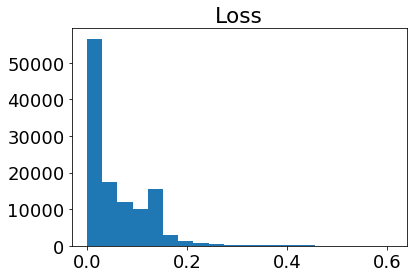

In [7]:
r = 0
f = 0
list_output_data = []
runtime = []
final_loss = []
iteration = []
runs = sorted(glob.glob(rundir+'*'))
for run in runs:
    if os.path.exists(run+'/output_data.pkl') and os.path.exists(run+'/run.log') :
        f += 1
        with open(run+'/run.log') as file:
            lines = file.readlines()
            c = 0
            for l, line in enumerate(reversed(lines)):
                if line.strip() == '':
                    continue
                elif 'loss:' in line:
                    final_loss_ = float(line.split()[-1].replace('s',''))
                    c+=1
                elif 'Iterations:' in line:
                    iteration_ = int(line.split()[-1].replace('s',''))   
                    c+=1
                elif 'Runtime:' in line:
                    runtime_ = int(line.split()[-1].replace('s',''))
                    c+=1
                elif l>10:    
                    break
            if c<3:
                print(run+'/run.log ERROR!')
                continue
            else:
                runtime.append(runtime_)
                final_loss.append(final_loss_)
                iteration.append(iteration_)
        list_output_data.append(joblib.load(run+'/output_data.pkl'))                     
        print('{:30s}'.format(run+':')+
              '{:15s}'.format('runtime='+str(runtime[-1]))+
              '{:15s}'.format('iterations='+str(iteration[-1]))+
              '{:10s}'.format('loss='+str(final_loss[-1])))            
    else:
        r += 1
        print(run+'/output_data.pkl or run.log not found!')
list_output_data = np.array(list_output_data)    
print('\nFinished: ', f)
print('Not finished: ', r)

# Plot forward and backward march   
mpl.rcParams.update({'font.size': 18})
mpl.rc('xtick', labelsize=18) 
mpl.rc('ytick', labelsize=18) 
mpl.rc('axes', labelsize=18)
fig, ax = plt.subplots(1,1, figsize=[6,4])
ax.hist(final_loss, bins=20)
ax.set_title('Loss')

In [8]:
updated_output_data = list_output_data[np.array(final_loss) < 0.02]
print(list_output_data.shape, '->', updated_output_data.shape)

(117975, 2) -> (47604, 2)


In [9]:
def obsdata_mismatch(X_predict, X_obs, obs_points, std_obs=0.05, mim_std_error=10.0):
    X_generated = scaler.inverse_transform(X_predict)
    R0_generated = X_generated[:,pca_size:]
    X_generated = pca_compress.inverse_transform(X_generated[:,:pca_size])
    X_generated = X_generated.reshape(len(X_predict), len(groups), nl, nc)
    
    # Get simulated and observed data
    sim_data = tf.gather_nd(X_generated, obs_points).numpy()
    obs_data = tf.gather_nd(X_obs, obs_points).numpy()  
    
    # Mesurement error standard deviation
    std_error = std_obs*obs_data+1e-15
    std_error[std_error<mim_std_error] = mim_std_error
    
    #Calculate the objetive function
    return (1/2)*np.sum( ((sim_data-obs_data)/std_error)**2 )                                  

In [10]:
obsdata_mismatch(list_output_data[0][0], X_obs, obs_points)

4.88455375445909

# MCMC from prior

The proposal distributions have the form
  \begin{equation}
    \nonumber q(\textbf{m}^\ell, \widehat{\textbf{m}}^{\ell+1}) = \textrm{const} \times \exp \left(-O_m(\widehat{\textbf{m}}^{\ell+1}) \right)
  \end{equation}
  \begin{equation}
    \nonumber q(\widehat{\textbf{m}}^{\ell+1}, \textbf{m}^\ell) = \textrm{const} \times \exp \left(-O_m(\textbf{m}^{\ell}) \right)
  \end{equation}
where 
  \begin{equation}
    \nonumber O_m(\textbf{m}) = \frac{1}{2}\left(\textbf{m} - \textbf{m}_{pr}\right)\textbf{C}_{m}^{-1}\left(\textbf{m} - \textbf{m}_{pr}\right)
  \end{equation}
$\textbf{m}$ represents the model parameters (here the two R0s).



The target (posterior) PDF is
  \begin{equation}
    \nonumber \pi(\textbf{m}) = \textrm{const} \times \exp \left(-O_m(\textbf{m}) - O_d(\textbf{m}) \right)
  \end{equation}

where $O_m(\textbf{m})$ is the prior mismatch and $O_d(\textbf{m})$ the observed data mismatch. 



The probability of accepting a proposal in the chain becomes

  \begin{eqnarray}
    \nonumber A\left(\textbf{m}^{\ell}, \widehat{\textbf{m}}^{\ell+1}\right) & = & \min \left\{1, \frac{q(\widehat{\textbf{m}}^{\ell+1},\textbf{m}^{\ell}) \pi(\widehat{\textbf{m}}^{\ell+1})}{q(\textbf{m}^{\ell}, \widehat{\textbf{m}}^{\ell+1}) \pi(\textbf{m}^{\ell})}\right\}\\
    \nonumber & = & \min \left\{ 1, \frac{\exp\left(-O_m(\textbf{m}^\ell)\right) \exp\left(-O_m(\widehat{\textbf{m}}^{\ell+1}) -O_d(\widehat{\textbf{m}}^{\ell+1}) \right)}{\exp\left(-O_m(\widehat{\textbf{m}}^{\ell+1})\right) \exp\left(-O_m(\textbf{m}^{\ell}) -O_d(\textbf{m}^{\ell}) \right)} \right\} \\
    \nonumber & = & \min \left\{1, \exp \left( O_d(\textbf{m}^{\ell}) - O_d(\widehat{\textbf{m}}^{\ell+1}) \right) \right\}
  \end{eqnarray}


In [12]:
mcmc_obj = []
mcmc_output_data = []
count = 0 

# 1. Generate the initial posterior sample
mcmc_output_data.append(list_output_data[0])
mcmc_obj.append(obsdata_mismatch(list_output_data[0][0], X_obs, obs_points))

for i, output_data in enumerate(list_output_data[1:]):
    
    # 2. Propose a new sample and calculate the data mismatch
    mcmc_obj_proposed = obsdata_mismatch(output_data[0], X_obs, obs_points)
    
    # 3. calculate the acceptance probability
    A = min(1,np.exp(-mcmc_obj_proposed + mcmc_obj[-1]))
    
    # 4. Generate a uniform random number    
    u = np.random.rand()
    
    # 5. Accept/reject the sample
    if u < A:
        count += 1 
        mcmc_obj.append(mcmc_obj_proposed)
        mcmc_output_data.append(output_data)
    else:
        mcmc_obj.append(mcmc_obj[-1])
        mcmc_output_data.append(mcmc_output_data[-1])
    
    # Print acceptance rate
    if i%100 == 0: 
        print(f'{i+1}: Taxa de aceitacao: {count/(i+1)}')

mcmc_obj = np.array(mcmc_obj)
mcmc_output_data = np.array(mcmc_output_data)    
print(f'\n\nTaxa de aceitacao: {count/(i+1)}')

1: Taxa de aceitacao: 0.0
101: Taxa de aceitacao: 0.039603960396039604
201: Taxa de aceitacao: 0.01990049751243781
301: Taxa de aceitacao: 0.019933554817275746
401: Taxa de aceitacao: 0.022443890274314215
501: Taxa de aceitacao: 0.01996007984031936
601: Taxa de aceitacao: 0.021630615640599003
701: Taxa de aceitacao: 0.018544935805991442
801: Taxa de aceitacao: 0.016229712858926344
901: Taxa de aceitacao: 0.014428412874583796
1001: Taxa de aceitacao: 0.013986013986013986
1101: Taxa de aceitacao: 0.013623978201634877
1201: Taxa de aceitacao: 0.013322231473771857
1301: Taxa de aceitacao: 0.014604150653343582
1401: Taxa de aceitacao: 0.014275517487508922
1501: Taxa de aceitacao: 0.013990672884743505
1601: Taxa de aceitacao: 0.01311680199875078
1701: Taxa de aceitacao: 0.012933568489124045
1801: Taxa de aceitacao: 0.013325930038867296
1901: Taxa de aceitacao: 0.013150973172014729
2001: Taxa de aceitacao: 0.012993503248375811
2101: Taxa de aceitacao: 0.01285102332222751
2201: Taxa de aceitac

17801: Taxa de aceitacao: 0.014493567777091175
17901: Taxa de aceitacao: 0.014636053851740126
18001: Taxa de aceitacao: 0.014610299427809566
18101: Taxa de aceitacao: 0.014695320700513784
18201: Taxa de aceitacao: 0.014669523652546564
18301: Taxa de aceitacao: 0.014698650346975576
18401: Taxa de aceitacao: 0.014727460464105212
18501: Taxa de aceitacao: 0.014647856872601481
18601: Taxa de aceitacao: 0.014569109187678082
18701: Taxa de aceitacao: 0.01449120367894765
18801: Taxa de aceitacao: 0.014573692888676134
18901: Taxa de aceitacao: 0.014708216496481668
19001: Taxa de aceitacao: 0.014893952949844745
19101: Taxa de aceitacao: 0.014920684780901524
19201: Taxa de aceitacao: 0.014895057549085985
19301: Taxa de aceitacao: 0.014869695870680275
19401: Taxa de aceitacao: 0.014844595639400032
19501: Taxa de aceitacao: 0.014819752833188041
19601: Taxa de aceitacao: 0.01484618131727973
19701: Taxa de aceitacao: 0.01482158266077864
19801: Taxa de aceitacao: 0.014898237462754406
19901: Taxa de a

35401: Taxa de aceitacao: 0.015705771023417418
35501: Taxa de aceitacao: 0.015717867102335144
35601: Taxa de aceitacao: 0.015673717030420493
35701: Taxa de aceitacao: 0.015657824710792415
35801: Taxa de aceitacao: 0.015642021172592946
35901: Taxa de aceitacao: 0.015654160051252055
36001: Taxa de aceitacao: 0.015610677481181078
36101: Taxa de aceitacao: 0.015622835932522644
36201: Taxa de aceitacao: 0.01563492721195547
36301: Taxa de aceitacao: 0.015646951874604006
36401: Taxa de aceitacao: 0.015686382242246093
36501: Taxa de aceitacao: 0.01569820004931372
36601: Taxa de aceitacao: 0.01565530996420863
36701: Taxa de aceitacao: 0.015721642462058254
36801: Taxa de aceitacao: 0.015733268117714194
36901: Taxa de aceitacao: 0.01571773122679602
37001: Taxa de aceitacao: 0.01567525202021567
37101: Taxa de aceitacao: 0.015633001805881244
37201: Taxa de aceitacao: 0.015617859734953362
37301: Taxa de aceitacao: 0.015629607785314067
37401: Taxa de aceitacao: 0.015614555760541162
37501: Taxa de ace

53101: Taxa de aceitacao: 0.015197453908589292
53201: Taxa de aceitacao: 0.015168887802860848
53301: Taxa de aceitacao: 0.015159190259094577
53401: Taxa de aceitacao: 0.015186981517200052
53501: Taxa de aceitacao: 0.015195977645277659
53601: Taxa de aceitacao: 0.015186283837988097
53701: Taxa de aceitacao: 0.015158004506433773
53801: Taxa de aceitacao: 0.015148417315663278
53901: Taxa de aceitacao: 0.015175970761210368
54001: Taxa de aceitacao: 0.015166385807670229
54101: Taxa de aceitacao: 0.015138352340991848
54201: Taxa de aceitacao: 0.015110422316931422
54301: Taxa de aceitacao: 0.015119426898215502
54401: Taxa de aceitacao: 0.015110016359993383
54501: Taxa de aceitacao: 0.01510064035522284
54601: Taxa de aceitacao: 0.015072984011281845
54701: Taxa de aceitacao: 0.015063709987020347
54801: Taxa de aceitacao: 0.015072717651137752
54901: Taxa de aceitacao: 0.015045263292107612
55001: Taxa de aceitacao: 0.015036090252904493
55101: Taxa de aceitacao: 0.015008802018112194
55201: Taxa de

70601: Taxa de aceitacao: 0.015084772170365858
70701: Taxa de aceitacao: 0.01512001244678293
70801: Taxa de aceitacao: 0.015126904987217695
70901: Taxa de aceitacao: 0.015119673911510416
71001: Taxa de aceitacao: 0.015098378896071886
71101: Taxa de aceitacao: 0.015105272780973544
71201: Taxa de aceitacao: 0.015112147301301948
71301: Taxa de aceitacao: 0.015090952441059733
71401: Taxa de aceitacao: 0.015083822355429195
71501: Taxa de aceitacao: 0.015076712213815192
71601: Taxa de aceitacao: 0.015069621932654572
71701: Taxa de aceitacao: 0.015062551428850365
71801: Taxa de aceitacao: 0.015055500619768528
71901: Taxa de aceitacao: 0.015062377435640673
72001: Taxa de aceitacao: 0.015055346453521478
72101: Taxa de aceitacao: 0.015034465541393323
72201: Taxa de aceitacao: 0.015041342917688121
72301: Taxa de aceitacao: 0.015034370202348515
72401: Taxa de aceitacao: 0.015027416748387453
72501: Taxa de aceitacao: 0.015020482476103778
72601: Taxa de aceitacao: 0.015013567306235452
72701: Taxa de

88201: Taxa de aceitacao: 0.01511320733325019
88301: Taxa de aceitacao: 0.015118741577105582
88401: Taxa de aceitacao: 0.015124263300188913
88501: Taxa de aceitacao: 0.015118473237590536
88601: Taxa de aceitacao: 0.015101409690635547
88701: Taxa de aceitacao: 0.015129479938219411
88801: Taxa de aceitacao: 0.01513496469634351
88901: Taxa de aceitacao: 0.015117940180650387
89001: Taxa de aceitacao: 0.015112189750676958
89101: Taxa de aceitacao: 0.015117675446964681
89201: Taxa de aceitacao: 0.015134359480274884
89301: Taxa de aceitacao: 0.015128609981971087
89401: Taxa de aceitacao: 0.015122873345935728
89501: Taxa de aceitacao: 0.015105976469536653
89601: Taxa de aceitacao: 0.015089117308958606
89701: Taxa de aceitacao: 0.01507229573806312
89801: Taxa de aceitacao: 0.015077783098183762
89901: Taxa de aceitacao: 0.015061011557157318
90001: Taxa de aceitacao: 0.015077610248775014
90101: Taxa de aceitacao: 0.01508307343980644
90201: Taxa de aceitacao: 0.015088524517466548
90301: Taxa de ac

105601: Taxa de aceitacao: 0.014924101097527485
105701: Taxa de aceitacao: 0.01492890322702718
105801: Taxa de aceitacao: 0.01493369627886315
105901: Taxa de aceitacao: 0.014919594715819492
106001: Taxa de aceitacao: 0.014914953632512901
106101: Taxa de aceitacao: 0.014910321297631502
106201: Taxa de aceitacao: 0.014905697686462462
106301: Taxa de aceitacao: 0.01491989727283845
106401: Taxa de aceitacao: 0.014924671760603754
106501: Taxa de aceitacao: 0.014948216448671843
106601: Taxa de aceitacao: 0.014952955413176237
106701: Taxa de aceitacao: 0.014967057478374148
106801: Taxa de aceitacao: 0.014981133135457533
106901: Taxa de aceitacao: 0.014976473559648647
107001: Taxa de aceitacao: 0.014999859814394258
107101: Taxa de aceitacao: 0.015004528435775577
107201: Taxa de aceitacao: 0.015065157974272629
107301: Taxa de aceitacao: 0.015088396193884494
107401: Taxa de aceitacao: 0.015092969339205408
107501: Taxa de aceitacao: 0.015078929498330248
107601: Taxa de aceitacao: 0.01506491575357

Text(0.5, 1.0, 'Obj')

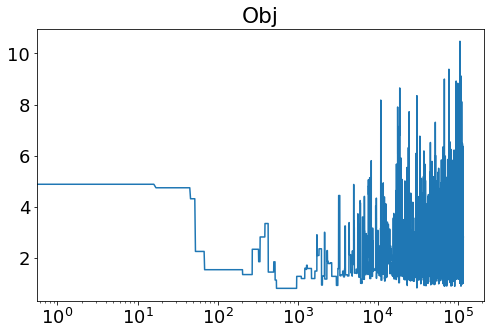

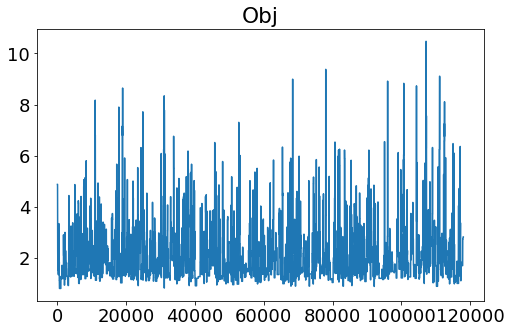

In [13]:
# Plot forward and backward march   
mpl.rcParams.update({'font.size': 18})
mpl.rc('xtick', labelsize=18) 
mpl.rc('ytick', labelsize=18) 
mpl.rc('axes', labelsize=18)
fig, ax = plt.subplots(1,1, figsize=[8,5])
ax.plot(mcmc_obj)
ax.set_xscale('log')
#ax.set_yscale('log')
ax.set_title('Obj')
fig, ax = plt.subplots(1,1, figsize=[8,5])
ax.plot(mcmc_obj)
#ax.set_xscale('log')
#ax.set_yscale('log')
ax.set_title('Obj')

# Plot data

In [14]:
def plot_data(X_predict, nx, ny, obs_times=[], X_obs=[], grid_points=[], R0s_obs=[], R0_ax='', X_ax='', label='', color='b'):
    X_generated = scaler.inverse_transform(X_predict)
    R0_generated = X_generated[:,pca_size:]
    X_generated = pca_compress.inverse_transform(X_generated[:,:pca_size])
    X_generated = X_generated.reshape(len(X_predict), len(groups), nl, nc)
    X_generated[X_generated<0] = 0 
    
    # Plot R
    xp = len(R0_generated)
    if R0_ax:
        R0_ax.plot(np.linspace(0,(xp-1)*8000/86400,xp), R0_generated[:,0], 'b', label='Home '+label)
        R0_ax.plot(np.linspace(0,(xp-1)*8000/86400,xp), R0_generated[:,1], 'r', label='Mobile '+label)
        if len(R0s_obs):
            R0_ax.plot(np.linspace(0,(xp-1)*8000/86400,xp), [R0s_obs[0]]*len(R0_generated), 'bo', markevery=2, fillstyle='none', markersize = 10, label='Home truth')
            R0_ax.plot(np.linspace(0,(xp-1)*8000/86400,xp), [R0s_obs[1]]*len(R0_generated), 'ro', markevery=2, fillstyle='none', markersize = 10, label='Mobile truth')    
        if len(label):
        #    R0_ax.legend()
            R0_ax.set_xlabel('Time (days)')
            R0_ax.set_ylabel('Reproduction number')
        #plt.tight_layout()
        #plt.grid()
        #plt.show()

    
    # Plot groups 
    if len(X_ax): 
        for i, group in enumerate(groups):
            X_ax.flatten()[i].plot(np.linspace(0,(xp-1)*8000/86400,xp), X_generated[:,i, nx, ny], color=color, label=label)
            if len(X_obs):
                if [i, nx, ny] in grid_points:
                    X_ax.flatten()[i].plot(np.array(obs_times)*8000/86400, X_obs[:, i, nx, ny], 'ro', markevery=1, fillstyle='full', markersize = 12, label='Observed data')
                else:
                    X_ax.flatten()[i].plot([],[])
            X_ax.flatten()[i].set_title(group)
            if len(label):
            #    X_ax.flatten()[i].legend()
                X_ax.flatten()[i].set_xlabel('Time (days)')
                X_ax.flatten()[i].set_ylabel('Number of People')
            #X_ax.flatten()[i].set_xlim(8,12)    
        #plt.tight_layout()
        #plt.grid()
        #plt.show()

In [68]:
time = 130
R0_hist_prior = []
for output_data in list_output_data[1000:,0]: 
    X_generated = scaler.inverse_transform(output_data)
    R0_generated = X_generated[:,pca_size:]
    X_generated = pca_compress.inverse_transform(X_generated[:,:pca_size])
    X_generated = X_generated.reshape(-1, len(groups), nl, nc)
    X_generated[X_generated<0] = 0 

    R0_hist_prior.append(R0_generated[time,:])
R0_hist_prior = np.array(R0_hist_prior)

R0_hist_post = []
for output_data in mcmc_output_data[1000:,0]: 
    X_generated = scaler.inverse_transform(output_data)
    R0_generated = X_generated[:,pca_size:]
    X_generated = pca_compress.inverse_transform(X_generated[:,:pca_size])
    X_generated = X_generated.reshape(-1, len(groups), nl, nc)
    X_generated[X_generated<0] = 0 

    R0_hist_post.append(R0_generated[time,:])
R0_hist_post = np.array(R0_hist_post)

<function matplotlib.pyplot.show(*args, **kw)>

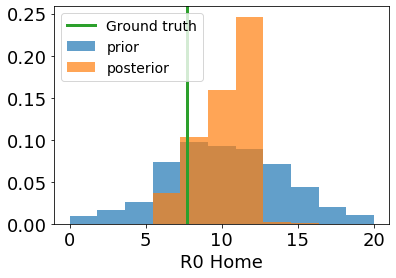

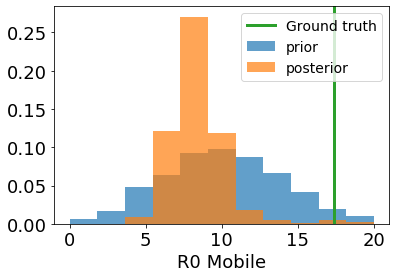

In [71]:
mpl.rcParams.update({'font.size': 14})
mpl.rc('xtick', labelsize=18) 
mpl.rc('ytick', labelsize=18) 
mpl.rc('axes', labelsize=18)

#fig, R0_ax0 = plt.subplots(1,2, figsize=[12,4])
fig, R0_ax0 = plt.subplots(1,1, figsize=[6,4])
fig, R0_ax1 = plt.subplots(1,1, figsize=[6,4])
R0_ax = [R0_ax0, R0_ax1]

# Plot R0 histograms
#xrange = (min(R0_hist.min(),R0s_obs[0],R0s_obs[1]),max(R0_hist.max(),R0s_obs[0],R0s_obs[1])) 
R0_ax[0].hist(R0_hist_prior[:,0], density=True, label='prior', alpha=0.7, range=(0,20), bins=11)#, range=xrange)
R0_ax[0].hist(R0_hist_post[:,0], density=True, label='posterior', alpha=0.7, range=(0,20), bins=11)#, range=xrange)
R0_ax[0].set_xlabel('R0 Home')
R0_ax[1].hist(R0_hist_prior[:,1], density=True, label='prior', alpha=0.7, range=(0,20), bins=11)#, range=xrange)
R0_ax[1].hist(R0_hist_post[:,1], density=True, label='posterior', alpha=0.7, range=(0,20), bins=11)#, range=xrange)
R0_ax[1].set_xlabel('R0 Mobile')

yrange = R0_ax[0].get_ybound()
R0_ax[0].plot([R0s_obs[0]]*2,yrange, linewidth=3, label='Ground truth')
R0_ax[0].set_ylim(yrange)
yrange = R0_ax[1].get_ybound()
R0_ax[1].plot([R0s_obs[1]]*2,yrange, linewidth=3, label='Ground truth')
R0_ax[1].set_ylim(yrange)     

R0_ax[0].legend(loc='upper left')
#plt.tight_layout()
plt.show
R0_ax[1].legend()
#plt.tight_layout()
plt.show

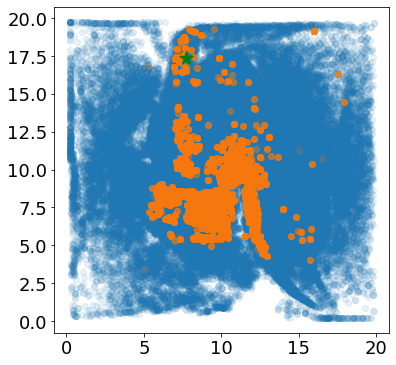

In [19]:
fig, R0_ax = plt.subplots(1,1, figsize=[6,6])

R0_ax.scatter(R0_hist_prior[:,0],R0_hist_prior[:,1], alpha=0.1)
R0_ax.scatter(R0_hist_post[:,0],R0_hist_post[:,1], alpha=0.1)
R0_ax.scatter(R0s_obs[0],R0s_obs[1], s=200, marker='*', c='green')

In [24]:
compartments = ['Susceptible','Exposed','Infecitous','Recovered']

In [93]:
time = 130
R0e_hist_prior = []
R0e_hist_post = []

for output_data in list_output_data[100:,0]: 
    X_generated = scaler.inverse_transform(output_data)
    R0_generated = X_generated[:,pca_size:]
    X_generated = pca_compress.inverse_transform(X_generated[:,:pca_size])
    X_generated = X_generated.reshape(-1, len(groups), nl, nc)
    X_generated[X_generated<0] = 0 
    
    aux_prior = 0
    for time in range(time,time+1):#range(n_ts)
        s = X_generated[time,0,:,:].sum()/(X_generated[time,0,:,:].sum()+X_generated[time,4,:,:].sum())
        aux_prior += R0_generated[time,0]*s+R0_generated[time,1]*(1-s)
        #R0e_hist_prior.append(R0_generated[time,0]*s+R0_generated[time,1]*(1-s))  
    R0e_hist_prior.append(aux_prior)#/n_ts)
        
for output_data in mcmc_output_data[1000:,0]: 
    X_generated = scaler.inverse_transform(output_data)
    R0_generated = X_generated[:,pca_size:]
    X_generated = pca_compress.inverse_transform(X_generated[:,:pca_size])
    X_generated = X_generated.reshape(-1, len(groups), nl, nc)
    X_generated[X_generated<0] = 0 
    
    aux_post = 0
    for time in range(time,time+1):#range(n_ts)
        s = X_generated[time,0,:,:].sum()/(X_generated[time,0,:,:].sum()+X_generated[time,4,:,:].sum())
        aux_post += R0_generated[time,0]*s+R0_generated[time,1]*(1-s)
        #R0e_hist_post.append(R0_generated[time,0]*s+R0_generated[time,1]*(1-s))  
    R0e_hist_post.append(aux_post)#/n_ts)
    
R0e_hist_prior = np.array(R0e_hist_prior)
R0e_hist_post = np.array(R0e_hist_post)

Prior mean  10.05412905266821 std:  3.123882172907197
Post mode  11.0
Post mean  9.88798219558975 std:  1.3877193106118764
Effective observed R0 9.518357964230677


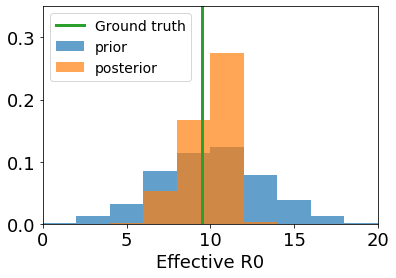

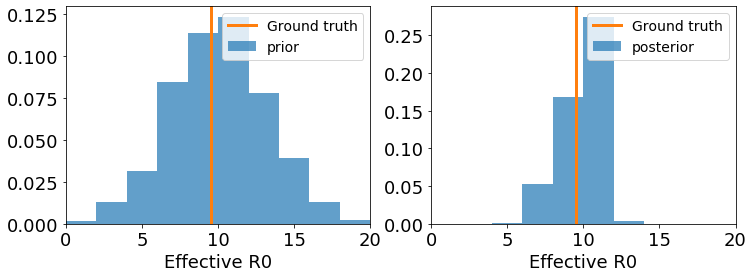

In [94]:
# Plot forward and backward march   
mpl.rcParams.update({'font.size': 14})
mpl.rc('xtick', labelsize=18) 
mpl.rc('ytick', labelsize=18) 
mpl.rc('axes', labelsize=18)

fig, R0_ax = plt.subplots(1,1, figsize=[6,4])

# Plot R0 histograms
R0_ax.hist(R0e_hist_prior, density=True, label='prior', alpha=0.7, range=(0,20))
print('Prior mean ',R0e_hist_prior.mean(),'std: ', R0e_hist_prior.std())
n, bins, patches = R0_ax.hist(R0e_hist_post, density=True, label='posterior', alpha=0.7, range=(0,20))
print('Post mode ', (bins[n.argmax()]+bins[n.argmax()+1])/2) # n, bins, patches = 
R0_ax.set_xlabel('Effective R0')
print('Post mean ',R0e_hist_post.mean(),'std: ', R0e_hist_post.std())

yrange = (R0_ax.get_ybound())
aux_obs = 0
for time in range(time,time+1):#range(n_ts)
    s_obs = X_obs[time,0,:,:].sum()/(X_obs[time,0,:,:].sum()+X_obs[time,4,:,:].sum())
    aux_obs += R0s_obs[0]*s_obs+R0s_obs[1]*(1-s_obs)
R0e_obs = aux_obs#/n_ts
print('Effective observed R0', R0e_obs)

yrange = (0.0,0.35)
R0_ax.plot([R0e_obs]*2,yrange, linewidth=3, label='Ground truth')
R0_ax.set_ylim(yrange)    

R0_ax.set_xlim(0,20) 
R0_ax.legend()
#plt.tight_layout()
plt.show()

fig, R0_ax = plt.subplots(1,2, figsize=[12,4])

# Plot R0 histograms
R0_ax[0].hist(R0e_hist_prior, density=True, label='prior', alpha=0.7, range=(0,20))
R0_ax[0].set_xlabel('Effective R0')
yrange = (R0_ax[0].get_ybound())
s_obs = X_obs[time,0,:,:].sum()/(X_obs[time,0,:,:].sum()+X_obs[time,4,:,:].sum())
R0_ax[0].plot([R0s_obs[0]*s_obs+R0s_obs[1]*(1-s_obs)]*2,yrange, linewidth=3, label='Ground truth')
R0_ax[0].set_ylim(yrange)  
R0_ax[0].set_xlim(0,20) 
R0_ax[0].legend()

R0_ax[1].hist(R0e_hist_post, density=True, label='posterior', alpha=0.7, range=(0,20))
R0_ax[1].set_xlabel('Effective R0')
yrange = (R0_ax[1].get_ybound())
s_obs = X_obs[time,0,:,:].sum()/(X_obs[time,0,:,:].sum()+X_obs[time,4,:,:].sum())
R0_ax[1].plot([R0s_obs[0]*s_obs+R0s_obs[1]*(1-s_obs)]*2,yrange, linewidth=3, label='Ground truth')
R0_ax[1].set_ylim(yrange)  
R0_ax[1].set_xlim(0,20) 
R0_ax[1].legend()
  

#plt.tight_layout()
plt.show()


In [99]:
time = 173
R0e_hist_prior = []
R0e_hist_post = []

for output_data in list_output_data[1000:,0]: 
    X_generated = scaler.inverse_transform(output_data)
    R0_generated = X_generated[:,pca_size:]
    X_generated = pca_compress.inverse_transform(X_generated[:,:pca_size])
    X_generated = X_generated.reshape(-1, len(groups), nl, nc)
    X_generated[X_generated<0] = 0 
    
    aux_prior = 0
    for time in range(time,time+1):#range(n_ts)
        s = X_generated[time,0,:,:].sum()/(X_generated[time,0,:,:].sum()+X_generated[time,4,:,:].sum())
        aux_prior += R0_generated[time,0]*s+R0_generated[time,1]*(1-s)
        #R0e_hist_prior.append(R0_generated[time,0]*s+R0_generated[time,1]*(1-s))  
    R0e_hist_prior.append(aux_prior)#/n_ts)
        
for output_data in mcmc_output_data[1000:,0]: 
    X_generated = scaler.inverse_transform(output_data)
    R0_generated = X_generated[:,pca_size:]
    X_generated = pca_compress.inverse_transform(X_generated[:,:pca_size])
    X_generated = X_generated.reshape(-1, len(groups), nl, nc)
    X_generated[X_generated<0] = 0 
    
    aux_post = 0
    for time in range(time,time+1):#range(n_ts)
        s = X_generated[time,0,:,:].sum()/(X_generated[time,0,:,:].sum()+X_generated[time,4,:,:].sum())
        aux_post += R0_generated[time,0]*s+R0_generated[time,1]*(1-s)
        #R0e_hist_post.append(R0_generated[time,0]*s+R0_generated[time,1]*(1-s))  
    R0e_hist_post.append(aux_post)#/n_ts)
    
R0e_hist_prior = np.array(R0e_hist_prior)
R0e_hist_post = np.array(R0e_hist_post)

Prior mean  10.077697556845067 std:  3.450800434585545
Post mode  11.0
Post mean  9.682135245404446 std:  1.4015967201785429
Post median  10.015071673589707
Effective observed R0 9.224410413280742


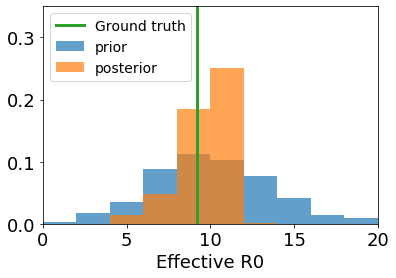

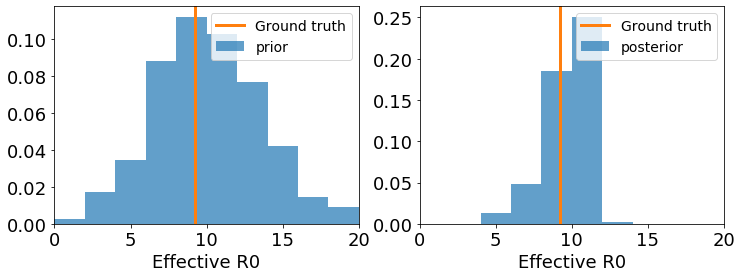

In [100]:
# Plot forward and backward march   
mpl.rcParams.update({'font.size': 14})
mpl.rc('xtick', labelsize=18) 
mpl.rc('ytick', labelsize=18) 
mpl.rc('axes', labelsize=18)

fig, R0_ax = plt.subplots(1,1, figsize=[6,4])

# Plot R0 histograms
R0_ax.hist(R0e_hist_prior, density=True, label='prior', alpha=0.7, range=(0,20))
print('Prior mean ',R0e_hist_prior.mean(),'std: ', R0e_hist_prior.std())
n, bins, patches = R0_ax.hist(R0e_hist_post, density=True, label='posterior', alpha=0.7, range=(0,20))
print('Post mode ', (bins[n.argmax()]+bins[n.argmax()+1])/2) # n, bins, patches = 
R0_ax.set_xlabel('Effective R0')
print('Post mean ',R0e_hist_post.mean(),'std: ', R0e_hist_post.std())
print('Post median ',np.median(R0e_hist_post))

yrange = (R0_ax.get_ybound())
aux_obs = 0
for time in range(time,time+1):#range(n_ts)
    s_obs = X_obs[time,0,:,:].sum()/(X_obs[time,0,:,:].sum()+X_obs[time,4,:,:].sum())
    aux_obs += R0s_obs[0]*s_obs+R0s_obs[1]*(1-s_obs)
R0e_obs = aux_obs#/n_ts
print('Effective observed R0', R0e_obs)

yrange = (0.0,0.35)
R0_ax.plot([R0e_obs]*2,yrange, linewidth=3, label='Ground truth')
R0_ax.set_ylim(yrange)    

R0_ax.set_xlim(0,20) 
R0_ax.legend()
#plt.tight_layout()
plt.show()

fig, R0_ax = plt.subplots(1,2, figsize=[12,4])

# Plot R0 histograms
R0_ax[0].hist(R0e_hist_prior, density=True, label='prior', alpha=0.7, range=(0,20))
R0_ax[0].set_xlabel('Effective R0')
yrange = (R0_ax[0].get_ybound())
s_obs = X_obs[time,0,:,:].sum()/(X_obs[time,0,:,:].sum()+X_obs[time,4,:,:].sum())
R0_ax[0].plot([R0s_obs[0]*s_obs+R0s_obs[1]*(1-s_obs)]*2,yrange, linewidth=3, label='Ground truth')
R0_ax[0].set_ylim(yrange)  
R0_ax[0].set_xlim(0,20) 
R0_ax[0].legend()

R0_ax[1].hist(R0e_hist_post, density=True, label='posterior', alpha=0.7, range=(0,20))
R0_ax[1].set_xlabel('Effective R0')
yrange = (R0_ax[1].get_ybound())
s_obs = X_obs[time,0,:,:].sum()/(X_obs[time,0,:,:].sum()+X_obs[time,4,:,:].sum())
R0_ax[1].plot([R0s_obs[0]*s_obs+R0s_obs[1]*(1-s_obs)]*2,yrange, linewidth=3, label='Ground truth')
R0_ax[1].set_ylim(yrange)  
R0_ax[1].set_xlim(0,20) 
R0_ax[1].legend()
  

#plt.tight_layout()
plt.show()


In [102]:
time = 238
R0e_hist_prior = []
R0e_hist_post = []

for output_data in list_output_data[1000:,0]: 
    X_generated = scaler.inverse_transform(output_data)
    R0_generated = X_generated[:,pca_size:]
    X_generated = pca_compress.inverse_transform(X_generated[:,:pca_size])
    X_generated = X_generated.reshape(-1, len(groups), nl, nc)
    X_generated[X_generated<0] = 0 
    
    aux_prior = 0
    for time in range(time,time+1):#range(n_ts)
        s = X_generated[time,0,:,:].sum()/(X_generated[time,0,:,:].sum()+X_generated[time,4,:,:].sum())
        aux_prior += R0_generated[time,0]*s+R0_generated[time,1]*(1-s)
        #R0e_hist_prior.append(R0_generated[time,0]*s+R0_generated[time,1]*(1-s))  
    R0e_hist_prior.append(aux_prior)#/n_ts)
        
for output_data in mcmc_output_data[1000:,0]: 
    X_generated = scaler.inverse_transform(output_data)
    R0_generated = X_generated[:,pca_size:]
    X_generated = pca_compress.inverse_transform(X_generated[:,:pca_size])
    X_generated = X_generated.reshape(-1, len(groups), nl, nc)
    X_generated[X_generated<0] = 0 
    
    aux_post = 0
    for time in range(time,time+1):#range(n_ts)
        s = X_generated[time,0,:,:].sum()/(X_generated[time,0,:,:].sum()+X_generated[time,4,:,:].sum())
        aux_post += R0_generated[time,0]*s+R0_generated[time,1]*(1-s)
        #R0e_hist_post.append(R0_generated[time,0]*s+R0_generated[time,1]*(1-s))  
    R0e_hist_post.append(aux_post)#/n_ts)
    
R0e_hist_prior = np.array(R0e_hist_prior)
R0e_hist_post = np.array(R0e_hist_post)

Prior mean  9.847449265121643 std:  3.6117374162067915
Post mode  11.0
Post mean  9.922624510692005 std:  1.5104929642809914
Effective observed R0 9.480121343691406


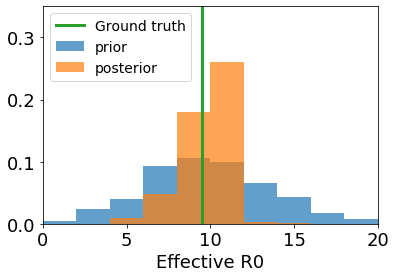

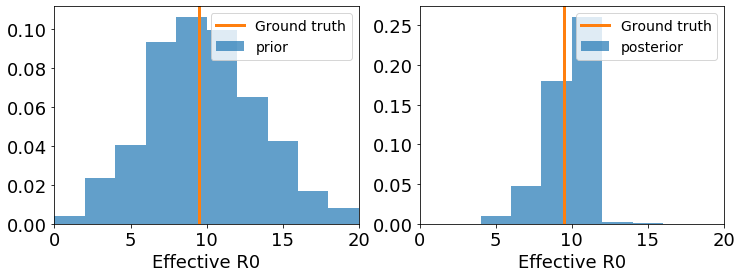

In [103]:
# Plot forward and backward march   
mpl.rcParams.update({'font.size': 14})
mpl.rc('xtick', labelsize=18) 
mpl.rc('ytick', labelsize=18) 
mpl.rc('axes', labelsize=18)

fig, R0_ax = plt.subplots(1,1, figsize=[6,4])

# Plot R0 histograms
R0_ax.hist(R0e_hist_prior, density=True, label='prior', alpha=0.7, range=(0,20))
print('Prior mean ',R0e_hist_prior.mean(),'std: ', R0e_hist_prior.std())
n, bins, patches = R0_ax.hist(R0e_hist_post, density=True, label='posterior', alpha=0.7, range=(0,20))
print('Post mode ', (bins[n.argmax()]+bins[n.argmax()+1])/2) # n, bins, patches = 
R0_ax.set_xlabel('Effective R0')
print('Post mean ',R0e_hist_post.mean(),'std: ', R0e_hist_post.std())

yrange = (R0_ax.get_ybound())
aux_obs = 0
for time in range(time,time+1):#range(n_ts)
    s_obs = X_obs[time,0,:,:].sum()/(X_obs[time,0,:,:].sum()+X_obs[time,4,:,:].sum())
    aux_obs += R0s_obs[0]*s_obs+R0s_obs[1]*(1-s_obs)
R0e_obs = aux_obs#/n_ts
print('Effective observed R0', R0e_obs)

yrange = (0.0,0.35)
R0_ax.plot([R0e_obs]*2,yrange, linewidth=3, label='Ground truth')
R0_ax.set_ylim(yrange)    

R0_ax.set_xlim(0,20) 
R0_ax.legend()
#plt.tight_layout()
plt.show()

fig, R0_ax = plt.subplots(1,2, figsize=[12,4])

# Plot R0 histograms
R0_ax[0].hist(R0e_hist_prior, density=True, label='prior', alpha=0.7, range=(0,20))
R0_ax[0].set_xlabel('Effective R0')
yrange = (R0_ax[0].get_ybound())
s_obs = X_obs[time,0,:,:].sum()/(X_obs[time,0,:,:].sum()+X_obs[time,4,:,:].sum())
R0_ax[0].plot([R0s_obs[0]*s_obs+R0s_obs[1]*(1-s_obs)]*2,yrange, linewidth=3, label='Ground truth')
R0_ax[0].set_ylim(yrange)  
R0_ax[0].set_xlim(0,20) 
R0_ax[0].legend()

R0_ax[1].hist(R0e_hist_post, density=True, label='posterior', alpha=0.7, range=(0,20))
R0_ax[1].set_xlabel('Effective R0')
yrange = (R0_ax[1].get_ybound())
s_obs = X_obs[time,0,:,:].sum()/(X_obs[time,0,:,:].sum()+X_obs[time,4,:,:].sum())
R0_ax[1].plot([R0s_obs[0]*s_obs+R0s_obs[1]*(1-s_obs)]*2,yrange, linewidth=3, label='Ground truth')
R0_ax[1].set_ylim(yrange)  
R0_ax[1].set_xlim(0,20) 
R0_ax[1].legend()
  

#plt.tight_layout()
plt.show()
